# DRUG ANALYSIS: HCRT-TRPV1 (120min) in huc-h2b-gcamp8m (registration to mean brain)
- 260311 Analyze HCRT-TRPV1 (n=7) vs ctrl (n=7) for CSHL poster
  
- 260126 new F_slow/fast, NO permutation
 
      1. Test different F_slow window (the change we observed is at ~1200 sec)
  
      2. For F_slow: do rank spearman correlation with csn concentration => p_slow = Spearman(F_slow(t), C_capsaicin(t))
  
      3. For F_fast: (1) calculate d' to filter out increase/decreased cells (2) factor analysis + unsupervised cluster the filtered cells

# Imports

In [2]:
'''
import libraries
'''
import nibabel as nib
import pandas as pd
import ants
import os, gc, json
import import_ipynb
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import importlib
import library_registration
importlib.reload(library_registration)
import contextlib

import numpy as np
from scipy.ndimage import percentile_filter
from scipy import stats
from scipy.stats import rankdata
from scipy.stats import permutation_test
from scipy.stats import mannwhitneyu

from joblib import Parallel, delayed
from tqdm import tqdm
from pathlib import Path
from collections import defaultdict
import traceback
import gc
from typing import Union
import psutil
from concurrent.futures import ThreadPoolExecutor, as_completed
import csv

from contextlib import contextmanager
from tqdm.auto import tqdm
import joblib

@contextmanager
def tqdm_joblib(tqdm_object):
    """
    Context manager to patch joblib to report into tqdm progress bar.
    """
    class TqdmBatchCompletionCallback(joblib.parallel.BatchCompletionCallBack):
        def __call__(self, *args, **kwargs):
            tqdm_object.update(n=self.batch_size)
            return super().__call__(*args, **kwargs)

    old_callback = joblib.parallel.BatchCompletionCallBack
    joblib.parallel.BatchCompletionCallBack = TqdmBatchCompletionCallback
    try:
        yield tqdm_object
    finally:
        joblib.parallel.BatchCompletionCallBack = old_callback
        tqdm_object.close()
        

# Define all the parameters here

In [1]:
'''
[Fill in the parameters] Dataset and specs
'''

# === IMAGING SPECS ===
sec_per_volume = 1
volume_per_sec = 1
n_slices = 40
depth = 250
binning = 1
res_x = 1.52*binning
res_y = 1.52*binning
res_z = depth/n_slices
rotation_k = 2 #the rotation of raw video vs mapzebrain orientation. 2=180degree

# === DRUG PERFUSION PARAMETER ===
drug_uM   = 10.0
V_ml     = 15.0
Q_ml_min = 4.5

# define baseline (E3+DMSO) start & end time frame 
baseline_start = 0 * 60 * volume_per_sec
baseline_end = 45 * 60 * volume_per_sec

# define drug perfusion start & end time frame 
drug_start = 46  * 60 * volume_per_sec
drug_end = 90  * 60 * volume_per_sec

# define E3+DMSO wash out start & end time frame
wash_start = 91 * 60 * volume_per_sec
wash_end = 120 * 60 * volume_per_sec

# === ANALYSIS PARAMETERS ===
# --- define delta F / F 's baseline percentile ---
df_f_percentile = 20

# --- define F_tonic's window size and percentile ---
f_tonic_window_size = 600  #seconds
f_tonic_percentile = 20

# --- permutation test parameters ---
p_thresh_permutation = 0.005
n_resample_permutation = 500

# --- RUN BH-FDR FILTERING CODE ---
BH_Q = 0.05  # your desired FDR level

# --- GLM fitting parameters ---
# (Must match the parameters used for the 'Goldilocks' run)
input_tag    = "C"
K_global     = 600
drift_global = 1       # Order 1 (Linear)
lam_global   = 0.5
lag_global   = 0  

param_folder_name = f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}"

CLIP_ABS_DZ = 50.0 
INCLUDED_BASELINE = 15.0     # minutes of baseline to use (matches GLM fit_baseline_sec)
NULL_TAG = "iaaft"
RESPONDER_NULL_THRESH = 95  # threshold for null
L_MIN = 20.0   # plateau duration in minutes




# === COLOR CODE META ===
EXPT_TAG = "HCRT-TRPV1"
CTRL_TAG = "CTRL"
# =========================
# GLOBAL PLOT META
# =========================

PLOT_META = {
    EXPT_TAG: {
        "label": EXPT_TAG,
        "color": "indianred",
        "alpha": 0.7,
    },
    CTRL_TAG: {
        "label": CTRL_TAG,
        "color": "grey",
        "alpha": 0.7,
    }
}

def get_group_meta(expt_ID):
    """
    Decide group + plotting style from expt_ID string.
    """
    if "hcrt" in expt_ID.lower():
        return EXPT_TAG, PLOT_META[EXPT_TAG]
    else:
        return CTRL_TAG, PLOT_META[CTRL_TAG]


# === Folder structure: DIR_ANTS_OUTPUT > PROJECT FOLDERS > EXPT FOLDERS
dir_user_base = "/resnick/groups/Proberlab/yun/lightsheet"
dir_ants_output = dir_user_base + "/registration/registration_output/" #the base output folder

proj_ID = 'hcrt-trpv1_huc-h2b-g8m_csn_120min' #the project folder
combine_proj_ID = 'hcrt-trpv1_huc-h2b-g8m_csn_120min' # this is where you save the mean brain combining expt groups

expt_ID_1= '251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4'
expt_ID_2= '251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2'
expt_ID_3= '251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1'
expt_ID_4= '251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2'
expt_ID_5= '251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish3'
expt_ID_6= '260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish1'
expt_ID_7= '260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish2'

ctrl_ID_1= '251021_huc-h2b-g8m_csn_10uM_fish1'
ctrl_ID_2= '251118_huc-h2b-g8m_csn_10uM_fish1'
ctrl_ID_3= '251118_huc-h2b-g8m_csn_10uM_fish2'
ctrl_ID_4= '251118_huc-h2b-g8m_csn_10uM_fish3'
ctrl_ID_5= '251118_huc-h2b-g8m_csn_10uM_fish4'
ctrl_ID_6= '251118_huc-h2b-g8m_csn_10uM_fish5'
ctrl_ID_7= '251126_huc-h2b-g8m_csn_10uM_fish1'




expt_ID_list = [
ctrl_ID_1,
ctrl_ID_2,
ctrl_ID_3,
ctrl_ID_4,
ctrl_ID_5,
ctrl_ID_6,
ctrl_ID_7,
    
expt_ID_1,
expt_ID_2,
expt_ID_3,
expt_ID_4,
expt_ID_5,
expt_ID_6,
expt_ID_7
]

ctrl_expt_ID_list = [ctrl_ID_1,
ctrl_ID_2,
ctrl_ID_3,
ctrl_ID_4,
ctrl_ID_5,
ctrl_ID_6,
ctrl_ID_7
]

hcrt_expt_ID_list = [expt_ID_1,
expt_ID_2,
expt_ID_3,
expt_ID_4,
expt_ID_5,
expt_ID_6,
expt_ID_7
]

In [4]:
'''
Make OutPut Directory and transformation steps
'''

registered_final_nii_gz = "expt_to_mean_registered_final.nii.gz"

transform_image_list = [
    "expt_to_mean_warp.nii.gz",
    "expt_to_mean_affine.mat"
    ] #whichtoinvert = [False, False] default 

transform_points_list = [
    "expt_to_mean_affine.mat",
    "expt_to_mean_warp.nii.gz"
    ] #whichtoinvert = [True, False] default 


# ======== ⭕️ RUN The Analysis Stages ===========

# ⭕️ LOAD Voluseg Output files and save as .npy files

In [18]:
# load data and save as .npy files
'''
Load Voluseg Output and Save as numpy file in output folder
'''

for expt_ID in expt_ID_list:
    
    dir_ants_output_proj_expt = os.path.join(dir_ants_output, proj_ID, expt_ID)
    Path(dir_ants_output_proj_expt).mkdir(parents=True, exist_ok=True)
    
    data_array, volume_mean, cell_x, cell_y, cell_z = library_registration.read_data(proj_ID, expt_ID)
    
    np.save(os.path.join(dir_ants_output_proj_expt, "data_array.npy"), data_array)
    np.save(os.path.join(dir_ants_output_proj_expt, "cell_x.npy"), cell_x)
    np.save(os.path.join(dir_ants_output_proj_expt, "cell_y.npy"), cell_y)
    np.save(os.path.join(dir_ants_output_proj_expt, "cell_z.npy"), cell_z)

cell_x range:(-1, 259), cell_y range:(-1, 472), cell_z range:(-1, 38) 
Loaded raw hdf5 data as numpy array, shape: (40, 260, 476)
Transposed data numpy array shape into (X, Y, Z):  (260, 476, 40)
cell_x range:(-1, 285), cell_y range:(-1, 505), cell_z range:(-1, 38) 
Loaded raw hdf5 data as numpy array, shape: (40, 288, 508)
Transposed data numpy array shape into (X, Y, Z):  (288, 508, 40)
cell_x range:(-1, 279), cell_y range:(-1, 465), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 280, 468)
Transposed data numpy array shape into (X, Y, Z):  (280, 468, 40)
cell_x range:(-1, 267), cell_y range:(-1, 526), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 268, 528)
Transposed data numpy array shape into (X, Y, Z):  (268, 528, 40)
cell_x range:(-1, 250), cell_y range:(-1, 522), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 252, 528)
Transposed data numpy array shape into (X, Y, Z):  (252, 528, 40)
cell_x range:(-1, 27

# ⭕️ STEP 1: Decompose F => F_tonic + F_phasic 


## (1) Compute F_tonic and F_phasic

In [ ]:
# speed / stability knobs
chunk_cells = 20000          # cells per chunk
n_jobs      = 30             # threads
dtype_out   = np.float32     # float32 recommended

# ============================================================
# Core A: F_tonic (chunked + threads + progress)
# ============================================================
def compute_f_tonic_fast_parallel(activity_matrix,
                                  sampling_rate,
                                  window_seconds,
                                  f_tonic_percentile=20,
                                  chunk_cells=20000,
                                  n_jobs=20,
                                  dtype_out=np.float32,
                                  show_pbar=True,
                                  desc="F_tonic"):
    """
    Compute F_tonic = sliding percentile baseline along time axis, per cell.

    activity_matrix: (n_cells, T)
    returns Ft:      (n_cells, T)
    """
    X = np.asarray(activity_matrix, dtype=np.float32)
    if X.ndim != 2:
        raise ValueError(f"activity_matrix must be 2D (n_cells, T). Got {X.shape}")
    n_cells, T = X.shape

    window_samples = int(round(window_seconds * sampling_rate))
    if window_samples < 1:
        raise ValueError(f"window_seconds too small -> window_samples={window_samples}")
    if window_samples % 2 == 0:
        window_samples += 1  # enforce odd for centered behavior

    chunks = [(s, min(s + chunk_cells, n_cells)) for s in range(0, n_cells, chunk_cells)]

    def _work(s, e):
        Xc = X[s:e]
        Ft = percentile_filter(
            Xc,
            percentile=f_tonic_percentile,
            size=(1, window_samples),   # time only
            mode="reflect",
        ).astype(dtype_out, copy=False)
        return s, e, Ft

    # dispatch with progress
    iterator = chunks
    if show_pbar:
        iterator = tqdm(chunks, total=len(chunks), desc=f"{desc} (dispatch)", unit="chunk")

    results = Parallel(n_jobs=n_jobs, prefer="threads")(
        delayed(_work)(s, e) for (s, e) in iterator
    )

    # assemble with write-progress
    Ft_all = np.empty((n_cells, T), dtype=dtype_out)
    if show_pbar:
        for s, e, Ft in tqdm(results, total=len(results), desc=f"{desc} (write)", unit="chunk"):
            Ft_all[s:e] = Ft
    else:
        for s, e, Ft in results:
            Ft_all[s:e] = Ft

    print(f"[F_tonic] done -> {Ft_all.shape} | window_samples={window_samples}, chunk_cells={chunk_cells}, n_jobs={n_jobs}")
    return Ft_all


# ============================================================
# Core B: F_phasic from raw F and saved/loaded F_tonic
# ============================================================
def compute_f_phasic_from_tonic(activity_matrix,
                                f_tonic,
                                denom_mode="legacy",   # "legacy" or "fixed_floor"
                                eps_floor=1e-6,
                                chunk_cells=20000,
                                n_jobs=20,
                                dtype_out=np.float32,
                                show_pbar=True,
                                desc="F_phasic"):
    """
    Compute F_phasic = (F - F_tonic) / denom

    denom_mode:
      - "legacy": EXACT old behavior:
            denom = F_tonic
            F_phasic = where(F_tonic != 0, (F - F_tonic)/F_tonic, nan)
      - "fixed_floor": more stable (prevents tiny-denom blowups):
            denom = max(F_tonic, eps_floor)
            (no NaNs unless F_tonic is nan)
    """
    X  = np.asarray(activity_matrix, dtype=np.float32)
    Ft = np.asarray(f_tonic,        dtype=np.float32)

    if X.shape != Ft.shape:
        raise ValueError(f"X shape {X.shape} must match Ft shape {Ft.shape}")

    n_cells, T = X.shape
    chunks = [(s, min(s + chunk_cells, n_cells)) for s in range(0, n_cells, chunk_cells)]

    def _work(s, e):
        Xc  = X[s:e].astype(dtype_out, copy=False)
        Ftc = Ft[s:e].astype(dtype_out, copy=False)

        if denom_mode == "legacy":
            with np.errstate(divide="ignore", invalid="ignore"):
                Fp = np.where(Ftc != 0, (Xc - Ftc) / Ftc, np.nan).astype(dtype_out, copy=False)
        elif denom_mode == "fixed_floor":
            den = np.maximum(Ftc, dtype_out(eps_floor))
            with np.errstate(divide="ignore", invalid="ignore"):
                Fp = ((Xc - Ftc) / den).astype(dtype_out, copy=False)
        else:
            raise ValueError("denom_mode must be 'legacy' or 'fixed_floor'")

        return s, e, Fp

    iterator = chunks
    if show_pbar:
        iterator = tqdm(chunks, total=len(chunks), desc=f"{desc} (dispatch)", unit="chunk")

    results = Parallel(n_jobs=n_jobs, prefer="threads")(
        delayed(_work)(s, e) for (s, e) in iterator
    )

    Fp_all = np.empty((n_cells, T), dtype=dtype_out)
    if show_pbar:
        for s, e, Fp in tqdm(results, total=len(results), desc=f"{desc} (write)", unit="chunk"):
            Fp_all[s:e] = Fp
    else:
        for s, e, Fp in results:
            Fp_all[s:e] = Fp

    print(f"[F_phasic] done -> {Fp_all.shape} | denom_mode={denom_mode}, chunk_cells={chunk_cells}, n_jobs={n_jobs}")
    return Fp_all


# ============================================================
# Per-fish runner: split tonic vs phasic
# ============================================================
def run_stage1B_tonic_for_fish(proj_ID, expt_ID, output_dir,
                               sampling_rate,
                               window_seconds,
                               f_tonic_percentile,
                               chunk_cells=20000,
                               n_jobs=20,
                               dtype_out=np.float32,
                               overwrite_tonic=False):
    out_dir = os.path.join(output_dir, proj_ID, expt_ID)
    Path(out_dir).mkdir(parents=True, exist_ok=True)
    tonic_path = os.path.join(out_dir, "data_array_f_tonic.npy")

    if (not overwrite_tonic) and os.path.isfile(tonic_path):
        print(f"⏩ {expt_ID}: tonic exists, skipping tonic.")
        return tonic_path

    data_array, volume_mean, cell_x, cell_y, cell_z = library_registration.read_data(proj_ID, expt_ID)
    X = np.asarray(data_array, dtype=np.float32)

    Ft = compute_f_tonic_fast_parallel(
        X,
        sampling_rate=sampling_rate,
        window_seconds=window_seconds,
        f_tonic_percentile=f_tonic_percentile,
        chunk_cells=chunk_cells,
        n_jobs=n_jobs,
        dtype_out=dtype_out,
        show_pbar=True,
        desc=f"{expt_ID} F_tonic"
    )

    np.save(tonic_path, Ft)
    print(f"✅ Saved tonic: {tonic_path}")

    del X, Ft
    gc.collect()
    return tonic_path


def run_stage1B_phasic_for_fish(proj_ID, expt_ID, output_dir,
                               denom_mode="legacy",
                               eps_floor=1e-6,
                               chunk_cells=20000,
                               n_jobs=20,
                               dtype_out=np.float32,
                               overwrite_phasic=False):
    out_dir = os.path.join(output_dir, proj_ID, expt_ID)
    Path(out_dir).mkdir(parents=True, exist_ok=True)

    tonic_path  = os.path.join(out_dir, "data_array_f_tonic.npy")
    phasic_path = os.path.join(out_dir, "data_array_f_phasic.npy")

    if not os.path.isfile(tonic_path):
        raise FileNotFoundError(f"Missing tonic for {expt_ID}: {tonic_path}")

    if (not overwrite_phasic) and os.path.isfile(phasic_path):
        print(f"⏩ {expt_ID}: phasic exists, skipping phasic.")
        return phasic_path

    # Load raw + tonic
    data_array, volume_mean, cell_x, cell_y, cell_z = library_registration.read_data(proj_ID, expt_ID)
    X  = np.asarray(data_array, dtype=np.float32)
    Ft = np.load(tonic_path, mmap_mode="r")  # avoid doubling RAM

    Fp = compute_f_phasic_from_tonic(
        X, Ft,
        denom_mode=denom_mode,   # "legacy" matches your old code
        eps_floor=eps_floor,
        chunk_cells=chunk_cells,
        n_jobs=n_jobs,
        dtype_out=dtype_out,
        show_pbar=True,
        desc=f"{expt_ID} F_phasic"
    )

    np.save(phasic_path, Fp)
    print(f"✅ Saved phasic: {phasic_path}")

    del X, Ft, Fp
    gc.collect()
    return phasic_path


# ============================================================
# MAIN LOOP
# - does tonic first (skips if exists)
# - then phasic (skips if exists)
# ============================================================
overwrite_tonic  = False
overwrite_phasic = True

# Choose denominator behavior:
#   "legacy"     -> EXACT old formula (can blow up if Ft tiny)
#   "fixed_floor"-> safer, less blowup
denom_mode = "legacy"
eps_floor  = 1e-6

for expt_ID in expt_ID_list:
    try:
        
        # 1) tonic
        run_stage1B_tonic_for_fish(
            proj_ID=proj_ID,
            expt_ID=expt_ID,
            output_dir=dir_ants_output,
            sampling_rate=volume_per_sec,
            window_seconds=f_tonic_window_size,
            f_tonic_percentile=f_tonic_percentile,
            chunk_cells=chunk_cells,
            n_jobs=n_jobs,
            dtype_out=dtype_out,
            overwrite_tonic=overwrite_tonic
        )
        

        # 2) phasic (can rerun this alone later)
        run_stage1B_phasic_for_fish(
            proj_ID=proj_ID,
            expt_ID=expt_ID,
            output_dir=dir_ants_output,
            denom_mode=denom_mode,
            eps_floor=eps_floor,
            chunk_cells=chunk_cells,
            n_jobs=n_jobs,
            dtype_out=dtype_out,
            overwrite_phasic=overwrite_phasic
        )

    except Exception as e:
        print(f"❌ {expt_ID} failed: {e}")
    finally:
        gc.collect()


⏩ 250310_huc-h2b-g8m_ynt_10uM_fish2_1P: tonic exists, skipping tonic.
cell_x range:(-1, 259), cell_y range:(-1, 472), cell_z range:(-1, 38) 
Loaded raw hdf5 data as numpy array, shape: (40, 260, 476)
Transposed data numpy array shape into (X, Y, Z):  (260, 476, 40)


250310_huc-h2b-g8m_ynt_10uM_fish2_1P F_phasic (dispatch):   0%|          | 0/14 [00:00<?, ?chunk/s]

250310_huc-h2b-g8m_ynt_10uM_fish2_1P F_phasic (write):   0%|          | 0/14 [00:00<?, ?chunk/s]

[F_phasic] done -> (276193, 5400) | denom_mode=legacy, chunk_cells=20000, n_jobs=30
✅ Saved phasic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250310_huc-h2b-g8m_ynt_10uM_fish2_1P/data_array_f_phasic.npy
⏩ 250313_huc-h2b-g8m_ynt_10uM_fish1_1P: tonic exists, skipping tonic.
cell_x range:(-1, 285), cell_y range:(-1, 505), cell_z range:(-1, 38) 
Loaded raw hdf5 data as numpy array, shape: (40, 288, 508)
Transposed data numpy array shape into (X, Y, Z):  (288, 508, 40)


250313_huc-h2b-g8m_ynt_10uM_fish1_1P F_phasic (dispatch):   0%|          | 0/18 [00:00<?, ?chunk/s]

250313_huc-h2b-g8m_ynt_10uM_fish1_1P F_phasic (write):   0%|          | 0/18 [00:00<?, ?chunk/s]

[F_phasic] done -> (350928, 5399) | denom_mode=legacy, chunk_cells=20000, n_jobs=30
✅ Saved phasic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250313_huc-h2b-g8m_ynt_10uM_fish1_1P/data_array_f_phasic.npy
⏩ 250313_huc-h2b-g8m_ynt_10uM_fish2_1P: tonic exists, skipping tonic.
cell_x range:(-1, 279), cell_y range:(-1, 465), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 280, 468)
Transposed data numpy array shape into (X, Y, Z):  (280, 468, 40)


250313_huc-h2b-g8m_ynt_10uM_fish2_1P F_phasic (dispatch):   0%|          | 0/18 [00:00<?, ?chunk/s]

250313_huc-h2b-g8m_ynt_10uM_fish2_1P F_phasic (write):   0%|          | 0/18 [00:00<?, ?chunk/s]

[F_phasic] done -> (355449, 5400) | denom_mode=legacy, chunk_cells=20000, n_jobs=30
✅ Saved phasic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250313_huc-h2b-g8m_ynt_10uM_fish2_1P/data_array_f_phasic.npy
⏩ 250721_huc-h2b-g8m_ynt185_10uM_fish1: tonic exists, skipping tonic.
cell_x range:(-1, 267), cell_y range:(-1, 526), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 268, 528)
Transposed data numpy array shape into (X, Y, Z):  (268, 528, 40)


250721_huc-h2b-g8m_ynt185_10uM_fish1 F_phasic (dispatch):   0%|          | 0/20 [00:00<?, ?chunk/s]

250721_huc-h2b-g8m_ynt185_10uM_fish1 F_phasic (write):   0%|          | 0/20 [00:00<?, ?chunk/s]

[F_phasic] done -> (398910, 5400) | denom_mode=legacy, chunk_cells=20000, n_jobs=30
✅ Saved phasic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250721_huc-h2b-g8m_ynt185_10uM_fish1/data_array_f_phasic.npy
⏩ 250721_huc-h2b-g8m_ynt185_10uM_fish2: tonic exists, skipping tonic.
cell_x range:(-1, 250), cell_y range:(-1, 522), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 252, 528)
Transposed data numpy array shape into (X, Y, Z):  (252, 528, 40)


250721_huc-h2b-g8m_ynt185_10uM_fish2 F_phasic (dispatch):   0%|          | 0/17 [00:00<?, ?chunk/s]

250721_huc-h2b-g8m_ynt185_10uM_fish2 F_phasic (write):   0%|          | 0/17 [00:00<?, ?chunk/s]

[F_phasic] done -> (338580, 5400) | denom_mode=legacy, chunk_cells=20000, n_jobs=30
✅ Saved phasic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250721_huc-h2b-g8m_ynt185_10uM_fish2/data_array_f_phasic.npy
⏩ 250721_huc-h2b-g8m_ynt185_10uM_fish3: tonic exists, skipping tonic.
cell_x range:(-1, 274), cell_y range:(-1, 522), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 284, 524)
Transposed data numpy array shape into (X, Y, Z):  (284, 524, 40)


250721_huc-h2b-g8m_ynt185_10uM_fish3 F_phasic (dispatch):   0%|          | 0/21 [00:00<?, ?chunk/s]

250721_huc-h2b-g8m_ynt185_10uM_fish3 F_phasic (write):   0%|          | 0/21 [00:00<?, ?chunk/s]

[F_phasic] done -> (400227, 5400) | denom_mode=legacy, chunk_cells=20000, n_jobs=30
✅ Saved phasic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250721_huc-h2b-g8m_ynt185_10uM_fish3/data_array_f_phasic.npy
cell_x range:(-1, 298), cell_y range:(-1, 573), cell_z range:(-1, 38) 
Loaded raw hdf5 data as numpy array, shape: (40, 304, 576)
Transposed data numpy array shape into (X, Y, Z):  (304, 576, 40)


250828_huc-h2b-g8m_csn_10uM_fish1 F_tonic (dispatch):   0%|          | 0/25 [00:00<?, ?chunk/s]

250828_huc-h2b-g8m_csn_10uM_fish1 F_tonic (write):   0%|          | 0/25 [00:00<?, ?chunk/s]

[F_tonic] done -> (493865, 5400) | window_samples=601, chunk_cells=20000, n_jobs=30
✅ Saved tonic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250828_huc-h2b-g8m_csn_10uM_fish1/data_array_f_tonic.npy
cell_x range:(-1, 298), cell_y range:(-1, 573), cell_z range:(-1, 38) 
Loaded raw hdf5 data as numpy array, shape: (40, 304, 576)
Transposed data numpy array shape into (X, Y, Z):  (304, 576, 40)


250828_huc-h2b-g8m_csn_10uM_fish1 F_phasic (dispatch):   0%|          | 0/25 [00:00<?, ?chunk/s]

250828_huc-h2b-g8m_csn_10uM_fish1 F_phasic (write):   0%|          | 0/25 [00:00<?, ?chunk/s]

[F_phasic] done -> (493865, 5400) | denom_mode=legacy, chunk_cells=20000, n_jobs=30
✅ Saved phasic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250828_huc-h2b-g8m_csn_10uM_fish1/data_array_f_phasic.npy
cell_x range:(-1, 307), cell_y range:(-1, 545), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 308, 548)
Transposed data numpy array shape into (X, Y, Z):  (308, 548, 40)


250828_huc-h2b-g8m_csn_10uM_fish2 F_tonic (dispatch):   0%|          | 0/26 [00:00<?, ?chunk/s]

250828_huc-h2b-g8m_csn_10uM_fish2 F_tonic (write):   0%|          | 0/26 [00:00<?, ?chunk/s]

[F_tonic] done -> (515337, 5400) | window_samples=601, chunk_cells=20000, n_jobs=30
✅ Saved tonic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250828_huc-h2b-g8m_csn_10uM_fish2/data_array_f_tonic.npy
cell_x range:(-1, 307), cell_y range:(-1, 545), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 308, 548)
Transposed data numpy array shape into (X, Y, Z):  (308, 548, 40)


250828_huc-h2b-g8m_csn_10uM_fish2 F_phasic (dispatch):   0%|          | 0/26 [00:00<?, ?chunk/s]

250828_huc-h2b-g8m_csn_10uM_fish2 F_phasic (write):   0%|          | 0/26 [00:00<?, ?chunk/s]

[F_phasic] done -> (515337, 5400) | denom_mode=legacy, chunk_cells=20000, n_jobs=30
✅ Saved phasic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250828_huc-h2b-g8m_csn_10uM_fish2/data_array_f_phasic.npy
cell_x range:(-1, 277), cell_y range:(-1, 529), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 280, 532)
Transposed data numpy array shape into (X, Y, Z):  (280, 532, 40)


250828_huc-h2b-g8m_csn_10uM_fish3 F_tonic (dispatch):   0%|          | 0/22 [00:00<?, ?chunk/s]

250828_huc-h2b-g8m_csn_10uM_fish3 F_tonic (write):   0%|          | 0/22 [00:00<?, ?chunk/s]

[F_tonic] done -> (424187, 5400) | window_samples=601, chunk_cells=20000, n_jobs=30
✅ Saved tonic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250828_huc-h2b-g8m_csn_10uM_fish3/data_array_f_tonic.npy
cell_x range:(-1, 277), cell_y range:(-1, 529), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 280, 532)
Transposed data numpy array shape into (X, Y, Z):  (280, 532, 40)


250828_huc-h2b-g8m_csn_10uM_fish3 F_phasic (dispatch):   0%|          | 0/22 [00:00<?, ?chunk/s]

250828_huc-h2b-g8m_csn_10uM_fish3 F_phasic (write):   0%|          | 0/22 [00:00<?, ?chunk/s]

[F_phasic] done -> (424187, 5400) | denom_mode=legacy, chunk_cells=20000, n_jobs=30
✅ Saved phasic: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/huc-h2b-g8m_ynt185/250828_huc-h2b-g8m_csn_10uM_fish3/data_array_f_phasic.npy
cell_x range:(-1, 291), cell_y range:(-1, 558), cell_z range:(-1, 39) 
Loaded raw hdf5 data as numpy array, shape: (40, 292, 560)
Transposed data numpy array shape into (X, Y, Z):  (292, 560, 40)


250923_huc-h2b-g8m_csn_10uM_fish1 F_tonic (dispatch):   0%|          | 0/25 [00:00<?, ?chunk/s]

## (2) Visualize F_tonic / F_phasic average trace

In [ ]:
def plot_tonic_phasic_zscore(proj_ID, expt_ID_list, dir_ants_output, pdf_file_name):
    """
    For each experiment in expt_ID_list, load:
      - data_array_f_tonic.npy
      - data_array_f_phasic.npy
    from <dir_ants_output>/<proj_ID>/<expt_ID>/,
    compute the mean across cells at each frame,
    z‑score each of those mean traces,
    and plot them together.
    """
    for expt_ID in expt_ID_list:
        tonic_path  = os.path.join(dir_ants_output, proj_ID, expt_ID, "data_array_f_tonic.npy")
        phasic_path = os.path.join(dir_ants_output, proj_ID, expt_ID, "data_array_f_phasic.npy")
        if not (os.path.isfile(tonic_path) and os.path.isfile(phasic_path)):
            print(f"⚠️  Missing files for {expt_ID}, skipping")
            continue

        # --- 1) load the per‐cell traces ---
        
        tonic  = np.load(tonic_path)   # shape (N_cells, T)
        phasic = np.load(phasic_path)  # shape (N_cells, T)
        N_cells, _ = np.shape(tonic)
        
        # --- 2) compute mean trace across cells at each timepoint ---
        μ_t = np.nanmean(tonic, axis=0)
        μ_p = np.nanmean(phasic, axis=0)

        # --- 3) compute global mean & std of each mean‐trace ---
        m_t, s_t = np.nanmean(μ_t), np.nanstd(μ_t)
        m_p, s_p = np.nanmean(μ_p), np.nanstd(μ_p)

        # --- 4) z‑score them: (value – mean)/std ---
        z_t = (μ_t - m_t) / s_t
        z_p = (μ_p - m_p) / s_p

        # --- 5) plot ---
        t = np.arange(z_t.size)
        fig, ax = plt.subplots(figsize=(10, 4))
        ax.plot(t, z_p,  color="salmon", lw=0.4, label="Phasic z‐score", alpha=1)
        ax.plot(t, z_t,  color="dodgerblue", lw=2, label="Tonic z‐score", alpha=0.9)

        # highlight drug‐on window
        ax.axvspan(drug_start, drug_end, color="lemonchiffon", alpha=0.5, label="YNT185 perfusion")
        
        # <<< limit y‐axis here >>>
        ax.set_ylim(-3, 5)
        
        # zero‐line
        ax.axhline(0, color="gray", lw=0.8, ls="--")  
        
        ax.set_title(f"{expt_ID} \n F_Tonic vs. F_Phasic Average Trace (n={N_cells}) ")
        ax.set_xlabel("Time (second)")
        ax.set_ylabel("F (Z‑score)")
        ax.legend(loc="upper right")
        
        
        ax.grid(True, ls=":", lw=0.5, alpha=0.7)
        plt.tight_layout()
        
        # Save to file first
        dir_ants_output_proj_expt = os.path.join(dir_ants_output, proj_ID, expt_ID)
        Path(dir_ants_output_proj_expt).mkdir(parents=True, exist_ok=True)
        plt.savefig(dir_ants_output_proj_expt + pdf_file_name, bbox_inches='tight')
        
        plt.show()

# example call
plot_tonic_phasic_zscore(proj_ID, expt_ID_list, dir_ants_output, pdf_file_name=f"/F_tonic_phasic_zscore_trace")


/tmp/ipykernel_689773/1466681784.py:139: RuntimeWarning: Mean of empty slice
  baseline_mean = np.nanmean(baseline, axis=1)
/tmp/ipykernel_689773/1466681784.py:140: RuntimeWarning: Mean of empty slice
  drug_mean = np.nanmean(drug, axis=1)
/home/ychiu/miniconda3/envs/voluseg/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,



🐟 250310_huc-h2b-g8m_ynt_10uM_fish2_1P | BH q=0.05
[tonic] tested=276193, NaN=0, sig=264306 (95.6961%), pos=127112, neg=137194, p*= 4.391e-02, median ΔZ(sig)=-0.126
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=276186, NaN=7, sig=188938 (68.4097%), pos=26037, neg=162901, p*= 3.194e-02, median ΔZ(sig)=-0.144
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03


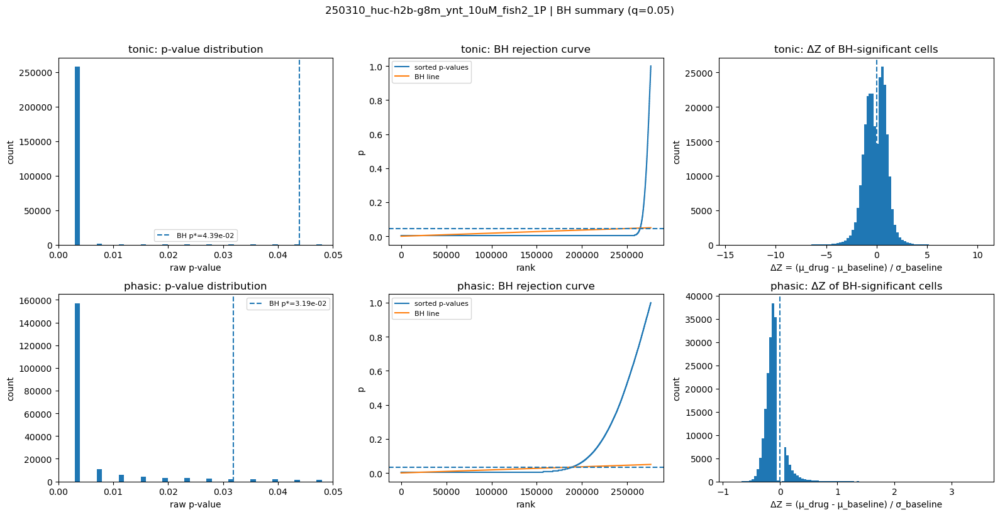


🐟 250313_huc-h2b-g8m_ynt_10uM_fish1_1P | BH q=0.05
[tonic] tested=350928, NaN=0, sig=327139 (93.2211%), pos=168153, neg=158986, p*= 4.391e-02, median ΔZ(sig)=0.117
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=350925, NaN=3, sig=202448 (57.6898%), pos=75436, neg=127012, p*= 2.794e-02, median ΔZ(sig)=-0.101
    min p=3.992e-03, median p=1.198e-02, p01=3.992e-03, p05=3.992e-03


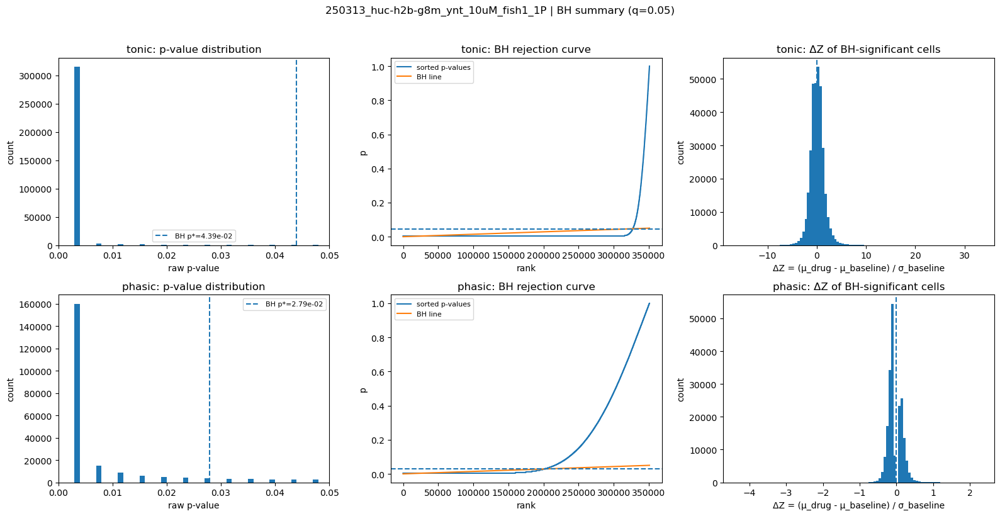


🐟 250313_huc-h2b-g8m_ynt_10uM_fish2_1P | BH q=0.05
[tonic] tested=355449, NaN=0, sig=327385 (92.1046%), pos=178921, neg=148464, p*= 4.391e-02, median ΔZ(sig)=0.122
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=355445, NaN=4, sig=146247 (41.1448%), pos=87864, neg=58383, p*= 1.996e-02, median ΔZ(sig)=0.094
    min p=3.992e-03, median p=5.589e-02, p01=3.992e-03, p05=3.992e-03


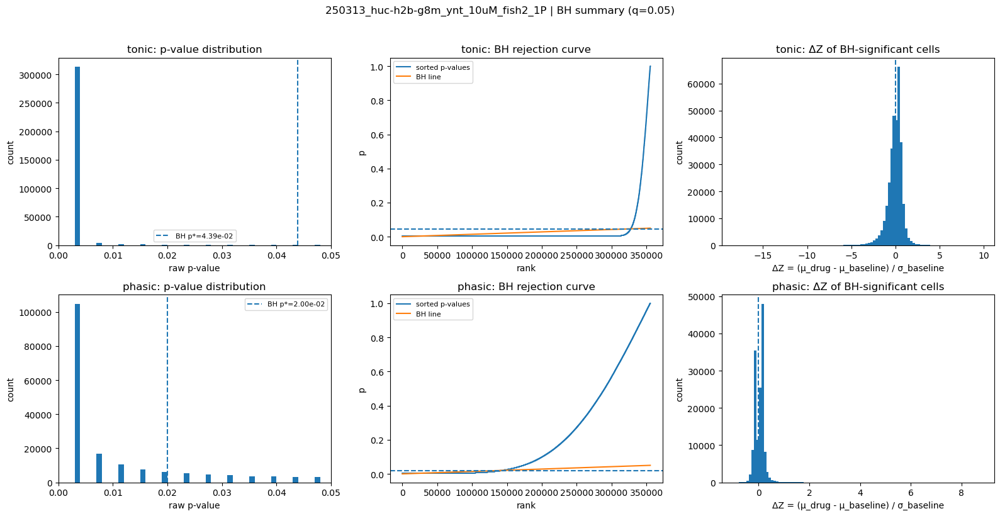


🐟 250721_huc-h2b-g8m_ynt185_10uM_fish1 | BH q=0.05
[tonic] tested=398910, NaN=0, sig=370188 (92.7999%), pos=176761, neg=193427, p*= 4.391e-02, median ΔZ(sig)=-0.110
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=398909, NaN=1, sig=131010 (32.8421%), pos=77140, neg=53870, p*= 1.597e-02, median ΔZ(sig)=0.098
    min p=3.992e-03, median p=1.158e-01, p01=3.992e-03, p05=3.992e-03


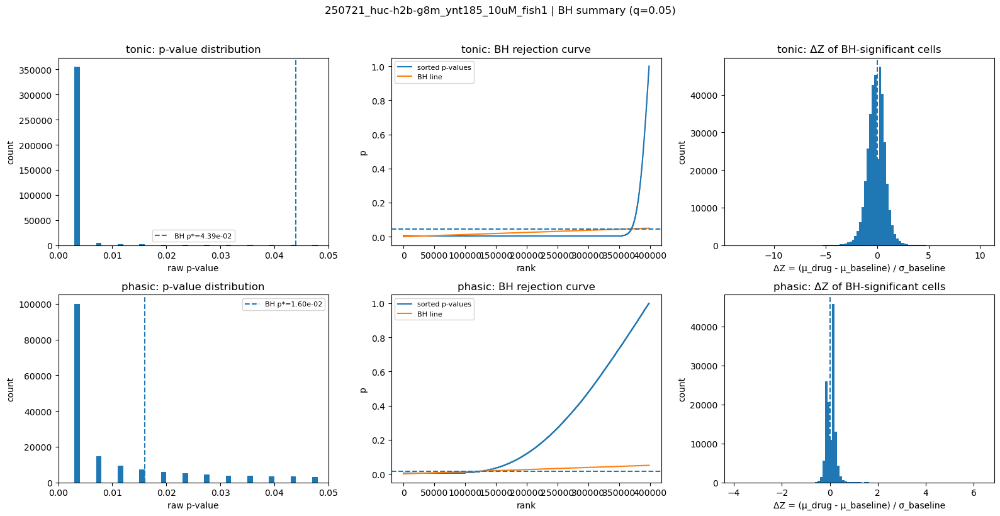


🐟 250721_huc-h2b-g8m_ynt185_10uM_fish2 | BH q=0.05
[tonic] tested=338580, NaN=0, sig=322160 (95.1503%), pos=196584, neg=125576, p*= 4.391e-02, median ΔZ(sig)=0.344
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=338578, NaN=2, sig=116104 (34.2917%), pos=65058, neg=51046, p*= 1.597e-02, median ΔZ(sig)=0.091
    min p=3.992e-03, median p=7.984e-02, p01=3.992e-03, p05=3.992e-03


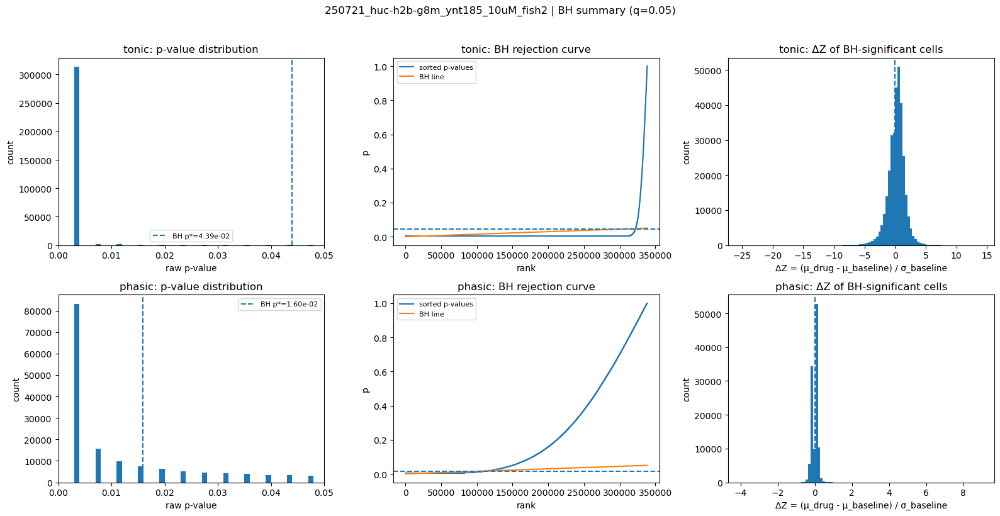


🐟 250721_huc-h2b-g8m_ynt185_10uM_fish3 | BH q=0.05
[tonic] tested=400227, NaN=0, sig=381521 (95.3262%), pos=132420, neg=249101, p*= 4.391e-02, median ΔZ(sig)=-0.404
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=400225, NaN=2, sig=205103 (51.2469%), pos=96832, neg=108271, p*= 2.395e-02, median ΔZ(sig)=-0.080
    min p=3.992e-03, median p=2.395e-02, p01=3.992e-03, p05=3.992e-03


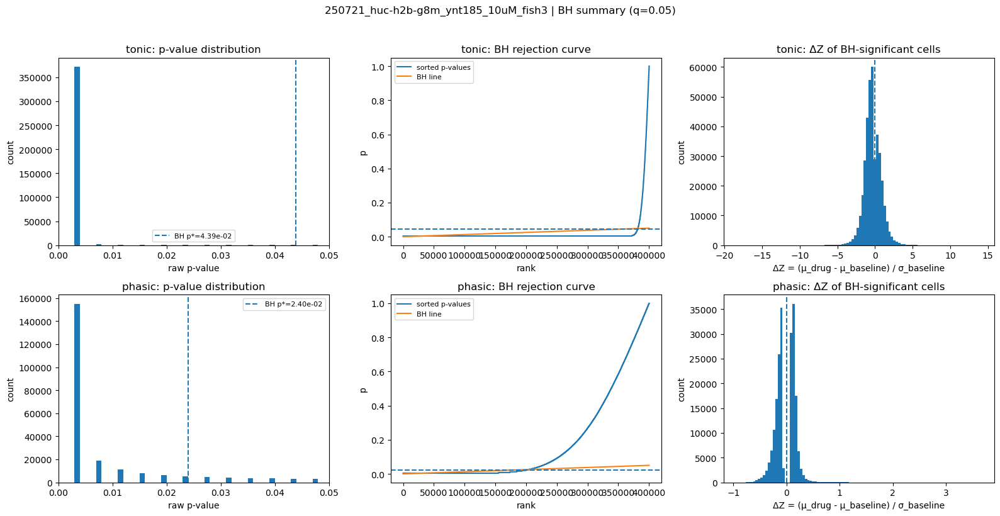


🐟 250828_huc-h2b-g8m_csn_10uM_fish1 | BH q=0.05
[tonic] tested=493865, NaN=0, sig=474783 (96.1362%), pos=89744, neg=385039, p*= 4.790e-02, median ΔZ(sig)=-0.906
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=493859, NaN=6, sig=241461 (48.8927%), pos=148043, neg=93418, p*= 2.395e-02, median ΔZ(sig)=0.097
    min p=3.992e-03, median p=2.794e-02, p01=3.992e-03, p05=3.992e-03


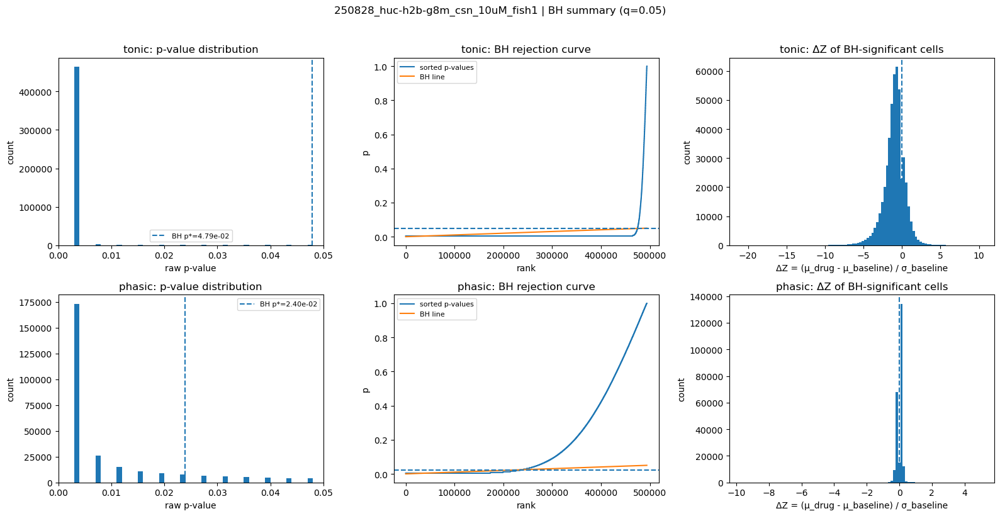


🐟 250828_huc-h2b-g8m_csn_10uM_fish2 | BH q=0.05
[tonic] tested=515337, NaN=0, sig=493263 (95.7166%), pos=425273, neg=67990, p*= 4.391e-02, median ΔZ(sig)=0.656
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=515335, NaN=2, sig=145425 (28.2195%), pos=104318, neg=41107, p*= 1.198e-02, median ΔZ(sig)=0.105
    min p=3.992e-03, median p=9.980e-02, p01=3.992e-03, p05=3.992e-03


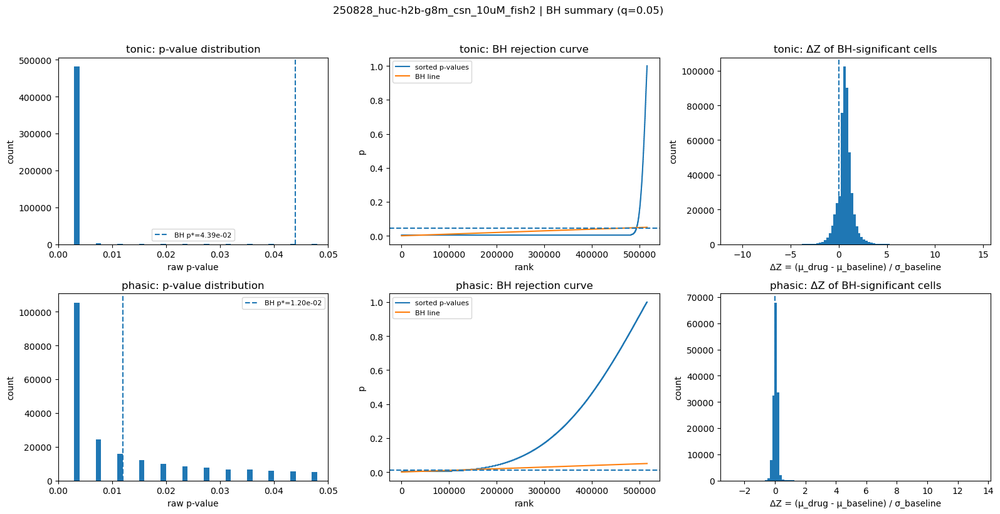


🐟 250828_huc-h2b-g8m_csn_10uM_fish3 | BH q=0.05
[tonic] tested=424187, NaN=0, sig=394162 (92.9218%), pos=249456, neg=144706, p*= 4.391e-02, median ΔZ(sig)=0.283
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=424186, NaN=1, sig=185451 (43.7193%), pos=49935, neg=135516, p*= 1.996e-02, median ΔZ(sig)=-0.107
    min p=3.992e-03, median p=4.391e-02, p01=3.992e-03, p05=3.992e-03


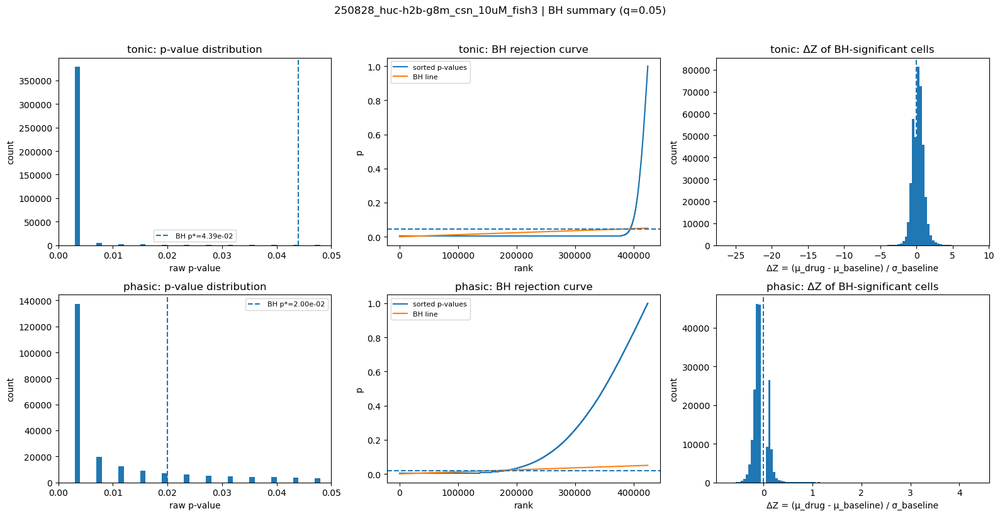


🐟 250923_huc-h2b-g8m_csn_10uM_fish1 | BH q=0.05
[tonic] tested=496447, NaN=0, sig=471386 (94.9519%), pos=109983, neg=361403, p*= 4.391e-02, median ΔZ(sig)=-0.487
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=496446, NaN=1, sig=167664 (33.7729%), pos=50134, neg=117530, p*= 1.597e-02, median ΔZ(sig)=-0.104
    min p=3.992e-03, median p=9.980e-02, p01=3.992e-03, p05=3.992e-03


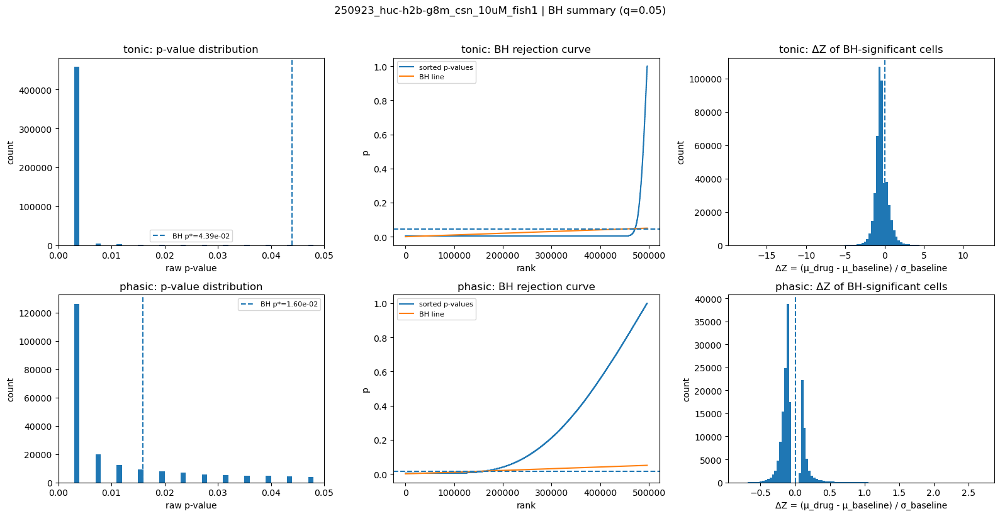


🐟 250923_huc-h2b-g8m_csn_10uM_fish2 | BH q=0.05
[tonic] tested=517621, NaN=0, sig=482465 (93.2082%), pos=317171, neg=165294, p*= 4.391e-02, median ΔZ(sig)=0.353
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=517617, NaN=4, sig=278670 (53.8371%), pos=32044, neg=246626, p*= 2.395e-02, median ΔZ(sig)=-0.116
    min p=3.992e-03, median p=1.597e-02, p01=3.992e-03, p05=3.992e-03


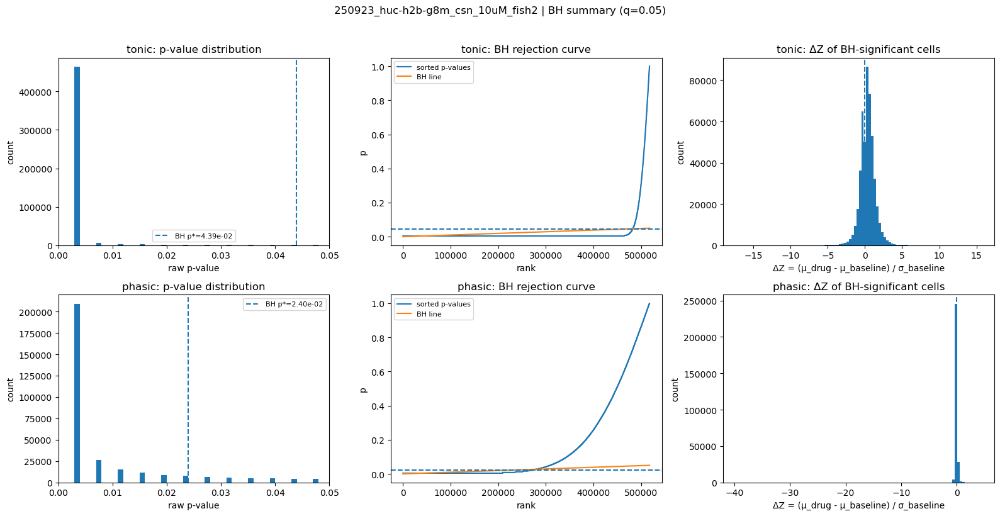


🐟 250923_huc-h2b-g8m_csn_10uM_fish3 | BH q=0.05
[tonic] tested=406078, NaN=0, sig=386387 (95.1509%), pos=126217, neg=260170, p*= 4.391e-02, median ΔZ(sig)=-0.440
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=406077, NaN=1, sig=183699 (45.2375%), pos=57167, neg=126532, p*= 1.996e-02, median ΔZ(sig)=-0.111
    min p=3.992e-03, median p=3.992e-02, p01=3.992e-03, p05=3.992e-03


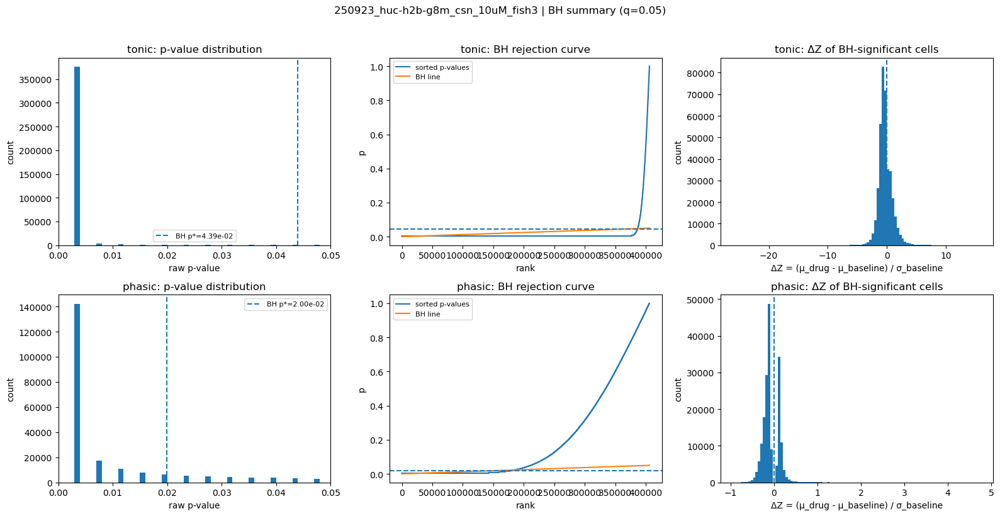


🐟 250923_huc-h2b-g8m_csn_10uM_fish4 | BH q=0.05
[tonic] tested=471238, NaN=0, sig=447184 (94.8956%), pos=100441, neg=346743, p*= 4.391e-02, median ΔZ(sig)=-0.629
    min p=3.992e-03, median p=3.992e-03, p01=3.992e-03, p05=3.992e-03
[phasic] tested=471233, NaN=5, sig=93611 (19.8651%), pos=46404, neg=47207, p*= 7.984e-03, median ΔZ(sig)=-0.076
    min p=3.992e-03, median p=1.996e-01, p01=3.992e-03, p05=3.992e-03


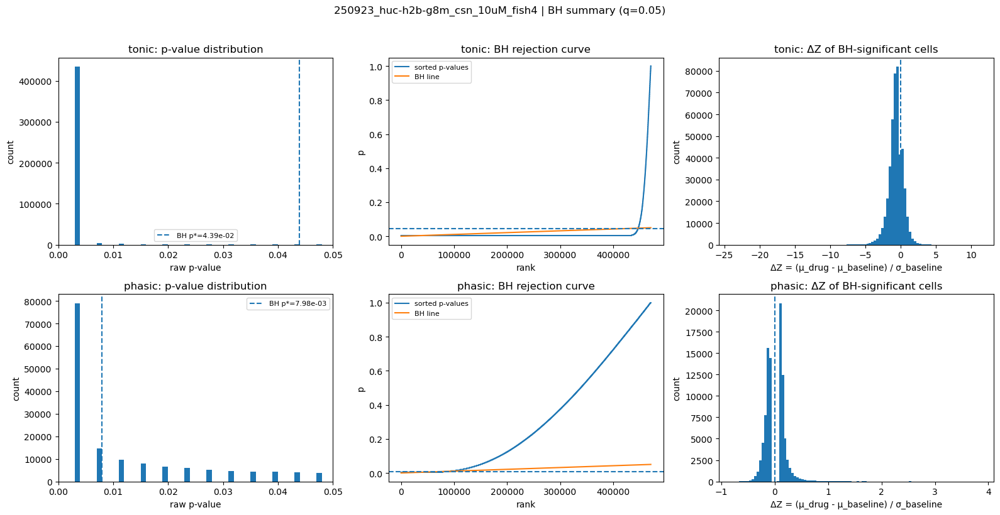

In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from statsmodels.stats.multitest import multipletests


def summarize_BH_results(
    proj_ID,
    expt_ID,
    output_dir,
    baseline_start,
    baseline_end,
    drug_start,
    drug_end,
    q=0.05,
    suffix="perm_BH",
    save_fig=False,
    fig_ext="png",
    tonic_trace_file="data_array_f_tonic.npy",
    phasic_trace_file="data_array_f_phasic.npy",
    eps_std=1e-6,
):
    """
    Summarize and visualize BH-FDR results for one fish.

    Reads raw permutation output files used by `filter_significant_cells_by_BH`:

        perm_p_values_and_diff_f_tonic.npy
        perm_p_values_and_diff_f_phasic.npy

    Each permutation result file must have:
        shape = (N_cells, 2)
        col 0 = raw p-values
        col 1 = mean difference (drug - baseline)

    Also reads per-cell trace arrays to compute standardized effect size:

        delta_z = (mean(drug) - mean(baseline)) / std(baseline)

    Parameters
    ----------
    proj_ID : str
    expt_ID : str
    output_dir : str or Path

    baseline_start, baseline_end : int
        Baseline window indices, Python slicing style [start:end)

    drug_start, drug_end : int
        Drug window indices, Python slicing style [start:end)

    q : float
        BH FDR level

    suffix : str
        Naming tag for saved figure

    save_fig : bool
        If True, save summary figure into expt_dir

    fig_ext : str
        Figure extension, e.g. "png" or "pdf"

    tonic_trace_file : str
        Filename for tonic trace matrix

    phasic_trace_file : str
        Filename for phasic trace matrix

    eps_std : float
        Minimum baseline std allowed; cells with std < eps_std get delta_z = NaN

    Returns
    -------
    summary : dict
        Nested summary dictionary for tonic and phasic
    """

    expt_dir = Path(output_dir) / proj_ID / expt_ID

    tonic_perm_file = expt_dir / "perm_p_values_and_diff_f_tonic.npy"
    phasic_perm_file = expt_dir / "perm_p_values_and_diff_f_phasic.npy"

    tonic_trace_path = expt_dir / tonic_trace_file
    phasic_trace_path = expt_dir / phasic_trace_file

    required_files = [
        tonic_perm_file,
        phasic_perm_file,
        tonic_trace_path,
        phasic_trace_path,
    ]
    missing = [str(f) for f in required_files if not f.exists()]
    if missing:
        print(f"⚠️ Missing files for {expt_ID}, skipping.")
        for f in missing:
            print(f"   - {f}")
        return None

    def _compute_delta_z_full(trace_path, expected_n_cells, label):
        """
        Compute full-length delta_z array aligned to original cell axis.

        delta_z = (mean(drug) - mean(baseline)) / std(baseline)
        """
        traces = np.load(trace_path)

        if traces.ndim != 2:
            raise ValueError(f"{label}: expected 2D trace array, got shape {traces.shape}")

        # Expect shape (N_cells, T). If shape is (T, N_cells), transpose.
        if traces.shape[0] == expected_n_cells:
            pass
        elif traces.shape[1] == expected_n_cells:
            traces = traces.T
        else:
            raise ValueError(
                f"{label}: trace shape {traces.shape} does not match expected "
                f"N_cells={expected_n_cells}"
            )

        n_cells, n_time = traces.shape

        if not (0 <= baseline_start < baseline_end <= n_time):
            raise ValueError(
                f"{label}: invalid baseline window [{baseline_start}:{baseline_end}) "
                f"for n_time={n_time}"
            )
        if not (0 <= drug_start < drug_end <= n_time):
            raise ValueError(
                f"{label}: invalid drug window [{drug_start}:{drug_end}) "
                f"for n_time={n_time}"
            )

        baseline = traces[:, baseline_start:baseline_end]
        drug = traces[:, drug_start:drug_end]

        baseline_mean = np.nanmean(baseline, axis=1)
        drug_mean = np.nanmean(drug, axis=1)
        baseline_std = np.nanstd(baseline, axis=1)

        delta_z = np.full(n_cells, np.nan, dtype=float)

        valid = (
            np.isfinite(baseline_mean)
            & np.isfinite(drug_mean)
            & np.isfinite(baseline_std)
            & (baseline_std >= eps_std)
        )

        delta_z[valid] = (drug_mean[valid] - baseline_mean[valid]) / baseline_std[valid]
        return delta_z

    def _compute_summary(pval_diff, delta_z_full, label):
        if pval_diff.ndim != 2 or pval_diff.shape[1] < 2:
            raise ValueError(
                f"{label}: expected permutation result array of shape (N_cells, 2), "
                f"got {pval_diff.shape}"
            )

        pvals_full = pval_diff[:, 0].astype(float)
        diffs_full = pval_diff[:, 1].astype(float)

        if len(delta_z_full) != len(pvals_full):
            raise ValueError(
                f"{label}: delta_z length {len(delta_z_full)} != pval length {len(pvals_full)}"
            )

        ok = np.isfinite(pvals_full)
        pvals = pvals_full[ok]
        diffs = diffs_full[ok]
        delta_z = delta_z_full[ok]

        if pvals.size == 0:
            return {
                "label": label,
                "n_total": len(pvals_full),
                "n_tested": 0,
                "n_nan": int((~ok).sum()),
                "pvals": np.array([]),
                "diffs": np.array([]),
                "delta_z": np.array([]),
                "p_sorted": np.array([]),
                "bh_line": np.array([]),
                "reject": np.array([], dtype=bool),
                "p_adj": np.array([]),
                "p_thresh": np.nan,
                "n_sig": 0,
                "n_pos": 0,
                "n_neg": 0,
                "frac_sig": np.nan,
                "min_p": np.nan,
                "median_p": np.nan,
                "p01": np.nan,
                "p05": np.nan,
                "median_delta_z_sig": np.nan,
            }

        reject, p_adj, _, _ = multipletests(pvals, alpha=q, method="fdr_bh")

        m = len(pvals)
        p_sorted = np.sort(pvals)
        ranks = np.arange(1, m + 1)
        bh_line = (ranks / m) * q
        passed_sorted = p_sorted <= bh_line

        if np.any(passed_sorted):
            k = np.where(passed_sorted)[0].max()
            p_thresh = p_sorted[k]
        else:
            p_thresh = np.nan

        n_sig = int(reject.sum())
        n_pos = int(np.sum(reject & (diffs > 0)))
        n_neg = int(np.sum(reject & (diffs < 0)))

        sig_delta_z = delta_z[reject]
        sig_delta_z = sig_delta_z[np.isfinite(sig_delta_z)]

        return {
            "label": label,
            "n_total": len(pvals_full),
            "n_tested": m,
            "n_nan": int((~ok).sum()),
            "pvals": pvals,
            "diffs": diffs,
            "delta_z": delta_z,
            "p_sorted": p_sorted,
            "bh_line": bh_line,
            "reject": reject,
            "p_adj": p_adj,
            "p_thresh": p_thresh,
            "n_sig": n_sig,
            "n_pos": n_pos,
            "n_neg": n_neg,
            "frac_sig": n_sig / m if m > 0 else np.nan,
            "min_p": float(np.min(pvals)),
            "median_p": float(np.median(pvals)),
            "p01": float(np.percentile(pvals, 1)),
            "p05": float(np.percentile(pvals, 5)),
            "median_delta_z_sig": float(np.median(sig_delta_z)) if sig_delta_z.size > 0 else np.nan,
        }

    tonic_res = np.load(tonic_perm_file)
    phasic_res = np.load(phasic_perm_file)

    tonic_delta_z_full = _compute_delta_z_full(
        tonic_trace_path,
        expected_n_cells=tonic_res.shape[0],
        label="tonic",
    )
    phasic_delta_z_full = _compute_delta_z_full(
        phasic_trace_path,
        expected_n_cells=phasic_res.shape[0],
        label="phasic",
    )

    tonic = _compute_summary(tonic_res, tonic_delta_z_full, "tonic")
    phasic = _compute_summary(phasic_res, phasic_delta_z_full, "phasic")

    # -------------------------
    # print summary
    # -------------------------
    print(f"\n🐟 {expt_ID} | BH q={q}")
    for res in [tonic, phasic]:
        pstar_str = f"{res['p_thresh']:.3e}" if np.isfinite(res["p_thresh"]) else "None"
        med_dz_str = (
            f"{res['median_delta_z_sig']:.3f}"
            if np.isfinite(res["median_delta_z_sig"])
            else "None"
        )

        print(
            f"[{res['label']}] "
            f"tested={res['n_tested']}, NaN={res['n_nan']}, "
            f"sig={res['n_sig']} ({res['frac_sig']:.4%}), "
            f"pos={res['n_pos']}, neg={res['n_neg']}, "
            f"p*= {pstar_str}, median ΔZ(sig)={med_dz_str}"
        )
        print(
            f"    min p={res['min_p']:.3e}, median p={res['median_p']:.3e}, "
            f"p01={res['p01']:.3e}, p05={res['p05']:.3e}"
        )

    # -------------------------
    # plotting
    # 2 rows (tonic/phasic) x 3 cols
    # -------------------------
    fig, axes = plt.subplots(2, 3, figsize=(16, 8))
    all_res = [tonic, phasic]

    for row, res in enumerate(all_res):
        label = res["label"]
        pvals = res["pvals"]
        p_sorted = res["p_sorted"]
        bh_line = res["bh_line"]
        reject = res["reject"]
        p_thresh = res["p_thresh"]
        delta_z = res["delta_z"]

        # 1) p-value histogram, zoomed to [0, 0.1]
        ax = axes[row, 0]
        ax.hist(pvals, bins=100, range=(0, 0.1))
        if np.isfinite(p_thresh) and p_thresh <= 0.1:
            ax.axvline(p_thresh, linestyle="--", label=f"BH p*={p_thresh:.2e}")
            ax.legend(fontsize=8)
        ax.set_xlim(0, 0.05)
        ax.set_title(f"{label}: p-value distribution")
        ax.set_xlabel("raw p-value")
        ax.set_ylabel("count")

        # 2) sorted p-values + BH line
        ax = axes[row, 1]
        ranks = np.arange(1, len(p_sorted) + 1)
        ax.plot(ranks, p_sorted, label="sorted p-values")
        ax.plot(ranks, bh_line, label="BH line")
        if np.isfinite(p_thresh):
            ax.axhline(p_thresh, linestyle="--")
        ax.set_title(f"{label}: BH rejection curve")
        ax.set_xlabel("rank")
        ax.set_ylabel("p")
        ax.legend(fontsize=8)

        # 3) ΔZ distribution of BH-significant cells
        ax = axes[row, 2]
        sig_delta_z = delta_z[reject]
        sig_delta_z = sig_delta_z[np.isfinite(sig_delta_z)]

        if sig_delta_z.size > 0:
            ax.hist(sig_delta_z, bins=100)
            ax.axvline(0, linestyle="--")
        else:
            ax.text(0.5, 0.5, "No BH-significant cells", ha="center", va="center")
        ax.set_title(f"{label}: ΔZ of BH-significant cells")
        ax.set_xlabel("ΔZ = (μ_drug - μ_baseline) / σ_baseline")
        ax.set_ylabel("count")

    fig.suptitle(f"{expt_ID} | BH summary (q={q})", y=1.02)
    plt.tight_layout()

    if save_fig:
        fig_path = expt_dir / f"{suffix}_summary_q{q}.{fig_ext}"
        plt.savefig(fig_path, dpi=200, bbox_inches="tight")
        print(f"💾 Saved figure: {fig_path}")

    plt.show()

    return {
        "expt_ID": expt_ID,
        "q": q,
        "tonic": tonic,
        "phasic": phasic,
    }


# === RUN ===
bh_summary_all = []

for expt_ID in expt_ID_list:
    try:
        out = summarize_BH_results(
            proj_ID=proj_ID,
            expt_ID=expt_ID,
            output_dir=dir_ants_output,
            baseline_start=baseline_start,
            baseline_end=baseline_end,
            drug_start=drug_start,
            drug_end=drug_end,
            q=BH_Q,
            suffix="perm_BH",
            save_fig=False,   # change to True if you want files saved
        )
        if out is not None:
            bh_summary_all.append(out)
    except Exception as e:
        print(f"❌ BH summary failed for {expt_ID}: {e}")

# ⭕️ STEP 2: Tonic-Spearman Ranked Correlation (rho)

## a. Calculate Spearman Ranked Correlation (rho) of the post-drug tonic signal to lagged drug regressors

* Neural responce could have a lag against the drug concentration, we perform Spearman correlation using regressor with shifted lags:
  #### **ρ_i = Spearman(F_tonic_i(t),C(t+lag))**
  

        i = each cell
  
        lag = 0, 5, 10, 15, 20 (MAX) min
---

* Spearman answers ONE question only:
  
    *“Does this cell’s tonic activity monotonically follow drug accumulation (or washout), possibly with a lag?”*

    - Rank-based → ignores amplitude
    - Sensitive to monotonic trends
    - Robust to nonlinearity
    - Blind to fast fluctuations
---

* Spearman does **NOT** guarantee:
    - large effect size
    - visible mean shift
    - sharp onset
    - identical timing across cells


In [6]:
"""
# Stage 2a: Tonic Spearman correlation using drug regressor with different lags

# output folder: 
        {dir_ants_output}/{proj_ID}/{expt_ID}/
        
# output file:
#       rho_tonic_all_lags.npy (n_cells, n_lags)
            - All Spearman correlations for every cell × every lag
#       rho_tonic_lag_grid_sec.npy (n_lags,): 
            - The lag values corresponding to columns of rho_tonic_all_lags.npy
"""
# --- Spearman correlation regrssor ---
# lag scan for unknown delay in the drug phase + washout phase
lag_max_sec  = 20 * 60   # 0..20 min
lag_step_sec = 5 * 60    # 5 min steps

# baseline extension into corr window 
baseline_pre_sec = 15 * 60   # include 15 min baseline before drug_start in Ft window

# compute knobs
chunk_cells = 3000


# ============================================================
# Helper 1) Build capsaicin concentration regressor C(t)
# ============================================================
def build_capsaicin_concentration(
    T,
    sampling_rate_hz,
    drug_start_frame,
    drug_end_frame,
    drug_uM=10.0,
    V_ml=15.0,
    Q_ml_min=4.5,
):
    drug_start_frame = int(np.clip(drug_start_frame, 0, T))
    drug_end_frame   = int(np.clip(drug_end_frame,   0, T))

    dt_min = (1.0 / sampling_rate_hz) / 60.0
    k = Q_ml_min / V_ml  # per minute

    Cin = np.zeros(T, dtype=np.float32)
    Cin[drug_start_frame:drug_end_frame] = np.float32(drug_uM)

    C = np.zeros(T, dtype=np.float32)
    for t in range(1, T):
        C[t] = C[t-1] + (k * (Cin[t-1] - C[t-1]) * dt_min)
    return C


# ============================================================
# Helper 2) Spearman for tonic vs C(t-lag)
#   - chooses best/2nd-best lag by |rho|
#   - SAVES signed rho at those lags (critical fix)
#   - returns both best and second-best lag (sec)
# ============================================================
def lagged_spearman_tonic(
    Ft,                 # (n_cells, T)
    C,                  # (T,)
    sampling_rate,
    lag_max_sec,
    lag_step_sec,
    corr_start_frame,   # inclusive
    corr_end_frame,     # exclusive
    chunk_cells=2000,
    desc="lagged spearman (meta window)",
    return_all_lags=True,   # NEW
):
    import numpy as np
    from tqdm import tqdm
    from scipy.stats import rankdata

    n_cells, T = Ft.shape
    if C.shape[0] != T:
        raise ValueError(f"C length {C.shape[0]} != T {T}")

    corr_start_frame = int(np.clip(int(round(corr_start_frame)), 0, T))
    corr_end_frame   = int(np.clip(int(round(corr_end_frame)),   0, T))
    if corr_end_frame <= corr_start_frame:
        raise ValueError(f"Invalid window: start={corr_start_frame}, end={corr_end_frame}")

    step_frames = max(1, int(round(lag_step_sec * sampling_rate)))
    lag_frames = np.arange(
        0,
        int(round(lag_max_sec * sampling_rate)) + 1,
        step_frames,
        dtype=int,
    )
    lag_sec_grid = (lag_frames / sampling_rate).astype(np.float32)  # NEW (n_lags,)

    n_lags = len(lag_frames)

    # outputs (existing)
    rho_max        = np.full(n_cells, np.nan, dtype=np.float32)  # signed best rho
    rho_secondbest = np.full(n_cells, np.nan, dtype=np.float32)  # signed 2nd-best rho
    rho_mean       = np.full(n_cells, np.nan, dtype=np.float32)  # signed mean across lags
    lag_argmax     = np.full(n_cells, np.nan, dtype=np.float32)  # best lag (sec)
    lag_arg2nd     = np.full(n_cells, np.nan, dtype=np.float32)  # 2nd-best lag (sec)

    # NEW: full rho matrix
    rho_all = np.full((n_cells, n_lags), np.nan, dtype=np.float32) if return_all_lags else None

    pbar = tqdm(total=n_cells, desc=desc, unit="cell")

    for s in range(0, n_cells, chunk_cells):
        e = min(s + chunk_cells, n_cells)
        X_full = np.asarray(Ft[s:e])  # (n_chunk, T)

        rho_lags = np.full((X_full.shape[0], n_lags), np.nan, dtype=np.float32)

        for j, lag in enumerate(lag_frames):
            t0 = max(corr_start_frame, lag)  # ensure t-lag >= 0
            t1 = min(corr_end_frame, T)      # ensure t < T
            L = t1 - t0
            if L < 3:
                continue

            Cseg = C[t0 - lag : t1 - lag]    # (L,)
            Xseg = X_full[:, t0:t1]          # (n_chunk, L)

            # rank+zscore regressor
            ry = rankdata(Cseg, method="average").astype(np.float32)
            ry = (ry - ry.mean()) / (ry.std(ddof=0) + 1e-12)

            # rank+zscore each cell segment
            rX = np.empty_like(Xseg, dtype=np.float32)
            for i in range(Xseg.shape[0]):
                r = rankdata(Xseg[i], method="average").astype(np.float32)
                r = (r - r.mean()) / (r.std(ddof=0) + 1e-12)
                rX[i] = r

            rho_lags[:, j] = np.nanmean(rX * ry[None, :], axis=1)

        # save full rho_lags into global rho_all (NEW)
        if return_all_lags:
            rho_all[s:e, :] = rho_lags

        # reduce across lags (same as you had)
        abs_rho = np.abs(rho_lags)
        max_abs = np.nanmax(abs_rho, axis=1)
        all_nan = ~np.isfinite(max_abs)

        best_j = np.nanargmax(abs_rho, axis=1).astype(int)
        rho_best = rho_lags[np.arange(rho_lags.shape[0]), best_j].astype(np.float32)
        best_lag_sec = lag_sec_grid[best_j].astype(np.float32)

        abs_rho2 = abs_rho.copy()
        abs_rho2[np.arange(abs_rho2.shape[0]), best_j] = -np.inf
        second_j = np.nanargmax(abs_rho2, axis=1).astype(int)
        rho_second = rho_lags[np.arange(rho_lags.shape[0]), second_j].astype(np.float32)
        second_lag_sec = lag_sec_grid[second_j].astype(np.float32)

        rho_mean_chunk = np.nanmean(rho_lags, axis=1).astype(np.float32)

        rho_best[all_nan] = np.nan
        rho_second[all_nan] = np.nan
        rho_mean_chunk[all_nan] = np.nan
        best_lag_sec[all_nan] = np.nan
        second_lag_sec[all_nan] = np.nan

        rho_max[s:e]        = rho_best
        rho_secondbest[s:e] = rho_second
        rho_mean[s:e]       = rho_mean_chunk
        lag_argmax[s:e]     = best_lag_sec
        lag_arg2nd[s:e]     = second_lag_sec

        pbar.update(e - s)

    pbar.close()

    # return order: add rho_all + lag_sec_grid
    return rho_max, rho_secondbest, rho_mean, lag_argmax, lag_arg2nd, rho_all, lag_sec_grid

# ============================================================
# Helper 3) Per-fish runner (resumable)
# ============================================================
def compute_tonic_drug_spearman_one_fish(
    proj_ID,
    expt_ID,
    dir_ants_output,
    sampling_rate,
    drug_start_frame,
    drug_end_frame,
    wash_end_frame,              # <-- pass this in (your meta: wash_end)
    drug_uM=10.0,
    V_ml=15.0,
    Q_ml_min=4.5,
    lag_max_sec=20*60,
    lag_step_sec=5*60,
    baseline_pre_sec=15*60,
    chunk_cells=2000,
    overwrite=False,
):
    out_dir = os.path.join(dir_ants_output, proj_ID, expt_ID)
    Path(out_dir).mkdir(parents=True, exist_ok=True)

    Ft_path = os.path.join(out_dir, "data_array_f_tonic.npy")
    if not os.path.isfile(Ft_path):
        raise FileNotFoundError(f"Missing F_tonic: {Ft_path}")
    
    rho_all_path   = os.path.join(out_dir, "rho_tonic_all_lags.npy")        # NEW (n_cells, n_lags)
    lag_grid_path  = os.path.join(out_dir, "rho_tonic_lag_grid_sec.npy")    # NEW (n_lags,)
    
    rho_max_path   = os.path.join(out_dir, "rho_tonic_lagmax.npy")
    rho_2nd_path   = os.path.join(out_dir, "rho_tonic_lagsecond.npy")      # NEW
    rho_mean_path  = os.path.join(out_dir, "rho_tonic_lagmean.npy")
    lag_max_path       = os.path.join(out_dir, "rho_tonic_lag_argmax_sec.npy")
    lag_2nd_path       = os.path.join(out_dir, "rho_tonic_lag_arg2nd_sec.npy")
    C_path         = os.path.join(out_dir, "C_capsaicin.npy")
    C_meta_path    = os.path.join(out_dir, "C_capsaicin_meta.txt")
    
    if (not overwrite) and all(os.path.isfile(p) for p in [
        rho_max_path, rho_2nd_path, rho_mean_path, lag_max_path, lag_2nd_path,
        rho_all_path, lag_grid_path
    ]):
        print(f"⏩ {expt_ID}: tonic Spearman outputs exist, skipping.")
        return
    

    Ft = np.load(Ft_path, mmap_mode="r")
    n_cells, T = Ft.shape

    # build regressor using Cin window (drug_start/drug_end)
    C = build_capsaicin_concentration(
        T=T,
        sampling_rate_hz=sampling_rate,
        drug_start_frame=int(round(drug_start_frame)),
        drug_end_frame=int(round(drug_end_frame)),
        drug_uM=drug_uM,
        V_ml=V_ml,
        Q_ml_min=Q_ml_min,
    )
    np.save(C_path, C.astype(np.float32))

    # ---- correlation window: (UPDATED) include 15 min baseline before drug ----
    pre_frames = int(round(baseline_pre_sec * sampling_rate))
    corr_start_frame = int(np.clip(int(round(drug_start_frame - pre_frames)), 0, T))
    corr_end_frame   = int(np.clip(int(round(wash_end_frame)), 0, T))
    if corr_end_frame <= corr_start_frame:
        raise ValueError(f"{expt_ID}: invalid corr window [{corr_start_frame},{corr_end_frame}) in T={T}")

    with open(C_meta_path, "w") as f:
        f.write(f"sampling_rate_hz={sampling_rate}\n")
        f.write(f"drug_start={drug_start_frame}\n")
        f.write(f"drug_end={drug_end_frame}\n")
        f.write(f"wash_end={wash_end_frame}\n")
        f.write(f"baseline_pre_sec={baseline_pre_sec}\n")
        f.write(f"corr_start_frame={corr_start_frame}\n")
        f.write(f"corr_end_frame={corr_end_frame}\n")
        f.write(f"lag_max_sec={lag_max_sec}\n")
        f.write(f"lag_step_sec={lag_step_sec}\n")
        f.write(f"drug_uM={drug_uM}\n")
        f.write(f"V_ml={V_ml}\n")
        f.write(f"Q_ml_min={Q_ml_min}\n")
        f.write("model=dC/dt=(Q/V)*(Cin-C)\n")
        f.write("NOTE=Spearman computed in [drug_start-15min, wash_end)\n")

    rho_max, rho_second, rho_mean, lag_argmax, lag_arg2nd, rho_all, lag_sec_grid = lagged_spearman_tonic(
        Ft=Ft,
        C=C,
        sampling_rate=sampling_rate,
        lag_max_sec=lag_max_sec,
        lag_step_sec=lag_step_sec,
        corr_start_frame=corr_start_frame,
        corr_end_frame=corr_end_frame,
        chunk_cells=chunk_cells,
        desc=f"{expt_ID} tonic~C(t) lagged (15min baseline + drug+wash)",
        return_all_lags=True,
    )
    
    np.save(rho_max_path,   rho_max.astype(np.float32))
    np.save(rho_2nd_path,   rho_second.astype(np.float32))
    np.save(rho_mean_path,  rho_mean.astype(np.float32))
    np.save(lag_max_path,   lag_argmax.astype(np.float32))
    np.save(lag_2nd_path,   lag_arg2nd.astype(np.float32))
    
    # NEW saves
    np.save(rho_all_path,  rho_all.astype(np.float32))        # (n_cells, n_lags)
    np.save(lag_grid_path, lag_sec_grid.astype(np.float32))   # (n_lags,)

    print(f"✅ {expt_ID}: saved")
    print(f"  corr window frames: [{corr_start_frame}, {corr_end_frame}) == [drug_start-15min, wash_end)")
    print(f"  {rho_max_path}")
    print(f"  {rho_2nd_path}")
    print(f"  {rho_mean_path}")
    print(f"  {lag_max_path}")
    print(f"  {lag_2nd_path}")

    del Ft, C, rho_max, rho_second, rho_mean, lag_argmax, lag_arg2nd
    gc.collect()



In [ ]:

# ============================================================
# RUN (parallel)
# ============================================================
Parallel(n_jobs=25)(
    delayed(compute_tonic_drug_spearman_one_fish)(
        proj_ID=proj_ID,
        expt_ID=expt_ID,
        dir_ants_output=dir_ants_output,
        sampling_rate=volume_per_sec,
        drug_start_frame=drug_start,
        drug_end_frame=drug_end,
        wash_end_frame=wash_end,          # <-- IMPORTANT
        drug_uM=drug_uM,
        V_ml=V_ml,
        Q_ml_min=Q_ml_min,
        lag_max_sec=lag_max_sec,
        lag_step_sec=lag_step_sec,
        baseline_pre_sec=baseline_pre_sec,
        chunk_cells=chunk_cells,
        overwrite=True,
    )
    for expt_ID in expt_ID_list
)

## 📊 a. Plot per-fish responder fraction (separating different lag regressors)

                             expt_ID genotype  lag_idx  n_cells  n_lags  \
0  251021_huc-h2b-g8m_csn_10uM_fish1     CTRL        0   485698       5   
1  251021_huc-h2b-g8m_csn_10uM_fish1     CTRL        1   485698       5   
2  251021_huc-h2b-g8m_csn_10uM_fish1     CTRL        2   485698       5   
3  251021_huc-h2b-g8m_csn_10uM_fish1     CTRL        3   485698       5   
4  251021_huc-h2b-g8m_csn_10uM_fish1     CTRL        4   485698       5   

   frac_pos_strong  frac_neg_strong  rho_pos_thresh  rho_neg_thresh  
0         0.007956         0.002312             0.9            -0.9  
1         0.005936         0.004373             0.9            -0.9  
2         0.004252         0.000947             0.9            -0.9  
3         0.004672         0.000111             0.9            -0.9  
4         0.001826         0.000031             0.9            -0.9  


/tmp/ipykernel_555233/1376854106.py:246: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_555233/1376854106.py:293: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_555233/1376854106.py:246: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_555233/1376854106.py:293: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_555233/1376854106.py:246: MatplotlibDeprecationWarning: The 'labels' 

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/rho_tail_pos0.9neg-0.9_boxplot_2x5_allLags.png


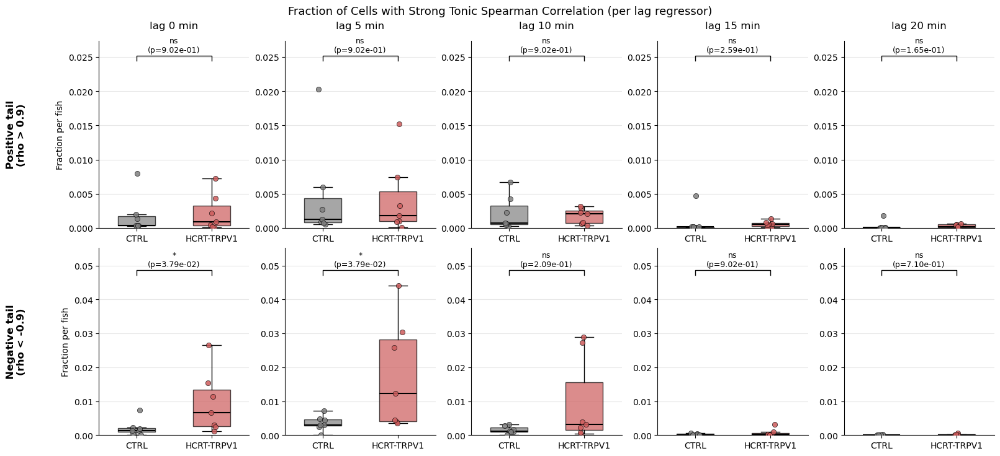

PosixPath('/resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/rho_tail_pos0.9neg-0.9_boxplot_2x5_allLags.png')

In [24]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.stats import mannwhitneyu

# ============================================================
# 2xN grid: per-lag responder fractions (pos top row, neg bottom)
# - reads rho_tonic_all_lags.npy  (n_cells, n_lags)
# - reads rho_tonic_lag_grid_sec.npy (n_lags,)
# - per fish: frac_pos = mean(rho > pos_thresh), frac_neg = mean(rho < neg_thresh)
# - per lag: CTRL vs EXPT boxplots with jitter + MW stars
# - COLORS / LABELS pulled from PLOT_META
# ============================================================

# =========================
# REQUIRED META IN SCOPE
# =========================
# EXPT_TAG = "YNT185"
# CTRL_TAG = "CTRL"
#
# PLOT_META = {
#     EXPT_TAG: {
#         "label": EXPT_TAG,
#         "color": "darkorange",
#         "alpha": 0.7,
#     },
#     CTRL_TAG: {
#         "label": CTRL_TAG,
#         "color": "darkkhaki",
#         "alpha": 0.7,
#     }
# }

# =========================
# HELPERS
# =========================
def mw_test_and_stars(x, y):
    """Mann–Whitney U test (two-sided) + star annotation"""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    x = x[np.isfinite(x)]
    y = y[np.isfinite(y)]
    if x.size < 2 or y.size < 2:
        return np.nan, "n/a"

    stat, p = mannwhitneyu(x, y, alternative="two-sided")
    if p < 1e-3:
        stars = "***"
    elif p < 1e-2:
        stars = "**"
    elif p < 5e-2:
        stars = "*"
    else:
        stars = "ns"
    return float(p), stars


def _add_scatter(ax, data, x_pos, color, jitter=0.06, alpha=0.85):
    data = np.asarray(data, dtype=float)
    data = data[np.isfinite(data)]
    if data.size == 0:
        return
    x = x_pos + np.random.uniform(-jitter, jitter, size=len(data))
    ax.scatter(
        x, data,
        s=35,
        color=color,
        edgecolor="black",
        linewidth=0.5,
        alpha=alpha,
        zorder=3,
    )


def _safe_load(path):
    if not os.path.isfile(path):
        return None
    return np.load(path)


def _load_lag_grid_any(dir_ants_output, proj_ID, expt_lists, fname="rho_tonic_lag_grid_sec.npy"):
    """
    Try fish folders in the order you pass.
    Returns (lag_grid_sec,) or None.
    """
    for expt_ID_list in expt_lists:
        for expt_ID in expt_ID_list:
            p = os.path.join(dir_ants_output, proj_ID, expt_ID, fname)
            g = _safe_load(p)
            if g is None:
                continue
            g = np.asarray(g, dtype=np.float32).ravel()
            if g.size > 0:
                return g
    return None


def _get_plot_style(geno):
    """
    Pull plotting style from PLOT_META.
    """
    if geno not in PLOT_META:
        raise KeyError(f"{geno} not found in PLOT_META. Available keys: {list(PLOT_META.keys())}")
    meta = PLOT_META[geno]
    return {
        "label": meta.get("label", geno),
        "color": meta.get("color", "gray"),
        "alpha": meta.get("alpha", 0.7),
    }


# =========================
# CORE: compute per-fish fractions per lag
# =========================
def compute_rho_tail_fraction_posneg_per_lag(
    expt_ID_list,
    geno_map,
    dir_ants_output,
    proj_ID,
    rho_pos_thresh=0.7,
    rho_neg_thresh=-0.7,
    fname_rho_all="rho_tonic_all_lags.npy",
):
    """
    Returns:
      df_long with columns:
        expt_ID, genotype, lag_idx, frac_pos_strong, frac_neg_strong, n_cells, n_lags
    """
    rows = []
    for expt_ID in expt_ID_list:
        rho_path = os.path.join(dir_ants_output, proj_ID, expt_ID, fname_rho_all)
        if not os.path.isfile(rho_path):
            print(f"⚠️ missing {fname_rho_all}: {expt_ID}")
            continue

        rho_all = np.load(rho_path).astype(np.float32)  # (n_cells, n_lags)
        if rho_all.ndim != 2:
            print(f"⚠️ bad rho_all shape for {expt_ID}: {rho_all.shape}")
            continue

        n_cells, n_lags = rho_all.shape
        geno = geno_map.get(expt_ID, None)
        if geno is None:
            print(f"⚠️ expt_ID not in geno_map: {expt_ID}")
            continue

        for li in range(n_lags):
            r = rho_all[:, li]
            r = r[np.isfinite(r)]
            if r.size == 0:
                frac_pos = np.nan
                frac_neg = np.nan
            else:
                frac_pos = float(np.mean(r > rho_pos_thresh))
                frac_neg = float(np.mean(r < rho_neg_thresh))

            rows.append({
                "expt_ID": expt_ID,
                "genotype": geno,   # CTRL_TAG or EXPT_TAG
                "lag_idx": int(li),
                "n_cells": int(n_cells),
                "n_lags": int(n_lags),
                "frac_pos_strong": frac_pos,
                "frac_neg_strong": frac_neg,
                "rho_pos_thresh": float(rho_pos_thresh),
                "rho_neg_thresh": float(rho_neg_thresh),
            })

    return pd.DataFrame(rows)


# =========================
# PLOT: 2xN_lags grid
# =========================
def plot_rho_tail_fraction_posneg_grid_by_lag(
    df_long,
    lag_grid_sec,
    rho_pos_thresh,
    rho_neg_thresh,
    dir_ants_output,
    proj_ID,
    fig_name_tag="allLags",
    seed=0,
):
    """
    2 x n_lags:
      - top row: positive tail fraction
      - bottom row: negative tail fraction
    each column: one lag regressor
    """
    rng = np.random.default_rng(seed)
    np.random.seed(seed)

    groups = [CTRL_TAG, EXPT_TAG]
    styles = {g: _get_plot_style(g) for g in groups}

    lag_grid_sec = np.asarray(lag_grid_sec, dtype=np.float32).ravel()
    n_lags = int(lag_grid_sec.size)
    lag_grid_min = lag_grid_sec / 60.0

    present_lags = sorted(df_long["lag_idx"].unique().tolist()) if len(df_long) else []
    if len(present_lags) == 0:
        raise RuntimeError("df_long is empty. No fish had rho_tonic_all_lags.npy or all were invalid.")
    if max(present_lags) >= n_lags:
        print("⚠️ df_long contains lag_idx beyond lag_grid_sec length. Using min(n_lags, max_df+1).")
        n_lags = min(n_lags, max(present_lags) + 1)

    fig, axs = plt.subplots(
        2, n_lags,
        figsize=(3.2 * n_lags, 7.0),
        sharey=False,
        constrained_layout=True
    )
    if n_lags == 1:
        axs = np.array([[axs[0]], [axs[1]]])

    # -------------------------
    # global y-lims per row
    # -------------------------
    pos_vals = df_long["frac_pos_strong"].to_numpy(dtype=float)
    neg_vals = df_long["frac_neg_strong"].to_numpy(dtype=float)
    pos_vals = pos_vals[np.isfinite(pos_vals)]
    neg_vals = neg_vals[np.isfinite(neg_vals)]

    pos_ymax_data = float(np.nanmax(pos_vals)) if pos_vals.size else 0.02
    neg_ymax_data = float(np.nanmax(neg_vals)) if neg_vals.size else 0.02

    # more headroom so title / bracket / text don't collide
    pos_ylim_top = max(0.002, pos_ymax_data * 1.35)
    neg_ylim_top = max(0.02,  neg_ymax_data * 1.25)

    for li in range(n_lags):
        df_l = df_long[df_long["lag_idx"] == li]

        # labels once
        labels = [styles[g]["label"] for g in groups]

        # -------------------------
        # POS (top row)
        # -------------------------
        ax = axs[0, li]
        data_pos = [df_l.loc[df_l["genotype"] == g, "frac_pos_strong"].values for g in groups]

        bp = ax.boxplot(
            data_pos,
            labels=labels,
            widths=0.5,
            patch_artist=True,
            medianprops=dict(color="black", linewidth=1.5),
            showfliers=False,
        )
        for patch, g in zip(bp["boxes"], groups):
            patch.set_facecolor(styles[g]["color"])
            patch.set_alpha(styles[g]["alpha"])

        for i, g in enumerate(groups, start=1):
            _add_scatter(
                ax,
                df_l.loc[df_l["genotype"] == g, "frac_pos_strong"].values,
                x_pos=i,
                color=styles[g]["color"],
                alpha=max(styles[g]["alpha"], 0.85),
            )

        p_pos, stars_pos = mw_test_and_stars(data_pos[0], data_pos[1])

        # put bracket well below the title
        y = pos_ylim_top * 0.92
        h = pos_ylim_top * 0.025
        ax.plot([1, 1, 2, 2], [y - h, y, y, y - h], color="black", lw=1)
        ax.text(
            1.5, y + pos_ylim_top * 0.01,
            f"{stars_pos}\n(p={p_pos:.2e})" if np.isfinite(p_pos) else "n/a",
            ha="center", va="bottom", fontsize=9
        )

        ax.set_title(f"lag {lag_grid_min[li]:g} min", pad=14)
        if li == 0:
            ax.set_ylabel("Fraction per fish")
        ax.grid(axis="y", alpha=0.3)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.set_ylim(0, pos_ylim_top)

        # -------------------------
        # NEG (bottom row)
        # -------------------------
        ax = axs[1, li]
        data_neg = [df_l.loc[df_l["genotype"] == g, "frac_neg_strong"].values for g in groups]

        bp = ax.boxplot(
            data_neg,
            labels=labels,
            widths=0.5,
            patch_artist=True,
            medianprops=dict(color="black", linewidth=1.5),
            showfliers=False,
        )
        for patch, g in zip(bp["boxes"], groups):
            patch.set_facecolor(styles[g]["color"])
            patch.set_alpha(styles[g]["alpha"])

        for i, g in enumerate(groups, start=1):
            _add_scatter(
                ax,
                df_l.loc[df_l["genotype"] == g, "frac_neg_strong"].values,
                x_pos=i,
                color=styles[g]["color"],
                alpha=max(styles[g]["alpha"], 0.85),
            )

        p_neg, stars_neg = mw_test_and_stars(data_neg[0], data_neg[1])

        y = neg_ylim_top * 0.88
        h = neg_ylim_top * 0.025
        ax.plot([1, 1, 2, 2], [y - h, y, y, y - h], color="black", lw=1)
        ax.text(
            1.5, y + neg_ylim_top * 0.01,
            f"{stars_neg}\n(p={p_neg:.2e})" if np.isfinite(p_neg) else "n/a",
            ha="center", va="bottom", fontsize=9
        )

        if li == 0:
            ax.set_ylabel("Fraction per fish")
        ax.grid(axis="y", alpha=0.3)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.set_ylim(0, neg_ylim_top)

    # row labels
    axs[0, 0].text(
        -0.55, 0.5,
        f"Positive tail\n(rho > {rho_pos_thresh})",
        transform=axs[0, 0].transAxes,
        rotation=90, va="center", ha="center",
        fontsize=12, fontweight="bold"
    )
    axs[1, 0].text(
        -0.55, 0.5,
        f"Negative tail\n(rho < {rho_neg_thresh})",
        transform=axs[1, 0].transAxes,
        rotation=90, va="center", ha="center",
        fontsize=12, fontweight="bold"
    )

    fig.suptitle(
        "Fraction of Cells with Strong Tonic Spearman Correlation (per lag regressor)",
        y=1.03,
        fontsize=13
    )

    # save
    fig_dir = Path(dir_ants_output) / proj_ID / "figures"
    fig_dir.mkdir(parents=True, exist_ok=True)
    out_name = f"rho_tail_pos{rho_pos_thresh}neg{rho_neg_thresh}_boxplot_2x{n_lags}_{fig_name_tag}.png"
    out_path = fig_dir / out_name
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    print(f"✅ Saved: {out_path}")

    plt.show()
    return out_path

# =========================
# RUN
# =========================
rho_pos_thresh = 0.9
rho_neg_thresh = -0.9

geno_map = {eid: CTRL_TAG for eid in ctrl_expt_ID_list}
geno_map.update({eid: EXPT_TAG for eid in hcrt_expt_ID_list})

lag_grid_sec = _load_lag_grid_any(
    dir_ants_output=dir_ants_output,
    proj_ID=proj_ID,
    expt_lists=[ctrl_expt_ID_list, hcrt_expt_ID_list],
    fname="rho_tonic_lag_grid_sec.npy",
)
if lag_grid_sec is None:
    raise FileNotFoundError("Could not find rho_tonic_lag_grid_sec.npy in any fish folder.")

df_long = compute_rho_tail_fraction_posneg_per_lag(
    expt_ID_list=(ctrl_expt_ID_list + hcrt_expt_ID_list),
    geno_map=geno_map,
    dir_ants_output=dir_ants_output,
    proj_ID=proj_ID,
    rho_pos_thresh=rho_pos_thresh,
    rho_neg_thresh=rho_neg_thresh,
    fname_rho_all="rho_tonic_all_lags.npy",
)

print(df_long.head())

plot_rho_tail_fraction_posneg_grid_by_lag(
    df_long=df_long,
    lag_grid_sec=lag_grid_sec,
    rho_pos_thresh=rho_pos_thresh,
    rho_neg_thresh=rho_neg_thresh,
    dir_ants_output=dir_ants_output,
    proj_ID=proj_ID,
    fig_name_tag="allLags",
)

## 📊 b. Plot per-fish responder fraction (using Max Lag)


PER-FISH SUMMARY sorted by: frac_pos_strong (desc)

[CTRL]
                          expt_ID genotype  n_cells  n_pos_strong  frac_pos_strong  n_neg_strong  frac_neg_strong  rho_mean  rho_std  rho_q95  rho_q99   rho_min  rho_max
251126_huc-h2b-g8m_csn_10uM_fish1     CTRL   516860         12106         0.023422           181         0.000350  0.211846 0.513775 0.855346 0.927090 -0.953624 0.977645
251021_huc-h2b-g8m_csn_10uM_fish1     CTRL   485698         10337         0.021283          3220         0.006630  0.279111 0.593204 0.873528 0.916034 -0.977889 0.979153
251118_huc-h2b-g8m_csn_10uM_fish1     CTRL   474057          2287         0.004824          2925         0.006170 -0.251798 0.568053 0.780404 0.878302 -0.967139 0.971816
251118_huc-h2b-g8m_csn_10uM_fish2     CTRL   432666          1016         0.002348          2547         0.005887 -0.173591 0.516718 0.727620 0.850578 -0.970641 0.970071
251118_huc-h2b-g8m_csn_10uM_fish4     CTRL   491867          1030         0.002094        

/tmp/ipykernel_555233/2013963986.py:254: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[0].boxplot(
/tmp/ipykernel_555233/2013963986.py:306: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[1].boxplot(


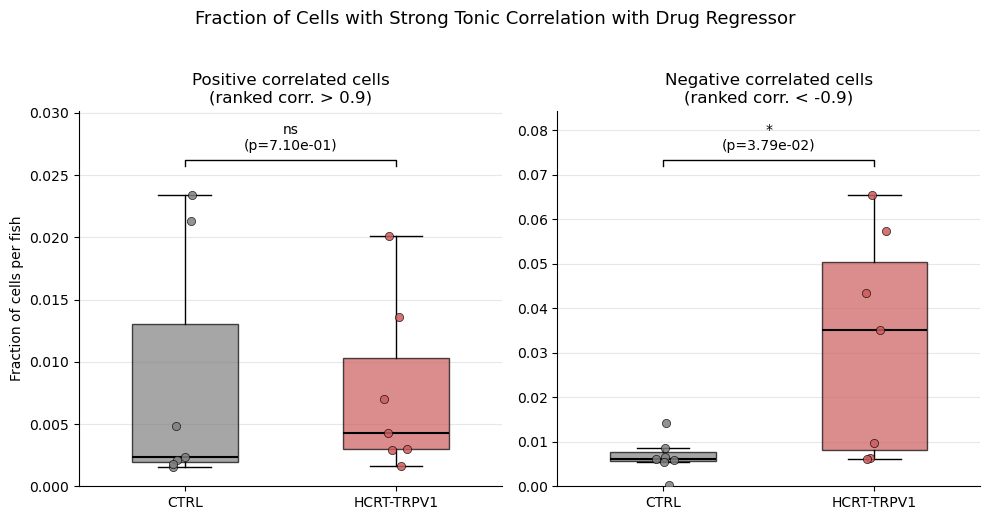

In [26]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

def compute_rho_tail_fraction_posneg_asym(
    expt_ID_list,
    geno_map,
    dir_ants_output,
    proj_ID,
    rho_pos_thresh=0.7,
    rho_neg_thresh=-0.7,
):
    rows = []
    for expt_ID in expt_ID_list:
        if expt_ID not in geno_map:
            continue

        rho_path = os.path.join(dir_ants_output, proj_ID, expt_ID, "rho_tonic_lagmax.npy")
        if not os.path.isfile(rho_path):
            print(f"⚠️ Missing rho file: {expt_ID}")
            continue

        rho = np.load(rho_path).astype(np.float32)
        rho = rho[np.isfinite(rho)]
        n = rho.size
        if n == 0:
            print(f"⚠️ No finite rho values: {expt_ID}")
            continue

        n_pos = int(np.sum(rho > rho_pos_thresh))
        n_neg = int(np.sum(rho < rho_neg_thresh))
        n_abs = int(np.sum((rho > rho_pos_thresh) | (rho < rho_neg_thresh)))

        frac_pos = n_pos / n
        frac_neg = n_neg / n
        frac_abs = n_abs / n

        rows.append({
            "expt_ID": expt_ID,
            "genotype": geno_map[expt_ID],
            "n_cells": int(n),
            "n_pos_strong": n_pos,
            "n_neg_strong": n_neg,
            "n_strong_abs_asym": n_abs,
            "frac_pos_strong": float(frac_pos),
            "frac_neg_strong": float(frac_neg),
            "frac_strong_abs_asym": float(frac_abs),
            "rho_pos_thresh": float(rho_pos_thresh),
            "rho_neg_thresh": float(rho_neg_thresh),
            "rho_mean": float(np.nanmean(rho)),
            "rho_std": float(np.nanstd(rho)),
            "rho_q95": float(np.nanquantile(rho, 0.95)),
            "rho_q99": float(np.nanquantile(rho, 0.99)),
            "rho_min": float(np.nanmin(rho)),
            "rho_max": float(np.nanmax(rho)),
        })

    return pd.DataFrame(rows)


def mw_test_and_stars(x, y):
    if len(x) < 2 or len(y) < 2:
        return np.nan, "n/a"

    stat, p = mannwhitneyu(x, y, alternative="two-sided")

    if p < 1e-3:
        stars = "***"
    elif p < 1e-2:
        stars = "**"
    elif p < 5e-2:
        stars = "*"
    else:
        stars = "ns"

    return p, stars


def _add_scatter(ax, data, x_pos, color, jitter=0.06, alpha=0.85):
    x = x_pos + np.random.uniform(-jitter, jitter, size=len(data))
    ax.scatter(
        x,
        data,
        s=35,
        color=color,
        edgecolor="black",
        linewidth=0.5,
        alpha=alpha,
        zorder=3,
    )


def _get_plot_style(geno):
    if geno not in PLOT_META:
        raise KeyError(f"{geno} not found in PLOT_META. Available keys: {list(PLOT_META.keys())}")
    meta = PLOT_META[geno]
    return {
        "label": meta.get("label", geno),
        "color": meta.get("color", "gray"),
        "alpha": meta.get("alpha", 0.7),
    }


def flag_iqr_outliers(df, value_col, group_col="genotype", iqr_mult=1.5):
    """
    Add robust outlier flags within each genotype using Tukey IQR rule.
    """
    out = df.copy()
    out[f"{value_col}_is_outlier"] = False
    out[f"{value_col}_upper_fence"] = np.nan
    out[f"{value_col}_lower_fence"] = np.nan

    for g in out[group_col].dropna().unique():
        m = out[group_col] == g
        vals = out.loc[m, value_col].astype(float).values
        vals = vals[np.isfinite(vals)]
        if len(vals) < 4:
            continue

        q1 = np.quantile(vals, 0.25)
        q3 = np.quantile(vals, 0.75)
        iqr = q3 - q1
        lo = q1 - iqr_mult * iqr
        hi = q3 + iqr_mult * iqr

        out.loc[m, f"{value_col}_lower_fence"] = lo
        out.loc[m, f"{value_col}_upper_fence"] = hi
        out.loc[m, f"{value_col}_is_outlier"] = (
            (out.loc[m, value_col] < lo) | (out.loc[m, value_col] > hi)
        )

    return out


def print_individual_fish_info(
    df,
    sort_col="frac_pos_strong",
    ascending=False,
    n_show=None,
):
    """
    Print individual fish info sorted by a chosen metric.
    """
    cols = [
        "expt_ID",
        "genotype",
        "n_cells",
        "n_pos_strong",
        "frac_pos_strong",
        "n_neg_strong",
        "frac_neg_strong",
        "rho_mean",
        "rho_std",
        "rho_q95",
        "rho_q99",
        "rho_min",
        "rho_max",
    ]

    tmp = df.copy()
    for c in cols:
        if c not in tmp.columns:
            continue

    groups = list(tmp["genotype"].dropna().unique())

    print("\n" + "=" * 100)
    print(f"PER-FISH SUMMARY sorted by: {sort_col} ({'asc' if ascending else 'desc'})")
    print("=" * 100)

    for g in groups:
        sub = tmp.loc[tmp["genotype"] == g].copy()
        sub = sub.sort_values(sort_col, ascending=ascending)
        if n_show is not None:
            sub = sub.head(n_show)

        print(f"\n[{g}]")
        if len(sub) == 0:
            print("  No fish.")
            continue

        print(sub[cols].to_string(index=False))


def print_outlier_candidates(df):
    """
    Print likely outlier fish for positive and negative fractions.
    """
    df1 = flag_iqr_outliers(df, "frac_pos_strong", group_col="genotype", iqr_mult=3)
    df2 = flag_iqr_outliers(df1, "frac_neg_strong", group_col="genotype", iqr_mult=3)

    print("\n" + "=" * 100)
    print("OUTLIER CANDIDATES (IQR rule within genotype)")
    print("=" * 100)

    pos_hits = df2.loc[df2["frac_pos_strong_is_outlier"]].copy()
    neg_hits = df2.loc[df2["frac_neg_strong_is_outlier"]].copy()

    if len(pos_hits) == 0:
        print("\nNo positive-fraction outliers flagged.")
    else:
        print("\nPositive-fraction outliers:")
        print(
            pos_hits[
                [
                    "expt_ID",
                    "genotype",
                    "n_cells",
                    "n_pos_strong",
                    "frac_pos_strong",
                    "frac_pos_strong_upper_fence",
                ]
            ]
            .sort_values("frac_pos_strong", ascending=False)
            .to_string(index=False)
        )

    if len(neg_hits) == 0:
        print("\nNo negative-fraction outliers flagged.")
    else:
        print("\nNegative-fraction outliers:")
        print(
            neg_hits[
                [
                    "expt_ID",
                    "genotype",
                    "n_cells",
                    "n_neg_strong",
                    "frac_neg_strong",
                    "frac_neg_strong_upper_fence",
                ]
            ]
            .sort_values("frac_neg_strong", ascending=False)
            .to_string(index=False)
        )

    return df2


def plot_rho_tail_fraction_posneg(df, rho_pos_thresh, rho_neg_thresh):
    groups = [CTRL_TAG, EXPT_TAG]
    styles = {g: _get_plot_style(g) for g in groups}
    labels = [styles[g]["label"] for g in groups]

    fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=False)

    # =========================
    # POSITIVE
    # =========================
    data_pos = [df.loc[df["genotype"] == g, "frac_pos_strong"].values for g in groups]

    bp = axes[0].boxplot(
        data_pos,
        labels=labels,
        widths=0.5,
        patch_artist=True,
        medianprops=dict(color="black", linewidth=1.5),
        showfliers=False,
    )
    for patch, g in zip(bp["boxes"], groups):
        patch.set_facecolor(styles[g]["color"])
        patch.set_alpha(styles[g]["alpha"])

    for i, g in enumerate(groups, start=1):
        _add_scatter(
            axes[0],
            df.loc[df["genotype"] == g, "frac_pos_strong"].values,
            x_pos=i,
            color=styles[g]["color"],
            alpha=max(styles[g]["alpha"], 0.85),
        )

    p_pos, stars_pos = mw_test_and_stars(data_pos[0], data_pos[1])

    pos0 = np.asarray(data_pos[0], dtype=float)
    pos1 = np.asarray(data_pos[1], dtype=float)
    pos0 = pos0[np.isfinite(pos0)]
    pos1 = pos1[np.isfinite(pos1)]

    y_max = max(
        np.nanmax(pos0) if pos0.size else 0,
        np.nanmax(pos1) if pos1.size else 0
    )
    y = y_max * 1.12 if y_max > 0 else 0.01
    axes[0].plot([1, 1, 2, 2], [y * 0.98, y, y, y * 0.98], color="black", lw=1)
    axes[0].text(
        1.5, y * 1.02,
        f"{stars_pos}\n(p={p_pos:.2e})" if np.isfinite(p_pos) else "n/a",
        ha="center", va="bottom"
    )

    axes[0].set_title(f"Positive correlated cells\n(ranked corr. > {rho_pos_thresh})")
    axes[0].set_ylabel("Fraction of cells per fish")
    axes[0].grid(axis="y", alpha=0.3)
    axes[0].spines["top"].set_visible(False)
    axes[0].spines["right"].set_visible(False)
    axes[0].set_ylim(0, y * 1.15)

    # =========================
    # NEGATIVE
    # =========================
    data_neg = [df.loc[df["genotype"] == g, "frac_neg_strong"].values for g in groups]

    bp = axes[1].boxplot(
        data_neg,
        labels=labels,
        widths=0.5,
        patch_artist=True,
        medianprops=dict(color="black", linewidth=1.5),
        showfliers=False,
    )
    for patch, g in zip(bp["boxes"], groups):
        patch.set_facecolor(styles[g]["color"])
        patch.set_alpha(styles[g]["alpha"])

    for i, g in enumerate(groups, start=1):
        _add_scatter(
            axes[1],
            df.loc[df["genotype"] == g, "frac_neg_strong"].values,
            x_pos=i,
            color=styles[g]["color"],
            alpha=max(styles[g]["alpha"], 0.85),
        )

    p_neg, stars_neg = mw_test_and_stars(data_neg[0], data_neg[1])

    neg0 = np.asarray(data_neg[0], dtype=float)
    neg1 = np.asarray(data_neg[1], dtype=float)
    neg0 = neg0[np.isfinite(neg0)]
    neg1 = neg1[np.isfinite(neg1)]

    y_max = max(
        np.nanmax(neg0) if neg0.size else 0,
        np.nanmax(neg1) if neg1.size else 0
    )
    y = y_max * 1.12 if y_max > 0 else 0.01
    axes[1].plot([1, 1, 2, 2], [y * 0.98, y, y, y * 0.98], color="black", lw=1)
    axes[1].text(
        1.5, y * 1.02,
        f"{stars_neg}\n(p={p_neg:.2e})" if np.isfinite(p_neg) else "n/a",
        ha="center", va="bottom"
    )

    axes[1].set_title(f"Negative correlated cells\n(ranked corr. < {rho_neg_thresh})")
    axes[1].grid(axis="y", alpha=0.3)
    axes[1].spines["top"].set_visible(False)
    axes[1].spines["right"].set_visible(False)
    axes[1].set_ylim(0, y * 1.15)

    fig.suptitle(
        "Fraction of Cells with Strong Tonic Correlation with Drug Regressor",
        y=1.03,
        fontsize=13
    )
    fig.tight_layout()

    fig_dir = os.path.join(dir_ants_output, proj_ID, "figures")
    os.makedirs(fig_dir, exist_ok=True)

    fig.savefig(
        os.path.join(
            fig_dir,
            f"rho_tail_pos{rho_pos_thresh}neg{rho_neg_thresh}_boxplot.png"
        ),
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()


# ===== RUN =====
rho_pos_thresh = 0.9
rho_neg_thresh = -0.9

# Better to define expt_ID_list explicitly from the union you actually want
expt_ID_list_use = list(ctrl_expt_ID_list) + list(hcrt_expt_ID_list)

geno_map = {eid: CTRL_TAG for eid in ctrl_expt_ID_list}
geno_map.update({eid: EXPT_TAG for eid in hcrt_expt_ID_list})

df = compute_rho_tail_fraction_posneg_asym(
    expt_ID_list_use,
    geno_map,
    dir_ants_output,
    proj_ID,
    rho_pos_thresh,
    rho_neg_thresh
)

# Print all fish sorted by positive tail fraction
print_individual_fish_info(
    df,
    sort_col="frac_pos_strong",
    ascending=False,
    n_show=None,
)

# Print all fish sorted by negative tail fraction
print_individual_fish_info(
    df,
    sort_col="frac_neg_strong",
    ascending=False,
    n_show=None,
)

# Flag likely outliers
df_flagged = print_outlier_candidates(df)

plot_rho_tail_fraction_posneg(
    df,
    rho_pos_thresh,
    rho_neg_thresh,
)

## 📊 c. Plot the lag time (minutes) preference histogram for the pr99 cells in each fish

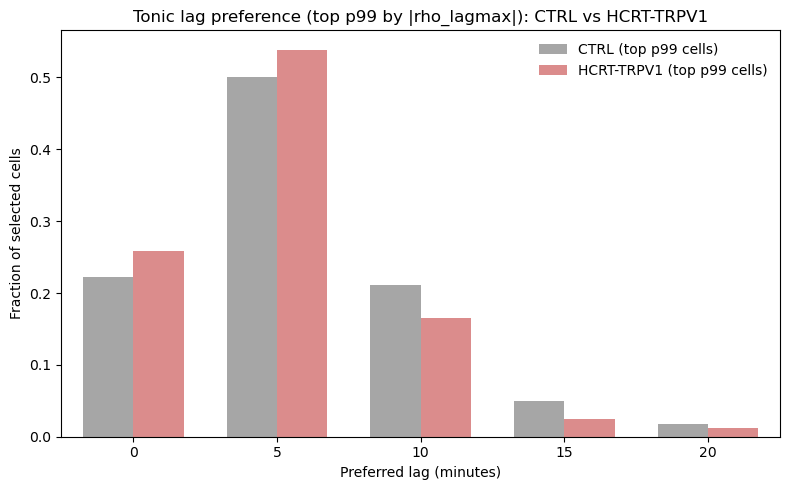

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/lag_pref_hist_side_by_side_TOPP99.png


In [27]:
# -------------------------
# CONFIG
# -------------------------
out_subdir = "figures"
fname = "lag_pref_hist_side_by_side_TOPP99.png"

use_abs_rho = True         # rank by |rho|
top_q = 0.99               # p99 = keep top 1%|

# -------------------------
# HELPERS
# -------------------------
def load_two_arrays(dir_ants_output, proj_ID, expt_ID):
    base = os.path.join(dir_ants_output, proj_ID, expt_ID)
    p_lag  = os.path.join(base, "rho_tonic_lag_argmax_sec.npy")
    p_rho  = os.path.join(base, "rho_tonic_lagmax.npy")
    if (not os.path.isfile(p_lag)) or (not os.path.isfile(p_rho)):
        return None, None, (p_lag, p_rho)

    lag = np.load(p_lag).astype(np.float32)   # per-cell argmax lag (sec)
    rho = np.load(p_rho).astype(np.float32)   # per-cell max rho (same length)

    # safety
    n = min(lag.size, rho.size)
    lag, rho = lag[:n], rho[:n]

    good = np.isfinite(lag) & np.isfinite(rho)
    lag, rho = lag[good], rho[good]
    if use_abs_rho:
        rho = np.abs(rho)

    return lag, rho, None

def pooled_lags_for_group(expt_ID_list, group_name):
    pooled = []
    missing = []
    for expt_ID in expt_ID_list:
        g, _ = get_group_meta(expt_ID)
        if g != group_name:
            continue
        lag, rho, miss = load_two_arrays(dir_ants_output, proj_ID, expt_ID)
        if miss is not None or lag is None or lag.size == 0:
            missing.append((expt_ID, miss))
            continue

        # p99 threshold within this fish
        thr = np.quantile(rho, top_q)
        keep = rho >= thr
        pooled.append(lag[keep])

    if len(pooled) == 0:
        return None, missing
    return np.concatenate(pooled), missing

def _group_color_from_expt_list(expt_IDs, default="k"):
    """
    Use the first expt_ID to infer group meta color via get_group_meta(expt_ID).
    Falls back to default if list is empty or meta missing.
    """
    if expt_IDs is None or len(expt_IDs) == 0:
        return default
    try:
        _, meta = get_group_meta(expt_IDs[0])
        return meta.get("color", default)
    except Exception:
        return default


# -------------------------
# DISCRETE BINS
# -------------------------
lag_vals_sec = np.arange(0, lag_max_sec + 1, lag_step_sec)  # [0,600,1200,1800,2400]
lag_vals_min = lag_vals_sec / 60.0
edges_min = np.r_[
    lag_vals_min[0] - (lag_step_sec/60)/2,
    (lag_vals_min[:-1] + lag_vals_min[1:]) / 2,
    lag_vals_min[-1] + (lag_step_sec/60)/2
]

# -------------------------
# LOAD FILTERED LAGS
# -------------------------
ctrl_lag_sec, miss_ctrl = pooled_lags_for_group(expt_ID_list, CTRL_TAG)
hcrt_lag_sec, miss_hcrt = pooled_lags_for_group(expt_ID_list, EXPT_TAG)

ctrl_lag_min = ctrl_lag_sec / 60.0
hcrt_lag_min = hcrt_lag_sec / 60.0

# fraction-of-cells histogram (within the selected top p99 cells)
hist_ctrl, _ = np.histogram(ctrl_lag_min, bins=edges_min)
hist_hcrt, _ = np.histogram(hcrt_lag_min, bins=edges_min)
hist_ctrl = hist_ctrl / max(hist_ctrl.sum(), 1)
hist_hcrt = hist_hcrt / max(hist_hcrt.sum(), 1)

# -------------------------
# PLOT SIDE-BY-SIDE
# -------------------------
bar_w = 0.35 * (lag_step_sec/60.0)
x = lag_vals_min

fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(x - bar_w/2, hist_ctrl, width=bar_w,
       color=PLOT_META[CTRL_TAG]["color"], alpha=PLOT_META[CTRL_TAG]["alpha"],
       label=f'{PLOT_META[CTRL_TAG]["label"]} (top p99 cells)')
ax.bar(x + bar_w/2, hist_hcrt, width=bar_w,
       color=PLOT_META[EXPT_TAG]["color"], alpha=PLOT_META[EXPT_TAG]["alpha"],
       label=f'{PLOT_META[EXPT_TAG]["label"]} (top p99 cells)')

ax.set_title(f"Tonic lag preference (top p99 by |rho_lagmax|): {CTRL_TAG} vs {EXPT_TAG}")
ax.set_xlabel("Preferred lag (minutes)")
ax.set_ylabel("Fraction of selected cells")
ax.set_xticks(x)
ax.set_xlim(edges_min[0], edges_min[-1])
ax.legend(frameon=False)

plt.tight_layout()

fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)
save_path = fig_dir / fname
fig.savefig(save_path, dpi=200)
plt.show()

print(f"✅ Saved: {save_path}")

if miss_ctrl or miss_hcrt:
    print("⚠️ Missing files:")
    for expt_ID, paths in (miss_ctrl + miss_hcrt):
        print("  ", expt_ID, "->", paths)


## 📊 d. Plot the mean trace of the high corrlated cells in each fish, seperated by preferred lag regressor (rho_tonic_lag_argmax_sec)

[pos] using common window length = 4440 frames (74.00 min)
[pos] using common window length = 4440 frames (74.00 min)
✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/spearman_mean_rho_by_lag_pos_rho_gt_0.900.png


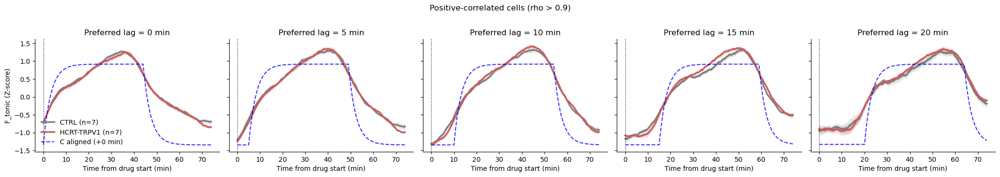

[neg] using common window length = 4440 frames (74.00 min)
[neg] using common window length = 4440 frames (74.00 min)
✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/spearman_mean_rho_by_lag_neg_rho_lt_-0.900.png


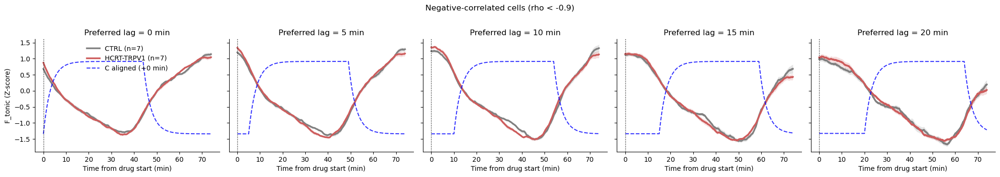

In [28]:
import os
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# Helpers
# -----------------------------
def _zscore_rows(X, eps=1e-6):
    mu = np.nanmean(X, axis=1, keepdims=True)
    sd = np.nanstd(X, axis=1, keepdims=True) + eps
    return (X - mu) / sd

def _sem(X, axis=0):
    return np.nanstd(X, axis=axis) / np.sqrt(np.sum(np.isfinite(X), axis=axis))

def _load_one_fish_arrays(dir_ants_output, proj_ID, expt_ID):
    base = os.path.join(dir_ants_output, proj_ID, expt_ID)
    Ft  = np.load(os.path.join(base, "data_array_f_tonic.npy"), mmap_mode="r")
    rho = np.load(os.path.join(base, "rho_tonic_lagmax.npy"))
    lag = np.load(os.path.join(base, "rho_tonic_lag_argmax_sec.npy"))
    C   = np.load(os.path.join(base, "C_capsaicin.npy"))
    return Ft, rho, lag, C

def _bin_lags(lag_sec, lag_bins_min=None, lag_step_sec=None):
    lag_min = lag_sec / 60.0

    if lag_bins_min is not None:
        lag_bins_min = np.asarray(lag_bins_min, dtype=float)
        idx = np.nanargmin(np.abs(lag_min[:, None] - lag_bins_min[None, :]), axis=1)
        return lag_bins_min[idx].astype(int)

    if lag_step_sec is None:
        raise ValueError("Provide either lag_bins_min or lag_step_sec.")
    step_min = lag_step_sec / 60.0
    return (np.round(lag_min / step_min) * step_min).astype(int)

def _aligned_regressor_segment(C, win_start, win_end, lag_sec, sampling_rate):
    T = C.shape[0]
    lag_frames = int(round(lag_sec * sampling_rate))

    t0 = max(win_start, lag_frames)
    t1 = min(win_end, T)
    if t1 <= t0:
        return None, None

    Cseg = C[t0 - lag_frames : t1 - lag_frames].astype(np.float32)
    Cseg = (Cseg - np.nanmean(Cseg)) / (np.nanstd(Cseg) + 1e-6)

    x_min = (np.arange(t0, t1) - win_start) / sampling_rate / 60.0
    return x_min, Cseg

def _group_color_from_expt_list(expt_IDs, default="k"):
    if expt_IDs is None or len(expt_IDs) == 0:
        return default
    try:
        _, meta = get_group_meta(expt_IDs[0])
        return meta.get("color", default)
    except Exception:
        return default

# -----------------------------
# NEW: selection by corr threshold
# -----------------------------
def _select_corr_indices(rho, pos_thresh=None, neg_thresh=None, mode="pos"):
    rho = np.asarray(rho, dtype=np.float32)

    if mode == "pos":
        if pos_thresh is None:
            raise ValueError("pos_thresh must be provided for mode='pos'")
        return np.where(rho > float(pos_thresh))[0]

    if mode == "neg":
        if neg_thresh is None:
            raise ValueError("neg_thresh must be provided for mode='neg'")
        return np.where(rho < float(neg_thresh))[0]

    raise ValueError("mode must be 'pos' or 'neg'.")

# -----------------------------
# Core: per-fish lag-binned mean traces
# -----------------------------
def collect_fish_level_traces_by_lag_thresholded(
    expt_IDs,
    dir_ants_output,
    proj_ID,
    sampling_rate,
    win_start_frame,
    win_end_frame,
    mode="pos",
    pos_thresh=None,
    neg_thresh=None,
    lag_bins_min=None,
    lag_step_sec=None,
    zscore_cells=True,
    min_cells_per_bin=3,
    verbose=True,
):
    """
    Returns
    -------
    fish_traces : dict
        lag_bin -> list of per-fish mean traces, all forced to same length
    C_ref : 1D array or None
        first available C_capsaicin
    """

    ws_req = int(round(win_start_frame))
    we_req = int(round(win_end_frame))
    if we_req <= ws_req:
        raise ValueError("win_end_frame must be > win_start_frame")

    per_fish_records = []
    C_ref = None
    valid_lengths = []

    # Pass 1: load and compute per-fish traces, record lengths
    for expt_ID in expt_IDs:
        Ft, rho, lag_sec, C = _load_one_fish_arrays(dir_ants_output, proj_ID, expt_ID)
        n_cells, T = Ft.shape

        if C_ref is None:
            C_ref = np.asarray(C).copy()

        ws = max(0, ws_req)
        we = min(we_req, T)

        if we <= ws:
            if verbose:
                print(f"Skipping {expt_ID}: requested window [{ws_req}, {we_req}) invalid for T={T}")
            continue

        idx_sel = _select_corr_indices(
            rho,
            pos_thresh=pos_thresh,
            neg_thresh=neg_thresh,
            mode=mode
        )
        if idx_sel.size == 0:
            continue

        lag_bins = _bin_lags(
            lag_sec[idx_sel],
            lag_bins_min=lag_bins_min,
            lag_step_sec=lag_step_sec
        )

        X_full = np.asarray(Ft[idx_sel, :])
        if zscore_cells:
            X_full = _zscore_rows(X_full)

        X = X_full[:, ws:we]
        if X.shape[1] == 0:
            continue

        per_bin_means = {}
        for lb in np.unique(lag_bins):
            m = (lag_bins == lb)
            if np.sum(m) < min_cells_per_bin:
                continue
            per_bin_means[int(lb)] = np.nanmean(X[m], axis=0).astype(np.float32)

        if len(per_bin_means) == 0:
            continue

        per_fish_records.append({
            "expt_ID": expt_ID,
            "T": T,
            "ws": ws,
            "we": we,
            "L": we - ws,
            "per_bin_means": per_bin_means,
        })
        valid_lengths.append(we - ws)

    if len(per_fish_records) == 0:
        return {}, C_ref

    # Force all fish traces to the same length
    common_L = min(valid_lengths)
    if verbose:
        print(f"[{mode}] using common window length = {common_L} frames ({common_L/sampling_rate/60:.2f} min)")

    fish_traces = {}
    for rec in per_fish_records:
        expt_ID = rec["expt_ID"]
        L = rec["L"]

        if L < common_L:
            continue

        for lb, tr in rec["per_bin_means"].items():
            tr = np.asarray(tr[:common_L], dtype=np.float32)
            fish_traces.setdefault(int(lb), []).append(tr)

    return fish_traces, C_ref

# -----------------------------
# Plot: per lag bin subplots
# -----------------------------
def plot_lag_binned_mean_traces_one_mode(
    ctrl_expt_IDs,
    hcrt_expt_IDs,
    dir_ants_output,
    proj_ID,
    sampling_rate,
    drug_start_frame,
    wash_end_frame,
    mode="pos",
    pos_thresh=None,
    neg_thresh=None,
    lag_bins_min=(0, 5, 10, 15, 20),
    lag_step_sec=None,
    zscore_cells=True,
    suptitle=None,
    save_prefix="spearman_mean_rho_by_lag",
):
    ctrl_by_lag, C_ctrl = collect_fish_level_traces_by_lag_thresholded(
        ctrl_expt_IDs,
        dir_ants_output,
        proj_ID,
        sampling_rate,
        drug_start_frame,
        wash_end_frame,
        mode=mode,
        pos_thresh=pos_thresh,
        neg_thresh=neg_thresh,
        lag_bins_min=lag_bins_min,
        lag_step_sec=lag_step_sec,
        zscore_cells=zscore_cells,
        verbose=True,
    )

    hcrt_by_lag, C_hcrt = collect_fish_level_traces_by_lag_thresholded(
        hcrt_expt_IDs,
        dir_ants_output,
        proj_ID,
        sampling_rate,
        drug_start_frame,
        wash_end_frame,
        mode=mode,
        pos_thresh=pos_thresh,
        neg_thresh=neg_thresh,
        lag_bins_min=lag_bins_min,
        lag_step_sec=lag_step_sec,
        zscore_cells=zscore_cells,
        verbose=True,
    )

    C_ref = C_ctrl if C_ctrl is not None else C_hcrt
    if C_ref is None:
        raise RuntimeError("No C_capsaicin.npy found in provided fish lists.")

    lag_keys = sorted(set(ctrl_by_lag.keys()) | set(hcrt_by_lag.keys()))
    if len(lag_keys) == 0:
        thr_str = f"pos>{pos_thresh}" if mode == "pos" else f"neg<{neg_thresh}"
        raise RuntimeError(f"No lag bins had enough cells to compute traces for mode={mode} ({thr_str}).")

    n = len(lag_keys)
    fig, axes = plt.subplots(1, n, figsize=(4.2 * n, 3.6), sharey=True)
    if n == 1:
        axes = [axes]

    ctrl_color = _group_color_from_expt_list(ctrl_expt_IDs, default="tab:blue")
    hcrt_color = _group_color_from_expt_list(hcrt_expt_IDs, default="tab:orange")

    # Need a common x length that matches actual traces after truncation
    all_lengths = []
    for lb in lag_keys:
        if lb in ctrl_by_lag:
            all_lengths.extend([len(x) for x in ctrl_by_lag[lb]])
        if lb in hcrt_by_lag:
            all_lengths.extend([len(x) for x in hcrt_by_lag[lb]])

    if len(all_lengths) == 0:
        raise RuntimeError("No valid traces found after truncation.")

    common_L = min(all_lengths)
    x_trace = np.arange(common_L) / sampling_rate / 60.0

    for ax, lb in zip(axes, lag_keys):
        if lb in ctrl_by_lag and len(ctrl_by_lag[lb]) > 0:
            A = np.vstack([np.asarray(x[:common_L]) for x in ctrl_by_lag[lb]])
            m = np.nanmean(A, axis=0)
            s = _sem(A, axis=0)
            ax.plot(x_trace, m, lw=2.5, color=ctrl_color, label=f"{CTRL_TAG} (n={A.shape[0]})")
            ax.fill_between(x_trace, m - s, m + s, color=ctrl_color, alpha=0.20, linewidth=0)

        if lb in hcrt_by_lag and len(hcrt_by_lag[lb]) > 0:
            A = np.vstack([np.asarray(x[:common_L]) for x in hcrt_by_lag[lb]])
            m = np.nanmean(A, axis=0)
            s = _sem(A, axis=0)
            ax.plot(x_trace, m, lw=2.5, color=hcrt_color, label=f"{EXPT_TAG} (n={A.shape[0]})")
            ax.fill_between(x_trace, m - s, m + s, color=hcrt_color, alpha=0.20, linewidth=0)

        lag_sec = float(lb) * 60.0
        xC, Cseg = _aligned_regressor_segment(
            C=C_ref,
            win_start=int(round(drug_start_frame)),
            win_end=int(round(drug_start_frame)) + common_L,
            lag_sec=lag_sec,
            sampling_rate=sampling_rate,
        )
        if xC is not None and len(Cseg) == len(xC):
            ax.plot(xC, Cseg, lw=1.5, ls="--", color="blue", alpha=0.8, label=f"C aligned (+{lb} min)")

        ax.axvline(0, color="k", lw=1, ls=":")
        ax.set_title(f"Preferred lag = {lb} min")
        ax.set_xlabel("Time from drug start (min)")
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

    axes[0].set_ylabel("F_tonic (Z-score)")
    axes[0].legend(loc="best", frameon=False)

    if suptitle is None:
        if mode == "pos":
            suptitle = f"Cells with rho > {pos_thresh}, grouped by preferred lag (drug+wash window)"
        else:
            suptitle = f"Cells with rho < {neg_thresh}, grouped by preferred lag (drug+wash window)"
    fig.suptitle(suptitle, y=1.02)
    fig.tight_layout()

    fig_dir = os.path.join(dir_ants_output, proj_ID, "figures")
    os.makedirs(fig_dir, exist_ok=True)

    if mode == "pos":
        tag = f"pos_rho_gt_{pos_thresh:.3f}"
    else:
        tag = f"neg_rho_lt_{neg_thresh:.3f}"

    savepath = os.path.join(fig_dir, f"{save_prefix}_{tag}.png")
    fig.savefig(savepath, dpi=300, bbox_inches="tight")
    print(f"✅ Saved: {savepath}")
    plt.show()

    return fig

# -----------------------------
# Wrapper: make TWO separate plots
# -----------------------------
def plot_lag_binned_mean_traces_pos_and_neg(
    ctrl_expt_IDs,
    hcrt_expt_IDs,
    dir_ants_output,
    proj_ID,
    sampling_rate,
    drug_start_frame,
    wash_end_frame,
    pos_thresh=0.6,
    neg_thresh=-0.6,
    lag_bins_min=(0, 5, 10, 15, 20),
    lag_step_sec=None,
    zscore_cells=True,
):
    fig_pos = plot_lag_binned_mean_traces_one_mode(
        ctrl_expt_IDs,
        hcrt_expt_IDs,
        dir_ants_output,
        proj_ID,
        sampling_rate,
        drug_start_frame,
        wash_end_frame,
        mode="pos",
        pos_thresh=pos_thresh,
        neg_thresh=neg_thresh,
        lag_bins_min=lag_bins_min,
        lag_step_sec=lag_step_sec,
        zscore_cells=zscore_cells,
        suptitle=f"Positive-correlated cells (rho > {pos_thresh})",
        save_prefix="spearman_mean_rho_by_lag",
    )

    fig_neg = plot_lag_binned_mean_traces_one_mode(
        ctrl_expt_IDs,
        hcrt_expt_IDs,
        dir_ants_output,
        proj_ID,
        sampling_rate,
        drug_start_frame,
        wash_end_frame,
        mode="neg",
        pos_thresh=pos_thresh,
        neg_thresh=neg_thresh,
        lag_bins_min=lag_bins_min,
        lag_step_sec=lag_step_sec,
        zscore_cells=zscore_cells,
        suptitle=f"Negative-correlated cells (rho < {neg_thresh})",
        save_prefix="spearman_mean_rho_by_lag",
    )

    return fig_pos, fig_neg

# --- RUN ---
fig_pos, fig_neg = plot_lag_binned_mean_traces_pos_and_neg(
    ctrl_expt_IDs=ctrl_expt_ID_list,
    hcrt_expt_IDs=hcrt_expt_ID_list,
    dir_ants_output=dir_ants_output,
    proj_ID=proj_ID,
    sampling_rate=volume_per_sec,
    drug_start_frame=drug_start,
    wash_end_frame=wash_end,
    pos_thresh=0.9,
    neg_thresh=-0.9,
    lag_bins_min=(0, 5, 10, 15, 20),
    zscore_cells=True,
)
plt.show()

## 📊 e. Plot individual cells with ranked-corr. > pos_rho_thresh in each lagged regressor 

Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/spearman_CTRL_cells_rho_0.9_bylag.png


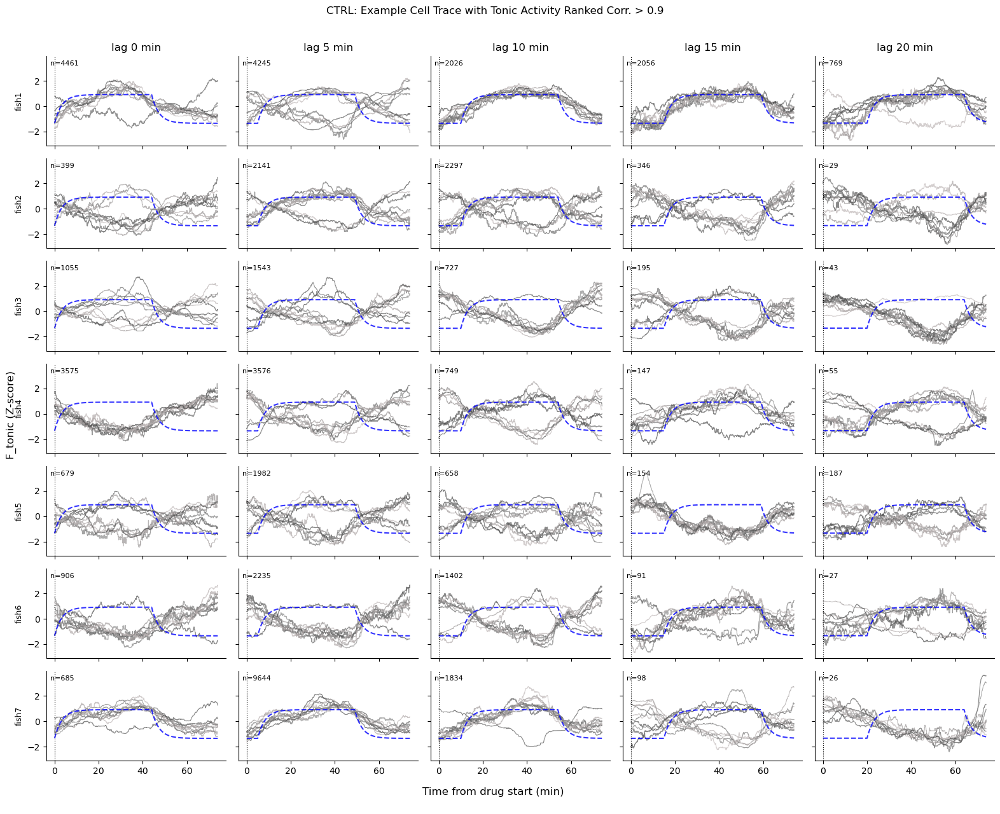

Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/spearman_HCRT_cells_rho_0.9_bylag.png


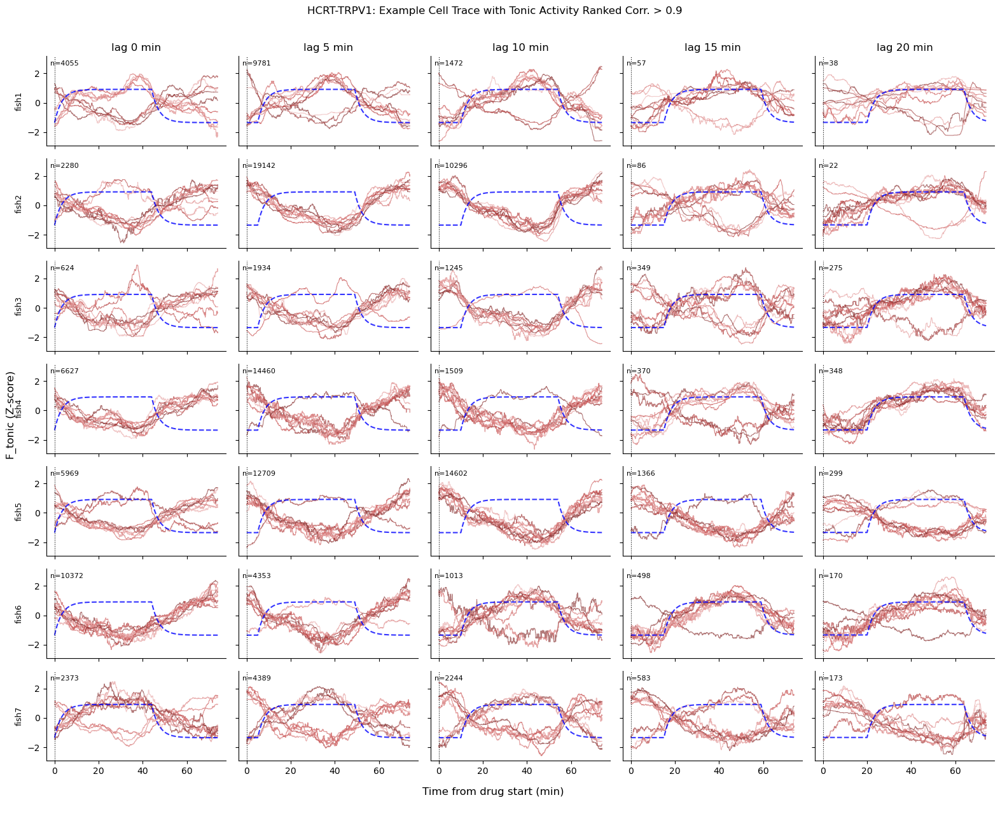

In [29]:
import os
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# helpers
# -----------------------------
def _zscore_1d(x, eps=1e-6):
    x = np.asarray(x, dtype=np.float32)
    return (x - np.nanmean(x)) / (np.nanstd(x) + eps)

def _zscore_rows(X, eps=1e-6):
    mu = np.nanmean(X, axis=1, keepdims=True)
    sd = np.nanstd(X, axis=1, keepdims=True) + eps
    return (X - mu) / sd

def _bin_lags_to_minutes(lag_sec, lag_bins_min=(0,10,20,30,40)):
    lag_bins_min = np.asarray(lag_bins_min, dtype=float)
    lag_min = np.asarray(lag_sec, dtype=float) / 60.0
    idx = np.nanargmin(np.abs(lag_min[:, None] - lag_bins_min[None, :]), axis=1)
    return lag_bins_min[idx].astype(int)

def _aligned_regressor_segment(C, win_start, win_end, lag_min, sampling_rate):
    """
    For your lag definition: correlate Ft[t] with C[t-lag]
    so aligned regressor (same time axis as Ft window) is C[t-lag].
    """
    T = C.shape[0]
    lag_frames = int(round((lag_min * 60.0) * sampling_rate))

    t0 = max(win_start, lag_frames)   # ensure t-lag >= 0
    t1 = min(win_end, T)
    if t1 <= t0:
        return None, None

    Cseg = C[t0 - lag_frames : t1 - lag_frames].astype(np.float32)
    Cseg = _zscore_1d(Cseg)

    x_min = (np.arange(t0, t1) - win_start) / sampling_rate / 60.0
    return x_min, Cseg

def _load_one_fish(dir_ants_output, proj_ID, expt_ID):
    base = os.path.join(dir_ants_output, proj_ID, expt_ID)
    Ft  = np.load(os.path.join(base, "data_array_f_tonic.npy"), mmap_mode="r")
    rho = np.load(os.path.join(base, "rho_tonic_lagmax.npy")).astype(np.float32)
    lag = np.load(os.path.join(base, "rho_tonic_lag_argmax_sec.npy")).astype(np.float32)
    C   = np.load(os.path.join(base, "C_capsaicin.npy")).astype(np.float32)
    return Ft, rho, lag, C

import matplotlib.colors as mcolors
import colorsys

def _clamp01(x):
    return max(0.0, min(1.0, float(x)))

def make_shades_around_color(base_color, n=9, span=0.22, vary_saturation=0.08):
    """
    Create a palette of n colors centered around base_color by varying lightness
    (and a tiny bit of saturation) in HLS space.

    base_color: anything matplotlib understands (hex, rgb tuple, color name)
    n: number of shades
    span: +/- lightness range around the base lightness (0..1). 0.22 is a nice default.
    vary_saturation: +/- saturation wiggle (small) to avoid looking monotone.

    Returns: list of RGB tuples.
    """
    rgb = mcolors.to_rgb(base_color)
    h, l, s = colorsys.rgb_to_hls(*rgb)

    # symmetric offsets around 0
    if n <= 1:
        return [rgb]

    offsets = np.linspace(-span, span, n)

    # also wiggle saturation slightly (optional)
    soff = np.linspace(-vary_saturation, vary_saturation, n)

    out = []
    for dl, ds in zip(offsets, soff):
        l2 = _clamp01(l + dl)
        s2 = _clamp01(s + ds)
        out.append(colorsys.hls_to_rgb(h, l2, s2))
    return out



# -----------------------------
# core plotting
# -----------------------------
def plot_cell_traces_by_fish_and_lag(
    expt_ID_list,
    dir_ants_output,
    proj_ID,
    sampling_rate,
    drug_start_frame,
    wash_end_frame,
    rho_pos_thresh=0.95,
    lag_bins_min=(0,10,20),
    zscore_mode="full",             # "full" (recommended) or "window"
    max_cells_per_subplot=200,      # cap so plots remain usable
    alpha_trace=0.8,
    lw_trace=0.8,
    fig_title="",
    savepath=None,
):
    """
    Rows: fish
    Cols: lag bins
    Each subplot: individual cell traces for cells with rho_lagmax > rho_pos_thresh
                 AND whose argmax lag bins to that column
    Also overlay C(t-lag) aligned to the drug+wash window.
    """

    lag_bins_min = tuple(int(x) for x in lag_bins_min)
    n_fish = len(expt_ID_list)
    n_lag  = len(lag_bins_min)

    # window clamp
    ws = int(round(drug_start_frame))
    we = int(round(wash_end_frame))
    if we <= ws:
        raise ValueError(f"Bad window: drug_start={ws}, wash_end={we}")

    fig, axes = plt.subplots(
        n_fish, n_lag,
        figsize=(3.2*n_lag, 1.8*n_fish),
        sharex=True, sharey=True
    )
    if n_fish == 1:
        axes = np.expand_dims(axes, axis=0)
    if n_lag == 1:
        axes = np.expand_dims(axes, axis=1)

    for r, expt_ID in enumerate(expt_ID_list):
        Ft, rho, lag_sec, C = _load_one_fish(dir_ants_output, proj_ID, expt_ID)
        group, meta = get_group_meta(expt_ID)
        trace_color = meta["color"]
        trace_alpha = 0.8
        
        # palette around the meta color
        palette = make_shades_around_color(
            trace_color,
            n=9,          # number of distinct shades available
            span=0.22,    # how far lighter/darker you go
            vary_saturation=0.06
        )


        n_cells, T = Ft.shape

        ws_i = int(np.clip(ws, 0, T))
        we_i = int(np.clip(we, 0, T))
        if we_i <= ws_i:
            continue

        # select strong positive trackers (based on rho_lagmax, not abs)
        idx = np.where(abs(rho) > rho_pos_thresh)[0]
        if idx.size == 0:
            # annotate row as empty
            for c in range(n_lag):
                ax = axes[r, c]
                ax.text(0.5, 0.5, "no cells", transform=ax.transAxes,
                        ha="center", va="center", fontsize=8)
            continue

        # bin lags for these cells
        lag_bins = _bin_lags_to_minutes(lag_sec[idx], lag_bins_min=lag_bins_min)

        # load traces
        # zscore mode:
        # - "full": z-score per cell using full 120min trace, then plot window segment
        # - "window": z-score per cell using only [drug_start:wash_end)
        if zscore_mode == "full":
            X_full = np.asarray(Ft[idx, :])           # (n_sel, T)
            X_full = _zscore_rows(X_full)
            X = X_full[:, ws_i:we_i]                 # (n_sel, T_win)
        elif zscore_mode == "window":
            X = np.asarray(Ft[idx, ws_i:we_i])       # (n_sel, T_win)
            X = _zscore_rows(X)
        else:
            raise ValueError("zscore_mode must be 'full' or 'window'")

        # x-axis for traces (minutes from drug start)
        x_trace = np.arange(we_i - ws_i) / sampling_rate / 60.0

        for c, lag_min in enumerate(lag_bins_min):
            ax = axes[r, c]
            m = (lag_bins == lag_min)
            n_bin = int(np.sum(m))

            if n_bin > 0:
                Xbin = X[m]
                # cap number of plotted cells
                if Xbin.shape[0] > max_cells_per_subplot:
                    # deterministic subsample to keep stable
                    pick = np.linspace(0, Xbin.shape[0]-1, max_cells_per_subplot).astype(int)
                    Xbin = Xbin[pick]

                for k in range(Xbin.shape[0]):
                    ax.plot(
                        x_trace,
                        Xbin[k],
                        color=palette[k % len(palette)],
                        alpha=trace_alpha * alpha_trace,
                        lw=lw_trace,
                    )


            # overlay aligned regressor C(t-lag)
            xC, Cseg = _aligned_regressor_segment(
                C=C, win_start=ws_i, win_end=we_i,
                lag_min=lag_min, sampling_rate=sampling_rate
            )
            if xC is not None:
                ax.plot(xC, Cseg, ls="--", lw=1.5, color="blue", alpha=0.8)

            # cosmetics
            if r == 0:
                ax.set_title(f"lag {lag_min} min", fontsize=12)
            if c == 0:
                ax.set_ylabel(f"fish{r+1}", fontsize=9)

            ax.axvline(0, color="k", lw=0.8, ls=":")
            ax.spines["top"].set_visible(False)
            ax.spines["right"].set_visible(False)

            # small count label
            ax.text(0.02, 0.95, f"n={n_bin}", transform=ax.transAxes,
                    ha="left", va="top", fontsize=8)

    fig.suptitle(fig_title if fig_title else f"Cells with rho_lagmax > {rho_pos_thresh} grouped by preferred lag", y=1.01)
    fig.supxlabel("Time from drug start (min) \n  ")
    fig.supylabel("F_tonic (Z-score)")
    fig.tight_layout()

    if savepath is not None:
        fig.savefig(savepath, dpi=300, bbox_inches="tight")
        print(f"Saved: {savepath}")

    return fig


# -----------------------------
# RUN: make two figures
# -----------------------------
rho_pos_thresh = 0.9
lag_bins_min = (0, 5,10,15,20)

# control figure
fig_ctrl = plot_cell_traces_by_fish_and_lag(
    expt_ID_list=ctrl_expt_ID_list,
    dir_ants_output=dir_ants_output,
    proj_ID=proj_ID,
    sampling_rate=volume_per_sec,
    drug_start_frame=drug_start,
    wash_end_frame=wash_end,
    rho_pos_thresh=rho_pos_thresh,
    lag_bins_min=lag_bins_min,
    zscore_mode="full",
    max_cells_per_subplot=10,
    fig_title=f"{CTRL_TAG}: Example Cell Trace with Tonic Activity Ranked Corr. > {rho_pos_thresh}",
    savepath=os.path.join(dir_ants_output, proj_ID, "figures", f"spearman_CTRL_cells_rho_{rho_pos_thresh}_bylag.png"),
)
plt.show()

# experimental figure
fig_hcrt = plot_cell_traces_by_fish_and_lag(
    expt_ID_list=hcrt_expt_ID_list,
    dir_ants_output=dir_ants_output,
    proj_ID=proj_ID,
    sampling_rate=volume_per_sec,
    drug_start_frame=drug_start,
    wash_end_frame=wash_end,
    rho_pos_thresh=rho_pos_thresh,
    lag_bins_min=lag_bins_min,
    zscore_mode="full",
    max_cells_per_subplot=10,
    fig_title=f"{EXPT_TAG}: Example Cell Trace with Tonic Activity Ranked Corr. > {rho_pos_thresh}",
    savepath=os.path.join(dir_ants_output, proj_ID, "figures", f"spearman_HCRT_cells_rho_{rho_pos_thresh}_bylag.png"),
)
plt.show()


# ⭕️ STEP 3: Tonic-GLM: model fitting per cell

$$
F_i(t)
=
\underbrace{
\sum_{\tau=0}^{K-1} h_i(\tau)\, C(t-\tau)
}_{\text{drug-locked kernel}}
\;+\;
\underbrace{
\sum_j \beta_{i,j} B_j(t)
}_{\text{slow drift}}
\;+\;
\epsilon(t)
$$
This only defines:

- the **design matrix**
  
  $$
  X = \big[\, C(t)\;\; B_1(t)\;\; B_2(t)\;\; \cdots \,\big]
  $$

- the **parameters**
  
  $$
  \theta_i =
  \begin{bmatrix}
  h_i \\
  \beta_{i,1} \\
  \beta_{i,2} \\
  \vdots
  \end{bmatrix}
  $$

estimation model:
$$
\hat{\theta}_i
=
\arg\min_{\theta}
\left\|
F_i - X\theta
\right\|_2^2
\;+\;
\lambda
\left\|
\theta
\right\|_2^2
$$


## 1. Define Helper functions

In [7]:
# ==============================
# Kernel ridge GLM with:
#   (A) per-fish CV
#   (B) automatic GLOBAL hyperparams:
#       K_global     = max(K_best across fish)
#       drift_global = max(drift_order_best across fish)
#       lam_global   = median(lam_best across fish)
#   (C) final refit on ALL cells using GLOBAL hyperparams
#
# Drop-in block: copy/paste whole thing.
# Outputs per fish (in expt folder):
#   - kernel_ridge_best_params.json      (per-fish CV best)
#   - kernel_ridge_cv_table.json         (per-fish CV grid results)
#   - kernel_ridge_global_params.json    (global hyperparams used)
#   - kernel_h_hat.npy                  (GLOBAL fit)  shape (n_cells, K_global)
#   - kernel_beta_hat.npy               (GLOBAL fit)  shape (n_cells, nb_global)
#   - kernel_fit_r2.npy                 (GLOBAL fit R^2 per cell)
#   - C_capsaicin.npy, dC_capsaicin.npy
#   - kernel_ridge_meta.txt
# ==============================

import os, json, gc
import numpy as np
from pathlib import Path
from tqdm.auto import tqdm


def shift_with_zeros(u, shift_frames):
    u = np.asarray(u, dtype=np.float32)
    T = u.shape[0]
    s = int(shift_frames)
    if s == 0:
        return u.copy()
    if s > 0:
        out = np.zeros(T, dtype=np.float32)
        out[s:] = u[:-s]
        return out
    else:
        s = -s
        out = np.zeros(T, dtype=np.float32)
        out[:-s] = u[s:]
        return out

def make_param_tag(K_global, drift_global, lam_global, input_tag="dC", lag_global=0):
    """
    lag_global: integer frames (>=0)
    """
    return (
        f"in{input_tag}_"
        f"K{int(K_global)}_"
        f"drift{int(drift_global)}_"
        f"lam{float(lam_global):.3g}_"
        f"lag{int(lag_global)}"
    )


def get_run_dir(
    dir_ants_output, proj_ID, expt_ID,
    K_global, drift_global, lam_global,
    input_tag="dC",
    lag_global=0,
    null_tag=None,   # NEW
):
    """
    Returns:
      base_dir: per-fish directory (shared across runs)
      out_dir : parameterized run directory (unique per hyperparam + null)
    """
    base_dir = Path(dir_ants_output) / proj_ID / expt_ID
    base_dir.mkdir(parents=True, exist_ok=True)

    param_tag = make_param_tag(
        K_global=K_global,
        drift_global=drift_global,
        lam_global=lam_global,
        input_tag=input_tag,
        lag_global=lag_global,
    )

    if null_tag is not None:
        param_tag = f"{param_tag}__null-{null_tag}"

    out_dir = base_dir / "glm" / param_tag
    out_dir.mkdir(parents=True, exist_ok=True)
    return base_dir, out_dir

    
# ----------------------------------------
# Capsaicin concentration + delta
# ----------------------------------------
def build_capsaicin_concentration(
    T,
    sampling_rate_hz,
    drug_start_frame,
    drug_end_frame,
    drug_uM=10.0,
    V_ml=15.0,
    Q_ml_min=4.5,
):
    drug_start_frame = int(np.clip(drug_start_frame, 0, T))
    drug_end_frame   = int(np.clip(drug_end_frame,   0, T))

    dt_min = (1.0 / sampling_rate_hz) / 60.0
    k = Q_ml_min / V_ml  # per minute

    Cin = np.zeros(T, dtype=np.float32)
    Cin[drug_start_frame:drug_end_frame] = np.float32(drug_uM)

    C = np.zeros(T, dtype=np.float32)
    for t in range(1, T):
        C[t] = C[t-1] + (k * (Cin[t-1] - C[t-1]) * dt_min)
    return C


def delta_signal(x):
    """Δx(t) = x(t) - x(t-1), with Δx(0)=0."""
    x = np.asarray(x, dtype=np.float32)
    dx = np.zeros_like(x, dtype=np.float32)
    dx[1:] = x[1:] - x[:-1]
    return dx


def get_fit_window_indices(
    T_full,
    sampling_rate_hz,
    drug_start_frame_full,
    fit_baseline_sec= INCLUDED_BASELINE * 60,
):
    """
    Fit window = [drug_start - baseline, end_of_record)
    """
    fit_start = int(round(drug_start_frame_full - fit_baseline_sec * sampling_rate_hz))
    fit_start = int(np.clip(fit_start, 0, T_full))
    fit_end   = int(T_full)
    if fit_end <= fit_start:
        raise ValueError("Invalid fit window.")
    drug_start_fit = int(drug_start_frame_full - fit_start)
    return fit_start, fit_end, drug_start_fit




# ----------------------------------------
# Build design: convolution U(dC) and drift B
# ----------------------------------------
def build_U_from_input(u, K):
    """
    u: (T,) input signal (NOW: C(t), previously: dC(t))
    returns U: (T, K), where U[t, k] = u[t-k] if t-k>=0 else 0
    """
    u = np.asarray(u, dtype=np.float32)
    T = u.shape[0]
    U = np.zeros((T, K), dtype=np.float32)
    for k in range(K):
        U[k:, k] = u[:T-k]
    return U



def build_poly_drift_basis(T, order):
    """
    Polynomial drift basis with time normalized to [-1,1].
    Includes intercept (degree 0).
    Returns B: (T, order+1)
    """
    t = np.linspace(-1, 1, T, dtype=np.float32)
    cols = [np.ones(T, dtype=np.float32)]
    for p in range(1, order + 1):
        cols.append(t**p)
    B = np.stack(cols, axis=1).astype(np.float32)
    return B


# ----------------------------------------
# Ridge: standardize X, fit in chunks
# ----------------------------------------
def standardize_X_train_apply(X_train, X_test=None, eps=1e-8):
    mu = X_train.mean(axis=0, keepdims=True)
    sd = X_train.std(axis=0, keepdims=True) + eps
    Xtr = (X_train - mu) / sd
    if X_test is None:
        return Xtr, (mu, sd), None
    Xte = (X_test - mu) / sd
    return Xtr, (mu, sd), Xte


def ridge_fit_predict_chunked(
    X_train, Y_train,
    X_test=None,
    lam=1.0,
    chunk_cells=2000,
    pbar=None,
    show_progress=False,
    desc="ridge fit (cells)",
):
    """
    X_train: (Ttr, P)
    Y_train: (n_cells, Ttr)  <-- cells x time
    X_test : (Tte, P) or None

    Returns:
      W_hat: (n_cells, P)
      Yhat_test: (n_cells, Tte) if X_test provided
    """
    Ttr, P = X_train.shape
    n_cells = Y_train.shape[0]

    XtX = X_train.T @ X_train  # (P,P)
    A = XtX + lam * np.eye(P, dtype=np.float32)

    W_hat = np.zeros((n_cells, P), dtype=np.float32)
    Yhat_test = None
    if X_test is not None:
        Yhat_test = np.zeros((n_cells, X_test.shape[0]), dtype=np.float32)

    close_local = False
    if (pbar is None) and show_progress:
        pbar = tqdm(total=n_cells, desc=desc, unit="cell", leave=False)
        close_local = True

    for s in range(0, n_cells, chunk_cells):
        e = min(s + chunk_cells, n_cells)

        Yc = Y_train[s:e].T.astype(np.float32)      # (Ttr, n_chunk)
        RHS = X_train.T @ Yc                        # (P, n_chunk)

        Wc = np.linalg.solve(A, RHS).astype(np.float32)  # (P, n_chunk)
        W_hat[s:e] = Wc.T

        if X_test is not None:
            Yhat_test[s:e] = (X_test @ Wc).T

        if pbar is not None:
            pbar.update(e - s)

    if close_local:
        pbar.close()

    return W_hat, Yhat_test


def r2_score_per_cell(Y, Yhat, eps_var=1e-8):
    # Y, Yhat: (n_cells, T)
    Y = np.asarray(Y, dtype=np.float32)
    Yhat = np.asarray(Yhat, dtype=np.float32)

    ybar = Y.mean(axis=1, keepdims=True)
    sst = ((Y - ybar)**2).sum(axis=1)
    sse = ((Y - Yhat)**2).sum(axis=1)

    r2 = 1.0 - (sse / (sst + 1e-12))

    # kill degenerate traces
    r2[sst < eps_var] = np.nan
    return r2



# ----------------------------------------
# Time-block CV
# ----------------------------------------
def make_time_blocks(T, block_len_sec, sampling_rate_hz):
    block_len = int(round(block_len_sec * sampling_rate_hz))
    if block_len < 10:
        raise ValueError("Block too small.")
    edges = list(range(0, T, block_len))
    blocks = []
    for b0 in edges:
        b1 = min(T, b0 + block_len)
        if b1 - b0 >= 10:
            blocks.append((b0, b1))
    return blocks


def cv_select_hyperparams(
    Y,                # (n_cells, Tfit)
    dC,               # (Tfit,)
    K_list,
    drift_orders,
    lam_list,
    sampling_rate_hz=1.0,
    block_len_sec=10*60,
    n_cells_cv=2000,
    seed=0,
    chunk_cells=500,
    verbose=False,
    show_progress=True,
    desc="CV grid",
):
    """
    Returns: best(dict), results(list of dict), idx_cv (or None)
    best['score'] is mean across folds of median(per-cell R^2) on held-out blocks.
    """
    rng = np.random.default_rng(seed)
    n_cells, Tfit = Y.shape

    if (n_cells_cv is not None) and (n_cells > n_cells_cv):
        idx = rng.choice(n_cells, size=n_cells_cv, replace=False)
        Ycv = Y[idx]
    else:
        idx = None
        Ycv = Y

    blocks = make_time_blocks(Tfit, block_len_sec, sampling_rate_hz)
    if len(blocks) < 3:
        raise ValueError("Need at least ~3 time blocks for CV.")

    results = []
    best = {"score": -np.inf, "K": None, "drift_order": None, "lam": None}

    total = len(K_list) * len(drift_orders) * len(lam_list)
    it = tqdm(total=total, desc=desc, unit="combo", leave=False) if show_progress else None

    for K in K_list:
        U = build_U_from_input(dC, K)  # (Tfit, K)
        for drift_order in drift_orders:
            B = build_poly_drift_basis(Tfit, drift_order)  # (Tfit, nb)
            X_full = np.concatenate([U, B], axis=1).astype(np.float32)  # (Tfit, P)

            for lam in lam_list:
                fold_scores = []

                for (b0, b1) in blocks:
                    test_mask = np.zeros(Tfit, dtype=bool)
                    test_mask[b0:b1] = True
                    train_mask = ~test_mask

                    Xtr = X_full[train_mask]
                    Xte = X_full[test_mask]

                    Xtr_z, (mu, sd), Xte_z = standardize_X_train_apply(Xtr, Xte)

                    Ytr = Ycv[:, train_mask]
                    Yte = Ycv[:, test_mask]

                    _, Yhat = ridge_fit_predict_chunked(
                        X_train=Xtr_z,
                        Y_train=Ytr,
                        X_test=Xte_z,
                        lam=lam,
                        chunk_cells=chunk_cells,
                    )
                    r2 = r2_score_per_cell(Yte, Yhat)
                    fold_scores.append(np.nanmedian(r2))

                score = float(np.nanmean(fold_scores))
                results.append({
                    "K": int(K),
                    "drift_order": int(drift_order),
                    "lam": float(lam),
                    "cv_r2_median": score
                })

                if verbose:
                    print(f"   K={K:4d}, drift={drift_order}, lam={lam:.2e} -> CV median R2={score:.6f}")

                if score > best["score"]:
                    best.update({"score": score, "K": int(K), "drift_order": int(drift_order), "lam": float(lam)})

                if it is not None:
                    it.update(1)

    if it is not None:
        it.close()

    return best, results, idx


# ----------------------------------------
# Phase A: per-fish CV only (save best params + CV table)
# ----------------------------------------
def cv_one_fish_save(
    proj_ID,
    expt_ID,
    dir_ants_output,
    sampling_rate_hz,
    drug_start_frame_full,
    drug_end_frame_full,
    drug_uM=10.0,
    V_ml=15.0,
    Q_ml_min=4.5,
    K_list=(60, 120, 300, 600, 900, 1200),
    drift_orders=(1, 2, 3),
    lam_list=(1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3),
    block_len_sec=10*60,
    n_cells_cv=2000,
    seed=0,
    chunk_cells_cv=500,
    overwrite=False,
    show_progress=True,
    verbose_cv=False,
):
    out_dir = Path(dir_ants_output) / proj_ID / expt_ID
    out_dir.mkdir(parents=True, exist_ok=True)

    Ft_path = out_dir / "data_array_f_tonic.npy"
    if not Ft_path.exists():
        raise FileNotFoundError(f"Missing: {Ft_path}")

    params_path  = out_dir / "kernel_ridge_best_params.json"
    cvtable_path = out_dir / "kernel_ridge_cv_table.json"
    C_path       = out_dir / "C_capsaicin.npy"
    dC_path      = out_dir / "dC_capsaicin.npy"
    meta_path    = out_dir / "kernel_ridge_meta.txt"

    if (not overwrite) and params_path.exists() and cvtable_path.exists():
        return {"expt_ID": expt_ID, "status": "skipped_cv"}

    print(f"▶️  {expt_ID}: CV start")

    Ft = np.load(Ft_path, mmap_mode="r")  # (n_cells, Tfull)
    n_cells, Tfull = Ft.shape

    C_full = build_capsaicin_concentration(
        T=Tfull,
        sampling_rate_hz=sampling_rate_hz,
        drug_start_frame=int(round(drug_start_frame_full)),
        drug_end_frame=int(round(drug_end_frame_full)),
        drug_uM=drug_uM,
        V_ml=V_ml,
        Q_ml_min=Q_ml_min,
    )
    dC_full = delta_signal(C_full)

    np.save(C_path, C_full.astype(np.float32))
    np.save(dC_path, dC_full.astype(np.float32))

    fit_start, fit_end, drug_start_fit = get_fit_window_indices(
        T_full=Tfull,
        sampling_rate_hz=sampling_rate_hz,
        drug_start_frame_full=drug_start_frame_full,
        fit_baseline_sec=15*60,
    )

    Y_fit = np.asarray(Ft[:, fit_start:fit_end], dtype=np.float32)
    dC_fit = dC_full[fit_start:fit_end].astype(np.float32)
    Tfit = Y_fit.shape[1]

    best, cv_table, idx_cv = cv_select_hyperparams(
        Y=Y_fit,
        dC=dC_fit,
        K_list=K_list,
        drift_orders=drift_orders,
        lam_list=lam_list,
        sampling_rate_hz=sampling_rate_hz,
        block_len_sec=block_len_sec,
        n_cells_cv=n_cells_cv,
        seed=seed,
        chunk_cells=chunk_cells_cv,
        verbose=verbose_cv,
        show_progress=show_progress,
        desc=f"CV {expt_ID}",
    )

    with open(params_path, "w") as f:
        json.dump(best, f, indent=2)
    with open(cvtable_path, "w") as f:
        json.dump(cv_table, f, indent=2)

    # write / refresh meta (we’ll append global info later)
    with open(meta_path, "w") as f:
        f.write(f"expt_ID={expt_ID}\n")
        f.write(f"sampling_rate_hz={sampling_rate_hz}\n")
        f.write(f"Tfull={Tfull}\n")
        f.write(f"fit_start={fit_start}\n")
        f.write(f"fit_end={fit_end}\n")
        f.write(f"Tfit={Tfit}\n")
        f.write(f"drug_start_full={drug_start_frame_full}\n")
        f.write(f"drug_end_full={drug_end_frame_full}\n")
        f.write(f"drug_start_fit={drug_start_fit}\n")
        f.write("model=F=U_dC*h + B*beta + eps\n")
        f.write(f"K_best={int(best['K'])}\n")
        f.write(f"drift_order_best={int(best['drift_order'])}\n")
        f.write(f"lambda_best={float(best['lam'])}\n")
        f.write(f"block_len_sec={block_len_sec}\n")
        f.write(f"n_cells_cv={n_cells_cv}\n")
        f.write(f"best_cv_score={float(best['score'])}\n")

    print(f"✅ {expt_ID}: CV done | best K={best['K']}, drift={best['drift_order']}, lam={best['lam']:.2e}, CV={best['score']:.6f}")

    del Ft, Y_fit, dC_full, dC_fit
    gc.collect()

    return {"expt_ID": expt_ID, "status": "ok_cv", "best": best}


# ----------------------------------------
# Phase B: choose globals from saved per-fish best params
# ----------------------------------------
def choose_global_params_from_saved(
    proj_ID,
    expt_ID_list,
    dir_ants_output,
):
    K_list, drift_list, lam_list = [], [], []
    missing = []

    for expt_ID in expt_ID_list:
        p = Path(dir_ants_output) / proj_ID / expt_ID / "kernel_ridge_best_params.json"
        if not p.exists():
            missing.append(expt_ID)
            continue
        with open(p, "r") as f:
            b = json.load(f)
        K_list.append(int(b["K"]))
        drift_list.append(int(b["drift_order"]))
        lam_list.append(float(b["lam"]))

    if missing:
        raise FileNotFoundError(f"Missing kernel_ridge_best_params.json for {len(missing)} fish: {missing[:5]} ...")

    K_global = int(np.max(K_list))
    drift_global = int(np.max(drift_list))
    lam_global = float(np.median(lam_list))  # user request: median(lambda)

    return {"K_global": K_global, "drift_global": drift_global, "lam_global": lam_global,
            "K_bests": K_list, "drift_bests": drift_list, "lam_bests": lam_list}


# -----------------------------
# Helper: causal lag (zero-fill)
# -----------------------------
def shift_with_zeros(u, shift_frames):
    """
    shift_frames > 0: delay u by shift_frames (pad zeros at start)
    shift_frames < 0: advance u by -shift_frames (pad zeros at end)
    """
    u = np.asarray(u, dtype=np.float32).reshape(-1)
    T = u.shape[0]
    s = int(shift_frames)
    if s == 0:
        return u.copy()
    out = np.zeros(T, dtype=np.float32)
    if s > 0:
        if s < T:
            out[s:] = u[:-s]
    else:
        s = -s
        if s < T:
            out[:-s] = u[s:]
    return out


# ----------------------------------------
# Phase C: refit all cells with GLOBAL hyperparams (parameterized subdir)
# ----------------------------------------
def refit_one_fish_global(
    proj_ID,
    expt_ID,
    dir_ants_output,
    sampling_rate_hz,
    drug_start_frame_full,
    drug_end_frame_full,
    K_global,
    drift_global,
    lam_global,
    drug_uM=10.0,
    V_ml=15.0,
    Q_ml_min=4.5,
    chunk_cells_fit=2000,
    overwrite=False,
    show_progress=True,
    input_tag="C",     # "C" or "dC"
    lag_global=0,      # <<< NEW: global lag in FRAMES (not seconds). Use int( minutes*60*Hz )
):
    """
    Outputs written to:
      base_dir = dir_ants_output/proj_ID/expt_ID/
      out_dir  = base_dir/glm/<param_tag>/

    where param_tag should include input_tag and lag_global (update get_run_dir accordingly).
    """

    # ---- dirs ----
    # IMPORTANT: update get_run_dir to include lag_global in param_tag,
    # otherwise runs will overwrite.
    base_dir, out_dir = get_run_dir(
        dir_ants_output, proj_ID, expt_ID,
        K_global, drift_global, lam_global,
        input_tag=input_tag,
        lag_global=lag_global,   # <<< requires your get_run_dir signature to accept this
    )

    Ft_path = base_dir / "data_array_f_tonic.npy"
    if not Ft_path.exists():
        raise FileNotFoundError(f"Missing: {Ft_path}")

    # outputs (run-specific)
    h_path         = out_dir / "kernel_h_hat.npy"
    beta_path      = out_dir / "kernel_beta_hat.npy"
    fit_r2_path    = out_dir / "kernel_fit_r2.npy"
    global_params_path = out_dir / "kernel_ridge_global_params.json"
    meta_path          = out_dir / "kernel_ridge_meta.txt"
    run_meta_path      = out_dir / "RUN_META.json"

    # recommended: save X standardization params so later code can exactly reproduce scaling
    x_mu_path      = out_dir / "X_mu.npy"
    x_sd_path      = out_dir / "X_sd.npy"

    if (not overwrite) and all(p.exists() for p in [
        h_path, beta_path, fit_r2_path, global_params_path, run_meta_path, x_mu_path, x_sd_path
    ]):
        return {"expt_ID": expt_ID, "status": "skipped_refit", "out_dir": str(out_dir)}

    print(f"▶️  {expt_ID}: GLOBAL refit start ({out_dir.name})")

    # ---- load fluorescence ----
    Ft = np.load(Ft_path, mmap_mode="r")
    if Ft.ndim != 2:
        raise ValueError(f"{expt_ID}: Ft must be 2D (n_cells, T). Got shape={Ft.shape}")
    n_cells, Tfull = Ft.shape

    # ---- shared cache at base_dir ----
    C_path  = base_dir / "C_capsaicin.npy"
    dC_path = base_dir / "dC_capsaicin.npy"

    if C_path.exists() and dC_path.exists():
        C_full  = np.load(C_path).astype(np.float32).reshape(-1)
        dC_full = np.load(dC_path).astype(np.float32).reshape(-1)
        if C_full.shape[0] != Tfull or dC_full.shape[0] != Tfull:
            raise ValueError(f"{expt_ID}: C/dC length mismatch vs Ft (Tfull={Tfull}).")
    else:
        C_full = build_capsaicin_concentration(
            T=Tfull,
            sampling_rate_hz=sampling_rate_hz,
            drug_start_frame=int(round(drug_start_frame_full)),
            drug_end_frame=int(round(drug_end_frame_full)),
            drug_uM=drug_uM,
            V_ml=V_ml,
            Q_ml_min=Q_ml_min,
        ).astype(np.float32).reshape(-1)
        dC_full = delta_signal(C_full).astype(np.float32).reshape(-1)
        np.save(C_path,  C_full.astype(np.float32))
        np.save(dC_path, dC_full.astype(np.float32))

    # ---- fit window ----
    fit_start, fit_end, drug_start_fit = get_fit_window_indices(
        T_full=Tfull,
        sampling_rate_hz=sampling_rate_hz,
        drug_start_frame_full=drug_start_frame_full,
        fit_baseline_sec=15 * 60,
    )
    fit_start = int(fit_start); fit_end = int(fit_end)
    if not (0 <= fit_start < fit_end <= Tfull):
        raise ValueError(f"{expt_ID}: invalid fit window [{fit_start}, {fit_end}) for Tfull={Tfull}")

    Y_fit = np.asarray(Ft[:, fit_start:fit_end], dtype=np.float32)  # (n_cells, Tfit)
    Tfit  = int(Y_fit.shape[1])

    # ---- choose input ----
    if input_tag == "C":
        u_fit = C_full[fit_start:fit_end].astype(np.float32)
    elif input_tag == "dC":
        u_fit = dC_full[fit_start:fit_end].astype(np.float32)
    else:
        raise ValueError(f"input_tag must be 'C' or 'dC', got {input_tag!r}")

    # ---- apply causal global lag (zero-fill) ----
    # lag_global is in FRAMES. If you want minutes: lag_frames = int(minutes*60*sampling_rate_hz)
    u_fit = shift_with_zeros(u_fit, lag_global)

    # ---- build design matrix X = [U(u_fit), drift] ----
    U = build_U_from_input(u_fit, int(K_global)).astype(np.float32)  # (Tfit, K)
    B = build_poly_drift_basis(Tfit, int(drift_global)).astype(np.float32)  # (Tfit, nb)
    X = np.concatenate([U, B], axis=1).astype(np.float32)           # (Tfit, P)

    # ---- standardize X ----
    Xz, (mu, sd), _ = standardize_X_train_apply(X)
    # save mu/sd (recommended, helps reproduce exact scaling later)
    np.save(x_mu_path, np.asarray(mu).astype(np.float32))
    np.save(x_sd_path, np.asarray(sd).astype(np.float32))

    # ---- fit ridge in chunks ----
    W_hat, _ = ridge_fit_predict_chunked(
        X_train=Xz,
        Y_train=Y_fit,
        X_test=None,
        lam=lam_global,
        chunk_cells=chunk_cells_fit,
        show_progress=False,
    )  # (n_cells, P)

    # ---- split weights ----
    K_global = int(K_global)
    h_hat    = W_hat[:, :K_global].astype(np.float32)
    beta_hat = W_hat[:, K_global:].astype(np.float32)

    # ---- in-sample R2 ----
    fit_r2 = np.zeros(n_cells, dtype=np.float32)
    chunk_starts = list(range(0, n_cells, chunk_cells_fit))
    it = tqdm(chunk_starts, desc=f"R2 {expt_ID} {out_dir.name}", unit="chunk", leave=False) if show_progress else chunk_starts
    for s in it:
        e = min(s + chunk_cells_fit, n_cells)
        Wc = W_hat[s:e].T
        Yhat = (Xz @ Wc).T
        fit_r2[s:e] = r2_score_per_cell(Y_fit[s:e], Yhat).astype(np.float32)

    # ---- save outputs ----
    np.save(h_path, h_hat)
    np.save(beta_path, beta_hat)
    np.save(fit_r2_path, fit_r2)

    # ---- params/meta ----
    with open(global_params_path, "w") as f:
        json.dump(
            {
                "input_tag": input_tag,
                "lag_global_frames": int(lag_global),
                "K_global": int(K_global),
                "drift_global": int(drift_global),
                "lam_global": float(lam_global),
            },
            f,
            indent=2,
        )

    with open(run_meta_path, "w") as f:
        json.dump(
            {
                "proj_ID": proj_ID,
                "expt_ID": expt_ID,
                "input_tag": input_tag,
                "lag_global_frames": int(lag_global),
                "param_tag": out_dir.name,
                "out_dir": str(out_dir),
                "K_global": int(K_global),
                "drift_global": int(drift_global),
                "lam_global": float(lam_global),
                "Tfull": int(Tfull),
                "Tfit": int(Tfit),
                "fit_start": int(fit_start),
                "fit_end": int(fit_end),
                "drug_start_frame_full": float(drug_start_frame_full),
                "drug_end_frame_full": float(drug_end_frame_full),
                "sampling_rate_hz": float(sampling_rate_hz),
                "chunk_cells_fit": int(chunk_cells_fit),
            },
            f,
            indent=2,
        )

    meta_lines = []
    if meta_path.exists():
        meta_lines = meta_path.read_text().splitlines()
    meta_lines = [ln for ln in meta_lines if not ln.startswith((
        "input_tag=",
        "lag_global_frames=",
        "K_global=",
        "drift_order_global=",
        "lambda_global=",
    ))]
    meta_lines += [
        f"input_tag={input_tag}",
        f"lag_global_frames={int(lag_global)}",
        f"K_global={int(K_global)}",
        f"drift_order_global={int(drift_global)}",
        f"lambda_global={float(lam_global)}",
    ]
    meta_path.write_text("\n".join(meta_lines) + "\n")

    print(f"✅ {expt_ID}: GLOBAL refit done → {out_dir}")

    # ---- cleanup ----
    del Ft, Y_fit, U, B, X, Xz, W_hat, h_hat, beta_hat, fit_r2, C_full, dC_full, u_fit
    gc.collect()

    return {"expt_ID": expt_ID, "status": "ok_refit", "out_dir": str(out_dir)}

## 2. Run CV -> choose global para (K/lambda/drift order) -> refit GLM

In [12]:
# ----------------------------------------
# RUN: CV for all fish -> choose globals -> refit all fish with globals
# ----------------------------------------
# You must already have:
#   expt_ID_list, proj_ID, dir_ants_output, volume_per_sec, drug_start, drug_end,
#   drug_uM, V_ml, Q_ml_min
#
# If you use joblib + tqdm_joblib in your notebook already, keep it.
# Otherwise this will run sequentially (safe).
# ----------------------------------------
"""
# ---- A) Per-fish CV pass (sequential by default; change to joblib if you want) ----
cv_results = []
for expt_ID in tqdm(expt_ID_list, desc="CV (fish)", unit="fish"):
    cv_results.append(
        cv_one_fish_save(
            proj_ID=proj_ID,
            expt_ID=expt_ID,
            dir_ants_output=dir_ants_output,
            sampling_rate_hz=volume_per_sec,
            drug_start_frame_full=drug_start,
            drug_end_frame_full=drug_end,
            drug_uM=drug_uM,
            V_ml=V_ml,
            Q_ml_min=Q_ml_min,
            overwrite=True,      # set False to reuse CV outputs
            show_progress=True,
            verbose_cv=False,
        )
    )

print("✅ CV pass done.")


# ---- B) Choose global params (automatically) ----
gp = choose_global_params_from_saved(
    proj_ID=proj_ID,
    expt_ID_list=expt_ID_list,
    dir_ants_output=dir_ants_output,
)

K_global = gp["K_global"]
drift_global = gp["drift_global"]
lam_global = gp["lam_global"]

print("\n=== GLOBAL PARAMS (AUTO) ===")
print("K_global     =", K_global, " (max across fish)")
print("drift_global =", drift_global, " (max across fish)")
print("lam_global   =", lam_global, " (median across fish)")

"""

print("\n=== GLOBAL PARAMS (MANUAL; CV SKIPPED) ===")
print("input_tag    =", input_tag)
print("K_global     =", K_global)
print("drift_global =", drift_global)
print("lam_global   =", lam_global)
print("lag_global   =", lag_global)


=== GLOBAL PARAMS (MANUAL; CV SKIPPED) ===
input_tag    = C
K_global     = 600
drift_global = 1
lam_global   = 0.5
lag_global   = 0


In [13]:
# ---- C) Global refit pass ----
refit_results = []
for expt_ID in tqdm(expt_ID_list, desc=f"GLOBAL refit (fish) | in={input_tag} lag={lag_global}fr", unit="fish"):
    refit_results.append(
        refit_one_fish_global(
            proj_ID=proj_ID,
            expt_ID=expt_ID,
            dir_ants_output=dir_ants_output,
            sampling_rate_hz=volume_per_sec,
            drug_start_frame_full=drug_start,
            drug_end_frame_full=drug_end,
            K_global=K_global,
            drift_global=drift_global,
            lam_global=lam_global,
            drug_uM=drug_uM,
            V_ml=V_ml,
            Q_ml_min=Q_ml_min,
            overwrite=True,        # False to skip if already present in that param folder
            show_progress=True,    # chunk progress inside each fish
            input_tag=input_tag,
            lag_global=lag_global,
        )
    )

print("✅ All fish GLOBAL-refit done.")
print("✅ All fish GLOBAL-refit done.")

GLOBAL refit (fish) | in=C lag=0fr:   0%|          | 0/14 [00:00<?, ?fish/s]

▶️  251021_huc-h2b-g8m_csn_10uM_fish1: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251021_huc-h2b-g8m_csn_10uM_fish1 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/243 [00:00<?, ?chunk/s]

✅ 251021_huc-h2b-g8m_csn_10uM_fish1: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251021_huc-h2b-g8m_csn_10uM_fish1/glm/inC_K600_drift1_lam0.5_lag0
▶️  251118_huc-h2b-g8m_csn_10uM_fish1: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251118_huc-h2b-g8m_csn_10uM_fish1 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/238 [00:00<?, ?chunk/s]

✅ 251118_huc-h2b-g8m_csn_10uM_fish1: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251118_huc-h2b-g8m_csn_10uM_fish1/glm/inC_K600_drift1_lam0.5_lag0
▶️  251118_huc-h2b-g8m_csn_10uM_fish2: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251118_huc-h2b-g8m_csn_10uM_fish2 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/217 [00:00<?, ?chunk/s]

✅ 251118_huc-h2b-g8m_csn_10uM_fish2: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251118_huc-h2b-g8m_csn_10uM_fish2/glm/inC_K600_drift1_lam0.5_lag0
▶️  251118_huc-h2b-g8m_csn_10uM_fish3: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251118_huc-h2b-g8m_csn_10uM_fish3 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/257 [00:00<?, ?chunk/s]

✅ 251118_huc-h2b-g8m_csn_10uM_fish3: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251118_huc-h2b-g8m_csn_10uM_fish3/glm/inC_K600_drift1_lam0.5_lag0
▶️  251118_huc-h2b-g8m_csn_10uM_fish4: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251118_huc-h2b-g8m_csn_10uM_fish4 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/246 [00:00<?, ?chunk/s]

✅ 251118_huc-h2b-g8m_csn_10uM_fish4: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251118_huc-h2b-g8m_csn_10uM_fish4/glm/inC_K600_drift1_lam0.5_lag0
▶️  251118_huc-h2b-g8m_csn_10uM_fish5: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251118_huc-h2b-g8m_csn_10uM_fish5 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/222 [00:00<?, ?chunk/s]

✅ 251118_huc-h2b-g8m_csn_10uM_fish5: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251118_huc-h2b-g8m_csn_10uM_fish5/glm/inC_K600_drift1_lam0.5_lag0
▶️  251126_huc-h2b-g8m_csn_10uM_fish1: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251126_huc-h2b-g8m_csn_10uM_fish1 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/259 [00:00<?, ?chunk/s]

✅ 251126_huc-h2b-g8m_csn_10uM_fish1: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251126_huc-h2b-g8m_csn_10uM_fish1/glm/inC_K600_drift1_lam0.5_lag0
▶️  251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/291 [00:00<?, …

✅ 251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4/glm/inC_K600_drift1_lam0.5_lag0
▶️  251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/233 [00:00<?, …

✅ 251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2/glm/inC_K600_drift1_lam0.5_lag0
▶️  251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/242 [00:00<?, …

✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1/glm/inC_K600_drift1_lam0.5_lag0
▶️  251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/259 [00:00<?, …

✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2/glm/inC_K600_drift1_lam0.5_lag0
▶️  251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish3: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish3 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/272 [00:00<?, …

✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish3: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish3/glm/inC_K600_drift1_lam0.5_lag0
▶️  260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish1: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish1 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/209 [00:00<?, ?…

✅ 260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish1: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish1/glm/inC_K600_drift1_lam0.5_lag0
▶️  260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish2: GLOBAL refit start (inC_K600_drift1_lam0.5_lag0)


R2 260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish2 inC_K600_drift1_lam0.5_lag0:   0%|          | 0/209 [00:00<?, ?…

✅ 260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish2: GLOBAL refit done → /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish2/glm/inC_K600_drift1_lam0.5_lag0
✅ All fish GLOBAL-refit done.
✅ All fish GLOBAL-refit done.


## 3. Model Validation: Calculate Drift-only Ablation
    Full model = F_i(t) = U_C(t)​hi + B(t)βi + ϵ
    Compute: delta R2 = R2(full model) - R2(drift only model)

    If ΔR² ≈ 0 for basically all cells → ΔC adds no explanatory power beyond drift.
    If ΔR² > 0 for a tail of cells → those are candidate responders (or artifacts; shift-null helps).

    Caveat: With tiny effects, ΔR² will be tiny; that doesn’t mean “no biology”, it means “not detectable with this regressor at this sampling/noise.”

In [14]:
import numpy as np
import json, gc
from tqdm import tqdm

# ----------------------------------------
# Helper: R2 compute in chunks
# ----------------------------------------
def compute_r2_fit_chunked_from_W(Xz, Y, W_hat, chunk_cells=2000, show_progress=True, desc="R2"):
    n_cells = Y.shape[0]
    r2 = np.zeros(n_cells, dtype=np.float32)
    starts = list(range(0, n_cells, chunk_cells))
    it = tqdm(starts, desc=desc, unit="chunk", leave=False) if show_progress else starts
    for s in it:
        e = min(s + chunk_cells, n_cells)
        Wc = W_hat[s:e].T
        Yhat = (Xz @ Wc).T
        r2[s:e] = r2_score_per_cell(Y[s:e], Yhat).astype(np.float32)
    return r2


# ============================================
# Drift-only ablation (FULL vs DRIFT-ONLY)
# ΔR²_fit = R²_full - R²_drift
# ============================================
def drift_only_ablation_one_fish(
    proj_ID,
    expt_ID,
    dir_ants_output,
    sampling_rate_hz,
    drug_start_frame_full,
    drug_end_frame_full,
    K_global,
    drift_global,
    lam_global,
    drug_uM=10.0,
    V_ml=15.0,
    Q_ml_min=4.5,
    chunk_cells_fit=2000,
    overwrite=False,
    show_progress=True,
    input_tag="C",      # "C" or "dC"
    lag_global=0,       # <<< NEW: lag in FRAMES, must match refit
):
    # ---- dirs ----
    # IMPORTANT: your get_run_dir must include input_tag + lag_global in out_dir.name
    base_dir, out_dir = get_run_dir(
        dir_ants_output, proj_ID, expt_ID,
        K_global, drift_global, lam_global,
        input_tag=input_tag,
        lag_global=lag_global,
    )

    Ft_path = base_dir / "data_array_f_tonic.npy"
    if not Ft_path.exists():
        raise FileNotFoundError(f"Missing: {Ft_path}")

    # ---- shared cache ----
    C_path  = base_dir / "C_capsaicin.npy"
    dC_path = base_dir / "dC_capsaicin.npy"

    # ---- run-specific outputs ----
    r2_full_path   = out_dir / "kernel_fit_r2.npy"          # ideally produced by refit
    r2_drift_path  = out_dir / "kernel_fit_r2_drift.npy"
    dR2_path       = out_dir / "kernel_delta_r2_fit.npy"
    run_meta_path  = out_dir / "RUN_META_ABLATION.json"

    if (not overwrite) and r2_drift_path.exists() and dR2_path.exists():
        return {"expt_ID": expt_ID, "status": "skipped_ablation", "out_dir": str(out_dir)}

    print(f"▶️  {expt_ID}: drift-only ablation start ({out_dir.name})")

    Ft = np.load(Ft_path, mmap_mode="r")
    if Ft.ndim != 2:
        raise ValueError(f"{expt_ID}: Ft must be 2D (n_cells, T). Got {Ft.shape}")
    n_cells, Tfull = Ft.shape

    # ---- load/build C/dC ----
    if C_path.exists() and dC_path.exists():
        C_full  = np.load(C_path).astype(np.float32).reshape(-1)
        dC_full = np.load(dC_path).astype(np.float32).reshape(-1)
        if C_full.shape[0] != Tfull or dC_full.shape[0] != Tfull:
            raise ValueError(f"{expt_ID}: C/dC length mismatch vs Ft (Tfull={Tfull}).")
    else:
        C_full = build_capsaicin_concentration(
            T=Tfull, sampling_rate_hz=sampling_rate_hz,
            drug_start_frame=int(round(drug_start_frame_full)),
            drug_end_frame=int(round(drug_end_frame_full)),
            drug_uM=drug_uM, V_ml=V_ml, Q_ml_min=Q_ml_min
        ).astype(np.float32).reshape(-1)
        dC_full = delta_signal(C_full).astype(np.float32).reshape(-1)
        np.save(C_path,  C_full.astype(np.float32))
        np.save(dC_path, dC_full.astype(np.float32))

    # ---- fit window ----
    fit_start, fit_end, _ = get_fit_window_indices(
        T_full=Tfull, sampling_rate_hz=sampling_rate_hz,
        drug_start_frame_full=drug_start_frame_full,
        fit_baseline_sec=15 * 60,
    )
    fit_start = int(fit_start); fit_end = int(fit_end)
    if not (0 <= fit_start < fit_end <= Tfull):
        raise ValueError(f"{expt_ID}: invalid fit window [{fit_start}, {fit_end}) for Tfull={Tfull}")

    Y_fit = np.asarray(Ft[:, fit_start:fit_end], dtype=np.float32)
    Tfit  = int(Y_fit.shape[1])

    # ---- choose input u_fit + apply SAME lag as refit ----
    if input_tag == "C":
        u_fit = C_full[fit_start:fit_end].astype(np.float32)
    elif input_tag == "dC":
        u_fit = dC_full[fit_start:fit_end].astype(np.float32)
    else:
        raise ValueError(f"input_tag must be 'C' or 'dC', got {input_tag!r}")

    # critical: lag must match refit
    u_fit = shift_with_zeros(u_fit, lag_global)

    # ----------------------
    # DRIFT-ONLY
    # ----------------------
    B = build_poly_drift_basis(Tfit, int(drift_global)).astype(np.float32)
    Xd_z, _, _ = standardize_X_train_apply(B)

    W_drift, _ = ridge_fit_predict_chunked(
        X_train=Xd_z, Y_train=Y_fit, X_test=None,
        lam=lam_global, chunk_cells=chunk_cells_fit,
        show_progress=False
    )

    r2_drift = compute_r2_fit_chunked_from_W(
        Xz=Xd_z, Y=Y_fit, W_hat=W_drift,
        chunk_cells=chunk_cells_fit,
        show_progress=show_progress,
        desc=f"R2 drift {expt_ID} {out_dir.name}",
    )
    np.save(r2_drift_path, r2_drift.astype(np.float32))

    # ----------------------
    # FULL
    # ----------------------
    if r2_full_path.exists() and (not overwrite):
        r2_full = np.load(r2_full_path).astype(np.float32).reshape(-1)
        if r2_full.shape[0] != n_cells:
            raise ValueError(f"{expt_ID}: kernel_fit_r2.npy wrong length in {out_dir}")
    else:
        U = build_U_from_input(u_fit, int(K_global)).astype(np.float32)
        X_full = np.concatenate([U, B], axis=1).astype(np.float32)
        Xf_z, _, _ = standardize_X_train_apply(X_full)

        W_full, _ = ridge_fit_predict_chunked(
            X_train=Xf_z, Y_train=Y_fit, X_test=None,
            lam=lam_global, chunk_cells=chunk_cells_fit,
            show_progress=False
        )

        r2_full = compute_r2_fit_chunked_from_W(
            Xz=Xf_z, Y=Y_fit, W_hat=W_full,
            chunk_cells=chunk_cells_fit,
            show_progress=show_progress,
            desc=f"R2 full {expt_ID} {out_dir.name}",
        )
        np.save(r2_full_path, r2_full.astype(np.float32))

        del U, X_full, Xf_z, W_full
        gc.collect()

    # ----------------------
    # ΔR²
    # ----------------------
    dR2 = (r2_full - r2_drift).astype(np.float32)
    np.save(dR2_path, dR2)

    with open(run_meta_path, "w") as f:
        json.dump(
            {
                "proj_ID": proj_ID,
                "expt_ID": expt_ID,
                "input_tag": input_tag,
                "lag_global_frames": int(lag_global),
                "param_tag": out_dir.name,
                "out_dir": str(out_dir),
                "K_global": int(K_global),
                "drift_global": int(drift_global),
                "lam_global": float(lam_global),
                "Tfit": int(Tfit),
                "fit_start": int(fit_start),
                "fit_end": int(fit_end),
                "sampling_rate_hz": float(sampling_rate_hz),
            },
            f, indent=2
        )

    print(f"✅ {expt_ID}: ablation done ({out_dir.name}) | ΔR2 p99={float(np.nanpercentile(dR2, 99)):.6f}")

    del Ft, Y_fit, C_full, dC_full, u_fit, B, Xd_z, W_drift, r2_drift, r2_full, dR2
    gc.collect()
    return {"expt_ID": expt_ID, "status": "ok_ablation", "out_dir": str(out_dir)}


# ----------------------------------------
# RUN: loop over fish (serial)
# ----------------------------------------
results_ablation = []
for expt_ID in expt_ID_list:
    results_ablation.append(
        drift_only_ablation_one_fish(
            proj_ID=proj_ID,
            expt_ID=expt_ID,
            dir_ants_output=dir_ants_output,
            sampling_rate_hz=volume_per_sec,
            drug_start_frame_full=drug_start,
            drug_end_frame_full=drug_end,
            K_global=K_global,
            drift_global=drift_global,
            lam_global=lam_global,
            input_tag="C",     # e.g. "C"
            lag_global=lag_global,   # e.g. 0, 300, 600...
            overwrite=True,
            show_progress=True,
        )
    )

print("✅ Drift-only ablation finished.")


▶️  251021_huc-h2b-g8m_csn_10uM_fish1: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251021_huc-h2b-g8m_csn_10uM_fish1: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.886719
▶️  251118_huc-h2b-g8m_csn_10uM_fish1: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251118_huc-h2b-g8m_csn_10uM_fish1: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.845703
▶️  251118_huc-h2b-g8m_csn_10uM_fish2: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251118_huc-h2b-g8m_csn_10uM_fish2: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.802734
▶️  251118_huc-h2b-g8m_csn_10uM_fish3: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251118_huc-h2b-g8m_csn_10uM_fish3: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.898438
▶️  251118_huc-h2b-g8m_csn_10uM_fish4: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251118_huc-h2b-g8m_csn_10uM_fish4: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.824219
▶️  251118_huc-h2b-g8m_csn_10uM_fish5: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251118_huc-h2b-g8m_csn_10uM_fish5: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.855469
▶️  251126_huc-h2b-g8m_csn_10uM_fish1: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251126_huc-h2b-g8m_csn_10uM_fish1: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.832825
▶️  251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.851562
▶️  251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.914728
▶️  251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.868164
▶️  251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.921875
▶️  251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish3: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish3: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.886719
▶️  260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish1: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish1: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.925781
▶️  260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish2: drift-only ablation start (inC_K600_drift1_lam0.5_lag0)


✅ 260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish2: ablation done (inC_K600_drift1_lam0.5_lag0) | ΔR2 p99=0.874634
✅ Drift-only ablation finished.


## 4B. 🧮 [IAAFT-Null] compute delta R2_null

In [15]:
# ============================================
# Phase D1: IAAFT-NULL ΔR² per cell (per fish)  [DROP-IN BLOCK]
# Null replaces circular shift with IAAFT surrogates of the regressor (C or dC).
#
# Saves inside:
#   base_dir/glm/<param_tag>/
#
#   - kernel_delta_r2_null__iaaft.npy                 (n_surrogates, n_cells_null)
#   - kernel_delta_r2_null_idx__iaaft.npy             (n_cells_null,)
#   - kernel_delta_r2_null_thresh_p99__iaaft.npy      (scalar; percentile configurable)
#   - RUN_META_NULL__iaaft.json                       (meta)
# ============================================

import gc
import json
import numpy as np
from pathlib import Path
from tqdm.auto import tqdm

NULL_TAG = "iaaft"


# ---------- helper: run directory ----------
def get_run_dir(
    dir_ants_output,
    proj_ID,
    expt_ID,
    K_global,
    drift_global,
    lam_global,
    input_tag="C",
    lag_global=0,
):
    """
    Returns:
      base_dir: per-fish directory
      run_dir : parameterized GLM run directory
    """
    base_dir = Path(dir_ants_output) / proj_ID / expt_ID
    base_dir.mkdir(parents=True, exist_ok=True)

    param_tag = make_param_tag(
        K_global=K_global,
        drift_global=drift_global,
        lam_global=lam_global,
        input_tag=input_tag,
        lag_global=lag_global,
    )

    run_dir = base_dir / "glm" / param_tag
    run_dir.mkdir(parents=True, exist_ok=True)
    return base_dir, run_dir


# ---------- helper: compute R² for pre-fit W_hat (chunked) ----------
def _compute_r2_from_W_hat(Xz, Y, W_hat, chunk_cells=2000):
    """
    Xz:    (T, P)
    Y:     (n_cells, T)
    W_hat: (n_cells, P)
    returns:
      r2:  (n_cells,)
    """
    n_cells = Y.shape[0]
    r2 = np.zeros(n_cells, dtype=np.float32)

    for s in range(0, n_cells, chunk_cells):
        e = min(s + chunk_cells, n_cells)
        Wc = W_hat[s:e].T              # (P, n_chunk)
        Yhat = (Xz @ Wc).T             # (n_chunk, T)
        r2[s:e] = r2_score_per_cell(Y[s:e], Yhat).astype(np.float32)

    return r2


# ---------- helper: null output paths ----------
def null_paths(run_dir: Path, null_tag: str, null_percentile: int):
    suffix = f"__{null_tag}"
    dR2_null_path = run_dir / f"kernel_delta_r2_null{suffix}.npy"
    idx_path      = run_dir / f"kernel_delta_r2_null_idx{suffix}.npy"
    thresh_path   = run_dir / f"kernel_delta_r2_null_thresh_p{int(null_percentile)}{suffix}.npy"
    meta_path     = run_dir / f"RUN_META_NULL{suffix}.json"
    return dR2_null_path, idx_path, thresh_path, meta_path


# ---------- helper: IAAFT surrogate ----------
def iaaft_surrogate(x, n_iter=50, seed=0):
    """
    IAAFT surrogate.
    Preserves:
      - exact amplitude distribution (rank)
      - approximately the power spectrum
    """
    rng = np.random.default_rng(seed)

    x = np.asarray(x, dtype=np.float32).reshape(-1)
    n = x.size
    if n < 2:
        return x.copy()

    x_sorted = np.sort(x)
    target_mag = np.abs(np.fft.rfft(x))

    # init from random permutation
    y = rng.permutation(x).astype(np.float32)

    for _ in range(int(n_iter)):
        # enforce spectrum
        Y = np.fft.rfft(y)
        Y = target_mag * np.exp(1j * np.angle(Y))
        y = np.fft.irfft(Y, n=n).astype(np.float32)

        # enforce amplitude distribution via rank remapping
        order = np.argsort(y)
        y_new = np.empty_like(y)
        y_new[order] = x_sorted
        y = y_new

    return y.astype(np.float32)


# ---------- main: IAAFT null per fish ----------
def iaaft_null_delta_r2_one_fish_FAST(
    proj_ID,
    expt_ID,
    dir_ants_output,
    sampling_rate_hz,
    drug_start_frame_full,
    drug_end_frame_full,
    K_global,
    drift_global,
    lam_global,
    n_surrogates=200,
    n_iter_iaaft=50,
    n_cells_null=20000,
    null_percentile=99,
    seed=0,
    chunk_cells_fit=2000,
    overwrite=False,
    show_progress=False,
    input_tag="dC",        # "C" or "dC"
    lag_global=0,
    drug_uM=10.0,
    V_ml=15.0,
    Q_ml_min=4.5,
):
    # ---- dirs ----
    base_dir, run_dir = get_run_dir(
        dir_ants_output=dir_ants_output,
        proj_ID=proj_ID,
        expt_ID=expt_ID,
        K_global=K_global,
        drift_global=drift_global,
        lam_global=lam_global,
        input_tag=input_tag,
        lag_global=lag_global,
    )

    Ft_path = base_dir / "data_array_f_tonic.npy"
    if not Ft_path.exists():
        raise FileNotFoundError(f"Missing: {Ft_path}")

    # real ΔR² must already exist for this exact GLM run
    dR2_real_path = run_dir / "kernel_delta_r2_fit.npy"
    if not dR2_real_path.exists():
        raise FileNotFoundError(f"Missing real ΔR² for {run_dir.name}: {dR2_real_path}")

    # shared cache of regressors
    C_path  = base_dir / "C_capsaicin.npy"
    dC_path = base_dir / "dC_capsaicin.npy"

    # null outputs in SAME run folder
    dR2_null_path, idx_path, thresh_path, run_meta_path = null_paths(
        run_dir=run_dir,
        null_tag=NULL_TAG,
        null_percentile=null_percentile,
    )

    if (not overwrite) and all(p.exists() for p in [dR2_null_path, idx_path, thresh_path, run_meta_path]):
        return {
            "expt_ID": expt_ID,
            "status": f"skipped_null_{NULL_TAG}",
            "run_dir": str(run_dir),
        }

    rng = np.random.default_rng(seed)

    # ---- load F ----
    Ft = np.load(Ft_path, mmap_mode="r")
    if Ft.ndim != 2:
        raise ValueError(f"{expt_ID}: data_array_f_tonic.npy must be 2D, got shape {Ft.shape}")
    n_cells, Tfull = Ft.shape

    # ---- load/build C and dC ----
    if C_path.exists() and dC_path.exists():
        C_full  = np.load(C_path).astype(np.float32).reshape(-1)
        dC_full = np.load(dC_path).astype(np.float32).reshape(-1)

        if C_full.size != Tfull or dC_full.size != Tfull:
            raise ValueError(
                f"{expt_ID}: cached C/dC length mismatch vs Ft. "
                f"Tfull={Tfull}, len(C)={C_full.size}, len(dC)={dC_full.size}"
            )
    else:
        C_full = build_capsaicin_concentration(
            T=Tfull,
            sampling_rate_hz=sampling_rate_hz,
            drug_start_frame=int(round(drug_start_frame_full)),
            drug_end_frame=int(round(drug_end_frame_full)),
            drug_uM=drug_uM,
            V_ml=V_ml,
            Q_ml_min=Q_ml_min,
        ).astype(np.float32).reshape(-1)

        dC_full = delta_signal(C_full).astype(np.float32).reshape(-1)

        np.save(C_path, C_full.astype(np.float32))
        np.save(dC_path, dC_full.astype(np.float32))

    # ---- fit window ----
    fit_start, fit_end, _ = get_fit_window_indices(
        T_full=Tfull,
        sampling_rate_hz=sampling_rate_hz,
        drug_start_frame_full=drug_start_frame_full,
        fit_baseline_sec=15 * 60,
    )
    fit_start = int(fit_start)
    fit_end   = int(fit_end)

    if not (0 <= fit_start < fit_end <= Tfull):
        raise ValueError(f"{expt_ID}: invalid fit window [{fit_start}, {fit_end}) for Tfull={Tfull}")

    Tfit = fit_end - fit_start

    # ---- choose regressor ----
    if input_tag == "C":
        u_fit = C_full[fit_start:fit_end].astype(np.float32)
    elif input_tag == "dC":
        u_fit = dC_full[fit_start:fit_end].astype(np.float32)
    else:
        raise ValueError(f"input_tag must be 'C' or 'dC', got {input_tag!r}")

    # apply same lag as real fit
    u_fit = shift_with_zeros(u_fit, int(lag_global)).astype(np.float32)
    if u_fit.size != Tfit:
        raise ValueError(f"{expt_ID}: lagged u_fit len {u_fit.size} != Tfit {Tfit}")

    # ---- sample cells for null estimation ----
    n_cells_null_eff = int(min(int(n_cells_null), int(n_cells)))
    idx_null = rng.choice(n_cells, size=n_cells_null_eff, replace=False)
    idx_null.sort()
    np.save(idx_path, idx_null.astype(np.int64))

    Y_null = np.asarray(Ft[idx_null, fit_start:fit_end], dtype=np.float32)   # (n_cells_null_eff, Tfit)

    # ---- drift-only baseline model ----
    B = build_poly_drift_basis(Tfit, int(drift_global)).astype(np.float32)
    Xd_z, _, _ = standardize_X_train_apply(B)

    W_drift, _ = ridge_fit_predict_chunked(
        X_train=Xd_z,
        Y_train=Y_null,
        X_test=None,
        lam=lam_global,
        chunk_cells=chunk_cells_fit,
        show_progress=False,
    )

    r2_drift = _compute_r2_from_W_hat(
        Xz=Xd_z,
        Y=Y_null,
        W_hat=W_drift,
        chunk_cells=chunk_cells_fit,
    )

    # ---- null matrix ----
    dR2_null = np.zeros((int(n_surrogates), n_cells_null_eff), dtype=np.float32)

    iterator = range(int(n_surrogates))
    if show_progress:
        iterator = tqdm(
            iterator,
            desc=f"IAAFT-null {expt_ID} [{run_dir.name}]",
            unit="surr",
            leave=False,
        )

    for j in iterator:
        u_surr = iaaft_surrogate(
            u_fit,
            n_iter=int(n_iter_iaaft),
            seed=int(seed + 1000 * j),
        )

        U = build_U_from_input(u_surr, int(K_global)).astype(np.float32)
        X = np.concatenate([U, B], axis=1).astype(np.float32)
        Xz, _, _ = standardize_X_train_apply(X)

        W_full, _ = ridge_fit_predict_chunked(
            X_train=Xz,
            Y_train=Y_null,
            X_test=None,
            lam=lam_global,
            chunk_cells=chunk_cells_fit,
            show_progress=False,
        )

        r2_full = _compute_r2_from_W_hat(
            Xz=Xz,
            Y=Y_null,
            W_hat=W_full,
            chunk_cells=chunk_cells_fit,
        )

        dR2_null[j] = (r2_full - r2_drift).astype(np.float32)

        del u_surr, U, X, Xz, W_full, r2_full
        gc.collect()

    # pooled scalar threshold across all surrogates x sampled cells
    thr = float(np.nanpercentile(dR2_null.reshape(-1), int(null_percentile)))

    np.save(dR2_null_path, dR2_null.astype(np.float32))
    np.save(idx_path, idx_null.astype(np.int64))
    np.save(thresh_path, np.array(thr, dtype=np.float32))

    with open(run_meta_path, "w") as f:
        json.dump(
            {
                "proj_ID": proj_ID,
                "expt_ID": expt_ID,
                "run_dir": str(run_dir),
                "param_tag": run_dir.name,
                "null_tag": NULL_TAG,
                "input_tag": input_tag,
                "lag_global_frames": int(lag_global),
                "K_global": int(K_global),
                "drift_global": int(drift_global),
                "lam_global": float(lam_global),
                "n_surrogates": int(n_surrogates),
                "n_iter_iaaft": int(n_iter_iaaft),
                "n_cells_null_requested": int(n_cells_null),
                "n_cells_null_used": int(n_cells_null_eff),
                "null_percentile": int(null_percentile),
                "seed": int(seed),
                "sampling_rate_hz": float(sampling_rate_hz),
                "drug_start_frame_full": int(drug_start_frame_full),
                "drug_end_frame_full": int(drug_end_frame_full),
                "fit_start": int(fit_start),
                "fit_end": int(fit_end),
                "Tfit": int(Tfit),
                "drug_uM": float(drug_uM),
                "V_ml": float(V_ml),
                "Q_ml_min": float(Q_ml_min),
                "dR2_real_path": str(dR2_real_path),
                "Ft_path": str(Ft_path),
                "C_path": str(C_path),
                "dC_path": str(dC_path),
                "dR2_null_path": str(dR2_null_path),
                "idx_path": str(idx_path),
                "thresh_path": str(thresh_path),
            },
            f,
            indent=2,
        )

    del Ft, Y_null, C_full, dC_full, u_fit, B, Xd_z, W_drift, r2_drift, dR2_null
    gc.collect()

    return {
        "expt_ID": expt_ID,
        "status": "ok_iaaft_null",
        "thresh": thr,
        "run_dir": str(run_dir),
    }

In [16]:
# --------------------------
# RUN over all fish (parallel)
# --------------------------

# IMPORTANT:
# This block assumes these are ALREADY defined somewhere above in your notebook:
#   K_global
#   drift_global
#   lam_global
#   lag_global
#
# Example:
# K_global = 121
# drift_global = 1
# lam_global = 10.0
# lag_global = 0

# sanity check so failure is explicit
required_globals = ["K_global", "drift_global", "lam_global", "lag_global"]
missing = [v for v in required_globals if v not in globals()]
if missing:
    raise ValueError(
        f"Missing required GLM hyperparameters in notebook scope: {missing}. "
        f"Define them manually before running the IAAFT null block."
    )

print("Using GLM params already in notebook:")
print(f"  K_global     = {K_global}")
print(f"  drift_global = {drift_global}")
print(f"  lam_global   = {lam_global}")
print(f"  lag_global   = {lag_global}")

# (2) compute budget knobs
n_surrogates    = 100        # start 5–10; IAAFT is heavier than shift
n_iter_iaaft    = 50        # 25–50 usually enough
n_cells_null    = 20000     # 10k–30k sweet spot
null_percentile = RESPONDER_NULL_THRESH
seed0           = 0

n_jobs = -1

results_null = Parallel(n_jobs=n_jobs, backend="loky", verbose=10)(
    delayed(iaaft_null_delta_r2_one_fish_FAST)(
        proj_ID=proj_ID,
        expt_ID=expt_ID,
        dir_ants_output=dir_ants_output,
        sampling_rate_hz=volume_per_sec,
        drug_start_frame_full=drug_start,
        drug_end_frame_full=drug_end,
        K_global=K_global,
        drift_global=drift_global,
        lam_global=lam_global,
        lag_global=lag_global,
        input_tag="C",              # MUST match your model/null target
        n_surrogates=n_surrogates,
        n_iter_iaaft=n_iter_iaaft,
        n_cells_null=n_cells_null,
        null_percentile=null_percentile,
        seed=seed0 + i,
        chunk_cells_fit=5000,
        overwrite=False,
        show_progress=False,        # keep False under joblib
    )
    for i, expt_ID in enumerate(expt_ID_list)
)

print("✅ All fish IAAFT-null ΔR² computed.")

Using GLM params already in notebook:
  K_global     = 600
  drift_global = 1
  lam_global   = 0.5
  lag_global   = 0


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 28 concurrent workers.


✅ All fish IAAFT-null ΔR² computed.


[Parallel(n_jobs=-1)]: Done   3 out of  14 | elapsed:    1.2s remaining:    4.4s
[Parallel(n_jobs=-1)]: Done   5 out of  14 | elapsed:    1.2s remaining:    2.2s
[Parallel(n_jobs=-1)]: Done   7 out of  14 | elapsed:    1.2s remaining:    1.2s
[Parallel(n_jobs=-1)]: Done   9 out of  14 | elapsed:    1.2s remaining:    0.7s
[Parallel(n_jobs=-1)]: Done  11 out of  14 | elapsed:    1.2s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  14 out of  14 | elapsed:    1.2s finished


## 5. Plot histogram to compare delta R2_real vs delta R2_null

### 📊 [IAAFT-Null vs Real]

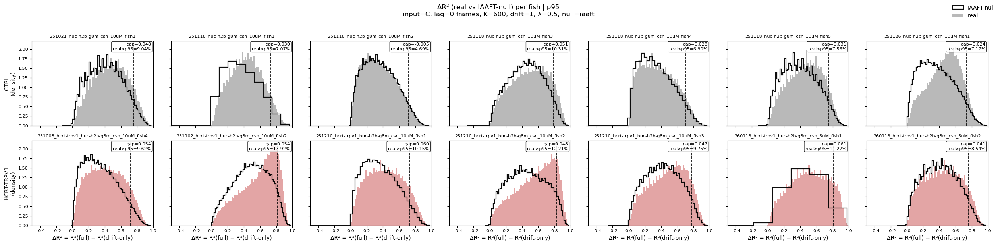

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/deltaR2_real_vs_iaaftnull_p95_inC_K600_drift1_lam0.5_lag0.png


In [17]:
# ============================================
# Plot: per-fish ΔR² real vs IAAFT-null (2 x max(n_ctrl, n_expt))
# - Row 1: ctrls
# - Row 2: expts
# - Real: meta color
# - Null: outline (black)
# - Vline: null pXX threshold (per fish; from saved scalar if exists else computed)
# ============================================

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ---------------------------
# CONFIG: set your IAAFT tag
# ---------------------------
NULL_TAG = "iaaft"  # <-- change if you used something else

# ---------------------------
# helpers
# ---------------------------
def load_scalar_npy(path):
    x = np.load(path)
    return float(np.asarray(x).reshape(-1)[0])

def _finite_1d(x):
    x = np.asarray(x).reshape(-1)
    return x[np.isfinite(x)]

def _null_paths(run_dir, null_percentile, null_tag):
    """
    Centralized naming. Keeps everything inside same run_dir, but avoids overwriting.
    """
    dR2_null_path = run_dir / f"kernel_delta_r2_null__{null_tag}.npy"
    thr_path      = run_dir / f"kernel_delta_r2_null_thresh_p{int(null_percentile)}__{null_tag}.npy"
    return dR2_null_path, thr_path

def tail_metrics(
    proj_ID,
    dir_ants_output,
    expt_ID,
    K_global,
    drift_global,
    lam_global,
    input_tag="dC",
    lag_global=0,
    p=99,
    null_tag=NULL_TAG,
):
    _, run_dir = get_run_dir(
        dir_ants_output, proj_ID, expt_ID,
        K_global, drift_global, lam_global,
        input_tag=input_tag,
        lag_global=lag_global,
    )

    dR2_real_path = run_dir / "kernel_delta_r2_fit.npy"
    dR2_null_path, _thr_path = _null_paths(run_dir, p, null_tag)

    dR2_real = _finite_1d(np.load(dR2_real_path))
    dR2_null = _finite_1d(np.load(dR2_null_path))

    thr = float(np.nanpercentile(dR2_null, p))
    frac_real_above = float(np.mean(dR2_real > thr))

    q_real = float(np.nanpercentile(dR2_real, p))
    q_null = float(np.nanpercentile(dR2_null, p))
    tail_gap = float(q_real - q_null)

    return dict(thr=thr, frac_real_above=frac_real_above, tail_gap=tail_gap, q_real=q_real, q_null=q_null)

# ---------------------------
# main plotting
# ---------------------------
def plot_delta_r2_real_vs_null_grid(
    proj_ID,
    dir_ants_output,
    ctrl_expt_ID_list,
    hcrt_expt_ID_list,
    K_global,
    drift_global,
    lam_global,
    input_tag="dC",          # MUST match how you generated the null
    lag_global=0,            # frames
    delta_r2_null_thresh=99,
    bins=60,
    xlim=None,
    ylim=None,
    save_name=None,
    null_tag=NULL_TAG,
):
    fig_dir = Path(dir_ants_output) / proj_ID / "figures"
    fig_dir.mkdir(parents=True, exist_ok=True)

    n_ctrl = len(ctrl_expt_ID_list)
    n_expt = len(hcrt_expt_ID_list)

    if n_ctrl == 0:
        raise ValueError("ctrl_expt_ID_list is empty")
    if n_expt == 0:
        raise ValueError("hcrt_expt_ID_list is empty")

    n_cols = max(n_ctrl, n_expt)

    hp_title = (
        f"input={input_tag}, lag={lag_global} frames, "
        f"K={K_global}, drift={drift_global}, λ={lam_global}, null={null_tag}"
    )

    fig, axes = plt.subplots(
        2, n_cols,
        figsize=(3.6 * n_cols, 6),
        sharex=True,
        sharey=True,
        squeeze=False,
    )

    fig.suptitle(
        f"ΔR² (real vs {null_tag.upper()}-null) per fish | p{delta_r2_null_thresh}\n{hp_title}",
        y=1.02
    )

    def one_subplot(ax, expt_ID):
        _, run_dir = get_run_dir(
            dir_ants_output, proj_ID, expt_ID,
            K_global, drift_global, lam_global,
            input_tag=input_tag,
            lag_global=lag_global,
        )

        dR2_real_path = run_dir / "kernel_delta_r2_fit.npy"
        dR2_null_path, thr_path = _null_paths(run_dir, delta_r2_null_thresh, null_tag)

        if not dR2_real_path.exists():
            raise FileNotFoundError(f"Missing real ΔR²: {dR2_real_path}")
        if not dR2_null_path.exists():
            raise FileNotFoundError(
                f"Missing {null_tag} null ΔR²: {dR2_null_path}\n"
                f"(Did you save as kernel_delta_r2_null__{null_tag}.npy ?)"
            )

        dR2_real = _finite_1d(np.load(dR2_real_path).astype(np.float32))
        dR2_null = _finite_1d(np.load(dR2_null_path).astype(np.float32))

        if dR2_real.size == 0 or dR2_null.size == 0:
            raise RuntimeError(f"{expt_ID}: empty ΔR² arrays")

        # threshold (prefer saved scalar)
        if thr_path.exists():
            thr = load_scalar_npy(thr_path)
        else:
            thr = float(np.nanpercentile(dR2_null, delta_r2_null_thresh))

        # meta color for REAL
        _, meta = get_group_meta(expt_ID)
        col = meta["color"]

        # null: outline only
        ax.hist(
            dR2_null,
            bins=bins,
            density=True,
            histtype="step",
            linewidth=1.6,
            color="black",
            alpha=0.95,
            label=f"{null_tag.upper()}-null",
        )

        # real: filled
        ax.hist(
            dR2_real,
            bins=bins,
            density=True,
            color=col,
            alpha=0.55,
            label="real",
        )

        ax.axvline(thr, color="black", linestyle="--", linewidth=1.2)

        frac_real_above = float(np.mean(dR2_real > thr))
        q_real = float(np.nanpercentile(dR2_real, delta_r2_null_thresh))
        q_null = float(np.nanpercentile(dR2_null, delta_r2_null_thresh))
        tail_gap = float(q_real - q_null)

        txt = (
            f"gap={tail_gap:.3f}\n"
            f"real>p{delta_r2_null_thresh}={frac_real_above*100:.2f}%"
        )

        ax.text(
            0.98, 0.98, txt,
            transform=ax.transAxes,
            ha="right", va="top",
            fontsize=8,
            bbox=dict(boxstyle="round,pad=0.25", facecolor="white", alpha=0.85),
        )

        ax.set_title(expt_ID, fontsize=8)
        ax.tick_params(labelsize=8)

    # row 1 controls
    for j, expt_ID in enumerate(ctrl_expt_ID_list):
        one_subplot(axes[0, j], expt_ID)
    for j in range(n_ctrl, n_cols):
        axes[0, j].axis("off")

    # row 2 expts
    for j, expt_ID in enumerate(hcrt_expt_ID_list):
        one_subplot(axes[1, j], expt_ID)
    for j in range(n_expt, n_cols):
        axes[1, j].axis("off")

    axes[0, 0].set_ylabel(f"{CTRL_TAG}\n(density)")
    axes[1, 0].set_ylabel(f"{EXPT_TAG}\n(density)")

    for j in range(n_cols):
        if axes[1, j].axison:
            axes[1, j].set_xlabel("ΔR² = R²(full) − R²(drift-only)")

    if xlim is not None:
        for ax in axes.ravel():
            if ax.axison:
                ax.set_xlim(xlim)
    if ylim is not None:
        for ax in axes.ravel():
            if ax.axison:
                ax.set_ylim(ylim)

    # legend once: use first active axis
    legend_ax = None
    for ax in axes.ravel():
        if ax.axison:
            legend_ax = ax
            break

    if legend_ax is not None:
        handles, labels = legend_ax.get_legend_handles_labels()
        fig.legend(handles, labels, loc="upper right", frameon=False)

    fig.tight_layout()

    if save_name is None:
        save_name = (
            f"deltaR2_real_vs_{null_tag}null_p{delta_r2_null_thresh}_"
            f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}.png"
        )

    save_path = fig_dir / save_name
    fig.savefig(save_path, dpi=200, bbox_inches="tight")
    plt.show()

    print(f"✅ Saved: {save_path}")


# ===== RUN =====
plot_delta_r2_real_vs_null_grid(
    proj_ID=proj_ID,
    dir_ants_output=dir_ants_output,
    ctrl_expt_ID_list=ctrl_expt_ID_list,
    hcrt_expt_ID_list=hcrt_expt_ID_list,
    K_global=K_global,
    drift_global=drift_global,
    lam_global=lam_global,
    lag_global=lag_global,
    input_tag="C",  # MUST match how you generated the IAAFT null
    delta_r2_null_thresh=RESPONDER_NULL_THRESH,
    bins=60,
    xlim=(-0.5, 1.0),
    null_tag=NULL_TAG,
)

## 6. Save GLM defined tonic pos/neg responder indices (*toggle which NULL you are saving*)
(threshed by null percentile, sign (pos/neg) defined by µ(y^)

### If a cell is a responder, is it positive or negative?

This is where the model prediction $\hat{y}$ is used.

### Model-predicted signal

For each responder cell $i$, we compute the model-predicted activity:

$$
\hat{y}_i(t) = (U h_i)(t)
$$

where:
- $U$ is the causal design matrix built from the drug input  
- $h_i$ is the fitted kernel for cell $i$

### Defining response sign

We define the sign using the difference in mean predicted activity between drug and baseline windows:

$$
\Delta \mu_i
=
\langle \hat{y}_i \rangle_{\text{drug}}
-
\langle \hat{y}_i \rangle_{\text{baseline}}
$$

- If $\Delta \mu_i > 0$ → **positive responder**
- If $\Delta \mu_i < 0$ → **negative responder**


### [Save IAAFT NULL defined responders]

In [37]:
import os, json
import numpy as np

# ========= CONFIG ========= #
THR_PERCENTILE = 95

# ***** Toggle between your two nulls:
#   "shift"  -> kernel_delta_r2_null__shift.npy
#   "iaaft"  -> kernel_delta_r2_null__iaaft.npy
NULL_TAG = "iaaft"   # <-- change to "iaaft" when needed

baseline_win_min = (0.0, 15.0)  # yhat baseline window in minutes
drug_win_min     = (30.0, 45.0) # yhat drug window in minutes

param_folder_name = f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}"

F_NAME_DR2_REAL = "kernel_delta_r2_fit.npy"
F_NAME_KERNELS  = "kernel_h_hat.npy"

# ========= HELPERS ========= #
def _finite_1d(x):
    x = np.asarray(x).ravel()
    return x[np.isfinite(x)]

def finite_nanpercentile(x, p):
    xf = _finite_1d(x)
    return float(np.nanpercentile(xf, p)) if xf.size else np.nan

def _window_frames_from_minutes(sr_hz, t0_min, t1_min):
    s = int(round(t0_min * 60.0 * sr_hz))
    e = int(round(t1_min * 60.0 * sr_hz))
    return s, e

def load_u_fit_and_meta(expt_ID, dir_ants_output, proj_ID, param_folder_name):
    """
    Loads u_fit + meta from RUN_META.json for this run.
    """
    dir_expt = os.path.join(dir_ants_output, proj_ID, expt_ID)
    run_dir  = os.path.join(dir_expt, "glm", param_folder_name)

    meta_path = os.path.join(run_dir, "RUN_META.json")
    if not os.path.exists(meta_path):
        raise FileNotFoundError(f"Missing RUN_META.json: {meta_path}")

    with open(meta_path, "r") as f:
        meta = json.load(f)

    fit_start  = int(meta["fit_start"])
    fit_end    = int(meta["fit_end"])
    Tfit       = int(meta["Tfit"])
    lag_frames = int(meta.get("lag_global_frames", 0))
    input_tag_ = meta.get("input_tag", "C")

    C_path  = os.path.join(dir_expt, "C_capsaicin.npy")
    dC_path = os.path.join(dir_expt, "dC_capsaicin.npy")
    if not os.path.exists(C_path):
        raise FileNotFoundError(f"Missing: {C_path}")
    if input_tag_ == "dC" and (not os.path.exists(dC_path)):
        raise FileNotFoundError(f"Missing: {dC_path}")

    C_full = np.load(C_path).astype(np.float32).ravel()
    if input_tag_ == "C":
        u_fit = C_full[fit_start:fit_end]
    elif input_tag_ == "dC":
        dC_full = np.load(dC_path).astype(np.float32).ravel()
        u_fit = dC_full[fit_start:fit_end]
    else:
        raise ValueError(f"input_tag must be 'C' or 'dC', got {input_tag_!r}")

    u_fit = shift_with_zeros(u_fit, lag_frames)

    if u_fit.size != Tfit:
        raise ValueError(f"{expt_ID}: u_fit len {u_fit.size} != Tfit {Tfit}")

    return u_fit.astype(np.float32), meta, run_dir

# Canonical null filenames (same system as your null_paths helper)
def null_paths(run_dir: str, null_tag: str, null_percentile: int):
    suffix = f"__{null_tag}"
    dR2_null_path = os.path.join(run_dir, f"kernel_delta_r2_null{suffix}.npy")
    idx_path      = os.path.join(run_dir, f"kernel_delta_r2_null_idx{suffix}.npy")
    thresh_path   = os.path.join(run_dir, f"kernel_delta_r2_null_thresh_p{int(null_percentile)}{suffix}.npy")
    meta_path     = os.path.join(run_dir, f"RUN_META_NULL{suffix}.json")
    return dR2_null_path, idx_path, thresh_path, meta_path

# ========= MAIN ========= #
def save_glm_tonic_posneg_indices(
    expt_ID,
    dir_ants_output,
    proj_ID,
    param_folder_name,
    sampling_rate_hz,
    thr_percentile=99.0,
    null_tag="shift",        # <<< NEW TOGGLE
    yhat_sign_eps=0.0,
    overwrite=True,
    chunk_cells=20000,
    baseline_win_min=(0.0, 15.0),
    drug_win_min=(30.0, 45.0),
):
    """
    Uses selected null_tag to threshold responders, and saves tagged responder idx.

    Saves:
      tonic_pos_glm_{null_tag}_nullp{p}_idxs.npy
      tonic_neg_glm_{null_tag}_nullp{p}_idxs.npy
    """
    dir_expt = os.path.join(dir_ants_output, proj_ID, expt_ID)
    run_dir  = os.path.join(dir_expt, "glm", param_folder_name)

    # load u_fit + meta
    u_fit, meta, _ = load_u_fit_and_meta(expt_ID, dir_ants_output, proj_ID, param_folder_name)

    # load ΔR² real + kernels
    path_real = os.path.join(run_dir, F_NAME_DR2_REAL)
    path_hhat = os.path.join(run_dir, F_NAME_KERNELS)

    dR2_real = np.load(path_real).astype(np.float32).ravel()
    h_hat    = np.load(path_hhat).astype(np.float32)

    n_cells = dR2_real.size
    if h_hat.shape[0] != n_cells:
        h_hat = h_hat[:n_cells]

    # load the CHOSEN null (tagged)
    dR2_null_path, _, _, _ = null_paths(run_dir, null_tag, int(thr_percentile))
    if not os.path.exists(dR2_null_path):
        raise FileNotFoundError(
            f"{expt_ID}: missing null file for null_tag={null_tag!r}:\n  {dR2_null_path}"
        )
    dR2_null = np.load(dR2_null_path).astype(np.float32)

    # null threshold
    thr = finite_nanpercentile(dR2_null, thr_percentile)
    if not np.isfinite(thr):
        print(f"⚠️ {expt_ID}: null threshold is NaN (no finite null?). Skipping.")
        return None

    # responder mask
    finite_real = np.isfinite(dR2_real)
    is_resp = finite_real & (dR2_real > thr)
    resp_idx = np.where(is_resp)[0]
    n_resp = resp_idx.size

    ptag = int(thr_percentile)

    # IMPORTANT: tagged save names so you NEVER overwrite across nulls
    pos_path = os.path.join(dir_expt, f"tonic_pos_glm_{null_tag}_nullp{ptag}_idxs.npy")
    neg_path = os.path.join(dir_expt, f"tonic_neg_glm_{null_tag}_nullp{ptag}_idxs.npy")

    if (not overwrite) and os.path.exists(pos_path) and os.path.exists(neg_path):
        print(f"✅ {expt_ID}: already exists (null_tag={null_tag}), skipping (overwrite=False).")
        return dict(expt_ID=expt_ID, thr=thr, n_resp=n_resp, pos_path=pos_path, neg_path=neg_path)

    if n_resp == 0:
        np.save(pos_path, np.array([], dtype=np.int64))
        np.save(neg_path, np.array([], dtype=np.int64))
        print(f"⚠️ {expt_ID}: 0 responders @ {null_tag} null p{ptag} (thr={thr:.4g}). Saved empty idx.")
        return dict(expt_ID=expt_ID, thr=thr, n_resp=0, pos_path=pos_path, neg_path=neg_path)

    # Build U once (Tfit, K)
    K = int(meta["K_global"])
    U = build_U_from_input(u_fit, K).astype(np.float32)
    Tfit = U.shape[0]

    # windows in yhat-time (fit-time)
    b0, b1 = _window_frames_from_minutes(sampling_rate_hz, *baseline_win_min)
    d0, d1 = _window_frames_from_minutes(sampling_rate_hz, *drug_win_min)

    # bound + sanity
    b0 = int(np.clip(b0, 0, Tfit)); b1 = int(np.clip(b1, 0, Tfit))
    d0 = int(np.clip(d0, 0, Tfit)); d1 = int(np.clip(d1, 0, Tfit))

    if b1 <= b0:
        raise ValueError(f"{expt_ID}: baseline window empty after clipping: [{b0},{b1})")
    if d1 <= d0:
        raise ValueError(f"{expt_ID}: drug window empty after clipping: [{d0},{d1})")

    # Compute sign Δmean(yhat) for responders
    sign_vals = np.zeros(n_resp, dtype=np.float32)

    for s in range(0, n_resp, chunk_cells):
        e = min(s + chunk_cells, n_resp)
        idx_chunk = resp_idx[s:e]

        H = h_hat[idx_chunk].T      # (K, n_chunk)
        yhat = U @ H                # (Tfit, n_chunk)

        m_base = np.mean(yhat[b0:b1, :], axis=0)
        m_drug = np.mean(yhat[d0:d1, :], axis=0)
        sign_vals[s:e] = (m_drug - m_base).astype(np.float32)

    pos_idx = resp_idx[sign_vals >  yhat_sign_eps]
    neg_idx = resp_idx[sign_vals < -yhat_sign_eps]

    np.save(pos_path, pos_idx.astype(np.int64))
    np.save(neg_path, neg_idx.astype(np.int64))

    print(f"✅ {expt_ID}: saved responder idx using NULL_TAG={null_tag!r} @ p{ptag} (thr={thr:.6g})")
    print(f"   responders={n_resp}/{n_cells} | pos={pos_idx.size} | neg={neg_idx.size}")
    print(f"   {os.path.basename(dR2_null_path)} -> {os.path.basename(pos_path)}, {os.path.basename(neg_path)}")

    return dict(
        expt_ID=expt_ID,
        null_tag=null_tag,
        thr=thr,
        n_resp=n_resp,
        n_pos=pos_idx.size,
        n_neg=neg_idx.size,
        pos_path=pos_path,
        neg_path=neg_path,
    )

# ---- RUN IT FOR ALL FISH ----
for expt_ID in expt_ID_list:
    save_glm_tonic_posneg_indices(
        expt_ID=expt_ID,
        dir_ants_output=dir_ants_output,
        proj_ID=proj_ID,
        param_folder_name=param_folder_name,
        sampling_rate_hz=volume_per_sec,
        thr_percentile=THR_PERCENTILE,
        null_tag=NULL_TAG,     # <<< TOGGLE HERE
        overwrite=True,
    )


✅ 251021_huc-h2b-g8m_csn_10uM_fish1: saved responder idx using NULL_TAG='iaaft' @ p95 (thr=0.757812)
   responders=43922/485698 | pos=16270 | neg=27652
   kernel_delta_r2_null__iaaft.npy -> tonic_pos_glm_iaaft_nullp95_idxs.npy, tonic_neg_glm_iaaft_nullp95_idxs.npy
✅ 251118_huc-h2b-g8m_csn_10uM_fish1: saved responder idx using NULL_TAG='iaaft' @ p95 (thr=0.727539)
   responders=33534/474057 | pos=12910 | neg=20624
   kernel_delta_r2_null__iaaft.npy -> tonic_pos_glm_iaaft_nullp95_idxs.npy, tonic_neg_glm_iaaft_nullp95_idxs.npy
✅ 251118_huc-h2b-g8m_csn_10uM_fish2: saved responder idx using NULL_TAG='iaaft' @ p95 (thr=0.710938)
   responders=20291/432666 | pos=6480 | neg=13811
   kernel_delta_r2_null__iaaft.npy -> tonic_pos_glm_iaaft_nullp95_idxs.npy, tonic_neg_glm_iaaft_nullp95_idxs.npy
✅ 251118_huc-h2b-g8m_csn_10uM_fish3: saved responder idx using NULL_TAG='iaaft' @ p95 (thr=0.784883)
   responders=52959/513913 | pos=862 | neg=52097
   kernel_delta_r2_null__iaaft.npy -> tonic_pos_glm_iaaf

# ⭕️ STEP 4: Tonic-GLM: Characterize and Cluster Responder Cells 

## [population] Fraction cells that are Tonic pos/neg responders 

✅ 251021_huc-h2b-g8m_csn_10uM_fish1 [CTRL] NULL=iaaft n_cells=485698 | POS 16270 (3.35%) file=tonic_pos_glm_iaaft_nullp95_idxs.npy | NEG 27652 (5.69%) file=tonic_neg_glm_iaaft_nullp95_idxs.npy
✅ 251118_huc-h2b-g8m_csn_10uM_fish1 [CTRL] NULL=iaaft n_cells=474057 | POS 12910 (2.72%) file=tonic_pos_glm_iaaft_nullp95_idxs.npy | NEG 20624 (4.35%) file=tonic_neg_glm_iaaft_nullp95_idxs.npy
✅ 251118_huc-h2b-g8m_csn_10uM_fish2 [CTRL] NULL=iaaft n_cells=432666 | POS 6480 (1.50%) file=tonic_pos_glm_iaaft_nullp95_idxs.npy | NEG 13811 (3.19%) file=tonic_neg_glm_iaaft_nullp95_idxs.npy
✅ 251118_huc-h2b-g8m_csn_10uM_fish3 [CTRL] NULL=iaaft n_cells=513913 | POS 862 (0.17%) file=tonic_pos_glm_iaaft_nullp95_idxs.npy | NEG 52097 (10.14%) file=tonic_neg_glm_iaaft_nullp95_idxs.npy
✅ 251118_huc-h2b-g8m_csn_10uM_fish4 [CTRL] NULL=iaaft n_cells=491867 | POS 10455 (2.13%) file=tonic_pos_glm_iaaft_nullp95_idxs.npy | NEG 23477 (4.77%) file=tonic_neg_glm_iaaft_nullp95_idxs.npy
✅ 251118_huc-h2b-g8m_csn_10uM_fish5 [

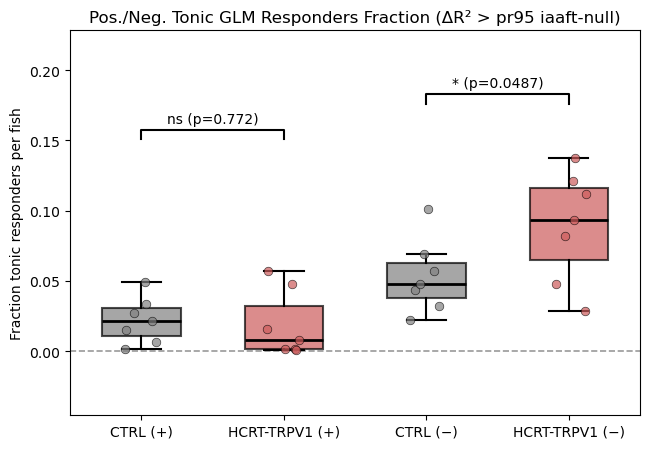


POS fraction MWU (HCRT-TRPV1 > CTRL): p = 7.721e-01
NEG fraction MWU (EXPT_TAG > CTRL): p = 4.866e-02


In [37]:
# =========================
# Boxplot: fraction of POS/NEG responders per fish
# Toggle NULL_TAG = "shift" or "iaaft"  (also accepts "none" -> "shift")

# -------------------------
# SETTINGS
# -------------------------
NULL_TAG = "iaaft"          # "shift" or "iaaft" (or "none" as alias for shift)
RESPONDER_NULL_THRESH = 95  # pXX used in saved responder idx filenames

# Must exist in scope:
# dir_ants_output, proj_ID, input_tag, K_global, drift_global, lam_global, lag_global
# ctrl_expt_ID_list, hcrt_expt_ID_list, PLOT_META, volume_per_sec
param_folder_name = f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}"

# -------------------------
# Helpers
# -------------------------
def p_to_stars(p):
    if not np.isfinite(p):
        return "n/a"
    if p < 1e-4: return "****"
    if p < 1e-3: return "***"
    if p < 1e-2: return "**"
    if p < 5e-2: return "*"
    return "ns"

def _normalize_null_tag(null_tag: str) -> str:
    m = str(null_tag).lower().strip()
    if m in {"none", "shift", "cshift", "circular_shift"}:
        return "shift"
    if m in {"iaaft", "aaft"}:
        return "iaaft"
    raise ValueError(f"NULL_TAG must be 'shift' or 'iaaft' (or 'none' as alias), got {null_tag!r}")

def idx_paths_for_null_tag(dir_expt: Path, run_dir: Path, ptag: int, null_tag: str):
    """
    Finds tonic_pos/neg responder idx files for the requested null tag.
    Search order: run_dir first, then fish root.

    Preferred NEW names:
      tonic_pos_glm_{null_tag}_nullp{p}_idxs.npy
      tonic_neg_glm_{null_tag}_nullp{p}_idxs.npy

    Backward-compatible names:
      shift: tonic_pos_glm_nullp{p}_idxs.npy
             tonic_neg_glm_nullp{p}_idxs.npy
      iaaft: tonic_pos_glm_iaaft_nullp{p}_idxs.npy
             tonic_neg_glm_iaaft_nullp{p}_idxs.npy
    """
    null_tag = _normalize_null_tag(null_tag)

    pos_new = f"tonic_pos_glm_{null_tag}_nullp{ptag}_idxs.npy"
    neg_new = f"tonic_neg_glm_{null_tag}_nullp{ptag}_idxs.npy"

    if null_tag == "shift":
        pos_legacy = f"tonic_pos_glm_nullp{ptag}_idxs.npy"
        neg_legacy = f"tonic_neg_glm_nullp{ptag}_idxs.npy"
    else:
        pos_legacy = f"tonic_pos_glm_iaaft_nullp{ptag}_idxs.npy"
        neg_legacy = f"tonic_neg_glm_iaaft_nullp{ptag}_idxs.npy"

    candidates = [
        (run_dir / pos_new,    run_dir / neg_new),
        (run_dir / pos_legacy, run_dir / neg_legacy),
        (dir_expt / pos_new,    dir_expt / neg_new),
        (dir_expt / pos_legacy, dir_expt / neg_legacy),
    ]
    for pp, nn in candidates:
        if pp.exists() and nn.exists():
            return pp, nn, null_tag

    tried = []
    for pp, nn in candidates:
        tried.append(str(pp)); tried.append(str(nn))
    raise FileNotFoundError(
        f"Missing idx files for NULL_TAG={null_tag}, p{ptag}.\nTried:\n  " + "\n  ".join(tried)
    )

def load_n_cells_for_fish(dir_expt: Path):
    """Use F_tonic raw shape as total cell count."""
    ft_path = dir_expt / "data_array_f_tonic.npy"
    if not ft_path.exists():
        raise FileNotFoundError(f"Missing: {ft_path}")
    Ft = np.load(ft_path, mmap_mode="r")
    if Ft.ndim != 2:
        raise ValueError(f"Bad Ft shape: {Ft.shape} at {ft_path}")
    return int(Ft.shape[0])

def add_sig(ax, x1, x2, y, p):
    ax.plot([x1, x1, x2, x2], [y, y*1.04, y*1.04, y], lw=1.5, color="black")
    ax.text((x1+x2)/2, y*1.06, f"{p_to_stars(p)} (p={p:.3g})", ha="center", va="bottom")

def process_group_fractions(expt_ID_list, group_name, ptag, null_tag):
    """
    Returns:
      pos_frac_list, neg_frac_list  (each entry = fraction responders per fish)
    """
    out_pos = []
    out_neg = []

    for expt_ID in expt_ID_list:
        dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
        run_dir  = dir_expt / "glm" / param_folder_name

        pos_path, neg_path, used_tag = idx_paths_for_null_tag(dir_expt, run_dir, ptag, null_tag)

        pos_idx = np.load(pos_path).astype(np.int64).ravel()
        neg_idx = np.load(neg_path).astype(np.int64).ravel()

        n_cells = load_n_cells_for_fish(dir_expt)

        pos_frac = pos_idx.size / n_cells
        neg_frac = neg_idx.size / n_cells

        out_pos.append(pos_frac)
        out_neg.append(neg_frac)

        print(
            f"✅ {expt_ID} [{group_name}] NULL={used_tag} n_cells={n_cells} | "
            f"POS {pos_idx.size} ({pos_frac*100:.2f}%) file={pos_path.name} | "
            f"NEG {neg_idx.size} ({neg_frac*100:.2f}%) file={neg_path.name}"
        )

    return np.array(out_pos, dtype=np.float32), np.array(out_neg, dtype=np.float32)

# -------------------------
# COMPUTE FRACTIONS
# -------------------------
ptag = int(RESPONDER_NULL_THRESH)
NULL_TAG_USED = _normalize_null_tag(NULL_TAG)

pos_ctrl, neg_ctrl = process_group_fractions(ctrl_expt_ID_list, CTRL_TAG, ptag, NULL_TAG_USED)
pos_hcrt, neg_hcrt = process_group_fractions(hcrt_expt_ID_list, EXPT_TAG, ptag, NULL_TAG_USED)

# Safety
if len(pos_ctrl)==0 or len(pos_hcrt)==0 or len(neg_ctrl)==0 or len(neg_hcrt)==0:
    print("⚠️ Not enough data to plot all four groups.")
else:
    # Stats (HCRT > CTRL)
    p_pos = mannwhitneyu(pos_hcrt, pos_ctrl, alternative="greater").pvalue
    p_neg = mannwhitneyu(neg_hcrt, neg_ctrl, alternative="greater").pvalue

    # -------------------------
    # PLOT
    # -------------------------
    fig, ax = plt.subplots(figsize=(6.6, 4.6))
    ax.axhline(0, linestyle="--", linewidth=1.2, color="black", alpha=0.4, zorder=0)

    data = [pos_ctrl, pos_hcrt, neg_ctrl, neg_hcrt]
    labels = [
        f"{PLOT_META[CTRL_TAG]['label']} (+)",
        f"{PLOT_META[EXPT_TAG]['label']} (+)",
        f"{PLOT_META[CTRL_TAG]['label']} (−)",
        f"{PLOT_META[EXPT_TAG]['label']} (−)",
    ]
    positions = [0, 1, 2, 3]

    bp = ax.boxplot(
        data,
        positions=positions,
        widths=0.55,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(color="black", linewidth=2),
        whiskerprops=dict(color="black", linewidth=1.5),
        capprops=dict(color="black", linewidth=1.5),
    )

    box_groups = [CTRL_TAG, EXPT_TAG, CTRL_TAG, EXPT_TAG]
    for patch, gname in zip(bp["boxes"], box_groups):
        meta = PLOT_META[gname]
        patch.set_facecolor(meta["color"])
        patch.set_alpha(meta["alpha"])
        patch.set_edgecolor("black")
        patch.set_linewidth(1.5)

    rng = np.random.default_rng(0)
    for x0, vals, gname in zip(positions, data, box_groups):
        meta = PLOT_META[gname]
        x = x0 + rng.uniform(-0.12, 0.12, size=len(vals))
        ax.scatter(
            x, vals,
            s=38,
            color=meta["color"],
            alpha=meta["alpha"],
            edgecolor="black",
            linewidth=0.5,
            zorder=3,
        )

    ax.set_xticks(positions)
    ax.set_xticklabels(labels)
    ax.set_ylabel("Fraction tonic responders per fish")
    ax.set_title(f"Pos./Neg. Tonic GLM Responders Fraction (ΔR² > pr{RESPONDER_NULL_THRESH} {NULL_TAG_USED}-null)")

    y_all = np.concatenate([d for d in data if len(d) > 0])
    ymax = float(np.nanmax(y_all))
    ymin = float(np.nanmin(y_all))
    yrng = (ymax - ymin) if ymax > ymin else 1.0

    add_sig(ax, 0, 1, ymax + 0.10 * yrng, p_pos)
    add_sig(ax, 2, 3, ymax + 0.28 * yrng, p_neg)

    ax.margins(y=0.25)
    plt.tight_layout()
    
    # -------------------------
    # SAVE FIGURE
    # -------------------------
    fig_dir = Path(dir_ants_output) / proj_ID / "figures"
    fig_dir.mkdir(parents=True, exist_ok=True)

    save_path = fig_dir / (
        f"box_fraction_GLMtonicResponders_perFish"
        f"__p{RESPONDER_NULL_THRESH}__{NULL_TAG_USED}.png"
    )

    plt.savefig(save_path, dpi=300, bbox_inches="tight")

    print(f"\n📁 Boxplot saved to:")
    print(f"{save_path}")

    plt.show()

    print(f"\nPOS fraction MWU ({EXPT_TAG} > {CTRL_TAG}): p = {p_pos:.3e}")
    print(f"NEG fraction MWU (EXPT_TAG > {CTRL_TAG}): p = {p_neg:.3e}")


## [ΔZ] Quantify Amplitude Change (effect size) of Tonic pos./neg. responders("how much does the F_tonic acitivty increase/decrease after drug") 

### Method(1) ΔZ (fixed-window effect size)

For each cell *i*, define a baseline window **B** and a drug window **D** on the raw tonic trace `F_i(t)`.

Compute baseline mean and standard deviation:

$$
\mu_i(B) = \mathrm{mean}_{t \in B}\, F_i(t)
$$

$$
\sigma_i(B) = \mathrm{std}_{t \in B}\, F_i(t)
$$

Compute drug mean:

$$
\mu_i(D) = \mathrm{mean}_{t \in D}\, F_i(t)
$$

Then fixed-window effect size is:

$$
\Delta Z_i = \frac{\mu_i(D) - \mu_i(B)}{\sigma_i(B) + \epsilon}
$$

**Interpretation:** ΔZ measures the **average shift across the entire drug window** relative to baseline (in baseline SD units). Long drug windows can dilute transient/delayed responses.


BASELINE_MIN = (0.0, 45.0)
DRUG_MIN     = (46.0, 90.0)
WASH_MIN     = (91.0, 120.0)


Compute+save per-fish Δz (parallel): 100%|██████████| 14/14 [00:00<00:00, 59313.39it/s]


✅ 251021_huc-h2b-g8m_csn_10uM_fish1 | computed   | pos n=16270 | neg n=27652
✅ 251118_huc-h2b-g8m_csn_10uM_fish1 | computed   | pos n=12910 | neg n=20624
✅ 251118_huc-h2b-g8m_csn_10uM_fish2 | computed   | pos n= 6480 | neg n=13811
✅ 251118_huc-h2b-g8m_csn_10uM_fish3 | computed   | pos n=  862 | neg n=52097
✅ 251118_huc-h2b-g8m_csn_10uM_fish4 | computed   | pos n=10455 | neg n=23477
✅ 251118_huc-h2b-g8m_csn_10uM_fish5 | computed   | pos n= 3024 | neg n=30521
✅ 251126_huc-h2b-g8m_csn_10uM_fish1 | computed   | pos n=25444 | neg n=11620
✅ 251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4 | computed   | pos n=27907 | neg n=27982
✅ 251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2 | computed   | pos n=  799 | neg n=63889
✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1 | computed   | pos n= 3943 | neg n=45119
✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2 | computed   | pos n=  658 | neg n=62405
✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish3 | computed   | pos n= 8429 | neg n=44487
✅ 260113_hcrt-trpv1_h

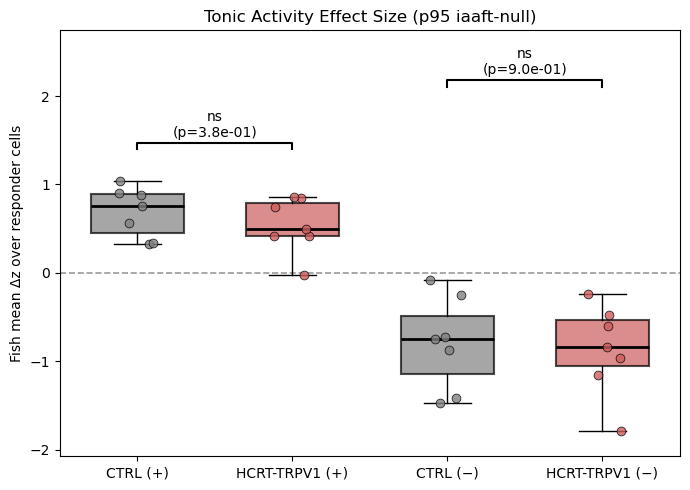

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from joblib import Parallel, delayed
from scipy.stats import mannwhitneyu

# ============================================================
# Helpers
# ============================================================
def frames_to_min_pair(start_frame, end_frame, sampling_rate_hz):
    """
    Convert frame indices [start, end) to minute pair for cache naming / display.
    """
    start_min = float(start_frame) / float(sampling_rate_hz) / 60.0
    end_min   = float(end_frame)   / float(sampling_rate_hz) / 60.0
    return (start_min, end_min)

def _safe_load_npy(path, allow_missing=False, mmap=False):
    if not os.path.exists(path):
        if allow_missing:
            return None
        raise FileNotFoundError(path)
    return np.load(path, mmap_mode="r" if mmap else None)

def _normalize_null_tag(null_tag: str) -> str:
    m = str(null_tag).lower().strip()
    if m in {"none", "shift", "cshift", "circular_shift"}:
        return "shift"
    if m in {"iaaft", "aaft"}:
        return "iaaft"
    raise ValueError(f"NULL_TAG must be 'shift' or 'iaaft' (or 'none' alias), got {null_tag!r}")

def idx_paths_for_null_tag(dir_expt, ptag: int, null_tag: str, param_folder_name=None):
    null_tag = _normalize_null_tag(null_tag)

    pos_new = f"tonic_pos_glm_{null_tag}_nullp{ptag}_idxs.npy"
    neg_new = f"tonic_neg_glm_{null_tag}_nullp{ptag}_idxs.npy"

    if null_tag == "shift":
        pos_legacy = f"tonic_pos_glm_nullp{ptag}_idxs.npy"
        neg_legacy = f"tonic_neg_glm_nullp{ptag}_idxs.npy"
    else:
        pos_legacy = f"tonic_pos_glm_iaaft_nullp{ptag}_idxs.npy"
        neg_legacy = f"tonic_neg_glm_iaaft_nullp{ptag}_idxs.npy"

    candidates = []
    if param_folder_name is not None:
        run_dir = os.path.join(dir_expt, "glm", param_folder_name)
        candidates += [
            (os.path.join(run_dir, pos_new),    os.path.join(run_dir, neg_new)),
            (os.path.join(run_dir, pos_legacy), os.path.join(run_dir, neg_legacy)),
        ]

    candidates += [
        (os.path.join(dir_expt, pos_new),    os.path.join(dir_expt, neg_new)),
        (os.path.join(dir_expt, pos_legacy), os.path.join(dir_expt, neg_legacy)),
    ]

    for pp, nn in candidates:
        if os.path.exists(pp) and os.path.exists(nn):
            return pp, nn, null_tag

    tried = []
    for pp, nn in candidates:
        tried.append(pp)
        tried.append(nn)

    raise FileNotFoundError(
        f"Missing idx files for NULL_TAG={null_tag}, p{ptag}.\nTried:\n  " + "\n  ".join(tried)
    )

def minutes_to_frames(min_pair, sr_hz, Tfull):
    s = int(round(min_pair[0] * 60 * sr_hz))
    e = int(round(min_pair[1] * 60 * sr_hz))
    s = int(np.clip(s, 0, Tfull))
    e = int(np.clip(e, 0, Tfull))
    if e <= s:
        raise ValueError(f"Window {min_pair} becomes empty after clipping: [{s},{e}) / Tfull={Tfull}")
    return s, e

def _dz_cache_paths(cache_dir, null_tag, ptag, baseline_min_pair, drug_min_pair, effect_clip_abs):
    os.makedirs(cache_dir, exist_ok=True)
    b0, b1 = baseline_min_pair
    d0, d1 = drug_min_pair
    clip = "none" if effect_clip_abs is None else f"{float(effect_clip_abs):g}"
    stem = f"tonic_dz_glm_{null_tag}_nullp{ptag}_b{b0:g}-{b1:g}_d{d0:g}-{d1:g}_clip{clip}"
    pos = os.path.join(cache_dir, stem + "_pos.npy")
    neg = os.path.join(cache_dir, stem + "_neg.npy")
    return pos, neg

def _load_dz_vector(path):
    if (path is None) or (not os.path.exists(path)):
        return None
    x = np.load(path)
    x = np.asarray(x, dtype=np.float32).ravel()
    x = x[np.isfinite(x)]
    return x

# ============================================================
# Per-fish worker
# ============================================================
def _compute_and_save_one_fish_dz(
    expt_ID,
    dir_ants_output,
    proj_ID,
    ptag,
    null_tag,
    param_folder_name,
    baseline_min_pair,
    drug_min_pair,
    sampling_rate_hz,
    effect_clip_abs,
    cache_root,
    force_recompute=False,
):
    """
    Saves:
      {cache_root}/{expt_ID}/..._pos.npy  (Npos,)
      {cache_root}/{expt_ID}/..._neg.npy  (Nneg,)

    Returns:
      (expt_ID, pos_path, neg_path, n_pos, n_neg, status)
    """
    dir_expt = os.path.join(dir_ants_output, proj_ID, expt_ID)

    fish_cache_dir = os.path.join(cache_root, expt_ID)
    pos_out, neg_out = _dz_cache_paths(
        fish_cache_dir, null_tag, ptag,
        baseline_min_pair, drug_min_pair, effect_clip_abs
    )

    if (not force_recompute) and os.path.exists(pos_out) and os.path.exists(neg_out):
        try:
            pos = np.load(pos_out, mmap_mode="r")
            neg = np.load(neg_out, mmap_mode="r")
            return expt_ID, pos_out, neg_out, int(pos.size), int(neg.size), "loaded"
        except Exception:
            pass

    Ft_path = os.path.join(dir_expt, "data_array_f_tonic.npy")
    Ft_full = _safe_load_npy(Ft_path, allow_missing=True, mmap=True)
    if Ft_full is None or Ft_full.ndim != 2:
        return expt_ID, None, None, 0, 0, "missing_Ft"

    n_cells, Tfull = Ft_full.shape
    b0, b1 = minutes_to_frames(baseline_min_pair, sampling_rate_hz, Tfull)
    d0, d1 = minutes_to_frames(drug_min_pair,     sampling_rate_hz, Tfull)

    pos_idx_path, neg_idx_path, _ = idx_paths_for_null_tag(
        dir_expt=dir_expt,
        ptag=ptag,
        null_tag=null_tag,
        param_folder_name=param_folder_name,
    )

    pos_idx = _safe_load_npy(pos_idx_path, allow_missing=True)
    neg_idx = _safe_load_npy(neg_idx_path, allow_missing=True)
    if pos_idx is None or neg_idx is None:
        return expt_ID, None, None, 0, 0, "missing_idx"

    pos_idx = np.asarray(pos_idx, dtype=np.int64).ravel()
    neg_idx = np.asarray(neg_idx, dtype=np.int64).ravel()

    pos_idx = pos_idx[(pos_idx >= 0) & (pos_idx < n_cells)]
    neg_idx = neg_idx[(neg_idx >= 0) & (neg_idx < n_cells)]

    def _compute_dz_for_idxs(idxs):
        if idxs.size == 0:
            return np.zeros((0,), dtype=np.float32)

        Ft_sub = np.asarray(Ft_full[idxs, :], dtype=np.float32)
        base_seg = Ft_sub[:, b0:b1]
        drug_seg = Ft_sub[:, d0:d1]

        mu_base = np.mean(base_seg, axis=1)
        sd_base = np.std(base_seg, axis=1, ddof=0)
        mu_drug = np.mean(drug_seg, axis=1)

        dz = (mu_drug - mu_base) / (sd_base + 1e-6)

        if effect_clip_abs is not None:
            dz = np.clip(dz, -float(effect_clip_abs), float(effect_clip_abs))

        dz = dz[np.isfinite(dz)]
        return dz.astype(np.float32)

    dz_pos = _compute_dz_for_idxs(pos_idx)
    dz_neg = _compute_dz_for_idxs(neg_idx)

    np.save(pos_out, dz_pos)
    np.save(neg_out, dz_neg)

    return expt_ID, pos_out, neg_out, int(dz_pos.size), int(dz_neg.size), "computed"

# ============================================================
# Main API
# ============================================================
def save_per_fish_responder_dz_vectors(
    expt_ID_list,
    proj_ID,
    dir_ants_output,
    responder_null_thresh,
    null_tag,
    baseline_min_pair,
    drug_min_pair,
    sampling_rate_hz,
    param_folder_name=None,
    effect_clip_abs=50.0,
    n_jobs=6,
    backend="threading",
    verbose=0,
    cache_root=None,
    force_recompute=False,
):
    """
    Computes & saves per-fish Δz vectors for tonic_pos and tonic_neg responders.
    """
    ptag = int(responder_null_thresh)
    null_tag = _normalize_null_tag(null_tag)

    if cache_root is None:
        cache_root = os.path.join(dir_ants_output, proj_ID, "results_dz_vectors")
    os.makedirs(cache_root, exist_ok=True)

    results = Parallel(n_jobs=n_jobs, backend=backend, verbose=verbose)(
        delayed(_compute_and_save_one_fish_dz)(
            expt_ID=expt_ID,
            dir_ants_output=dir_ants_output,
            proj_ID=proj_ID,
            ptag=ptag,
            null_tag=null_tag,
            param_folder_name=param_folder_name,
            baseline_min_pair=baseline_min_pair,
            drug_min_pair=drug_min_pair,
            sampling_rate_hz=sampling_rate_hz,
            effect_clip_abs=effect_clip_abs,
            cache_root=cache_root,
            force_recompute=force_recompute,
        )
        for expt_ID in tqdm(expt_ID_list, desc="Compute+save per-fish Δz (parallel)")
    )

    out = {}
    for expt_ID, pos_path, neg_path, n_pos, n_neg, status in results:
        out[expt_ID] = dict(
            pos_path=pos_path,
            neg_path=neg_path,
            n_pos=n_pos,
            n_neg=n_neg,
            status=status,
        )
        print(f"✅ {expt_ID} | {status:10s} | pos n={n_pos:5d} | neg n={n_neg:5d}")

    print(f"\n📁 Saved per-fish Δz vectors under: {cache_root}")
    return out

# ============================================================
# RUN SAVE
# ============================================================
# These must already exist in notebook scope:
# baseline_start, baseline_end, drug_start, drug_end, wash_start, wash_end
# volume_per_sec, input_tag, K_global, drift_global, lam_global, lag_global
# expt_ID_list, proj_ID, dir_ants_output

BASELINE_MIN = frames_to_min_pair(baseline_start, baseline_end, volume_per_sec)
DRUG_MIN     = frames_to_min_pair(drug_start, drug_end, volume_per_sec)
WASH_MIN     = frames_to_min_pair(wash_start, wash_end, volume_per_sec)

print("BASELINE_MIN =", BASELINE_MIN)
print("DRUG_MIN     =", DRUG_MIN)
print("WASH_MIN     =", WASH_MIN)

param_folder_name = f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}"

dz_index = save_per_fish_responder_dz_vectors(
    expt_ID_list=expt_ID_list,
    proj_ID=proj_ID,
    dir_ants_output=dir_ants_output,
    responder_null_thresh=RESPONDER_NULL_THRESH,
    null_tag=NULL_TAG,
    baseline_min_pair=BASELINE_MIN,
    drug_min_pair=DRUG_MIN,
    sampling_rate_hz=float(volume_per_sec),
    param_folder_name=param_folder_name,
    effect_clip_abs=CLIP_ABS_DZ,
    n_jobs=25,
    backend="threading",
    cache_root=os.path.join(dir_ants_output, proj_ID, "results_dz_vectors"),
    force_recompute=True,
)

# ============================================================
# PLOT HELPERS
# ============================================================
def star_from_p(p):
    if not np.isfinite(p):
        return "n/a"
    if p < 1e-4:
        return "****"
    if p < 1e-3:
        return "***"
    if p < 1e-2:
        return "**"
    if p < 5e-2:
        return "*"
    return "ns"

def add_sig_bar(ax, x1, x2, y, text):
    tick = abs(ax.get_ylim()[1] - ax.get_ylim()[0]) * 0.02
    if tick == 0:
        tick = 0.1
    ax.plot([x1, x1, x2, x2], [y - tick, y, y, y - tick], lw=1.5, color="black")
    ax.text((x1 + x2) / 2, y + tick / 2, text, ha="center", va="bottom", fontsize=10)

def _dz_cache_paths_for_fish(cache_root, expt_ID, null_tag, ptag, baseline_min_pair, drug_min_pair, effect_clip_abs):
    return _dz_cache_paths(
        os.path.join(cache_root, expt_ID),
        null_tag, ptag,
        baseline_min_pair, drug_min_pair, effect_clip_abs
    )

def process_group_from_saved_dz(
    expt_ID_list,
    group_name,
    null_tag,
    ptag,
    baseline_min_pair,
    drug_min_pair,
    clip_abs,
    cache_root,
    verbose=True,
):
    out_pos, out_neg = [], []
    missing = []

    for expt_ID in expt_ID_list:
        p_path, n_path = _dz_cache_paths_for_fish(
            cache_root, expt_ID, null_tag, ptag,
            baseline_min_pair, drug_min_pair, clip_abs
        )

        dz_p = _load_dz_vector(p_path)
        dz_n = _load_dz_vector(n_path)

        if dz_p is None:
            missing.append(p_path)
        if dz_n is None:
            missing.append(n_path)

        dm_p = float(np.nanmean(dz_p)) if (dz_p is not None and dz_p.size > 0) else np.nan
        dm_n = float(np.nanmean(dz_n)) if (dz_n is not None and dz_n.size > 0) else np.nan

        if np.isfinite(dm_p):
            out_pos.append(dm_p)
        if np.isfinite(dm_n):
            out_neg.append(dm_n)

    if verbose:
        print(f"{group_name}: loaded + from {len(out_pos)}/{len(expt_ID_list)} fish")
        print(f"{group_name}: loaded - from {len(out_neg)}/{len(expt_ID_list)} fish")
        if missing:
            print(f"{group_name}: first missing paths:")
            for p in missing[:4]:
                print("  ", p)

    return np.asarray(out_pos, dtype=np.float32), np.asarray(out_neg, dtype=np.float32)

# ============================================================
# RUN PLOT
# ============================================================
DZ_CACHE_ROOT = os.path.join(dir_ants_output, proj_ID, "results_dz_vectors")
NULL_TAG_USED = _normalize_null_tag(NULL_TAG)
ptag = int(RESPONDER_NULL_THRESH)

ctrl_pos, ctrl_neg = process_group_from_saved_dz(
    ctrl_expt_ID_list,
    CTRL_TAG,
    NULL_TAG_USED,
    ptag,
    BASELINE_MIN,
    DRUG_MIN,
    CLIP_ABS_DZ,
    DZ_CACHE_ROOT,
)

hcrt_pos, hcrt_neg = process_group_from_saved_dz(
    hcrt_expt_ID_list,
    EXPT_TAG,
    NULL_TAG_USED,
    ptag,
    BASELINE_MIN,
    DRUG_MIN,
    CLIP_ABS_DZ,
    DZ_CACHE_ROOT,
)

p_pos = mannwhitneyu(ctrl_pos, hcrt_pos, alternative="two-sided").pvalue if (ctrl_pos.size > 0 and hcrt_pos.size > 0) else np.nan
p_neg = mannwhitneyu(ctrl_neg, hcrt_neg, alternative="two-sided").pvalue if (ctrl_neg.size > 0 and hcrt_neg.size > 0) else np.nan

# ============================================================
# FINAL PLOT
# ============================================================
fig, ax = plt.subplots(figsize=(7, 5))
ax.axhline(0, linestyle="--", linewidth=1.2, color="black", alpha=0.4, zorder=1)

data = [ctrl_pos, hcrt_pos, ctrl_neg, hcrt_neg]
labels = [
    f"{PLOT_META[CTRL_TAG]['label']} (+)",
    f"{PLOT_META[EXPT_TAG]['label']} (+)",
    f"{PLOT_META[CTRL_TAG]['label']} (−)",
    f"{PLOT_META[EXPT_TAG]['label']} (−)",
]
positions = [0, 1, 2, 3]

bp = ax.boxplot(
    data,
    positions=positions,
    widths=0.6,
    patch_artist=True,
    showfliers=False,
    zorder=2,
    medianprops=dict(color="black", linewidth=2),
)

box_groups = [CTRL_TAG, EXPT_TAG, CTRL_TAG, EXPT_TAG]
for patch, gname in zip(bp["boxes"], box_groups):
    meta = PLOT_META[gname]
    patch.set_facecolor(meta["color"])
    patch.set_alpha(meta["alpha"])
    patch.set_linewidth(1.5)

rng = np.random.default_rng(0)
for x0, yvals, gname in zip(positions, data, box_groups):
    meta = PLOT_META[gname]
    if yvals.size == 0:
        continue
    x = x0 + rng.uniform(-0.12, 0.12, size=yvals.size)
    ax.scatter(
        x, yvals,
        s=40,
        color=meta["color"],
        alpha=0.8,
        edgecolor="black",
        linewidth=0.6,
        zorder=3,
    )

ax.set_xticks(positions)
ax.set_xticklabels(labels)
ax.set_ylabel("Fish mean Δz over responder cells")
ax.set_title(f"Tonic Activity Effect Size (p{RESPONDER_NULL_THRESH} {NULL_TAG_USED}-null)")

nonempty = [d for d in data if d.size > 0]
if len(nonempty) == 0:
    raise ValueError(
        "No Δz vectors were loaded for any group. "
        "Check that baseline/drug timeline metadata, null_tag, threshold, and cache_root match the saved files."
    )

y_all = np.concatenate(nonempty)
ymax, ymin = np.nanmax(y_all), np.nanmin(y_all)
yrange = ymax - ymin
if (not np.isfinite(yrange)) or (yrange == 0):
    yrange = 1.0

y_bar_pos = ymax + 0.15 * yrange
add_sig_bar(
    ax, 0, 1, y_bar_pos,
    f"{star_from_p(p_pos)}\n(p={p_pos:.1e})" if np.isfinite(p_pos) else "n/a"
)

y_bar_neg = ymax + 0.40 * yrange
add_sig_bar(
    ax, 2, 3, y_bar_neg,
    f"{star_from_p(p_neg)}\n(p={p_neg:.1e})" if np.isfinite(p_neg) else "n/a"
)

ax.set_ylim(ymin - 0.1 * yrange, ymax + 0.6 * yrange)
plt.tight_layout()
plt.show()

### Method(2): Plateau ΔZ (sustained-response plateau)

Compute a baseline z-scored trace:

$$
z_i(t) = \frac{F_i(t) - \mu_i(B)}{\sigma_i(B) + \epsilon}
$$

Within the drug epoch, compute a running mean over a sustained window of length **L** (in frames, L corresponds to `L_min` minutes):

$$
R_i(k) = \frac{1}{L} \sum_{t=k}^{k+L-1} z_i(t)
$$

Define plateau effect size as the best sustained segment:

Positive responders:

$$
\Delta Z^{plateau}_i = \max_k R_i(k)
$$

Negative responders:

$$
\Delta Z^{plateau}_i = \min_k R_i(k)
$$

**Interpretation:** Plateau ΔZ measures the **strongest sustained deviation from baseline** during the drug epoch.

BASELINE_MIN   = (0.0, 45.0)
DRUG_EPOCH_MIN = (46.0, 90.0)
WASH_MIN       = (91.0, 120.0)


CTRL: plateau Δz:   0%|          | 0/7 [00:00<?, ?it/s]

✅ 251021_huc-h2b-g8m_csn_10uM_fish1 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=1.313 (n=16270) | neg mean=-2.030 (n=27652)
✅ 251118_huc-h2b-g8m_csn_10uM_fish1 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=1.100 (n=12910) | neg mean=-1.588 (n=20624)
✅ 251118_huc-h2b-g8m_csn_10uM_fish2 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=1.642 (n=6480) | neg mean=-0.863 (n=13811)
✅ 251118_huc-h2b-g8m_csn_10uM_fish3 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=1.496 (n=862) | neg mean=-1.540 (n=52097)
✅ 251118_huc-h2b-g8m_csn_10uM_fish4 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=1.016 (n=10455) | neg mean=-2.487 (n=23477)
✅ 251118_huc-h2b-g8m_csn_10uM_fish5 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=1.260 (n=3024) | neg mean=-1.663 (n=30521)
✅ 251126_huc-h2b-g8m_csn_10uM_fish1 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90

HCRT-TRPV1: plateau Δz:   0%|          | 0/7 [00:00<?, ?it/s]

✅ 251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=1.280 (n=27907) | neg mean=-1.142 (n=27982)
✅ 251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=1.410 (n=799) | neg mean=-1.372 (n=63889)
✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=1.311 (n=3943) | neg mean=-1.398 (n=45119)
✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=1.250 (n=658) | neg mean=-1.470 (n=62405)
✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish3 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=0.997 (n=8429) | neg mean=-2.060 (n=44487)
✅ 260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish1 | plateau Δz (L=20 min) | baseline=0-45 min | drug=46-90 min | pos mean=1.070 (n=413) | neg mean=-2.499 (n=46511)
✅ 260113_hcrt-trpv1_huc-h2b-g8m

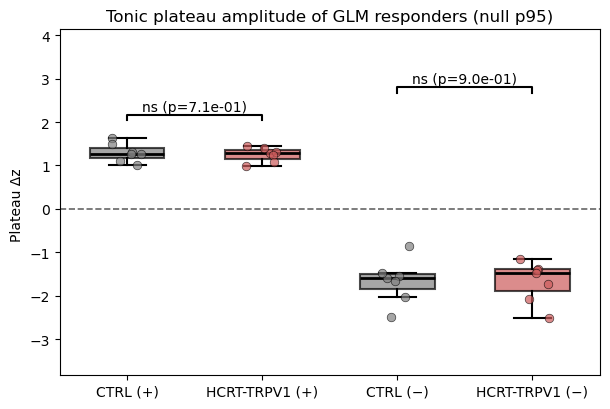

In [6]:
import numpy as np
from pathlib import Path
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt

from joblib import Parallel, delayed
from tqdm.auto import tqdm
import joblib
from contextlib import contextmanager

# =========================
# USER TOGGLES
# =========================
L_MIN = 20.0                 # plateau duration in minutes (start here)

F_NAME_FT_RAW = "data_array_f_tonic.npy"
EPS_SD = 1e-6

# parallel
try:
    N_JOBS
except NameError:
    N_JOBS = 12  # tune down if filesystem is slow

# If you used the tagged null responder filenames:
#   tonic_pos_glm_{NULL_TAG}_nullp{p}_idxs.npy
# set NULL_TAG here; otherwise set to None.
try:
    NULL_TAG
except NameError:
    NULL_TAG = None  # or "iaaft"/"shift" if you used tagged saves

# =========================
# REQUIRED TIMELINE METADATA
# =========================
# Must already exist in notebook scope:
# baseline_start, baseline_end
# drug_start, drug_end
# wash_start, wash_end
# volume_per_sec

def frames_to_min_pair(start_frame, end_frame, sampling_rate_hz):
    start_min = float(start_frame) / float(sampling_rate_hz) / 60.0
    end_min   = float(end_frame)   / float(sampling_rate_hz) / 60.0
    return (start_min, end_min)

BASELINE_MIN = frames_to_min_pair(baseline_start, baseline_end, volume_per_sec)
DRUG_EPOCH_MIN = frames_to_min_pair(drug_start, drug_end, volume_per_sec)
WASH_MIN = frames_to_min_pair(wash_start, wash_end, volume_per_sec)

print("BASELINE_MIN   =", BASELINE_MIN)
print("DRUG_EPOCH_MIN =", DRUG_EPOCH_MIN)
print("WASH_MIN       =", WASH_MIN)

# =========================
# tqdm <-> joblib bridge
# =========================
@contextmanager
def tqdm_joblib(tqdm_object):
    class TqdmBatchCompletionCallback(joblib.parallel.BatchCompletionCallBack):
        def __call__(self, *args, **kwargs):
            tqdm_object.update(n=self.batch_size)
            return super().__call__(*args, **kwargs)

    old_cb = joblib.parallel.BatchCompletionCallBack
    joblib.parallel.BatchCompletionCallBack = TqdmBatchCompletionCallback
    try:
        yield tqdm_object
    finally:
        joblib.parallel.BatchCompletionCallBack = old_cb
        tqdm_object.close()

# =========================
# Helpers
# =========================
def minutes_to_frames_full(min_pair, sr_hz, Tfull):
    """Interpret minutes in the FULL trace (t=0 is recording start). Returns [s,e)."""
    s = int(round(min_pair[0] * 60.0 * sr_hz))
    e = int(round(min_pair[1] * 60.0 * sr_hz))
    s = int(np.clip(s, 0, Tfull))
    e = int(np.clip(e, 0, Tfull))
    if e <= s:
        raise ValueError(f"Window {min_pair} empty after clipping: [{s},{e}) / Tfull={Tfull}")
    return s, e

def _idx_paths(dir_expt, ptag, null_tag=None):
    """
    Supports BOTH filename conventions:
      (A) tagged:   tonic_pos_glm_{null_tag}_nullp{p}_idxs.npy
      (B) untagged: tonic_pos_glm_nullp{p}_idxs.npy
    """
    if null_tag is not None:
        pos = dir_expt / f"tonic_pos_glm_{null_tag}_nullp{ptag}_idxs.npy"
        neg = dir_expt / f"tonic_neg_glm_{null_tag}_nullp{ptag}_idxs.npy"
        if pos.exists() and neg.exists():
            return pos, neg

    # fallback
    pos = dir_expt / f"tonic_pos_glm_nullp{ptag}_idxs.npy"
    neg = dir_expt / f"tonic_neg_glm_nullp{ptag}_idxs.npy"
    return pos, neg

def _running_mean_matrix(Z, W):
    """
    Z: (n_cells, T) float32
    returns running mean over axis=1 with window W:
      out shape: (n_cells, T-W+1)
    Uses cumsum (fast).
    """
    cs = np.cumsum(Z, axis=1, dtype=np.float64)
    cs = np.concatenate([np.zeros((Z.shape[0], 1), dtype=np.float64), cs], axis=1)
    sums = cs[:, W:] - cs[:, :-W]
    return (sums / float(W)).astype(np.float32)

def plateau_delta_z_cells(
    Ft_full_mmap,
    idx_cells,
    sr_hz,
    L_min,
    baseline_min,
    drug_epoch_min,
    sign="pos",            # "pos" or "neg"
    chunk_cells=4000,
):
    """
    Computes per-cell Δz_i for a given responder set (idx_cells),
    using plateau detection by scanning a sustained window of length L_min within drug epoch.

    Steps (per cell):
      - baseline mean/std from baseline_min in FULL trace
      - baseline-z trace z(t)
      - within drug epoch, compute running mean z over window length L_min
      - plateau_mean = max running mean (pos) OR min running mean (neg)
      - Δz_i = plateau_mean
    """
    idx_cells = np.asarray(idx_cells, dtype=np.int64)
    if idx_cells.size == 0:
        return (
            np.array([], np.float32),
            np.array([], np.int64),
            np.array([], np.int64),
        )

    n_cells, Tfull = Ft_full_mmap.shape

    idx_cells = idx_cells[(idx_cells >= 0) & (idx_cells < n_cells)]
    if idx_cells.size == 0:
        return (
            np.array([], np.float32),
            np.array([], np.int64),
            np.array([], np.int64),
        )

    b0, b1 = minutes_to_frames_full(baseline_min, sr_hz, Tfull)
    d0, d1 = minutes_to_frames_full(drug_epoch_min, sr_hz, Tfull)

    W = int(round(L_min * 60.0 * sr_hz))
    Tdrug = d1 - d0
    if W < 2:
        raise ValueError(f"L_min too small -> W={W} frames")
    if W > Tdrug:
        raise ValueError(
            f"L_min={L_min} min (W={W}) longer than drug epoch ({Tdrug} frames). Reduce L_min."
        )

    dz_out = np.zeros(idx_cells.size, dtype=np.float32)
    ws_out = np.zeros(idx_cells.size, dtype=np.int64)
    we_out = np.zeros(idx_cells.size, dtype=np.int64)

    for s in range(0, idx_cells.size, chunk_cells):
        e = min(s + chunk_cells, idx_cells.size)
        idx = idx_cells[s:e]

        Ft_sub = np.asarray(Ft_full_mmap[idx, :], dtype=np.float32)

        base_seg = Ft_sub[:, b0:b1]
        mu_b = np.mean(base_seg, axis=1)
        sd_b = np.std(base_seg, axis=1, ddof=0) + EPS_SD

        Zdrug = (Ft_sub[:, d0:d1] - mu_b[:, None]) / sd_b[:, None]

        R = _running_mean_matrix(Zdrug, W)

        if sign == "pos":
            k = np.argmax(R, axis=1)
            dz = R[np.arange(R.shape[0]), k]
        elif sign == "neg":
            k = np.argmin(R, axis=1)
            dz = R[np.arange(R.shape[0]), k]
        else:
            raise ValueError("sign must be 'pos' or 'neg'")

        start_full = (d0 + k).astype(np.int64)
        end_full = (start_full + W).astype(np.int64)

        dz_out[s:e] = dz.astype(np.float32)
        ws_out[s:e] = start_full
        we_out[s:e] = end_full

    return dz_out, ws_out, we_out

def compute_fish_plateau_effect(
    expt_ID,
    sr_hz,
    L_min=L_MIN,
    responder_null_thresh=RESPONDER_NULL_THRESH,
    null_tag=NULL_TAG,
    baseline_min=BASELINE_MIN,
    drug_epoch_min=DRUG_EPOCH_MIN,
    save_per_cell=True,
    quiet=True,
):
    """
    Loads pos/neg responder indices for this fish and computes per-cell plateau Δz_i
    and fish-level mean Δz (average over responder cells).
    Returns dict with ordered log string.
    """
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    ft_path = dir_expt / F_NAME_FT_RAW
    if not ft_path.exists():
        return None

    Ft_full = np.load(ft_path, mmap_mode="r")
    if Ft_full.ndim != 2:
        raise ValueError(f"{expt_ID}: bad Ft shape {Ft_full.shape}")

    ptag = int(responder_null_thresh)
    pos_path, neg_path = _idx_paths(dir_expt, ptag, null_tag=null_tag)
    if not (pos_path.exists() and neg_path.exists()):
        msg = f"⚠️ {expt_ID}: missing idx files:\n  {pos_path}\n  {neg_path}"
        if not quiet:
            print(msg)
        return None

    pos_idx = np.load(pos_path).astype(np.int64)
    neg_idx = np.load(neg_path).astype(np.int64)

    dz_pos, ws_pos, we_pos = plateau_delta_z_cells(
        Ft_full, pos_idx, sr_hz, L_min,
        baseline_min=baseline_min,
        drug_epoch_min=drug_epoch_min,
        sign="pos",
    )
    dz_neg, ws_neg, we_neg = plateau_delta_z_cells(
        Ft_full, neg_idx, sr_hz, L_min,
        baseline_min=baseline_min,
        drug_epoch_min=drug_epoch_min,
        sign="neg",
    )

    fish_pos = float(np.nanmean(dz_pos)) if dz_pos.size else np.nan
    fish_neg = float(np.nanmean(dz_neg)) if dz_neg.size else np.nan

    log = (
        f"✅ {expt_ID} | plateau Δz (L={L_min:g} min) | "
        f"baseline={baseline_min[0]:g}-{baseline_min[1]:g} min | "
        f"drug={drug_epoch_min[0]:g}-{drug_epoch_min[1]:g} min | "
        f"pos mean={fish_pos:.3f} (n={dz_pos.size}) | "
        f"neg mean={fish_neg:.3f} (n={dz_neg.size})"
    )
    if not quiet:
        print(log)

    if save_per_cell:
        Ltag = f"{int(round(L_min))}min"
        nt = f"_{null_tag}" if null_tag is not None else ""
        bwin = f"_b{baseline_min[0]:g}-{baseline_min[1]:g}"
        dwin = f"_d{drug_epoch_min[0]:g}-{drug_epoch_min[1]:g}"

        np.save(
            dir_expt / f"tonic_pos_plateauDz{nt}_L{Ltag}_nullp{ptag}.npy",
            dz_pos.astype(np.float32),
        )
        np.save(
            dir_expt / f"tonic_neg_plateauDz{nt}_L{Ltag}_nullp{ptag}.npy",
            dz_neg.astype(np.float32),
        )
        np.save(
            dir_expt / f"tonic_pos_plateauWin{nt}_L{Ltag}_nullp{ptag}.npy",
            np.stack([ws_pos, we_pos], axis=1).astype(np.int64),
        )
        np.save(
            dir_expt / f"tonic_neg_plateauWin{nt}_L{Ltag}_nullp{ptag}.npy",
            np.stack([ws_neg, we_neg], axis=1).astype(np.int64),
        )

    return {
        "expt_ID": expt_ID,
        "fish_pos": fish_pos,
        "fish_neg": fish_neg,
        "dz_pos": dz_pos,
        "dz_neg": dz_neg,
        "pos_idx": pos_idx,
        "neg_idx": neg_idx,
        "log": log,
    }

def process_group_plateau(
    expt_ID_list,
    group_name,
    sr_hz,
    L_min=L_MIN,
    baseline_min=BASELINE_MIN,
    drug_epoch_min=DRUG_EPOCH_MIN,
    n_jobs=N_JOBS,
):
    expt_ID_list = list(expt_ID_list)

    with tqdm_joblib(tqdm(total=len(expt_ID_list), desc=f"{group_name}: plateau Δz", leave=True)):
        results = Parallel(n_jobs=n_jobs, backend="loky")(
            delayed(compute_fish_plateau_effect)(
                expt_ID,
                sr_hz,
                L_min=L_min,
                responder_null_thresh=RESPONDER_NULL_THRESH,
                null_tag=NULL_TAG,
                baseline_min=baseline_min,
                drug_epoch_min=drug_epoch_min,
                save_per_cell=True,
                quiet=True,
            )
            for expt_ID in expt_ID_list
        )

    fish_pos, fish_neg = [], []
    for out in results:
        if out is None:
            continue
        print(out["log"])
        if np.isfinite(out["fish_pos"]):
            fish_pos.append(out["fish_pos"])
        if np.isfinite(out["fish_neg"]):
            fish_neg.append(out["fish_neg"])

    return np.array(fish_pos, np.float32), np.array(fish_neg, np.float32)

# =========================
# RUN
# =========================
sampling_rate_hz = volume_per_sec

ctrl_pos, ctrl_neg = process_group_plateau(
    ctrl_expt_ID_list,
    CTRL_TAG,
    sampling_rate_hz,
    L_min=L_MIN,
    baseline_min=BASELINE_MIN,
    drug_epoch_min=DRUG_EPOCH_MIN,
)

hcrt_pos, hcrt_neg = process_group_plateau(
    hcrt_expt_ID_list,
    EXPT_TAG,
    sampling_rate_hz,
    L_min=L_MIN,
    baseline_min=BASELINE_MIN,
    drug_epoch_min=DRUG_EPOCH_MIN,
)

p_pos = mannwhitneyu(ctrl_pos, hcrt_pos, alternative="two-sided").pvalue if (len(ctrl_pos) and len(hcrt_pos)) else np.nan
p_neg = mannwhitneyu(ctrl_neg, hcrt_neg, alternative="two-sided").pvalue if (len(ctrl_neg) and len(hcrt_neg)) else np.nan

print("\nFish-level MWU (two-sided):")
print(f"  POS plateau Δz: {CTRL_TAG} vs {EXPT_TAG} p = {p_pos:.3e}")
print(f"  NEG plateau Δz: {CTRL_TAG} vs {EXPT_TAG} p = {p_neg:.3e}")

# =========================
# PLOT
# =========================
fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)

fig_name = (
    f"tonic_plateau_dz_L{int(L_MIN)}min_"
    f"b{BASELINE_MIN[0]:g}-{BASELINE_MIN[1]:g}_"
    f"d{DRUG_EPOCH_MIN[0]:g}-{DRUG_EPOCH_MIN[1]:g}_"
    f"nullp{RESPONDER_NULL_THRESH}.png"
)
fig_path = fig_dir / fig_name

fig, ax = plt.subplots(figsize=(6.2, 4.2))
ax.axhline(0, linestyle="--", linewidth=1.2, color="black", alpha=0.6, zorder=0)

data = [ctrl_pos, hcrt_pos, ctrl_neg, hcrt_neg]
labels = [
    f"{PLOT_META[CTRL_TAG]['label']} (+)",
    f"{PLOT_META[EXPT_TAG]['label']} (+)",
    f"{PLOT_META[CTRL_TAG]['label']} (−)",
    f"{PLOT_META[EXPT_TAG]['label']} (−)",
]
positions = [0, 1, 2, 3]

bp = ax.boxplot(
    data,
    positions=positions,
    widths=0.55,
    patch_artist=True,
    showfliers=False,
    medianprops=dict(color="black", linewidth=2),
    whiskerprops=dict(color="black", linewidth=1.5),
    capprops=dict(color="black", linewidth=1.5),
)

box_groups = [CTRL_TAG, EXPT_TAG, CTRL_TAG, EXPT_TAG]
for patch, gname in zip(bp["boxes"], box_groups):
    meta = PLOT_META[gname]
    patch.set_facecolor(meta["color"])
    patch.set_alpha(meta["alpha"])
    patch.set_edgecolor("black")
    patch.set_linewidth(1.5)

rng = np.random.default_rng(0)
for x0, yvals, gname in zip(positions, data, box_groups):
    meta = PLOT_META[gname]
    if len(yvals) == 0:
        continue
    x = x0 + rng.uniform(-0.12, 0.12, size=len(yvals))
    ax.scatter(
        x, yvals,
        s=38,
        color=meta["color"],
        alpha=meta["alpha"],
        edgecolor="black",
        linewidth=0.5,
        zorder=3,
    )

ax.set_xticks(positions)
ax.set_xticklabels(labels, rotation=0)
ax.set_ylabel(
    f"Plateau Δz "
)
ax.set_title(f"Tonic plateau amplitude of GLM responders (null p{RESPONDER_NULL_THRESH})")

def star_from_p(p):
    if not np.isfinite(p):
        return "n/a"
    if p < 1e-4: return "****"
    if p < 1e-3: return "***"
    if p < 1e-2: return "**"
    if p < 5e-2: return "*"
    return "ns"

def add_sig_bar(ax, x1, x2, y, text):
    yr = ax.get_ylim()[1] - ax.get_ylim()[0]
    tick = 0.025 * yr if np.isfinite(yr) and yr > 0 else 0.1
    ax.plot([x1, x1, x2, x2], [y, y + tick, y + tick, y], lw=1.5, color="black")
    ax.text((x1 + x2) / 2, y + tick * 1.1, text, ha="center", va="bottom")

y_all = np.concatenate([d for d in data if len(d) > 0]) if any(len(d) for d in data) else np.array([0.0])
ymax = np.nanmax(y_all)
ymin = np.nanmin(y_all)
yrng = (ymax - ymin) if ymax > ymin else 1.0

y1 = ymax + 0.10 * yrng
y2 = ymax + 0.25 * yrng

add_sig_bar(ax, 0, 1, y1, f"{star_from_p(p_pos)} (p={p_pos:.1e})" if np.isfinite(p_pos) else "n/a")
add_sig_bar(ax, 2, 3, y2, f"{star_from_p(p_neg)} (p={p_neg:.1e})" if np.isfinite(p_neg) else "n/a")

ax.margins(y=0.25)
plt.tight_layout()
plt.savefig(fig_path, dpi=300, bbox_inches="tight")

print(f"📁 Figure saved to: {fig_path}")

plt.show()

## Y^ model fit vs real trace

In [ ]:
### Same plot as above, but draw separate trace for drug-locked term (U*h) vs drift term B*beta

import os, json
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# -----------------------------
# SETTINGS
# -----------------------------THR_PERCENTILE = 9.0          # responder threshold: null p99
N_SHOW = 10                    # random responders per fish
RANDOM_SEED = 0
FS_HZ_DEFAULT = 1.0            # if you don't trust meta; else meta is used
PLOT_MODE = "zscore"           # "zscore" (recommended) or "raw"
SAVE_FIGS = True

# Your filenames (consistent with your pipeline)
F_NAME_R2_REAL = "kernel_delta_r2_fit.npy"
F_NAME_R2_NULL = "kernel_delta_r2_null__iaaft.npy"
F_NAME_KERNELS = "kernel_h_hat.npy"
F_NAME_BETA    = "kernel_beta_hat.npy"
F_NAME_XMU     = "X_mu.npy"
F_NAME_XSD     = "X_sd.npy"
F_NAME_FT      = "data_array_f_tonic.npy"

# Construct the parameter-specific subfolder name
# Format: in{input}_K{K}_drift{drift}_lam{lam}_lag{lag}
param_folder_name = f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}"

# -----------------------------
# helpers
# -----------------------------
def shift_with_zeros(x, lag_frames):
    x = np.asarray(x, dtype=np.float32).ravel()
    lag = int(lag_frames)
    if lag <= 0:
        return x
    y = np.zeros_like(x)
    y[lag:] = x[:-lag]
    return y

def build_U_from_input(u, K):
    u = np.asarray(u, dtype=np.float32).ravel()
    T = u.size
    U = np.zeros((T, K), dtype=np.float32)
    for k in range(K):
        U[k:, k] = u[:T-k]
    return U

def build_poly_drift_basis(T, order):
    t = np.linspace(-1, 1, T, dtype=np.float32)
    cols = [np.ones(T, dtype=np.float32)]
    for p in range(1, int(order) + 1):
        cols.append(t**p)
    return np.stack(cols, axis=1).astype(np.float32)  # (T, order+1)

def finite_percentile(x, p):
    x = np.asarray(x, dtype=np.float32).ravel()
    x = x[np.isfinite(x)]
    if x.size == 0:
        return np.nan
    return float(np.percentile(x, p))

def zscore_1d(y, eps=1e-8):
    y = np.asarray(y, dtype=np.float32)
    m = np.nanmean(y)
    s = np.nanstd(y)
    if not np.isfinite(s) or s < eps:
        return y * 0.0
    return (y - m) / (s + eps)

def get_run_paths(expt_ID):
    base_dir = Path(dir_ants_output) / proj_ID / expt_ID
    run_dir  = base_dir / "glm" / param_folder_name
    return base_dir, run_dir

def load_u_fit_from_refit(expt_ID):
    base_dir, run_dir = get_run_paths(expt_ID)
    run_meta_path = run_dir / "RUN_META.json"
    if not run_meta_path.exists():
        raise FileNotFoundError(f"Missing RUN_META.json: {run_meta_path}")

    meta = json.loads(run_meta_path.read_text())

    fit_start   = int(meta["fit_start"])
    fit_end     = int(meta["fit_end"])
    Tfit        = int(meta["Tfit"])
    lag_frames  = int(meta.get("lag_global_frames", 0))
    input_tag   = meta.get("input_tag", "C")
    fs_hz       = float(meta.get("sampling_rate_hz", FS_HZ_DEFAULT))

    # user requested: use C_capsaicin.npy (and dC if needed)
    C_full_path  = base_dir / "C_capsaicin.npy"
    dC_full_path = base_dir / "dC_capsaicin.npy"
    if not C_full_path.exists():
        raise FileNotFoundError(f"Missing: {C_full_path}")
    if input_tag == "dC" and (not dC_full_path.exists()):
        raise FileNotFoundError(f"Missing: {dC_full_path}")

    C_full = np.load(C_full_path).astype(np.float32).ravel()
    if input_tag == "C":
        u_fit = C_full[fit_start:fit_end]
    elif input_tag == "dC":
        dC_full = np.load(dC_full_path).astype(np.float32).ravel()
        u_fit = dC_full[fit_start:fit_end]
    else:
        raise ValueError(f"{expt_ID}: RUN_META input_tag={input_tag!r} not in ['C','dC'].")

    u_fit = shift_with_zeros(u_fit, lag_frames)

    if u_fit.size != Tfit:
        raise ValueError(f"{expt_ID}: u_fit len {u_fit.size} != Tfit {Tfit}")

    return u_fit, meta, base_dir, run_dir, fs_hz

def load_aligned_dR2_and_params(expt_ID):
    _, run_dir = get_run_paths(expt_ID)

    dR2_real = np.load(run_dir / F_NAME_R2_REAL).astype(np.float32).ravel()
    dR2_null = np.load(run_dir / F_NAME_R2_NULL).astype(np.float32).ravel()

    h_hat  = np.load(run_dir / F_NAME_KERNELS).astype(np.float32)  # (n_cells, K)
    beta   = np.load(run_dir / F_NAME_BETA).astype(np.float32)     # (n_cells, nb)
    mu     = np.load(run_dir / F_NAME_XMU).astype(np.float32).reshape(1, -1)
    sd     = np.load(run_dir / F_NAME_XSD).astype(np.float32).reshape(1, -1)

    # align to ΔR² length (handles off-by-few kernel rows)
    n = dR2_real.size
    if h_hat.shape[0] < n or beta.shape[0] < n:
        raise RuntimeError(
            f"{expt_ID}: fewer model rows than ΔR² "
            f"(h={h_hat.shape[0]}, beta={beta.shape[0]}, dR2={n})"
        )
    h_hat = h_hat[:n]
    beta  = beta[:n]

    # finite mask (important)
    finite = np.isfinite(dR2_real)
    dR2_real_f = dR2_real[finite]
    dR2_null_f = dR2_null[np.isfinite(dR2_null)]  # keep finite null for percentile
    h_f        = h_hat[finite]
    beta_f     = beta[finite]

    return dR2_real_f, dR2_null_f, h_f, beta_f, mu, sd, finite

# -----------------------------
# PATCH: split Ŷ into U*h and B*β
# -----------------------------
def compute_yhat_components_for_cells(u_fit, drift_order, h_cells, beta_cells, mu, sd):
    """
    u_fit already includes lag shift.

    Builds X=[U,B], standardizes with saved mu/sd, and returns:
      yhat_U : (n_cells, Tfit)  = U*h (drug-locked component, with same z-scoring as training)
      yhat_B : (n_cells, Tfit)  = B*β (drift component, with same z-scoring as training)
      yhat_total = yhat_U + yhat_B
    """
    Tfit = u_fit.size
    K = h_cells.shape[1]

    U = build_U_from_input(u_fit, K)                 # (Tfit, K)
    B = build_poly_drift_basis(Tfit, drift_order)    # (Tfit, nb)

    nb = B.shape[1]
    P  = K + nb
    if mu.shape[1] != P or sd.shape[1] != P:
        raise ValueError(f"Design P mismatch: expected {P}, got mu/sd {mu.shape[1]}/{sd.shape[1]}")

    muU, muB = mu[:, :K],  mu[:, K:]
    sdU, sdB = sd[:, :K],  sd[:, K:]

    Uz = (U - muU) / (sdU + 1e-8)    # (Tfit, K)
    Bz = (B - muB) / (sdB + 1e-8)    # (Tfit, nb)

    # components (cells x time)
    yhat_U = (Uz @ h_cells.T).T       # (n_cells, Tfit)
    yhat_B = (Bz @ beta_cells.T).T    # (n_cells, Tfit)
    yhat_total = yhat_U + yhat_B
    return yhat_U, yhat_B, yhat_total

# -----------------------------
# main: per-fish QC overlay
# -----------------------------
def qc_overlay_one_fish(expt_ID, thr_percentile=99.0, n_show=10, seed=0, save_dir=None):
    u_fit, meta, base_dir, run_dir, fs_hz = load_u_fit_from_refit(expt_ID)
    dR2_real, dR2_null, h_hat, beta_hat, mu, sd, finite_mask = load_aligned_dR2_and_params(expt_ID)

    thr = finite_percentile(dR2_null, thr_percentile)
    if not np.isfinite(thr):
        print(f"⚠️ {expt_ID}: null percentile is NaN (no finite null).")
        return

    is_resp = dR2_real > thr
    idx_resp = np.where(is_resp)[0]
    n_resp = idx_resp.size
    n_total = dR2_real.size

    if n_resp == 0:
        print(f"⚠️ {expt_ID}: 0 responders at null p{thr_percentile}. (thr={thr:.4g})")
        return

    rng = np.random.default_rng(seed + (abs(hash(expt_ID)) % 10_000))
    n_take = min(int(n_show), n_resp)
    sel = rng.choice(idx_resp, size=n_take, replace=False)

    # load Y_fit (raw tonic) for same fit window
    Ft = np.load(base_dir / F_NAME_FT, mmap_mode="r")  # (n_cells_full, Tfull)
    fit_start = int(meta["fit_start"])
    fit_end   = int(meta["fit_end"])
    Y_fit_full = np.asarray(Ft[:, fit_start:fit_end], dtype=np.float32)  # (n_cells_full, Tfit)

    # apply same finite-mask to Y rows so indices align with dR2_real/h_hat/beta_hat
    Y_fit = Y_fit_full[finite_mask]  # (n_finite, Tfit)

    # compute prediction components for selected cells
    drift_order = int(meta.get("drift_global", drift_global))  # fallback to your global
    yhat_U, yhat_B, yhat_total = compute_yhat_components_for_cells(
        u_fit=u_fit,
        drift_order=drift_order,
        h_cells=h_hat[sel],
        beta_cells=beta_hat[sel],
        mu=mu,
        sd=sd,
    )  # each (n_take, Tfit)

    # time axis in minutes
    Tfit = int(meta["Tfit"])
    t_min = np.arange(Tfit, dtype=np.float32) / (fs_hz * 60.0)

    # 2x5 grid
    nrows, ncols = 2, 5
    fig, axes = plt.subplots(nrows, ncols, figsize=(18, 6), sharex=True, sharey=True)
    axes = np.atleast_1d(axes).ravel()

    # colors
    group, meta_group = get_group_meta(expt_ID)
    y_color = meta_group.get("color", "k")
    yU_color = "blue"
    yB_color = "green"
    yT_color = "0.5"  # gray total (optional)

    fig.suptitle(
        f"QC overlay: F_tonic vs components (U*h and B*β)\n"
        f"{expt_ID} | group={group} | responders={n_resp}/{n_total} ({100*n_resp/n_total:.2f}%) | "
        f"null p{int(thr_percentile)} thr={thr:.4g}\n{param_folder_name}",
        y=1.02
    )

    for i, ax in enumerate(axes):
        if i >= n_take:
            ax.axis("off")
            continue

        y  = Y_fit[sel[i]].copy()
        yU = yhat_U[i].copy()
        yB = yhat_B[i].copy()
        yT = yhat_total[i].copy()

        # IMPORTANT:
        # If you z-score each component separately you destroy their relative scale.
        # So normalize all traces using the SAME mean/std from total prediction yT.
        if PLOT_MODE == "zscore":
            
            # F_tonic: z-score to itself
            y = zscore_1d(y)

            # Model components: normalize using Ŷ_total scale
            m = np.nanmean(yT)
            s = np.nanstd(yT)
            if np.isfinite(s) and s > 1e-8:
                yU = (yU - m) / (s + 1e-8)
                yB = (yB - m) / (s + 1e-8)
                yT = (yT - m) / (s + 1e-8)
            else:
                yU = yU * 0.0
                yB = yB * 0.0
                yT = yT * 0.0


        ax.plot(t_min, y,  color=y_color, alpha=0.8, linewidth=1.5, label="F_tonic (z)")
        ax.plot(t_min, yU, color="blue",  linewidth=1.1, alpha=0.9, label="U·h (drug-locked)")
        ax.plot(t_min, yB, color="orange", linewidth=1.1, alpha=0.9, label="B·β (drift)")
        #ax.plot(t_min, yT, color="black",  linewidth=1.5, label="Ŷ total")


        ax.axhline(0, color="black", linewidth=0.8, linestyle="--")
        ax.set_title(f"cell idx (finite-space)={sel[i]} | ΔR²={dR2_real[sel[i]]:.3f}", fontsize=9)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

    # x label on bottom row only
    for ax in axes[-ncols:]:
        if ax.has_data():
            ax.set_xlabel("Time (min)")
    axes[0].set_ylabel("z-scaled (common scale)" if PLOT_MODE == "zscore" else "a.u.")

    # legend once (stable placement)
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper right", frameon=False)

    plt.tight_layout()

    if save_dir is not None and SAVE_FIGS:
        save_dir = Path(save_dir)
        save_dir.mkdir(parents=True, exist_ok=True)
        fname = (
            f"QC_overlay_F_vs_components_{expt_ID}_"
            f"nullP{int(thr_percentile)}_{param_folder_name}_n{n_take}_{PLOT_MODE}.png"
        )
        outpath = save_dir / fname
        fig.savefig(outpath, dpi=250, bbox_inches="tight")
        print(f"✅ Saved: {outpath}")

    plt.show()


# -----------------------------
# RUN: loop over all fish
# -----------------------------
fig_save_dir = os.path.join(dir_ants_output, proj_ID, "figures")

for expt_ID in expt_ID_list:
    try:
        qc_overlay_one_fish(
            expt_ID,
            thr_percentile=RESPONDER_NULL_THRESH,
            n_show=N_SHOW,
            seed=RANDOM_SEED,
            save_dir=fig_save_dir,
        )
    except Exception as e:
        print(f"❌ {expt_ID}: {e}")



## [GLM-Clustering]

# ⭕️ STEP 5: Phasic-d prime

## Calculate d' in baseline vs phase (discard the first 20 min in each window)

In [4]:
### (parallel process d')

sampling_rate_hz = volume_per_sec

# Define epoch boundaries IN FRAMES (full recording indices)
baseline_start_frame_full = baseline_start  # e.g., 0
baseline_end_frame_full   = baseline_end    # e.g., drug_start
drug_start_frame_full     = drug_start
drug_end_frame_full       = drug_end + 20*60  # extend 20 min lag after drug_end
 
# Window offset
OFFSET_SEC = 15 * 60

# How to define "fast amplitude" from F_phasic
# Options: "abs" (recommended), "rms", "raw"
AMPLITUDE_MODE = "raw"

# Robustness
EPS_VAR = 1e-8  # avoids divide-by-zero blowups

# -----------------------------
# Core helpers
# -----------------------------
def _get_window(start_full, end_full, sr_hz, offset_sec):
    off = int(round(offset_sec * sr_hz))
    s = int(start_full + off)
    e = int(end_full)
    if e <= s:
        raise ValueError(f"Bad window: start={s}, end={e}. (end must be > start)")
    return s, e

def _amplitude_transform(Fph):
    if AMPLITUDE_MODE == "raw":
        return Fph
    if AMPLITUDE_MODE == "abs":
        return np.abs(Fph)
    if AMPLITUDE_MODE == "rms":
        # RMS in a sliding sense is more complex; here we use squared then sqrt at the end per-window.
        # For d′ we need a per-timepoint series, so we use squared signal as "energy" proxy.
        # (Equivalently, you can use abs; it's usually fine.)
        return Fph**2
    raise ValueError("AMPLITUDE_MODE must be one of: raw, abs, rms")

def dprime_per_cell(Fphasic, idx_base, idx_drug):
    """
    Fphasic: (n_cells, Tfull)
    idx_base, idx_drug: slices or index arrays for time
    returns:
      dprime: (n_cells,)
      delta_mean: (n_cells,) = mean(drug) - mean(base) in the chosen amplitude domain
    """
    A = _amplitude_transform(Fphasic).astype(np.float32)  # (n_cells, T)

    base = A[:, idx_base]  # (n_cells, Tb)
    drug = A[:, idx_drug]  # (n_cells, Td)

    mu_b = np.nanmean(base, axis=1)
    mu_d = np.nanmean(drug, axis=1)

    # variance across time within each window
    var_b = np.nanvar(base, axis=1, ddof=1)
    var_d = np.nanvar(drug, axis=1, ddof=1)

    denom = np.sqrt((var_b + var_d) / 2.0 + EPS_VAR)
    dprime = (mu_d - mu_b) / denom
    delta_mean = (mu_d - mu_b)

    # If AMPLITUDE_MODE == "rms", convert delta_mean back to RMS-ish scale (optional)
    # Leaving it in squared units is consistent but less interpretable.
    return dprime.astype(np.float32), delta_mean.astype(np.float32)

def summarize_fish(dprime_cells):
    return {
        "mean": float(np.nanmean(dprime_cells)),
        "median": float(np.nanmedian(dprime_cells)),
        "p99": float(np.nanpercentile(dprime_cells, 99)),
        "n_cells": int(np.sum(np.isfinite(dprime_cells))),
    }

def star_from_p(p):
    if p < 1e-4: return "****"
    if p < 1e-3: return "***"
    if p < 1e-2: return "**"
    if p < 5e-2: return "*"
    return "ns"

def add_sig_bar(ax, x1, x2, y, text):
    ax.plot([x1, x1, x2, x2], [y, y*1.02, y*1.02, y], lw=1.5)
    ax.text((x1+x2)/2, y*1.03, text, ha="center", va="bottom")
# -----------------------------

def _process_one_fish_dprime(
    expt_ID,
    group_name,
    dir_ants_output,
    proj_ID,
    idx_base,
    idx_drug,
    b_e,
    d_e,
    AMPLITUDE_MODE,
):
    out_dir = Path(dir_ants_output) / proj_ID / expt_ID
    Fp_path = out_dir / "data_array_f_phasic.npy"
    if not Fp_path.exists():
        raise FileNotFoundError(f"Missing: {Fp_path}")

    # memmap load
    Fp = np.load(Fp_path, mmap_mode="r")  # (n_cells, Tfull)
    n_cells, Tfull = Fp.shape
    if b_e > Tfull or d_e > Tfull:
        raise ValueError(f"{expt_ID}: window exceeds Tfull={Tfull}")

    dprime_cells, delta_mean_cells = dprime_per_cell(Fp, idx_base, idx_drug)

    # Save per-fish results (cells)
    np.save(out_dir / f"phasic_dprime_cells_{AMPLITUDE_MODE}.npy", dprime_cells)
    np.save(out_dir / f"phasic_deltaMean_cells_{AMPLITUDE_MODE}.npy", delta_mean_cells)

    summ = summarize_fish(dprime_cells)
    summ.update({"expt_ID": expt_ID, "group": group_name})

    # lightweight extra stats for logging
    p5, p25, p75, p95 = np.nanpercentile(dprime_cells, [5, 25, 75, 95])
    summ.update({"p5": float(p5), "p25": float(p25), "p75": float(p75), "p95": float(p95)})

    # explicitly release
    del Fp, dprime_cells, delta_mean_cells
    gc.collect()

    return summ

def process_group_parallel(
    expt_ID_list,
    group_name,
    dir_ants_output,
    proj_ID,
    idx_base,
    idx_drug,
    b_e,
    d_e,
    AMPLITUDE_MODE,
    n_jobs=8,
    verbose_print=True,
):
    # run in parallel
    summaries = Parallel(n_jobs=n_jobs, backend="loky", prefer="processes")(
        delayed(_process_one_fish_dprime)(
            expt_ID=expt_ID,
            group_name=group_name,
            dir_ants_output=dir_ants_output,
            proj_ID=proj_ID,
            idx_base=idx_base,
            idx_drug=idx_drug,
            b_e=b_e,
            d_e=d_e,
            AMPLITUDE_MODE=AMPLITUDE_MODE,
        )
        for expt_ID in tqdm(expt_ID_list, desc=f"d' {group_name}", unit="fish")
    )

    # optional: print after (printing inside workers is messy)
    if verbose_print:
        for s in summaries:
            print(
                f"✅ {s['expt_ID']} [{s['group']}] | "
                f"mean d'={s['mean']:.3f}, median={s['median']:.3f}, "
                f"p5={s['p5']:.3f}, p25={s['p25']:.3f}, p75={s['p75']:.3f}, p95={s['p95']:.3f}, "
                f"n_cells={s['n_cells']}"
            )

    mean_per_fish = np.array([s["mean"] for s in summaries], dtype=np.float32)
    return summaries, mean_per_fish

# -----------------------------
# Build windows (same as you had)
# -----------------------------
sampling_rate_hz = volume_per_sec

b_s, b_e = _get_window(baseline_start_frame_full, baseline_end_frame_full, sampling_rate_hz, OFFSET_SEC)
d_s, d_e = _get_window(drug_start_frame_full, drug_end_frame_full, sampling_rate_hz, OFFSET_SEC)

idx_base = slice(b_s, b_e)
idx_drug = slice(d_s, d_e)

print(f"Baseline window: frames [{b_s}, {b_e})  ({(b_e-b_s)/sampling_rate_hz/60:.1f} min)")
print(f"Drug window:     frames [{d_s}, {d_e})  ({(d_e-d_s)/sampling_rate_hz/60:.1f} min)")
print(f"Amplitude mode: {AMPLITUDE_MODE}")

# -----------------------------
# Run (parallel)
# -----------------------------
N_JOBS = 28  # set to e.g. os.cpu_count()//2

summ_ctrl, mean_ctrl = process_group_parallel(
    ctrl_expt_ID_list, CTRL_TAG,
    dir_ants_output, proj_ID,
    idx_base, idx_drug,
    b_e, d_e,
    AMPLITUDE_MODE,
    n_jobs=N_JOBS,
)

summ_hcrt, mean_hcrt = process_group_parallel(
    hcrt_expt_ID_list, EXPT_TAG,
    dir_ants_output, proj_ID,
    idx_base, idx_drug,
    b_e, d_e,
    AMPLITUDE_MODE,
    n_jobs=N_JOBS,
)


Baseline window: frames [900, 2700)  (30.0 min)
Drug window:     frames [3660, 6600)  (49.0 min)
Amplitude mode: raw


d' CTRL:   0%|          | 0/7 [00:00<?, ?fish/s]

/tmp/ipykernel_628160/2608171270.py:57: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:57: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:58: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:57: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:61: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_628160/2608171270.py:58: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:58: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:61: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_628160/2608171270.py:62: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_628160/2608171270.py:61: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_628160/2608171270.py:62: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_628160/2608171270.py:62: RuntimeWarning: Degrees of freedom <= 0 for slice

✅ 251021_huc-h2b-g8m_csn_10uM_fish1 [CTRL] | mean d'=0.103, median=0.108, p5=-0.062, p25=0.053, p75=0.157, p95=0.248, n_cells=485698
✅ 251118_huc-h2b-g8m_csn_10uM_fish1 [CTRL] | mean d'=-0.009, median=-0.008, p5=-0.118, p25=-0.052, p75=0.035, p95=0.097, n_cells=474057
✅ 251118_huc-h2b-g8m_csn_10uM_fish2 [CTRL] | mean d'=-0.036, median=-0.022, p5=-0.212, p25=-0.070, p75=0.017, p95=0.080, n_cells=432666
✅ 251118_huc-h2b-g8m_csn_10uM_fish3 [CTRL] | mean d'=-0.031, median=-0.023, p5=-0.174, p25=-0.070, p75=0.017, p95=0.084, n_cells=513913
✅ 251118_huc-h2b-g8m_csn_10uM_fish4 [CTRL] | mean d'=0.071, median=0.080, p5=-0.064, p25=0.040, p75=0.115, p95=0.174, n_cells=491865
✅ 251118_huc-h2b-g8m_csn_10uM_fish5 [CTRL] | mean d'=-0.013, median=-0.010, p5=-0.128, p25=-0.050, p75=0.027, p95=0.092, n_cells=443539
✅ 251126_huc-h2b-g8m_csn_10uM_fish1 [CTRL] | mean d'=-0.043, median=-0.047, p5=-0.185, p25=-0.093, p75=0.003, p95=0.113, n_cells=516857


d' HCRT-TRPV1:   0%|          | 0/7 [00:00<?, ?fish/s]

/tmp/ipykernel_628160/2608171270.py:57: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:57: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:57: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:58: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:58: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:57: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:58: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:61: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_628160/2608171270.py:61: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_628160/2608171270.py:61: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_628160/2608171270.py:58: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_628160/2608171270.py:62: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_628160/260817

✅ 251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4 [HCRT-TRPV1] | mean d'=-0.048, median=-0.052, p5=-0.245, p25=-0.114, p75=0.011, p95=0.161, n_cells=581214
✅ 251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2 [HCRT-TRPV1] | mean d'=-0.018, median=-0.027, p5=-0.135, p25=-0.067, p75=0.023, p95=0.131, n_cells=464711
✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1 [HCRT-TRPV1] | mean d'=-0.017, median=-0.019, p5=-0.171, p25=-0.072, p75=0.034, p95=0.146, n_cells=483194
✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2 [HCRT-TRPV1] | mean d'=-0.071, median=-0.050, p5=-0.349, p25=-0.144, p75=0.019, p95=0.130, n_cells=516321
✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish3 [HCRT-TRPV1] | mean d'=0.101, median=0.113, p5=-0.116, p25=0.042, p75=0.171, p95=0.281, n_cells=542591
✅ 260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish1 [HCRT-TRPV1] | mean d'=0.086, median=0.096, p5=-0.074, p25=0.037, p75=0.143, p95=0.209, n_cells=416225
✅ 260113_hcrt-trpv1_huc-h2b-g8m_csn_5uM_fish2 [HCRT-TRPV1] | mean d'=0.054, median=0.063,

## [d' box plot] Fraction of cells with +SD/-SD increased/decreased d' 


Fish-level MWU p-values (POS thresholds):
  d′ >= 0.5 : p = 1.748e-02
  d′ >= 0.6 : p = 3.788e-02
  d′ >= 0.7 : p = 7.284e-02
📁 Saved figure: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/phasic_frac_pos_thresholds_raw.png


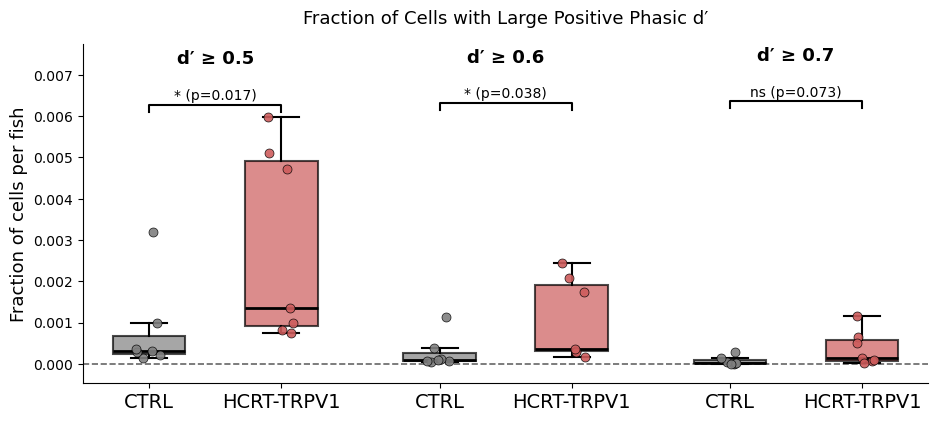


Fish-level MWU p-values (NEG thresholds):
  d′ <= -0.5 : p = 3.829e-01
  d′ <= -0.6 : p = 3.829e-01
  d′ <= -0.7 : p = 3.176e-01
📁 Saved figure: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/phasic_frac_neg_thresholds_raw.png


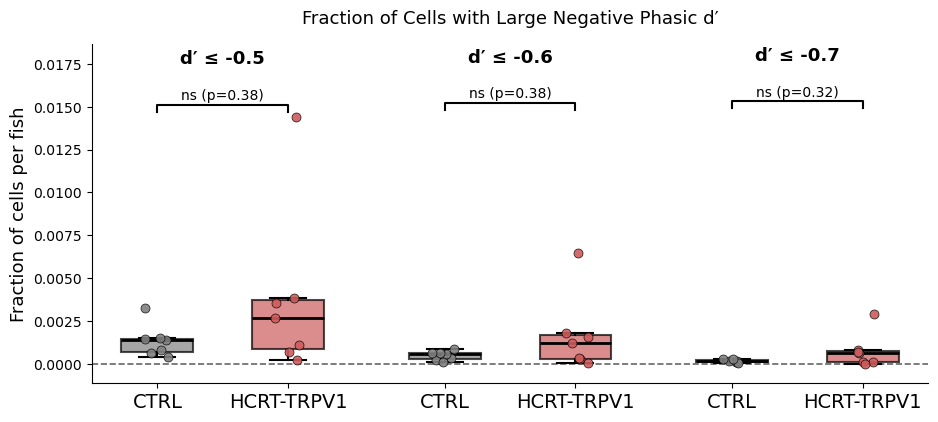

In [39]:
# =========================
# REQUIRED INPUTS
# =========================
AMPLITUDE_MODE = "raw"   # must match saved d'
# expects: dir_ants_output, proj_ID, ctrl_expt_ID_list, hcrt_expt_ID_list, PLOT_META in scope

# user thresholds
pos_phasic_thresh = [0.5, 0.6, 0.7]
neg_phasic_thresh = [-0.5, -0.6, -0.7]

# =========================
# Helpers
# =========================
def star_from_p(p):
    if p < 1e-4: return "****"
    if p < 1e-3: return "***"
    if p < 1e-2: return "**"
    if p < 5e-2: return "*"
    return "ns"

def add_sig_bar(ax, x1, x2, y, text, tier_label=None,
                bar_h=0.003, text_pad=0.0015, tier_pad=0.006):
    """
    Draw a compact significance bracket.

    Parameters
    ----------
    y : float
        Bottom of bracket legs in DATA units.
    bar_h : float
        Height of the bracket in DATA units.
    text_pad : float
        Vertical offset for significance text above bracket.
    tier_pad : float
        Vertical offset for tier label above bracket.
    """
    y_top = y + bar_h

    # compact bracket
    ax.plot([x1, x1, x2, x2],
            [y,  y_top, y_top, y],
            lw=1.5, color="black", clip_on=False)

    # p-value / stars
    ax.text((x1 + x2) / 2, y_top + text_pad, text,
            ha="center", va="bottom", fontsize=10)

    # threshold label
    if tier_label is not None:
        ax.text((x1 + x2) / 2, y_top + tier_pad, tier_label,
                ha="center", va="bottom", fontsize=13, fontweight="bold")

def _finite_1d(x):
    x = np.asarray(x).reshape(-1)
    return x[np.isfinite(x)]

def mwu_p(a, b):
    a = _finite_1d(a)
    b = _finite_1d(b)
    if a.size == 0 or b.size == 0:
        return np.nan
    return mannwhitneyu(a, b, alternative="two-sided").pvalue

def frac_cells_above(dprime_cells, thr):
    x = _finite_1d(dprime_cells).astype(np.float32)
    if x.size == 0:
        return np.nan
    return float(np.mean(x >= float(thr)))

def frac_cells_below(dprime_cells, thr):
    x = _finite_1d(dprime_cells).astype(np.float32)
    if x.size == 0:
        return np.nan
    return float(np.mean(x <= float(thr)))

def read_group_fracs(expt_ID_list, group_name, thresh_list, mode="pos"):
    fracs_by_thr = [[] for _ in thresh_list]
    summaries = []

    for expt_ID in expt_ID_list:
        out_dir = Path(dir_ants_output) / proj_ID / expt_ID
        dprime_path = out_dir / f"phasic_dprime_cells_{AMPLITUDE_MODE}.npy"
        if not dprime_path.exists():
            raise FileNotFoundError(f"Missing saved d' file: {dprime_path}")

        dprime_cells = np.load(dprime_path).astype(np.float32)
        x = _finite_1d(dprime_cells)

        if x.size == 0:
            print(f"⚠️ {expt_ID} [{group_name}] all non-finite d′, skipped")
            continue

        summ = {"expt_ID": expt_ID, "group": group_name, "n_cells": int(x.size)}
        for i, thr in enumerate(thresh_list):
            if mode == "pos":
                f = frac_cells_above(x, thr)
            elif mode == "neg":
                f = frac_cells_below(x, thr)
            else:
                raise ValueError("mode must be 'pos' or 'neg'")
            fracs_by_thr[i].append(f)
            summ[f"frac@{thr}"] = f

        summaries.append(summ)

    fracs_by_thr = [np.asarray(v, dtype=np.float32) for v in fracs_by_thr]
    return summaries, fracs_by_thr

def _plot_threshold_panel(
    ctrl_fracs_by_thr, hcrt_fracs_by_thr,
    thresh_list, p_by_thr,
    title, fig_path
):
    assert len(ctrl_fracs_by_thr) == len(thresh_list)
    assert len(hcrt_fracs_by_thr) == len(thresh_list)
    assert len(p_by_thr) == len(thresh_list)

    fig, ax = plt.subplots(figsize=(9.5, 4.6))
    ax.axhline(0, linestyle="--", linewidth=1.2, color="black", alpha=0.6, zorder=0)

    # data interleaved CTRL/HCRT per threshold
    data = []
    labels = []
    for thr in thresh_list:
        labels += [CTRL_TAG, EXPT_TAG]
    for i in range(len(thresh_list)):
        data.append(ctrl_fracs_by_thr[i])
        data.append(hcrt_fracs_by_thr[i])

    # positions: pairs spaced by threshold
    positions = []
    x0 = 0.0
    for _ in range(len(thresh_list)):
        positions += [x0, x0 + 1.0]
        x0 += 2.2

    bp = ax.boxplot(
        data,
        positions=positions,
        widths=0.55,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(color="black", linewidth=2),
        whiskerprops=dict(color="black", linewidth=1.5),
        capprops=dict(color="black", linewidth=1.5),
    )

    colors = []
    alphas = []
    for _ in thresh_list:
        colors += [PLOT_META[CTRL_TAG]["color"], PLOT_META[EXPT_TAG]["color"]]
        alphas += [PLOT_META[CTRL_TAG]["alpha"], PLOT_META[EXPT_TAG]["alpha"]]

    for patch, c, a in zip(bp["boxes"], colors, alphas):
        patch.set_facecolor(c)
        patch.set_alpha(a)
        patch.set_edgecolor("black")
        patch.set_linewidth(1.5)

    # jittered fish points
    rng = np.random.default_rng(0)
    for xpos, vals, c in zip(positions, data, colors):
        vals = _finite_1d(vals)
        jitter = rng.uniform(-0.10, 0.10, size=len(vals))
        ax.scatter(
            xpos + jitter, vals,
            s=42, color=c, alpha=0.9,
            edgecolor="black", linewidth=0.5,
            zorder=3,
        )

    ax.set_xticks(positions)
    ax.set_xticklabels(labels)
    ax.set_ylabel("Fraction of cells per fish", fontsize=13)
    ax.tick_params(axis='x', labelsize=14)
    
    # Move title clearly above the threshold labels
    ax.set_title(title, pad=15, fontsize=13)

    # ---------- compact sig bars + threshold labels ----------
    finite_blocks = [_finite_1d(v) for v in data if _finite_1d(v).size > 0]
    all_vals = np.concatenate(finite_blocks) if finite_blocks else np.array([0.0])

    ymax = float(np.nanmax(all_vals)) if all_vals.size else 1.0
    ymin = float(np.nanmin(all_vals)) if all_vals.size else 0.0
    yrng = ymax - ymin
    if yrng <= 0:
        yrng = max(abs(ymax), 1.0)

    # keep bars short
    bar_h    = 0.03 * yrng
    text_pad = 0.008 * yrng
    tier_pad = 0.15 * yrng

    # place brackets just above data, with only a small stagger
    base_y = ymax + 0.02 * yrng
    step_y = 0.008 * yrng

    for k, (thr, p) in enumerate(zip(thresh_list, p_by_thr)):
        if not np.isfinite(p):
            continue

        x1 = positions[2 * k]
        x2 = positions[2 * k + 1]
        tier_label = f"d′ ≥ {thr:g}" if thr >= 0 else f"d′ ≤ {thr:g}"

        add_sig_bar(
            ax, x1, x2,
            y=base_y + k * step_y,
            text=f"{star_from_p(p)} (p={p:.2g})",
            tier_label=tier_label,
            bar_h=bar_h,
            text_pad=text_pad,
            tier_pad=tier_pad,
        )

    # leave enough headroom for bars + tier labels + title
    top_needed = base_y + (len(thresh_list) - 1) * step_y + bar_h + tier_pad + 0.08 * yrng
    ax.set_ylim(ymin - 0.08 * yrng, top_needed)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # reserve top margin so title sits above the d′ labels
    plt.tight_layout(rect=[0, 0, 1, 0.94])

    plt.savefig(fig_path, dpi=300, bbox_inches="tight")
    print(f"📁 Saved figure: {fig_path}")
    plt.show()

# =========================
# Run + plot: POS thresholds
# =========================
summ_ctrl_pos, ctrl_fracs_pos = read_group_fracs(ctrl_expt_ID_list, CTRL_TAG, pos_phasic_thresh, mode="pos")
summ_hcrt_pos, hcrt_fracs_pos = read_group_fracs(hcrt_expt_ID_list, EXPT_TAG, pos_phasic_thresh, mode="pos")

p_pos = [mwu_p(ctrl_fracs_pos[i], hcrt_fracs_pos[i]) for i in range(len(pos_phasic_thresh))]

print("\nFish-level MWU p-values (POS thresholds):")
for thr, p in zip(pos_phasic_thresh, p_pos):
    print(f"  d′ >= {thr:g} : p = {p:.3e}" if np.isfinite(p) else f"  d′ >= {thr:g} : p = NA")

fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)

_plot_threshold_panel(
    ctrl_fracs_pos, hcrt_fracs_pos,
    pos_phasic_thresh, p_pos,
    title="Fraction of Cells with Large Positive Phasic d′",
    fig_path=fig_dir / f"phasic_frac_pos_thresholds_{AMPLITUDE_MODE}.png"
)

# =========================
# Run + plot: NEG thresholds
# =========================
summ_ctrl_neg, ctrl_fracs_neg = read_group_fracs(ctrl_expt_ID_list, CTRL_TAG, neg_phasic_thresh, mode="neg")
summ_hcrt_neg, hcrt_fracs_neg = read_group_fracs(hcrt_expt_ID_list, EXPT_TAG, neg_phasic_thresh, mode="neg")

p_neg = [mwu_p(ctrl_fracs_neg[i], hcrt_fracs_neg[i]) for i in range(len(neg_phasic_thresh))]

print("\nFish-level MWU p-values (NEG thresholds):")
for thr, p in zip(neg_phasic_thresh, p_neg):
    print(f"  d′ <= {thr:g} : p = {p:.3e}" if np.isfinite(p) else f"  d′ <= {thr:g} : p = NA")

_plot_threshold_panel(
    ctrl_fracs_neg, hcrt_fracs_neg,
    neg_phasic_thresh, p_neg,
    title="Fraction of Cells with Large Negative Phasic d′",
    fig_path=fig_dir / f"phasic_frac_neg_thresholds_{AMPLITUDE_MODE}.png"
)


## [d' box plot] Fraction of cells with TOP increased/decreased d' 


Fish-level MWU p-values (INCREASE / most positive):
  mean   p = 9.015e-01
  p95    p = 5.303e-02
  p99    p = 1.748e-02
📁 Saved figure: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/phasic_dprime_increase_mean_top5_top1_raw.png


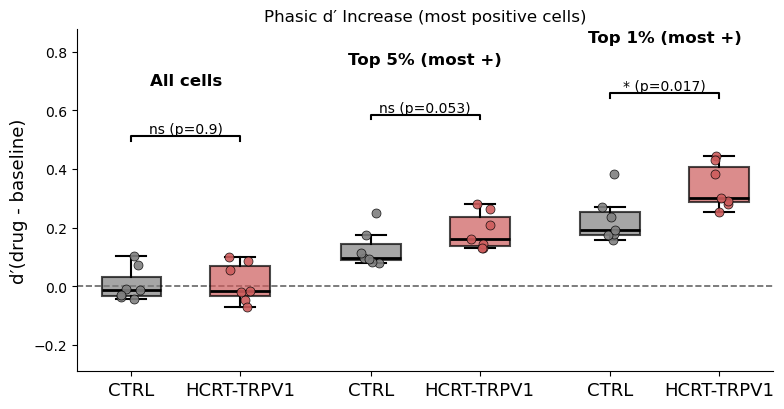


Fish-level MWU p-values (DECREASE / most negative):
  mean   p = 9.015e-01
  p05    p = 4.557e-01
  p01    p = 3.176e-01
📁 Saved figure: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/phasic_dprime_decrease_mean_top5_top1_raw.png


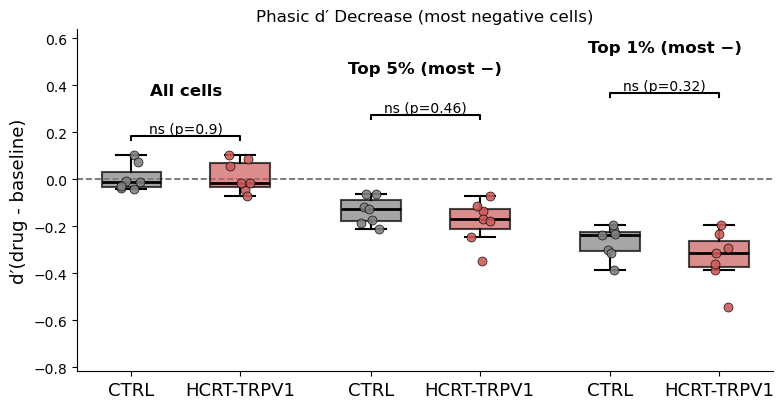

In [42]:

# =========================
# REQUIRED INPUTS
# =========================
AMPLITUDE_MODE = "raw"   # must match saved d'
# expects: dir_ants_output, proj_ID, ctrl_expt_ID_list, hcrt_expt_ID_list, PLOT_META in scope

# =========================
# Helpers
# =========================
def star_from_p(p):
    if p < 1e-4: return "****"
    if p < 1e-3: return "***"
    if p < 1e-2: return "**"
    if p < 5e-2: return "*"
    return "ns"

def add_sig_bar(ax, x1, x2, y, text, tier_label=None, dy_star=0.016, dy_tier=0.18):
    """
    y is the BASE height of the bracket.
    dy_star and dy_tier are vertical offsets in DATA UNITS.
    """
    ax.plot([x1, x1, x2, x2], [y, y + dy_star, y + dy_star, y],
            lw=1.5, color="black")
    ax.text((x1 + x2) / 2, y + dy_star, text,
            ha="center", va="bottom", fontsize=10)
    if tier_label is not None:
        ax.text((x1 + x2) / 2, y + dy_tier, tier_label,
                ha="center", va="bottom", fontsize=12, fontweight="bold")

def _finite_1d(x):
    x = np.asarray(x).reshape(-1)
    return x[np.isfinite(x)]

def mwu_p(a, b):
    a = _finite_1d(a)
    b = _finite_1d(b)
    if a.size == 0 or b.size == 0:
        return np.nan
    return mannwhitneyu(a, b, alternative="two-sided").pvalue

def summarize_fish_from_cells_pos(dprime_cells):
    """Increase panel: mean + top 5%/1% most positive."""
    x = _finite_1d(dprime_cells).astype(np.float32)
    if x.size == 0:
        return None
    return {
        "mean": float(np.nanmean(x)),
        "p95":  float(np.nanpercentile(x, 95)),  # top 5% most positive
        "p99":  float(np.nanpercentile(x, 99)),  # top 1% most positive
        "n_cells": int(x.size),
    }

def summarize_fish_from_cells_neg(dprime_cells):
    """
    Decrease panel:
      - mean (signed, same as pos)
      - top 5%/1% MOST NEGATIVE cells
        i.e. 5th percentile and 1st percentile.
    """
    x = _finite_1d(dprime_cells).astype(np.float32)
    if x.size == 0:
        return None
    return {
        "mean": float(np.nanmean(x)),
        "p05":  float(np.nanpercentile(x, 5)),   # most negative 5%
        "p01":  float(np.nanpercentile(x, 1)),   # most negative 1%
        "n_cells": int(x.size),
    }

def read_group_metrics(expt_ID_list, group_name, mode="pos"):
    """
    mode:
      - "pos": mean, p95, p99
      - "neg": mean, p05, p01  (most negative)
    """
    vals_mean = []
    vals_a = []  # p95 or p05
    vals_b = []  # p99 or p01
    summaries = []

    for expt_ID in expt_ID_list:
        out_dir = Path(dir_ants_output) / proj_ID / expt_ID
        dprime_path = out_dir / f"phasic_dprime_cells_{AMPLITUDE_MODE}.npy"
        if not dprime_path.exists():
            raise FileNotFoundError(f"Missing saved d' file: {dprime_path}")

        dprime_cells = np.load(dprime_path).astype(np.float32)

        if mode == "pos":
            summ = summarize_fish_from_cells_pos(dprime_cells)
        elif mode == "neg":
            summ = summarize_fish_from_cells_neg(dprime_cells)
        else:
            raise ValueError("mode must be 'pos' or 'neg'")

        if summ is None:
            print(f"⚠️ {expt_ID} [{group_name}] all non-finite d′, skipped")
            continue

        summ.update({"expt_ID": expt_ID, "group": group_name})
        summaries.append(summ)

        vals_mean.append(summ["mean"])
        if mode == "pos":
            vals_a.append(summ["p95"])
            vals_b.append(summ["p99"])
          #  print(f"✅ {expt_ID} [{group_name}] | mean={summ['mean']:.3f}, top5%(p95)={summ['p95']:.3f}, top1%(p99)={summ['p99']:.3f} | n={summ['n_cells']}")
        else:
            vals_a.append(summ["p05"])
            vals_b.append(summ["p01"])
         #   print(f"✅ {expt_ID} [{group_name}] | mean={summ['mean']:.3f}, mostNeg5%(p05)={summ['p05']:.3f}, mostNeg1%(p01)={summ['p01']:.3f} | n={summ['n_cells']}")

    return (
        summaries,
        np.asarray(vals_mean, dtype=np.float32),
        np.asarray(vals_a, dtype=np.float32),
        np.asarray(vals_b, dtype=np.float32),
    )

def _plot_one_panel(
    ctrl_mean, hcrt_mean,
    ctrl_a, hcrt_a,
    ctrl_b, hcrt_b,
    p_mean, p_a, p_b,
    tier_a_label, tier_b_label,
    title, fig_path
):
    # =========================
    # Plot: 3 tiers x 2 groups = 6 boxes (single axis)
    # =========================
    fig, ax = plt.subplots(figsize=(8.0, 4.2))
    ax.axhline(0, linestyle="--", linewidth=1.2, color="black", alpha=0.6, zorder=0)

    data = [ctrl_mean, hcrt_mean, ctrl_a, hcrt_a, ctrl_b, hcrt_b]
    positions = [0.0, 1.0,  2.2, 3.2,  4.4, 5.4]
    labels = [CTRL_TAG,EXPT_TAG,CTRL_TAG,EXPT_TAG,CTRL_TAG,EXPT_TAG]

    bp = ax.boxplot(
        data,
        positions=positions,
        widths=0.55,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(color="black", linewidth=2),
        whiskerprops=dict(color="black", linewidth=1.5),
        capprops=dict(color="black", linewidth=1.5),
    )

    colors = [
        PLOT_META[CTRL_TAG]["color"], PLOT_META[EXPT_TAG]["color"],
        PLOT_META[CTRL_TAG]["color"], PLOT_META[EXPT_TAG]["color"],
        PLOT_META[CTRL_TAG]["color"], PLOT_META[EXPT_TAG]["color"],
    ]
    alphas = [
        PLOT_META[CTRL_TAG]["alpha"], PLOT_META[EXPT_TAG]["alpha"],
        PLOT_META[CTRL_TAG]["alpha"], PLOT_META[EXPT_TAG]["alpha"],
        PLOT_META[CTRL_TAG]["alpha"], PLOT_META[EXPT_TAG]["alpha"],
    ]

    for patch, c, a in zip(bp["boxes"], colors, alphas):
        patch.set_facecolor(c)
        patch.set_alpha(a)
        patch.set_edgecolor("black")
        patch.set_linewidth(1.5)

    # jittered fish points
    rng = np.random.default_rng(0)
    for x0, vals, c in zip(positions, data, colors):
        vals = _finite_1d(vals)
        jitter = rng.uniform(-0.10, 0.10, size=len(vals))
        ax.scatter(
            x0 + jitter, vals,
            s=42, color=c, alpha=0.9,
            edgecolor="black", linewidth=0.5,
            zorder=3,
        )

    ax.set_xticks(positions)
    ax.set_xticklabels(labels)
    ax.tick_params(axis='x', labelsize=13)
    ax.set_ylabel("d′(drug - baseline)", fontsize=13)
    ax.set_title(title)

    # =========================
    # Significance bars + tier labels ABOVE them
    # =========================
    all_vals = np.concatenate([_finite_1d(v) for v in data]) if len(data) else np.array([0.0])
    ymax = float(np.nanmax(all_vals)) if all_vals.size else 1.0
    ymin = float(np.nanmin(all_vals)) if all_vals.size else 0.0
    yrng = (ymax - ymin) if ymax > ymin else 1.0

    base_y = ymax + 0.10 * yrng
    step_y = 0.14 * yrng

    if np.isfinite(p_mean):
        add_sig_bar(ax, positions[0], positions[1], base_y + 0*step_y,
                    f"{star_from_p(p_mean)} (p={p_mean:.2g})", tier_label="All cells")
    if np.isfinite(p_a):
        add_sig_bar(ax, positions[2], positions[3], base_y + 1*step_y,
                    f"{star_from_p(p_a)} (p={p_a:.2g})", tier_label=tier_a_label)
    if np.isfinite(p_b):
        add_sig_bar(ax, positions[4], positions[5], base_y + 2*step_y,
                    f"{star_from_p(p_b)} (p={p_b:.2g})", tier_label=tier_b_label)

    ax.margins(y=0.30)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    plt.tight_layout()

    plt.savefig(fig_path, dpi=300, bbox_inches="tight")
    print(f"📁 Saved figure: {fig_path}")
    plt.show()

# =========================
# Panel 1: Phasic increase (most positive)
# =========================
summ_ctrl_pos, ctrl_mean_pos, ctrl_p95, ctrl_p99 = read_group_metrics(ctrl_expt_ID_list, CTRL_TAG, mode="pos")
summ_hcrt_pos, hcrt_mean_pos, hcrt_p95, hcrt_p99 = read_group_metrics(hcrt_expt_ID_list, EXPT_TAG, mode="pos")

p_mean_pos = mwu_p(ctrl_mean_pos, hcrt_mean_pos)
p_p95      = mwu_p(ctrl_p95,      hcrt_p95)
p_p99      = mwu_p(ctrl_p99,      hcrt_p99)

print("\nFish-level MWU p-values (INCREASE / most positive):")
print(f"  mean   p = {p_mean_pos:.3e}" if np.isfinite(p_mean_pos) else "  mean   p = NA")
print(f"  p95    p = {p_p95:.3e}"      if np.isfinite(p_p95)      else "  p95    p = NA")
print(f"  p99    p = {p_p99:.3e}"      if np.isfinite(p_p99)      else "  p99    p = NA")

fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)

_plot_one_panel(
    ctrl_mean_pos, hcrt_mean_pos,
    ctrl_p95, hcrt_p95,
    ctrl_p99, hcrt_p99,
    p_mean_pos, p_p95, p_p99,
    tier_a_label="Top 5% (most +)",
    tier_b_label="Top 1% (most +)",
    title="Phasic d′ Increase (most positive cells)",
    fig_path=fig_dir / f"phasic_dprime_increase_mean_top5_top1_{AMPLITUDE_MODE}.png"
)

# =========================
# Panel 2: Phasic decrease (most negative)
# =========================
summ_ctrl_neg, ctrl_mean_neg, ctrl_p05, ctrl_p01 = read_group_metrics(ctrl_expt_ID_list, CTRL_TAG, mode="neg")
summ_hcrt_neg, hcrt_mean_neg, hcrt_p05, hcrt_p01 = read_group_metrics(hcrt_expt_ID_list, EXPT_TAG, mode="neg")

p_mean_neg = mwu_p(ctrl_mean_neg, hcrt_mean_neg)
p_p05      = mwu_p(ctrl_p05,      hcrt_p05)
p_p01      = mwu_p(ctrl_p01,      hcrt_p01)

print("\nFish-level MWU p-values (DECREASE / most negative):")
print(f"  mean   p = {p_mean_neg:.3e}" if np.isfinite(p_mean_neg) else "  mean   p = NA")
print(f"  p05    p = {p_p05:.3e}"      if np.isfinite(p_p05)      else "  p05    p = NA")
print(f"  p01    p = {p_p01:.3e}"      if np.isfinite(p_p01)      else "  p01    p = NA")

_plot_one_panel(
    ctrl_mean_neg, hcrt_mean_neg,
    ctrl_p05, hcrt_p05,
    ctrl_p01, hcrt_p01,
    p_mean_neg, p_p05, p_p01,
    tier_a_label="Top 5% (most −)",
    tier_b_label="Top 1% (most −)",
    title="Phasic d′ Decrease (most negative cells)",
    fig_path=fig_dir / f"phasic_dprime_decrease_mean_top5_top1_{AMPLITUDE_MODE}.png"
)


## [Tonic vs Phasic Responders] Plot Mean d' for GLM-tonic responders 

✅ 251021_huc-h2b-g8m_csn_10uM_fish1 [CTRL] NULL=iaaft | tonicPOS n=16270 frac(d′>=0.5)=0.001 frac(d′<=-0.5)=0.000 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | tonicNEG n=27652 frac(d′>=0.5)=0.009 frac(d′<=-0.5)=0.000 (tonic_neg_glm_iaaft_nullp95_idxs.npy)
✅ 251118_huc-h2b-g8m_csn_10uM_fish1 [CTRL] NULL=iaaft | tonicPOS n=12910 frac(d′>=0.5)=0.000 frac(d′<=-0.5)=0.000 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | tonicNEG n=20624 frac(d′>=0.5)=0.001 frac(d′<=-0.5)=0.000 (tonic_neg_glm_iaaft_nullp95_idxs.npy)
✅ 251118_huc-h2b-g8m_csn_10uM_fish2 [CTRL] NULL=iaaft | tonicPOS n=6480 frac(d′>=0.5)=0.000 frac(d′<=-0.5)=0.001 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | tonicNEG n=13811 frac(d′>=0.5)=0.000 frac(d′<=-0.5)=0.010 (tonic_neg_glm_iaaft_nullp95_idxs.npy)
✅ 251118_huc-h2b-g8m_csn_10uM_fish3 [CTRL] NULL=iaaft | tonicPOS n=862 frac(d′>=0.5)=0.000 frac(d′<=-0.5)=0.002 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | tonicNEG n=52097 frac(d′>=0.5)=0.000 frac(d′<=-0.5)=0.000 (tonic_neg_glm_iaaft_nullp95_idxs.

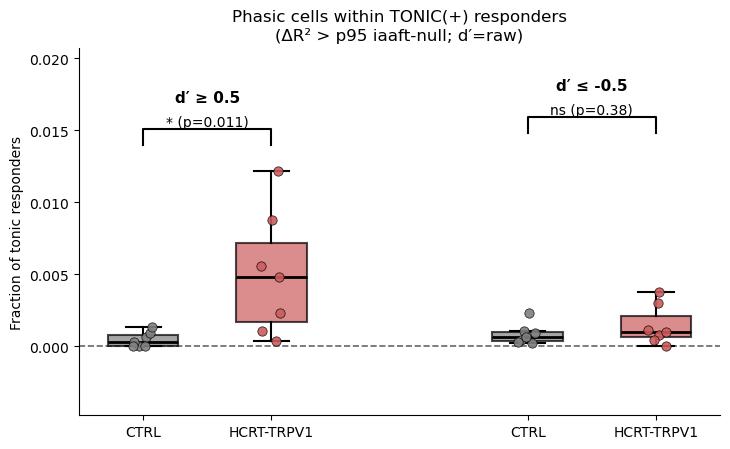

📁 Saved figure: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/phasicFrac_within_tonicNEG__nullP95__iaaft__dprimeraw__thrP0.5_thrN-0.5.png


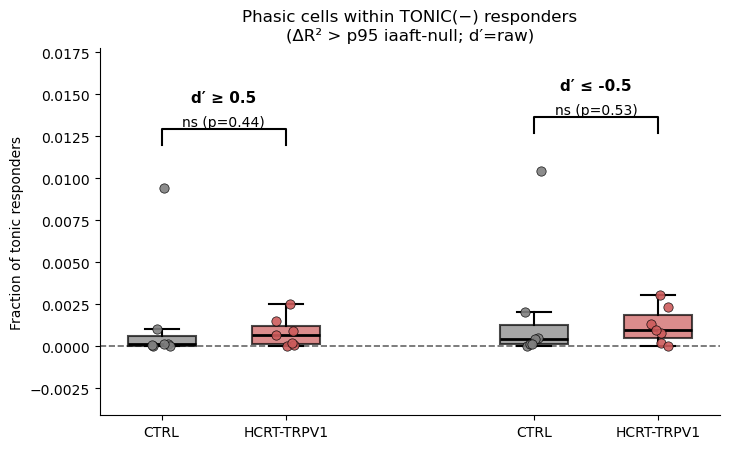

In [7]:
# =========================
# Full drop-in: Phasic fraction within tonic pos/neg responders
# - Uses saved tonic responder idx files (GLM ΔR²>null95)
# - Within those subsets, computes fraction of cells that are phasic:
#     d′ >= +PHASIC_POS_THR  and  d′ <= PHASIC_NEG_THR
# - Makes TWO plots:
#     (1) tonic POS responders   (2) tonic NEG responders
#   Each plot has FOUR boxes: CTRL pos-frac, HCRT pos-frac, CTRL neg-frac, HCRT neg-frac
# - Stats: MWU (fish-level fractions) CTRL vs HCRT for pos-frac and neg-frac (two brackets)
# Toggle NULL_METHOD = "shift"/"none" or "iaaft"
# =========================

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.stats import mannwhitneyu

# -------------------------
# GLM params (MUST match responder analysis)
# -------------------------
param_folder_name = f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}"

# Must exist in scope:
# dir_ants_output, proj_ID
# ctrl_expt_ID_list, hcrt_expt_ID_list, PLOT_META

# -------------------------
# USER SETTINGS
# -------------------------
NULL_METHOD = "iaaft"          # "shift"/"none" or "iaaft"
AMPLITUDE_MODE = "raw"         # must match saved d′ filenames: phasic_dprime_cells_{MODE}.npy

PHASIC_POS_THR = 0.5
PHASIC_NEG_THR = -0.5

RANDOM_SEED = 0

# =========================
# Helpers (DO NOT TOUCH)
# =========================
def _normalize_null_method(m: str) -> str:
    m = str(m).lower().strip()
    if m in {"none", "shift"}:
        return "none"   # filenames use "none" convention for shift
    if m == "iaaft":
        return "iaaft"
    raise ValueError(f"NULL_METHOD must be 'none' (shift) or 'iaaft', got {m!r}")

def _method_label(m: str) -> str:
    m = _normalize_null_method(m)
    return "shift" if m == "none" else "iaaft"

def idx_paths_for_method(dir_expt: Path, run_dir: Path, ptag: int, null_method: str):
    """
    Deterministic filenames for responder idx files.
    Search order: run_dir first, then fish root.
      - "none"  -> tonic_{pos/neg}_glm_nullp{p}_idxs.npy
      - "iaaft" -> tonic_{pos/neg}_glm_iaaft_nullp{p}_idxs.npy
    """
    m = _normalize_null_method(null_method)

    if m == "none":
        pos_name = f"tonic_pos_glm_nullp{ptag}_idxs.npy"
        neg_name = f"tonic_neg_glm_nullp{ptag}_idxs.npy"
    else:
        pos_name = f"tonic_pos_glm_iaaft_nullp{ptag}_idxs.npy"
        neg_name = f"tonic_neg_glm_iaaft_nullp{ptag}_idxs.npy"

    candidates = [
        (run_dir / pos_name, run_dir / neg_name),
        (dir_expt / pos_name, dir_expt / neg_name),
    ]
    for pp, nn in candidates:
        if pp.exists() and nn.exists():
            return pp, nn

    tried = []
    for pp, nn in candidates:
        tried.append(str(pp)); tried.append(str(nn))
    raise FileNotFoundError(
        f"Missing idx files for NULL_METHOD={m} (label={_method_label(m)}), p{ptag}.\nTried:\n  "
        + "\n  ".join(tried)
    )

def star_from_p(p):
    if not np.isfinite(p): return "n/a"
    if p < 1e-4: return "****"
    if p < 1e-3: return "***"
    if p < 1e-2: return "**"
    if p < 5e-2: return "*"
    return "ns"

def add_sig_bar(ax, x1, x2, y, text, dy=0.01):
    ax.plot([x1, x1, x2, x2], [y, y + dy, y + dy, y], lw=1.5, color="black")
    ax.text((x1 + x2) / 2, y + dy, text, ha="center", va="bottom", fontsize=10)

def _finite_1d(x):
    x = np.asarray(x).reshape(-1)
    return x[np.isfinite(x)]

def _safe_mwu_p(a, b):
    a = _finite_1d(a)
    b = _finite_1d(b)
    if a.size == 0 or b.size == 0:
        return np.nan
    return mannwhitneyu(a, b, alternative="two-sided").pvalue

def _load_dprime_for_fish(expt_ID):
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    dprime_path = dir_expt / f"phasic_dprime_cells_{AMPLITUDE_MODE}.npy"
    if not dprime_path.exists():
        return None, f"missing_dprime: {dprime_path}"
    dprime = np.load(dprime_path)  # (n_cells,)
    return dprime, None

def _fractions_within_idxs(dprime, idx, pos_thr, neg_thr):
    """
    Returns (frac_pos, frac_neg, errstr_or_None)
      frac_pos = mean(d′ >= pos_thr)
      frac_neg = mean(d′ <= neg_thr)
    """
    if dprime is None:
        return np.nan, np.nan, "no_dprime"

    idx = np.asarray(idx, dtype=np.int64).ravel()
    if idx.size == 0:
        return np.nan, np.nan, "empty_idx"

    # clip idx to valid range
    idx = idx[(idx >= 0) & (idx < dprime.shape[0])]
    if idx.size == 0:
        return np.nan, np.nan, "idx_out_of_bounds"

    vals = dprime[idx]
    vals = vals[np.isfinite(vals)]
    if vals.size == 0:
        return np.nan, np.nan, "no_finite_vals"

    frac_pos = float(np.mean(vals >= float(pos_thr)))
    frac_neg = float(np.mean(vals <= float(neg_thr)))
    return frac_pos, frac_neg, None

def _load_saved_idxs(expt_ID, null_method):
    """
    Returns: pos_idx, neg_idx, pos_path, neg_path
    """
    ptag = int(RESPONDER_NULL_THRESH)
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    run_dir  = dir_expt / "glm" / param_folder_name
    pos_path, neg_path = idx_paths_for_method(dir_expt, run_dir, ptag, null_method)
    pos_idx = np.load(pos_path)
    neg_idx = np.load(neg_path)
    return pos_idx, neg_idx, pos_path, neg_path

def collect_group_fractions(expt_ID_list, group_name, null_method):
    """
    For each fish, compute phasic fractions within:
      - tonic POS responder subset
      - tonic NEG responder subset
    Returns:
      dict with keys:
        tonic_pos__frac_pos, tonic_pos__frac_neg,
        tonic_neg__frac_pos, tonic_neg__frac_neg
      each is np.array (n_fish_used,)
    """
    mlabel = _method_label(null_method)

    tp_fp, tp_fn = [], []
    tn_fp, tn_fn = [], []

    for expt_ID in expt_ID_list:
        dprime, err = _load_dprime_for_fish(expt_ID)
        if dprime is None:
            print(f"⚠️ Skipping {expt_ID} [{group_name}] ({mlabel}): {err}")
            continue

        try:
            pos_idx, neg_idx, pos_path, neg_path = _load_saved_idxs(expt_ID, null_method)
        except FileNotFoundError as e:
            print(f"⚠️ Skipping {expt_ID} [{group_name}] ({mlabel}): {e}")
            continue

        # fractions within tonic POS subset
        fpos_tp, fneg_tp, err_tp = _fractions_within_idxs(dprime, pos_idx, PHASIC_POS_THR, PHASIC_NEG_THR)
        # fractions within tonic NEG subset
        fpos_tn, fneg_tn, err_tn = _fractions_within_idxs(dprime, neg_idx, PHASIC_POS_THR, PHASIC_NEG_THR)

        if err_tp is None:
            tp_fp.append(fpos_tp); tp_fn.append(fneg_tp)
        else:
            print(f"⚠️ {expt_ID} [{group_name}] tonicPOS skipped: {err_tp}")

        if err_tn is None:
            tn_fp.append(fpos_tn); tn_fn.append(fneg_tn)
        else:
            print(f"⚠️ {expt_ID} [{group_name}] tonicNEG skipped: {err_tn}")

        print(
            f"✅ {expt_ID} [{group_name}] NULL={mlabel} | "
            f"tonicPOS n={len(pos_idx)} frac(d′>={PHASIC_POS_THR})={fpos_tp:.3f} frac(d′<={PHASIC_NEG_THR})={fneg_tp:.3f} ({pos_path.name}) | "
            f"tonicNEG n={len(neg_idx)} frac(d′>={PHASIC_POS_THR})={fpos_tn:.3f} frac(d′<={PHASIC_NEG_THR})={fneg_tn:.3f} ({neg_path.name})"
        )

    out = {
        "tonic_pos__frac_pos": np.asarray(tp_fp, dtype=np.float32),
        "tonic_pos__frac_neg": np.asarray(tp_fn, dtype=np.float32),
        "tonic_neg__frac_pos": np.asarray(tn_fp, dtype=np.float32),
        "tonic_neg__frac_neg": np.asarray(tn_fn, dtype=np.float32),
    }
    return out

def plot_four_box_frac_and_save(
    ctrl_posfrac, hcrt_posfrac,
    ctrl_negfrac, hcrt_negfrac,
    title,
    fig_name,
    ylabel="Fraction of tonic cells per fish",
):
    """
    4 boxes:
      CTRL tonic (phasic+), HCRT tonic (phasic+),
      CTRL tonic (phasic−), HCRT tonic (phasic−)

    Tier labels carry the d′ thresholds.
    """
    data = [
        _finite_1d(ctrl_posfrac), _finite_1d(hcrt_posfrac),
        _finite_1d(ctrl_negfrac), _finite_1d(hcrt_negfrac),
    ]
    if any(arr.size == 0 for arr in data):
        print("⚠️ One or more groups empty — skipping plot.")
        return

    p_pos = _safe_mwu_p(data[0], data[1])
    p_neg = _safe_mwu_p(data[2], data[3])

    fig, ax = plt.subplots(figsize=(7.4, 4.6))
    ax.axhline(0, linestyle="--", linewidth=1.2, color="black", alpha=0.6, zorder=0)

    labels = [
        PLOT_META[CTRL_TAG]["label"],
        PLOT_META[EXPT_TAG]["label"],
        PLOT_META[CTRL_TAG]["label"],
        PLOT_META[EXPT_TAG]["label"],
    ]
    positions = [0, 1, 3, 4]

    bp = ax.boxplot(
        data,
        positions=positions,
        widths=0.55,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(color="black", linewidth=2),
        whiskerprops=dict(color="black", linewidth=1.5),
        capprops=dict(color="black", linewidth=1.5),
    )

    colors = [
        PLOT_META[CTRL_TAG]["color"],
        PLOT_META[EXPT_TAG]["color"],
        PLOT_META[CTRL_TAG]["color"],
        PLOT_META[EXPT_TAG]["color"],
    ]
    alphas = [
        PLOT_META[CTRL_TAG]["alpha"],
        PLOT_META[EXPT_TAG]["alpha"],
        PLOT_META[CTRL_TAG]["alpha"],
        PLOT_META[EXPT_TAG]["alpha"],
    ]
    for patch, c, a in zip(bp["boxes"], colors, alphas):
        patch.set_facecolor(c)
        patch.set_alpha(a)
        patch.set_edgecolor("black")
        patch.set_linewidth(1.5)

    # jittered fish points
    rng = np.random.default_rng(RANDOM_SEED)
    for x, vals, c in zip(positions, data, colors):
        jitter = rng.uniform(-0.08, 0.08, size=len(vals))
        ax.scatter(
            x + jitter, vals,
            s=45, color=c, alpha=0.9,
            edgecolor="black", linewidth=0.5,
            zorder=3,
        )

    ax.set_xticks(positions)
    ax.set_xticklabels(labels)
    ax.set_ylabel(ylabel)
    ax.set_title(title)

    # ----- tiered significance bars -----
    all_vals = np.concatenate(data)
    ymax = float(np.nanmax(all_vals))
    ymin = float(np.nanmin(all_vals))
    yrng = (ymax - ymin) if ymax > ymin else 1.0

    y1 = ymax + 0.15 * yrng
    y2 = ymax + 0.22 * yrng
    dy = 0.09 * yrng

    # POS tier
    add_sig_bar(
        ax, 0, 1, y1,
        f"{star_from_p(p_pos)} (p={p_pos:.2g})",
        dy=dy,
    )
    ax.text(
        0.5, y1 + 2.5 * dy,
        f"d′ ≥ {PHASIC_POS_THR:g}",
        ha="center", va="bottom",
        fontsize=11, fontweight="bold",
    )

    # NEG tier
    add_sig_bar(
        ax, 3, 4, y2,
        f"{star_from_p(p_neg)} (p={p_neg:.2g})",
        dy=dy,
    )
    ax.text(
        3.5, y2 + 2.5 * dy,
        f"d′ ≤ {PHASIC_NEG_THR:g}",
        ha="center", va="bottom",
        fontsize=11, fontweight="bold",
    )

    ax.margins(y=0.30)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    plt.tight_layout()

    fig_dir = Path(dir_ants_output) / proj_ID / "figures"
    fig_dir.mkdir(parents=True, exist_ok=True)
    fig_path = fig_dir / fig_name
    plt.savefig(fig_path, dpi=300, bbox_inches="tight")
    print(f"📁 Saved figure: {fig_path}")
    plt.show()


# =========================
# RUN (single NULL_METHOD)
# =========================
NULL_LABEL = _method_label(NULL_METHOD)

# collect fish-level fractions for each group
ctrl_out = collect_group_fractions(ctrl_expt_ID_list, CTRL_TAG, NULL_METHOD)
hcrt_out = collect_group_fractions(hcrt_expt_ID_list, EXPT_TAG, NULL_METHOD)

# ---- Plot 1: within TONIC POS responders
plot_four_box_frac_and_save(
    ctrl_posfrac=ctrl_out["tonic_pos__frac_pos"],
    hcrt_posfrac=hcrt_out["tonic_pos__frac_pos"],
    ctrl_negfrac=ctrl_out["tonic_pos__frac_neg"],
    hcrt_negfrac=hcrt_out["tonic_pos__frac_neg"],
    title=(
        f"Phasic cells within TONIC(+) responders\n"
        f"(ΔR² > p{RESPONDER_NULL_THRESH} {NULL_LABEL}-null; d′={AMPLITUDE_MODE})"
    ),
    fig_name=(
        f"phasicFrac_within_tonicPOS__nullP{RESPONDER_NULL_THRESH}__{NULL_LABEL}"
        f"__dprime{AMPLITUDE_MODE}__thrP{PHASIC_POS_THR:g}_thrN{PHASIC_NEG_THR:g}.png"
    ),
    ylabel="Fraction of tonic responders",
)

# ---- Plot 2: within TONIC NEG responders
plot_four_box_frac_and_save(
    ctrl_posfrac=ctrl_out["tonic_neg__frac_pos"],
    hcrt_posfrac=hcrt_out["tonic_neg__frac_pos"],
    ctrl_negfrac=ctrl_out["tonic_neg__frac_neg"],
    hcrt_negfrac=hcrt_out["tonic_neg__frac_neg"],
    title=(
        f"Phasic cells within TONIC(−) responders\n"
        f"(ΔR² > p{RESPONDER_NULL_THRESH} {NULL_LABEL}-null; d′={AMPLITUDE_MODE})"
    ),
    fig_name=(
        f"phasicFrac_within_tonicNEG__nullP{RESPONDER_NULL_THRESH}__{NULL_LABEL}"
        f"__dprime{AMPLITUDE_MODE}__thrP{PHASIC_POS_THR:g}_thrN{PHASIC_NEG_THR:g}.png"
    ),
    ylabel="Fraction of tonic responders",
)


## [Tonic vs Phasic Responders] Plot Mean d' for GLM-tonic POS./NEG. responders 

POS n=16270 mean d'=0.123 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | NEG n=27652 mean d'=0.119 (tonic_neg_glm_iaaft_nullp95_idxs.npy)
POS n=12910 mean d'=-0.014 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | NEG n=20624 mean d'=0.005 (tonic_neg_glm_iaaft_nullp95_idxs.npy)
POS n=6480 mean d'=-0.026 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | NEG n=13811 mean d'=-0.087 (tonic_neg_glm_iaaft_nullp95_idxs.npy)
POS n=862 mean d'=-0.001 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | NEG n=52097 mean d'=-0.038 (tonic_neg_glm_iaaft_nullp95_idxs.npy)
POS n=10455 mean d'=0.061 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | NEG n=23477 mean d'=0.067 (tonic_neg_glm_iaaft_nullp95_idxs.npy)
POS n=3024 mean d'=0.004 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | NEG n=30521 mean d'=-0.017 (tonic_neg_glm_iaaft_nullp95_idxs.npy)
POS n=25444 mean d'=-0.034 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | NEG n=11620 mean d'=-0.054 (tonic_neg_glm_iaaft_nullp95_idxs.npy)
POS n=27907 mean d'=-0.012 (tonic_pos_glm_iaaft_nullp95_idxs.npy) | NEG 

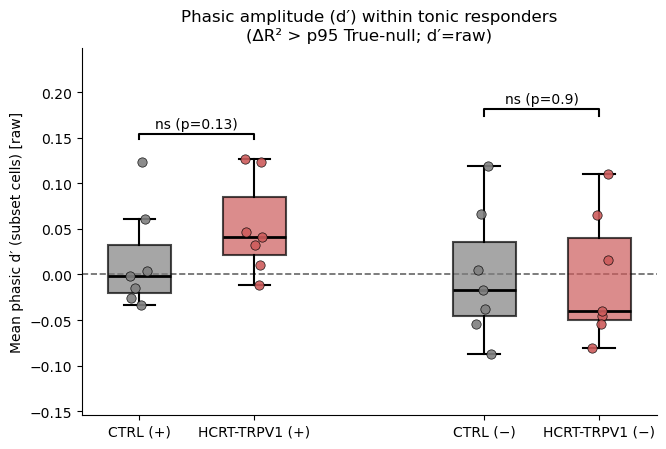

In [8]:

# =========================
# SETTINGS
# =========================


# GLM params (MUST match responder analysis)
param_folder_name = f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}"

# d′ file mode (must match how you saved it)
AMPLITUDE_MODE = "raw"  # "abs" / "raw" / "rms" etc. (your convention)

# Must exist in scope:
# dir_ants_output, proj_ID
# ctrl_expt_ID_list, hcrt_expt_ID_list, PLOT_META


# =========================
# Helpers
# =========================
def _normalize_null_method(m: str) -> str:
    m = str(m).lower().strip()
    if m in {"none", "shift"}:
        return "none"   # we will label/suffix as "shift" in text, but filenames use "none" convention
    if m in {"iaaft"}:
        return "iaaft"
    raise ValueError(f"NULL_METHOD must be 'none' (shift) or 'iaaft', got {m!r}")

def _method_label(m: str) -> str:
    m = _normalize_null_method(m)
    return m == "iaaft"

def idx_paths_for_method(dir_expt: Path, run_dir: Path, ptag: int, null_method: str):
    """
    Deterministic filenames for responder idx files.
    Search order: run_dir first, then dir_expt.
      - "none"  -> tonic_{pos/neg}_glm_nullp{p}_idxs.npy
      - "iaaft" -> tonic_{pos/neg}_glm_iaaft_nullp{p}_idxs.npy
    """
    m = _normalize_null_method(null_method)

    if m == "none":
        pos_name = f"tonic_pos_glm_nullp{ptag}_idxs.npy"
        neg_name = f"tonic_neg_glm_nullp{ptag}_idxs.npy"
    else:
        pos_name = f"tonic_pos_glm_iaaft_nullp{ptag}_idxs.npy"
        neg_name = f"tonic_neg_glm_iaaft_nullp{ptag}_idxs.npy"

    candidates = [
        (run_dir / pos_name, run_dir / neg_name),
        (dir_expt / pos_name, dir_expt / neg_name),
    ]
    for pp, nn in candidates:
        if pp.exists() and nn.exists():
            return pp, nn

    tried = []
    for pp, nn in candidates:
        tried.append(str(pp)); tried.append(str(nn))
    raise FileNotFoundError(
        f"Missing idx files for NULL_METHOD={m} (label={_method_label(m)}), p{ptag}.\nTried:\n  "
        + "\n  ".join(tried)
    )

def star_from_p(p):
    if not np.isfinite(p): return "n/a"
    if p < 1e-4: return "****"
    if p < 1e-3: return "***"
    if p < 1e-2: return "**"
    if p < 5e-2: return "*"
    return "ns"

def add_sig_bar(ax, x1, x2, y, text):
    ax.plot([x1, x1, x2, x2], [y, y*1.04, y*1.04, y], lw=1.5, color="black")
    ax.text((x1+x2)/2, y*1.06, text, ha="center", va="bottom")

def _fish_mean_dprime_from_idxs(expt_ID, idx):
    """idx: array of cell indices (FULL cell indexing). Returns (mean, err)."""
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID

    dprime_path = dir_expt / f"phasic_dprime_cells_{AMPLITUDE_MODE}.npy"
    if not dprime_path.exists():
        return None, "missing_dprime"

    dprime = np.load(dprime_path)  # (n_cells,)

    idx = np.asarray(idx, dtype=np.int64).ravel()
    if idx.size == 0:
        return None, "empty_idx"

    # safety clip (avoid crashes if any stale indices)
    idx = idx[(idx >= 0) & (idx < dprime.shape[0])]
    if idx.size == 0:
        return None, "idx_out_of_bounds"

    vals = dprime[idx]
    vals = vals[np.isfinite(vals)]
    if vals.size == 0:
        return None, "no_finite_vals"

    return float(np.nanmean(vals)), None


def process_group_split_from_saved_idxs(expt_ID_list, group_name, null_method):
    """
    Loads SAVED tonic_pos/neg idx files for the selected null_method,
    then computes per-fish mean phasic d′ within each subset.
    Returns: (means_pos, means_neg)
    """
    means_pos = []
    means_neg = []
    ptag = int(RESPONDER_NULL_THRESH)
    mlabel = _method_label(null_method)

    for expt_ID in expt_ID_list:
        dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
        run_dir  = dir_expt / "glm" / param_folder_name

        try:
            pos_path, neg_path = idx_paths_for_method(dir_expt, run_dir, ptag, null_method)
        except FileNotFoundError as e:
            print(f"⚠️ Skipping {expt_ID} [{group_name}] ({mlabel}): {e}")
            continue

        pos_idx = np.load(pos_path)
        neg_idx = np.load(neg_path)

        mpos, errp = _fish_mean_dprime_from_idxs(expt_ID, pos_idx)
        mneg, errn = _fish_mean_dprime_from_idxs(expt_ID, neg_idx)

        if mpos is not None:
            means_pos.append(mpos)
        else:
            print(f"⚠️ {expt_ID} [{group_name}] POS skipped: {errp}")

        if mneg is not None:
            means_neg.append(mneg)
        else:
            print(f"⚠️ {expt_ID} [{group_name}] NEG skipped: {errn}")

        print(
            #f"✅ {expt_ID} [{group_name}] NULL={mlabel} | "
            f"POS n={len(pos_idx)} mean d'={mpos if mpos is not None else np.nan:.3f} ({pos_path.name}) | "
            f"NEG n={len(neg_idx)} mean d'={mneg if mneg is not None else np.nan:.3f} ({neg_path.name})"
        )

    return np.array(means_pos, dtype=np.float32), np.array(means_neg, dtype=np.float32)


def plot_four_group_box_and_save(
    ctrl_pos, hcrt_pos,
    ctrl_neg, hcrt_neg,
    title,
    fig_name,
    dir_ants_output,
    proj_ID,
):
    groups = [ctrl_pos, hcrt_pos, ctrl_neg, hcrt_neg]
    if any(arr.size == 0 for arr in groups):
        print("⚠️ One or more groups empty — skipping plot.")
        return

    _, p_pos = mannwhitneyu(ctrl_pos, hcrt_pos, alternative="two-sided")
    _, p_neg = mannwhitneyu(ctrl_neg, hcrt_neg, alternative="two-sided")

    fig, ax = plt.subplots(figsize=(6.8, 4.6))
    ax.axhline(0, linestyle="--", linewidth=1.2, color="black", alpha=0.6, zorder=0)

    data = [ctrl_pos, hcrt_pos, ctrl_neg, hcrt_neg]
    labels = [
        f"{PLOT_META[CTRL_TAG]['label']} (+)",
        f"{PLOT_META[EXPT_TAG]['label']} (+)",
        f"{PLOT_META[CTRL_TAG]['label']} (−)",
        f"{PLOT_META[EXPT_TAG]['label']} (−)",
    ]
    positions = [0, 1, 3, 4]

    bp = ax.boxplot(
        data,
        positions=positions,
        widths=0.55,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(color="black", linewidth=2),
        whiskerprops=dict(color="black", linewidth=1.5),
        capprops=dict(color="black", linewidth=1.5),
    )

    # meta colors
    colors = [
        PLOT_META[CTRL_TAG]["color"],
        PLOT_META[EXPT_TAG]["color"],
        PLOT_META[CTRL_TAG]["color"],
        PLOT_META[EXPT_TAG]["color"],
    ]
    alphas = [
        PLOT_META[CTRL_TAG]["alpha"],
        PLOT_META[EXPT_TAG]["alpha"],
        PLOT_META[CTRL_TAG]["alpha"],
        PLOT_META[EXPT_TAG]["alpha"],
    ]
    for patch, c, a in zip(bp["boxes"], colors, alphas):
        patch.set_facecolor(c)
        patch.set_alpha(a)
        patch.set_edgecolor("black")
        patch.set_linewidth(1.5)

    # jitter fish points
    rng = np.random.default_rng(0)
    for x, vals, c in zip(positions, data, colors):
        jitter = rng.uniform(-0.08, 0.08, size=len(vals))
        ax.scatter(
            x + jitter, vals,
            s=45,
            color=c,
            alpha=0.9,
            edgecolor="black",
            linewidth=0.5,
            zorder=3,
        )

    ax.set_xticks(positions)
    ax.set_xticklabels(labels)
    ax.set_ylabel(f"Mean phasic d′ (subset cells) [{AMPLITUDE_MODE}]")
    ax.set_title(title)

    all_vals = np.concatenate(data)
    ymax = float(np.nanmax(all_vals))
    ymin = float(np.nanmin(all_vals))
    yrng = (ymax - ymin) if ymax > ymin else 1.0

    add_sig_bar(ax, 0, 1, ymax + 0.10 * yrng, f"{star_from_p(p_pos)} (p={p_pos:.2g})")
    add_sig_bar(ax, 3, 4, ymax + 0.22 * yrng, f"{star_from_p(p_neg)} (p={p_neg:.2g})")

    ax.margins(y=0.25)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    plt.tight_layout()

    fig_dir = Path(dir_ants_output) / proj_ID / "figures"
    fig_dir.mkdir(parents=True, exist_ok=True)
    fig_path = fig_dir / fig_name
    plt.savefig(fig_path, dpi=300, bbox_inches="tight")
    print(f"📁 Saved figure: {fig_path}")

    plt.show()


# =========================
# RUN
# =========================
NULL_LABEL = _method_label(NULL_METHOD)

ctrl_pos, ctrl_neg = process_group_split_from_saved_idxs(ctrl_expt_ID_list, CTRL_TAG, NULL_METHOD)
hcrt_pos, hcrt_neg = process_group_split_from_saved_idxs(hcrt_expt_ID_list, EXPT_TAG, NULL_METHOD)

plot_four_group_box_and_save(
    ctrl_pos, hcrt_pos,
    ctrl_neg, hcrt_neg,
    title=(
        f"Phasic amplitude (d′) within tonic responders\n"
        f"(ΔR² > p{RESPONDER_NULL_THRESH} {NULL_LABEL}-null; d′={AMPLITUDE_MODE})"
    ),
    fig_name=f"phasic_dprime_tonic_posneg_nullP{RESPONDER_NULL_THRESH}__{NULL_LABEL}.png",
    dir_ants_output=dir_ants_output,
    proj_ID=proj_ID,
)


### [d' vs delta Z]


✅ 251021_huc-h2b-g8m_csn_10uM_fish1 [CTRL] loaded tonic responders: pos=16270, neg=27652, total=43922
✅ 251118_huc-h2b-g8m_csn_10uM_fish1 [CTRL] loaded tonic responders: pos=12910, neg=20624, total=33534
✅ 251118_huc-h2b-g8m_csn_10uM_fish2 [CTRL] loaded tonic responders: pos=6480, neg=13811, total=20291
✅ 251118_huc-h2b-g8m_csn_10uM_fish3 [CTRL] loaded tonic responders: pos=862, neg=52097, total=52959
✅ 251118_huc-h2b-g8m_csn_10uM_fish4 [CTRL] loaded tonic responders: pos=10455, neg=23477, total=33932
✅ 251118_huc-h2b-g8m_csn_10uM_fish5 [CTRL] loaded tonic responders: pos=3024, neg=30521, total=33545
✅ 251126_huc-h2b-g8m_csn_10uM_fish1 [CTRL] loaded tonic responders: pos=25444, neg=11620, total=37064
✅ 251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4 [HCRT-TRPV1] loaded tonic responders: pos=27907, neg=27982, total=55889
✅ 251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2 [HCRT-TRPV1] loaded tonic responders: pos=799, neg=63889, total=64688
✅ 251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1 [HCRT-T

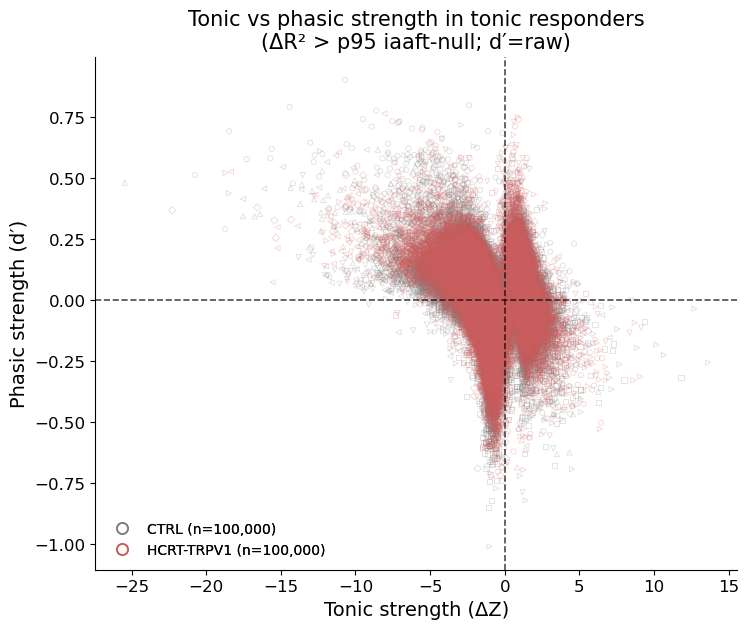


Fish marker mapping:
CTRL:
  o  251021_huc-h2b-g8m_csn_10uM_fish1  (n_plot=14,286 / n_total=43,922)
  ^  251118_huc-h2b-g8m_csn_10uM_fish1  (n_plot=14,286 / n_total=33,534)
  s  251118_huc-h2b-g8m_csn_10uM_fish2  (n_plot=14,286 / n_total=20,291)
  D  251118_huc-h2b-g8m_csn_10uM_fish3  (n_plot=14,286 / n_total=52,959)
  v  251118_huc-h2b-g8m_csn_10uM_fish4  (n_plot=14,286 / n_total=33,932)
  <  251118_huc-h2b-g8m_csn_10uM_fish5  (n_plot=14,285 / n_total=33,545)
  >  251126_huc-h2b-g8m_csn_10uM_fish1  (n_plot=14,285 / n_total=37,064)
HCRT-TRPV1:
  o  251008_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish4  (n_plot=14,286 / n_total=55,889)
  ^  251102_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2  (n_plot=14,286 / n_total=64,688)
  s  251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish1  (n_plot=14,286 / n_total=49,062)
  D  251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish2  (n_plot=14,286 / n_total=63,063)
  v  251210_hcrt-trpv1_huc-h2b-g8m_csn_10uM_fish3  (n_plot=14,286 / n_total=52,916)
  <  260113_hcrt-trpv1_huc-h2

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.lines import Line2D

# -------------------------
# SETTINGS (match your pipeline)
# -------------------------
AMPLITUDE_MODE = "raw"      # must match saved d′ file
NULL_METHOD = "iaaft"       # "shift"/"none" or "iaaft"
MAX_POINTS_PER_GROUP = 100000
RANDOM_SEED = 0
LMIN_TAG = "L20min"

# balanced visualization choice:
# True  = equal-ish fish representation within each genotype
# False = pooled random sampling across all cells in a genotype
BALANCE_FISH_REPRESENTATION = True

# Marker pool for fish identity
FISH_MARKERS = ["o", "^", "s", "D", "v", "<", ">", "P", "X", "*", "h", "p"]

# -------------------------
# helper: null method mapping
# -------------------------
def _normalize_null_method(m: str) -> str:
    m = str(m).lower().strip()
    if m in {"none", "shift"}:
        return "none"
    if m == "iaaft":
        return "iaaft"
    raise ValueError(f"NULL_METHOD must be 'none' (shift) or 'iaaft', got {m!r}")

def _method_label(m: str) -> str:
    m = _normalize_null_method(m)
    return "shift" if m == "none" else "iaaft"

def idx_paths_for_method(dir_expt: Path, run_dir: Path, ptag: int, null_method: str):
    m = _normalize_null_method(null_method)
    if m == "none":
        pos_name = f"tonic_pos_glm_nullp{ptag}_idxs.npy"
        neg_name = f"tonic_neg_glm_nullp{ptag}_idxs.npy"
    else:
        pos_name = f"tonic_pos_glm_iaaft_nullp{ptag}_idxs.npy"
        neg_name = f"tonic_neg_glm_iaaft_nullp{ptag}_idxs.npy"

    candidates = [
        (run_dir / pos_name, run_dir / neg_name),
        (dir_expt / pos_name, dir_expt / neg_name),
    ]
    for pp, nn in candidates:
        if pp.exists() and nn.exists():
            return pp, nn

    tried = [str(pp) for pair in candidates for pp in pair]
    raise FileNotFoundError("Missing idx files. Tried:\n  " + "\n  ".join(tried))

def _finite_mask(a, b):
    a = np.asarray(a).reshape(-1)
    b = np.asarray(b).reshape(-1)
    return np.isfinite(a) & np.isfinite(b)

# -------------------------
# core: load per-fish points
# -------------------------
def load_group_points_by_fish(expt_ID_list, group_key):
    """
    Returns a list of dicts, one per fish:
        {
            "expt_ID": str,
            "group_key": str,
            "x": np.ndarray,   # tonic deltaZ
            "y": np.ndarray,   # phasic dprime
            "n_total": int,
            "n_pos": int,
            "n_neg": int,
        }
    """
    out = []
    ptag = int(RESPONDER_NULL_THRESH)

    for expt_ID in expt_ID_list:
        dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
        run_dir = dir_expt / "glm" / param_folder_name

        # phasic d'
        dprime_path = dir_expt / f"phasic_dprime_cells_{AMPLITUDE_MODE}.npy"
        if not dprime_path.exists():
            print(f"⚠️ {expt_ID} [{group_key}] missing d′: {dprime_path.name}")
            continue
        dprime = np.load(dprime_path).reshape(-1)

        # responder idx
        try:
            pos_idx_path, neg_idx_path = idx_paths_for_method(dir_expt, run_dir, ptag, NULL_METHOD)
        except FileNotFoundError as e:
            print(f"⚠️ {expt_ID} [{group_key}] missing idxs: {e}")
            continue

        pos_idx = np.load(pos_idx_path).astype(np.int64).ravel()
        neg_idx = np.load(neg_idx_path).astype(np.int64).ravel()

        # tonic plateau ΔZ files
        pos_dz_path = dir_expt / f"tonic_pos_plateauDz_iaaft_{LMIN_TAG}_nullp{ptag}.npy"
        neg_dz_path = dir_expt / f"tonic_neg_plateauDz_iaaft_{LMIN_TAG}_nullp{ptag}.npy"

        if not pos_dz_path.exists():
            print(f"⚠️ {expt_ID} [{group_key}] missing pos ΔZ: {pos_dz_path.name}")
            continue
        if not neg_dz_path.exists():
            print(f"⚠️ {expt_ID} [{group_key}] missing neg ΔZ: {neg_dz_path.name}")
            continue

        pos_dz = np.load(pos_dz_path).reshape(-1)
        neg_dz = np.load(neg_dz_path).reshape(-1)

        # sanity check
        if pos_dz.shape[0] != pos_idx.shape[0]:
            print(
                f"⚠️ {expt_ID} [{group_key}] pos length mismatch: "
                f"pos_dz={pos_dz.shape[0]}, pos_idx={pos_idx.shape[0]}"
            )
            continue
        if neg_dz.shape[0] != neg_idx.shape[0]:
            print(
                f"⚠️ {expt_ID} [{group_key}] neg length mismatch: "
                f"neg_dz={neg_dz.shape[0]}, neg_idx={neg_idx.shape[0]}"
            )
            continue

        # clip idx to valid dprime range
        pos_keep = (pos_idx >= 0) & (pos_idx < dprime.shape[0])
        neg_keep = (neg_idx >= 0) & (neg_idx < dprime.shape[0])

        if not np.all(pos_keep):
            print(f"⚠️ {expt_ID} [{group_key}] clipped {np.sum(~pos_keep)} pos idx out of range")
        if not np.all(neg_keep):
            print(f"⚠️ {expt_ID} [{group_key}] clipped {np.sum(~neg_keep)} neg idx out of range")

        pos_idx = pos_idx[pos_keep]
        neg_idx = neg_idx[neg_keep]
        pos_dz = pos_dz[pos_keep]
        neg_dz = neg_dz[neg_keep]

        # pair ΔZ with d'
        x_pos = pos_dz
        y_pos = dprime[pos_idx]

        x_neg = neg_dz
        y_neg = dprime[neg_idx]

        m_pos = np.isfinite(x_pos) & np.isfinite(y_pos)
        m_neg = np.isfinite(x_neg) & np.isfinite(y_neg)

        x = np.concatenate([x_pos[m_pos], x_neg[m_neg]]).astype(np.float32, copy=False)
        y = np.concatenate([y_pos[m_pos], y_neg[m_neg]]).astype(np.float32, copy=False)

        if x.size == 0:
            print(f"⚠️ {expt_ID} [{group_key}] no finite points after masking")
            continue

        out.append({
            "expt_ID": expt_ID,
            "group_key": group_key,
            "x": x,
            "y": y,
            "n_total": int(x.size),
            "n_pos": int(np.sum(m_pos)),
            "n_neg": int(np.sum(m_neg)),
        })

        print(
            f"✅ {expt_ID} [{group_key}] loaded tonic responders: "
            f"pos={np.sum(m_pos)}, neg={np.sum(m_neg)}, total={x.size}"
        )

    return out

# -------------------------
# downsampling helpers
# -------------------------
def _downsample_one_xy(x, y, max_points, seed=0):
    x = np.asarray(x)
    y = np.asarray(y)
    if x.size <= max_points:
        return x, y
    rng = np.random.default_rng(seed)
    idx = rng.choice(x.size, size=max_points, replace=False)
    return x[idx], y[idx]

def downsample_group_points_by_fish(group_points, max_points_total, seed=0, balance_fish=True):
    """
    If balance_fish=True:
        Allocate an equal-ish cap per fish, then randomize within each fish.
    If balance_fish=False:
        Pool all cells and randomize across the full genotype.
    Returns:
        sampled_group_points: list of dict with sampled x/y
        n_total_sampled: int
    """
    if len(group_points) == 0:
        return [], 0

    total_cells = sum(d["x"].size for d in group_points)
    if total_cells <= max_points_total:
        copied = []
        for d in group_points:
            copied.append({
                **d,
                "x_plot": d["x"],
                "y_plot": d["y"],
                "n_plot": d["x"].size,
            })
        return copied, total_cells

    rng = np.random.default_rng(seed)

    if not balance_fish:
        # pooled random sampling across all fish
        x_all = np.concatenate([d["x"] for d in group_points], axis=0)
        y_all = np.concatenate([d["y"] for d in group_points], axis=0)

        fish_id_all = np.concatenate([
            np.full(d["x"].size, i, dtype=np.int32)
            for i, d in enumerate(group_points)
        ])

        idx = rng.choice(x_all.size, size=max_points_total, replace=False)

        sampled = []
        for i, d in enumerate(group_points):
            keep = (fish_id_all[idx] == i)
            sampled.append({
                **d,
                "x_plot": x_all[idx][keep],
                "y_plot": y_all[idx][keep],
                "n_plot": int(np.sum(keep)),
            })
        return sampled, max_points_total

    # balanced representation across fish
    n_fish = len(group_points)
    base = max_points_total // n_fish
    rem = max_points_total % n_fish

    sampled = []
    n_total_sampled = 0

    # deterministic order
    order = np.arange(n_fish)

    for rank, i in enumerate(order):
        d = group_points[i]
        cap_i = base + (1 if rank < rem else 0)
        cap_i = min(cap_i, d["x"].size)

        x_i, y_i = _downsample_one_xy(
            d["x"], d["y"],
            max_points=cap_i,
            seed=seed + i + 17
        )

        sampled.append({
            **d,
            "x_plot": x_i,
            "y_plot": y_i,
            "n_plot": x_i.size,
        })
        n_total_sampled += x_i.size

    return sampled, n_total_sampled

# -------------------------
# plotting
# -------------------------
def plot_scatter_by_fish(ctrl_points, hcrt_points, title, save_name):
    sampled_ctrl, n_ctrl_plot = downsample_group_points_by_fish(
        ctrl_points,
        max_points_total=MAX_POINTS_PER_GROUP,
        seed=RANDOM_SEED,
        balance_fish=BALANCE_FISH_REPRESENTATION,
    )
    sampled_hcrt, n_hcrt_plot = downsample_group_points_by_fish(
        hcrt_points,
        max_points_total=MAX_POINTS_PER_GROUP,
        seed=RANDOM_SEED + 1000,
        balance_fish=BALANCE_FISH_REPRESENTATION,
    )

    fig, ax = plt.subplots(figsize=(7.6, 6.4))

    ctrl_color = PLOT_META[CTRL_TAG]["color"]
    expt_color = PLOT_META[EXPT_TAG]["color"]

    # plot each fish separately with unique hollow marker
    for i, d in enumerate(sampled_ctrl):
        marker = FISH_MARKERS[i % len(FISH_MARKERS)]
        if d["n_plot"] == 0:
            continue
        ax.scatter(
            d["x_plot"], d["y_plot"],
            s=14,
            marker=marker,
            facecolors="none",
            edgecolors=ctrl_color,
            linewidths=0.6,
            alpha=0.25,
            rasterized=True,
        )

    for i, d in enumerate(sampled_hcrt):
        marker = FISH_MARKERS[i % len(FISH_MARKERS)]
        if d["n_plot"] == 0:
            continue
        ax.scatter(
            d["x_plot"], d["y_plot"],
            s=14,
            marker=marker,
            facecolors="none",
            edgecolors=expt_color,
            linewidths=0.6,
            alpha=0.25,
            rasterized=True,
        )

    ax.axvline(0, lw=1.2, ls="--", color="black", alpha=0.7)
    ax.axhline(0, lw=1.2, ls="--", color="black", alpha=0.7)

    ax.set_xlabel("Tonic strength (ΔZ)", fontsize=14)
    ax.set_ylabel("Phasic strength (d′)", fontsize=14)
    ax.set_title(title, fontsize=15)
    ax.tick_params(axis="both", labelsize=12)

    # genotype legend only
    genotype_handles = [
        Line2D(
            [0], [0],
            marker='o', linestyle='None',
            markerfacecolor='none',
            markeredgecolor=ctrl_color,
            markeredgewidth=1.2,
            markersize=8,
            label=f"{PLOT_META[CTRL_TAG]['label']} (n={n_ctrl_plot:,})"
        ),
        Line2D(
            [0], [0],
            marker='o', linestyle='None',
            markerfacecolor='none',
            markeredgecolor=expt_color,
            markeredgewidth=1.2,
            markersize=8,
            label=f"{PLOT_META[EXPT_TAG]['label']} (n={n_hcrt_plot:,})"
        ),
    ]
    leg1 = ax.legend(handles=genotype_handles, frameon=False, loc="best")
    ax.add_artist(leg1)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    plt.tight_layout()

    fig_dir = Path(dir_ants_output) / proj_ID / "figures"
    fig_dir.mkdir(parents=True, exist_ok=True)
    out = fig_dir / save_name
    plt.savefig(out, dpi=300, bbox_inches="tight")
    print(f"📁 Saved: {out}")
    plt.show()

    # print fish -> marker mapping for sanity
    print("\nFish marker mapping:")
    print("CTRL:")
    for i, d in enumerate(sampled_ctrl):
        print(f"  {FISH_MARKERS[i % len(FISH_MARKERS)]}  {d['expt_ID']}  (n_plot={d['n_plot']:,} / n_total={d['n_total']:,})")
    print("HCRT-TRPV1:")
    for i, d in enumerate(sampled_hcrt):
        print(f"  {FISH_MARKERS[i % len(FISH_MARKERS)]}  {d['expt_ID']}  (n_plot={d['n_plot']:,} / n_total={d['n_total']:,})")

# -------------------------
# RUN
# -------------------------
NULL_LABEL = _method_label(NULL_METHOD)
param_folder_name = f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}"

ctrl_points = load_group_points_by_fish(ctrl_expt_ID_list, CTRL_TAG)
hcrt_points = load_group_points_by_fish(hcrt_expt_ID_list, EXPT_TAG)

if len(ctrl_points) == 0 or len(hcrt_points) == 0:
    raise RuntimeError("No points loaded for one or both groups. Check filenames / idx paths / deltaZ file.")

plot_scatter_by_fish(
    ctrl_points,
    hcrt_points,
    title=(
        "Tonic vs phasic strength in tonic responders\n"
        f"(ΔR² > p{RESPONDER_NULL_THRESH} {NULL_LABEL}-null; d′={AMPLITUDE_MODE})"
    ),
    save_name=(
        f"scatter_deltaZ_vs_dprime__tonicResponders_p{RESPONDER_NULL_THRESH}"
        f"__{NULL_LABEL}__dprime{AMPLITUDE_MODE}"
        f"__balanced{int(BALANCE_FISH_REPRESENTATION)}.png"
    ),
)

Sanity-check settings
------------------------------------------------------------
BASELINE window: [0:2700]
DRUG window:     [2760:5400]
HP_SIGMA_SEC:    60
SAMPLING_HZ:     1.0
DEBUG 251021_huc-h2b-g8m_csn_10uM_fish1 [CTRL] F shape=(485698, 7200), F_tonic shape=(485698, 7200), windows=base[0:2700] drug[2760:5400]
DEBUG 251021_huc-h2b-g8m_csn_10uM_fish1 [CTRL] F_sel shape=(43922, 7200), Ft_sel shape=(43922, 7200)
✅ 251021_huc-h2b-g8m_csn_10uM_fish1 [CTRL] loaded 43,922 responder cells | F=data_array.npy, F_tonic=data_array_f_tonic.npy
DEBUG 251118_huc-h2b-g8m_csn_10uM_fish1 [CTRL] F shape=(474057, 7200), F_tonic shape=(474057, 7200), windows=base[0:2700] drug[2760:5400]
DEBUG 251118_huc-h2b-g8m_csn_10uM_fish1 [CTRL] F_sel shape=(33534, 7200), Ft_sel shape=(33534, 7200)
✅ 251118_huc-h2b-g8m_csn_10uM_fish1 [CTRL] loaded 33,534 responder cells | F=data_array.npy, F_tonic=data_array_f_tonic.npy
DEBUG 251118_huc-h2b-g8m_csn_10uM_fish2 [CTRL] F shape=(432666, 7200), F_tonic shape=(432666, 7

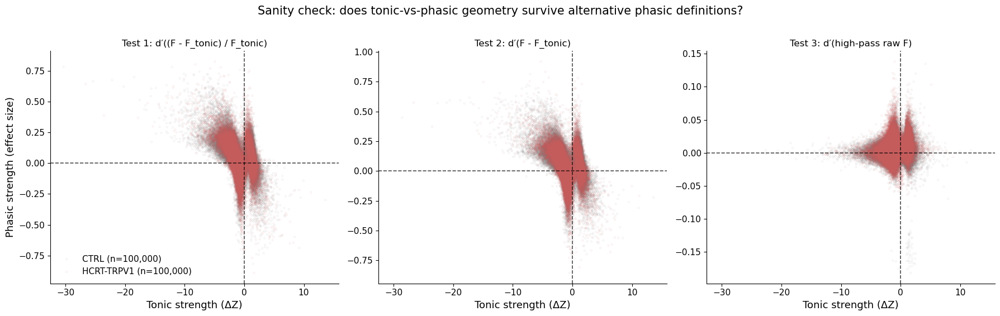

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.ndimage import gaussian_filter1d

# ============================================================
# QUICK SANITY TEST:
# Compare tonic ΔZ vs 3 phasic definitions
#   y1 = d'((F - F_tonic) / F_tonic)
#   y2 = d'(F - F_tonic)
#   y3 = d'(highpass(F))
# ============================================================

# -------------------------
# SETTINGS
# -------------------------
AMPLITUDE_MODE = "raw"
NULL_METHOD = "iaaft"
LMIN_TAG = "L20min"

# ------------------------------------------------------------------
# IMPORTANT:
# These assume baseline_start/baseline_end/drug_start/drug_end are in MINUTES.
# If they are already in FRAMES, remove the "* 60".
# ------------------------------------------------------------------
BASELINE_START = int(baseline_start)
BASELINE_END   = int(baseline_end )
DRUG_START     = int(drug_start)
DRUG_END       = int(drug_end)

# high-pass setting
HP_SIGMA_SEC = 60        # slow trend removed by Gaussian smoothing
SAMPLING_HZ = 1.0        # adjust if not 1 Hz

# plotting cap
MAX_POINTS_PER_GROUP = 100_000
RANDOM_SEED = 0

# avoid divide-by-near-zero explosion
FTONIC_EPS = 1e-6

# whether to print per-experiment shape/window debugging
DEBUG_SHAPES = True

# file candidates: EDIT THESE IF YOUR NAMES DIFFER
RAW_TRACE_CANDIDATES = [
    "data_array_f.npy",
    "data_array_f_raw.npy",
    "data_array.npy",
]

FTONIC_CANDIDATES = [
    "data_array_f_tonic.npy",
    "F_tonic.npy",
    "data_array_tonic.npy",
]

# -------------------------
# helpers
# -------------------------
def _normalize_null_method(m: str) -> str:
    m = str(m).lower().strip()
    if m in {"none", "shift"}:
        return "none"
    if m == "iaaft":
        return "iaaft"
    raise ValueError(f"NULL_METHOD must be 'none' (shift) or 'iaaft', got {m!r}")

def _method_label(m: str) -> str:
    m = _normalize_null_method(m)
    return "shift" if m == "none" else "iaaft"

def idx_paths_for_method(dir_expt: Path, run_dir: Path, ptag: int, null_method: str):
    m = _normalize_null_method(null_method)
    if m == "none":
        pos_name = f"tonic_pos_glm_nullp{ptag}_idxs.npy"
        neg_name = f"tonic_neg_glm_nullp{ptag}_idxs.npy"
    else:
        pos_name = f"tonic_pos_glm_iaaft_nullp{ptag}_idxs.npy"
        neg_name = f"tonic_neg_glm_iaaft_nullp{ptag}_idxs.npy"

    candidates = [
        (run_dir / pos_name, run_dir / neg_name),
        (dir_expt / pos_name, dir_expt / neg_name),
    ]
    for pp, nn in candidates:
        if pp.exists() and nn.exists():
            return pp, nn

    tried = [str(pp) for pair in candidates for pp in pair]
    raise FileNotFoundError("Missing idx files. Tried:\n  " + "\n  ".join(tried))

def _try_load_any(dir_expt: Path, names):
    for nm in names:
        p = dir_expt / nm
        if p.exists():
            return np.load(p), nm
    return None, None

def _downsample_xy(x, y, max_points, seed=0):
    x = np.asarray(x).reshape(-1)
    y = np.asarray(y).reshape(-1)
    keep = np.isfinite(x) & np.isfinite(y)
    x = x[keep]
    y = y[keep]
    if x.size <= max_points:
        return x, y
    rng = np.random.default_rng(seed)
    idx = rng.choice(x.size, size=max_points, replace=False)
    return x[idx], y[idx]

def ensure_cells_by_time(arr, expt_ID="", name="array", min_time_expected=None):
    """
    Force array to shape (n_cells, n_time).

    For this pipeline, cells are usually MUCH more numerous than timepoints.
    So (n_cells, n_time) typically looks like:
        rows >> cols
    """
    arr = np.asarray(arr, dtype=np.float32)

    if arr.ndim != 2:
        raise ValueError(f"{expt_ID}: {name} must be 2D, got shape {arr.shape}")

    n0, n1 = arr.shape

    # If second axis looks like time, keep as-is
    if min_time_expected is not None:
        if n1 >= min_time_expected and n0 > n1:
            return arr
        if n0 >= min_time_expected and n1 > n0:
            print(f"ℹ️ {expt_ID}: transposing {name} from {arr.shape} -> {(n1, n0)}")
            return arr.T

    # Fallback for this dataset:
    # assume larger axis = cells, smaller axis = time
    if n0 >= n1:
        return arr
    else:
        print(f"ℹ️ {expt_ID}: transposing {name} from {arr.shape} -> {(n1, n0)}")
        return arr.T

def dprime_from_windows(arr_2d, base_start, base_end, drug_start, drug_end, expt_ID=""):
    """
    arr_2d must be shape (n_cells, n_time)
    returns d' per cell, shape (n_cells,)
    """
    arr_2d = np.asarray(arr_2d, dtype=np.float32)

    if arr_2d.ndim != 2:
        raise ValueError(f"{expt_ID}: arr_2d must be 2D, got shape {arr_2d.shape}")

    n_cells, n_time = arr_2d.shape

    if not (0 <= base_start < base_end <= n_time):
        raise ValueError(
            f"{expt_ID}: baseline window invalid for n_time={n_time}: "
            f"[{base_start}:{base_end}]"
        )
    if not (0 <= drug_start < drug_end <= n_time):
        raise ValueError(
            f"{expt_ID}: drug window invalid for n_time={n_time}: "
            f"[{drug_start}:{drug_end}]"
        )

    Xb = arr_2d[:, base_start:base_end]
    Xd = arr_2d[:, drug_start:drug_end]

    if Xb.shape[1] < 2:
        raise ValueError(f"{expt_ID}: baseline window too short after slicing: {Xb.shape}")
    if Xd.shape[1] < 2:
        raise ValueError(f"{expt_ID}: drug window too short after slicing: {Xd.shape}")

    mu_b = np.nanmean(Xb, axis=1)
    mu_d = np.nanmean(Xd, axis=1)
    var_b = np.nanvar(Xb, axis=1, ddof=1)
    var_d = np.nanvar(Xd, axis=1, ddof=1)

    denom = np.sqrt(0.5 * (var_b + var_d))
    out = (mu_d - mu_b) / denom
    out[~np.isfinite(out)] = np.nan
    return out.astype(np.float32)

def highpass_gaussian(arr_2d, sigma_sec, sampling_hz):
    sigma_frames = float(sigma_sec) * float(sampling_hz)
    slow = gaussian_filter1d(arr_2d, sigma=sigma_frames, axis=1, mode="nearest")
    hp = arr_2d - slow
    return hp.astype(np.float32), slow.astype(np.float32)

# -------------------------
# core loader
# -------------------------
def load_group_three_tests(expt_ID_list, group_key):
    """
    Returns pooled arrays for the three y-axis tests, using the SAME x-axis tonic ΔZ:
      x_all          = tonic plateau ΔZ (responder-only)
      y_norm_all     = d'((F - F_tonic)/F_tonic)
      y_resid_all    = d'(F - F_tonic)
      y_hp_all       = d'(highpass(F))
    """
    ptag = int(RESPONDER_NULL_THRESH)

    x_all = []
    y_norm_all = []
    y_resid_all = []
    y_hp_all = []

    for expt_ID in expt_ID_list:
        dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
        run_dir  = dir_expt / "glm" / param_folder_name

        # load raw F
        F, f_name = _try_load_any(dir_expt, RAW_TRACE_CANDIDATES)
        if F is None:
            print(f"⚠️ {expt_ID} [{group_key}] missing raw trace file. Tried: {RAW_TRACE_CANDIDATES}")
            continue

        # load F_tonic
        F_tonic, ft_name = _try_load_any(dir_expt, FTONIC_CANDIDATES)
        if F_tonic is None:
            print(f"⚠️ {expt_ID} [{group_key}] missing F_tonic file. Tried: {FTONIC_CANDIDATES}")
            continue

        try:
            F = ensure_cells_by_time(
                F,
                expt_ID=expt_ID,
                name="F",
                min_time_expected=DRUG_END
            )
            F_tonic = ensure_cells_by_time(
                F_tonic,
                expt_ID=expt_ID,
                name="F_tonic",
                min_time_expected=DRUG_END
            )
        except ValueError as e:
            print(f"⚠️ {expt_ID} [{group_key}] {e}")
            continue

        if DEBUG_SHAPES:
            print(
                f"DEBUG {expt_ID} [{group_key}] "
                f"F shape={F.shape}, F_tonic shape={F_tonic.shape}, "
                f"windows=base[{BASELINE_START}:{BASELINE_END}] drug[{DRUG_START}:{DRUG_END}]"
            )

        if F.shape != F_tonic.shape:
            print(f"⚠️ {expt_ID} [{group_key}] shape mismatch after orientation fix: F{F.shape} vs F_tonic{F_tonic.shape}")
            continue

        # responder idx
        try:
            pos_idx_path, neg_idx_path = idx_paths_for_method(dir_expt, run_dir, ptag, NULL_METHOD)
        except FileNotFoundError as e:
            print(f"⚠️ {expt_ID} [{group_key}] missing idxs: {e}")
            continue

        pos_idx = np.load(pos_idx_path).astype(np.int64).ravel()
        neg_idx = np.load(neg_idx_path).astype(np.int64).ravel()

        # tonic ΔZ responder-only arrays
        pos_dz_path = dir_expt / f"tonic_pos_plateauDz_iaaft_{LMIN_TAG}_nullp{ptag}.npy"
        neg_dz_path = dir_expt / f"tonic_neg_plateauDz_iaaft_{LMIN_TAG}_nullp{ptag}.npy"

        if not pos_dz_path.exists() or not neg_dz_path.exists():
            print(f"⚠️ {expt_ID} [{group_key}] missing responder ΔZ files")
            continue

        pos_dz = np.load(pos_dz_path).reshape(-1).astype(np.float32)
        neg_dz = np.load(neg_dz_path).reshape(-1).astype(np.float32)

        # sanity
        if pos_dz.shape[0] != pos_idx.shape[0]:
            print(f"⚠️ {expt_ID} [{group_key}] pos dz/idx length mismatch: pos_dz={pos_dz.shape[0]}, pos_idx={pos_idx.shape[0]}")
            continue
        if neg_dz.shape[0] != neg_idx.shape[0]:
            print(f"⚠️ {expt_ID} [{group_key}] neg dz/idx length mismatch: neg_dz={neg_dz.shape[0]}, neg_idx={neg_idx.shape[0]}")
            continue

        # valid idx against n_cells
        n_cells = F.shape[0]
        pos_keep = (pos_idx >= 0) & (pos_idx < n_cells)
        neg_keep = (neg_idx >= 0) & (neg_idx < n_cells)

        if not np.all(pos_keep):
            print(f"⚠️ {expt_ID} [{group_key}] clipped {np.sum(~pos_keep)} pos idx out of range")
        if not np.all(neg_keep):
            print(f"⚠️ {expt_ID} [{group_key}] clipped {np.sum(~neg_keep)} neg idx out of range")

        pos_idx = pos_idx[pos_keep]
        neg_idx = neg_idx[neg_keep]
        pos_dz  = pos_dz[pos_keep]
        neg_dz  = neg_dz[neg_keep]

        idx_all = np.concatenate([pos_idx, neg_idx])
        x_this  = np.concatenate([pos_dz, neg_dz])

        if idx_all.size == 0:
            print(f"⚠️ {expt_ID} [{group_key}] no valid responder idx")
            continue

        # subset traces
        F_sel = F[idx_all, :]
        Ft_sel = F_tonic[idx_all, :]

        if DEBUG_SHAPES:
            print(f"DEBUG {expt_ID} [{group_key}] F_sel shape={F_sel.shape}, Ft_sel shape={Ft_sel.shape}")

        try:
            # TEST 1: normalized phasic
            denom = np.where(np.abs(Ft_sel) < FTONIC_EPS, np.nan, Ft_sel)
            phasic_norm = (F_sel - Ft_sel) / denom
            y1 = dprime_from_windows(
                phasic_norm,
                BASELINE_START, BASELINE_END,
                DRUG_START, DRUG_END,
                expt_ID=f"{expt_ID} TEST1"
            )

            # TEST 2: unnormalized residual
            phasic_resid = F_sel - Ft_sel
            y2 = dprime_from_windows(
                phasic_resid,
                BASELINE_START, BASELINE_END,
                DRUG_START, DRUG_END,
                expt_ID=f"{expt_ID} TEST2"
            )

            # TEST 3: high-pass raw F
            F_hp, _ = highpass_gaussian(F_sel, sigma_sec=HP_SIGMA_SEC, sampling_hz=SAMPLING_HZ)
            y3 = dprime_from_windows(
                F_hp,
                BASELINE_START, BASELINE_END,
                DRUG_START, DRUG_END,
                expt_ID=f"{expt_ID} TEST3"
            )

        except ValueError as e:
            print(f"⚠️ {expt_ID} [{group_key}] {e}")
            continue

        keep = np.isfinite(x_this) & np.isfinite(y1) & np.isfinite(y2) & np.isfinite(y3)
        x_this = x_this[keep]
        y1 = y1[keep]
        y2 = y2[keep]
        y3 = y3[keep]

        if x_this.size == 0:
            print(f"⚠️ {expt_ID} [{group_key}] no finite points after effect-size calculation")
            continue

        x_all.append(x_this.astype(np.float32))
        y_norm_all.append(y1.astype(np.float32))
        y_resid_all.append(y2.astype(np.float32))
        y_hp_all.append(y3.astype(np.float32))

        print(
            f"✅ {expt_ID} [{group_key}] loaded {x_this.size:,} responder cells | "
            f"F={f_name}, F_tonic={ft_name}"
        )

    if len(x_all) == 0:
        empty = np.array([], dtype=np.float32)
        return empty, empty, empty, empty

    return (
        np.concatenate(x_all),
        np.concatenate(y_norm_all),
        np.concatenate(y_resid_all),
        np.concatenate(y_hp_all),
    )

# -------------------------
# plotting
# -------------------------
def plot_three_test_scatter(ctrl_data, hcrt_data, save_name):
    """
    ctrl_data / hcrt_data:
      (x, y_norm, y_resid, y_hp)
    """
    ctrl_color = PLOT_META[CTRL_TAG]["color"]
    expt_color = PLOT_META[EXPT_TAG]["color"]

    titles = [
        "Test 1: d′((F - F_tonic) / F_tonic)",
        "Test 2: d′(F - F_tonic)",
        "Test 3: d′(high-pass raw F)",
    ]

    ykeys = [1, 2, 3]

    fig, axes = plt.subplots(1, 3, figsize=(18, 5.5), sharex=True, sharey=False)

    for j, ax in enumerate(axes):
        x_c = ctrl_data[0]
        y_c = ctrl_data[ykeys[j]]
        x_h = hcrt_data[0]
        y_h = hcrt_data[ykeys[j]]

        x_c, y_c = _downsample_xy(x_c, y_c, MAX_POINTS_PER_GROUP, seed=RANDOM_SEED + j)
        x_h, y_h = _downsample_xy(x_h, y_h, MAX_POINTS_PER_GROUP, seed=RANDOM_SEED + 100 + j)

        ax.scatter(
            x_c, y_c, s=5,
            facecolors="none", edgecolors=ctrl_color,
            linewidths=0.4, alpha=0.18,
            rasterized=True,
            label=f"{CTRL_TAG} (n={x_c.size:,})",
        )
        ax.scatter(
            x_h, y_h, s=5,
            facecolors="none", edgecolors=expt_color,
            linewidths=0.4, alpha=0.18,
            rasterized=True,
            label=f"{EXPT_TAG} (n={x_h.size:,})",
        )

        ax.axvline(0, lw=1.2, ls="--", color="black", alpha=0.7)
        ax.axhline(0, lw=1.2, ls="--", color="black", alpha=0.7)

        ax.set_title(titles[j], fontsize=12)
        ax.set_xlabel("Tonic strength (ΔZ)", fontsize=13)
        ax.tick_params(axis="both", labelsize=11)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

        if j == 0:
            ax.set_ylabel("Phasic strength (effect size)", fontsize=13)
            ax.legend(frameon=False, loc="best", fontsize=11)

    plt.suptitle(
        "Sanity check: does tonic-vs-phasic geometry survive alternative phasic definitions?",
        fontsize=15, y=1.02
    )
    plt.tight_layout()

    fig_dir = Path(dir_ants_output) / proj_ID / "figures"
    fig_dir.mkdir(parents=True, exist_ok=True)
    out = fig_dir / save_name
    plt.savefig(out, dpi=300, bbox_inches="tight")
    print(f"📁 Saved: {out}")
    plt.show()

# -------------------------
# RUN
# -------------------------
NULL_LABEL = _method_label(NULL_METHOD)
param_folder_name = f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}"

print("============================================================")
print("Sanity-check settings")
print("------------------------------------------------------------")
print(f"BASELINE window: [{BASELINE_START}:{BASELINE_END}]")
print(f"DRUG window:     [{DRUG_START}:{DRUG_END}]")
print(f"HP_SIGMA_SEC:    {HP_SIGMA_SEC}")
print(f"SAMPLING_HZ:     {SAMPLING_HZ}")
print("============================================================")

ctrl_data = load_group_three_tests(ctrl_expt_ID_list, CTRL_TAG)
hcrt_data = load_group_three_tests(hcrt_expt_ID_list, EXPT_TAG)

if ctrl_data[0].size == 0 or hcrt_data[0].size == 0:
    raise RuntimeError(
        "No valid points loaded for one or both groups. "
        "Check raw/F_tonic filenames, array orientation, and time-window definitions."
    )

plot_three_test_scatter(
    ctrl_data,
    hcrt_data,
    save_name=(
        f"sanity_threeTests_tonicDz_vs_altPhasicEffect"
        f"__p{RESPONDER_NULL_THRESH}__{NULL_LABEL}__dprime{AMPLITUDE_MODE}.png"
    ),
)

# ⭕️ STEP 6: Calculate Medoids & Rotate (so they are in the same direction as atlas)

In [ ]:
### Check all the output metricsfor cells is preserved in the same length before coord matching

def qc_cell_axis(expt_ID):
    base_dir = os.path.join(dir_ants_output, proj_ID, expt_ID)
    run_dir  = os.path.join(base_dir, "glm", param_folder_name)

    Ft_path     = os.path.join(base_dir, "data_array_f_tonic.npy")
    kern_path   = os.path.join(run_dir, "kernel_h_hat.npy")
    fitr2_path  = os.path.join(run_dir, "kernel_fit_r2.npy")
    dR2_path    = os.path.join(run_dir, "kernel_delta_r2_fit.npy")

    Ft = np.load(Ft_path, mmap_mode="r")
    n_cells_ft = Ft.shape[0]

    kern = np.load(kern_path, mmap_mode="r")
    n_cells_k = kern.shape[0]

    fitr2 = np.load(fitr2_path) if os.path.exists(fitr2_path) else None
    n_cells_r2 = fitr2.shape[0] if fitr2 is not None else None

    dR2 = np.load(dR2_path) if os.path.exists(dR2_path) else None
    n_cells_dR2 = dR2.size if dR2 is not None else None

    print(f"{expt_ID}")
    print(f"  Ft cells      : {n_cells_ft}")
    print(f"  kernels cells  : {n_cells_k}")
    print(f"  fit_r2 cells   : {n_cells_r2}  | n_nan={np.isnan(fitr2).sum() if fitr2 is not None else 'NA'}")
    print(f"  deltaR2 cells  : {n_cells_dR2} | n_nan={np.isnan(dR2).sum() if dR2 is not None else 'NA'}")

qc_cell_axis(expt_ID_list[0])
qc_cell_axis(expt_ID_list[1])
qc_cell_axis(expt_ID_list[2])


## Compute medoids for all cells (cell_x, cell_y, cell_z)

In [ ]:
from scipy.spatial.distance import cdist

def compute_medoids(x_coords: np.ndarray,
                    y_coords: np.ndarray,
                    z_coords: np.ndarray
                   ) -> np.ndarray:
    """
    x_coords, y_coords, z_coords: each is shape (N_cells, M_pixels),
       with invalid pixels marked as <0.

    Returns
    -------
    medoids : ndarray, shape (N_cells, 3)
       The (x,y,z) medoid for each cell, or [-1,-1,-1] if no valid pixels.
    """
    N, M = x_coords.shape
    medoids = np.full((N, 3), fill_value=-1, dtype=int)

    for i in range(N):
        valid = (x_coords[i] >= 0) & (y_coords[i] >= 0) & (z_coords[i] >= 0)
        xs = x_coords[i][valid]
        ys = y_coords[i][valid]
        zs = z_coords[i][valid]
        
        if xs.size == 0:
            continue

        pts = np.stack((xs, ys, zs), axis=1)
        D   = cdist(pts, pts, metric='euclidean')
        j   = np.argmin(D.sum(axis=1))
        medoids[i] = pts[j].astype(int)

    print("Returning medoids array in shape:", medoids.shape)
    return medoids

def compute_medoids_for_expt(proj_ID: str,
                             expt_ID: str,
                             dir_ants_output: str,
                             rotation_k: int = 2) -> None:
    """
    Compute medoids_all.npy and medoids_rot_all.npy for ONE experiment.
    Nothing is returned; files are saved to disk.
    """
    dir_expt = os.path.join(dir_ants_output, proj_ID, expt_ID)

    print(f"🐮  Processing medoids for {expt_ID} …")

    # load raw coordinate masks (shape N×M)
    _, volume_mean_raw, cell_x, cell_y, cell_z = library_registration.read_data(
        proj_ID, expt_ID)
    vol_shape = volume_mean_raw.shape
    print("volume_mean_raw shape:", vol_shape)

    # 1) compute full medoids once
    medoids_all = compute_medoids(cell_x, cell_y, cell_z)
    np.save(f"{dir_expt}/medoids_all.npy", medoids_all)
    print(f"  → saved medoids_all.npy  ({medoids_all.shape[0]} cells)")

    # 2) build rotated copy (180° around Z if rotation_k == 2 mod 4)
    medoids_rot = medoids_all.copy()
    if rotation_k % 4 == 2:
        valid = ~np.all(medoids_rot == -1, axis=1)
        medoids_rot[valid, 0] = (vol_shape[0] - 1) - medoids_rot[valid, 0]
        medoids_rot[valid, 1] = (vol_shape[1] - 1) - medoids_rot[valid, 1]
    elif rotation_k % 4 != 0:
        print(f"⚠️  rotation_k={rotation_k} not implemented → saving unrotated copy")

    np.save(f"{dir_expt}/medoids_rot_all.npy", medoids_rot)
    print(f"  → saved medoids_rot_all.npy ({medoids_rot.shape[0]} cells)")
    print(f"🥩  Done with {expt_ID}\n{'='*40}")



In [ ]:
# === RUNNER for compute medoids ====>
for expt_ID in expt_ID_list:
    try:
        compute_medoids_for_expt(proj_ID, expt_ID, dir_ants_output, rotation_k=2)
    except Exception as e:
        print(f"❌ medoid stage failed for {expt_ID}: {e}")

## Transform Medoids "medoids_rot_all" 

In [ ]:
THR_PERCENTILE = RESPONDER_NULL_THRESH  # or 99.0, etc.

medoid_rotated_sets = {
    # NEW GLM responders
    "f_tonic_glm_pos": f"tonic_pos_glm_nullp{int(THR_PERCENTILE)}_idxs.npy",
    "f_tonic_glm_neg": f"tonic_neg_glm_nullp{int(THR_PERCENTILE)}_idxs.npy",

    # optional: keep your old ones if you still want them
    # "f_tonic_pos": "tonic_pos_idxs.npy",
    # "f_tonic_neg": "tonic_neg_idxs.npy",
    # "f_phasic_pos": "phasic_pos_idxs.npy",
    # "f_phasic_neg": "phasic_neg_idxs.npy",
}



def transform_medoids(
    proj_ID,
    expt_ID,
    dir_ants_output,
    raw_res_x,
    raw_res_y,
    raw_res_z,
    binning_factor_xy,
    binning_factor_z,
    n_raw_slices,
    rotation_k,
    transform_points_list,
    medoid_rotated_sets,
    library_registration,
    combine_proj_ID,
    out_name_all="transformed_all_cells_meanbrain.npy",
    out_pdf_name="medoids_transform_subsets_meanbrain.pdf",
):
    """
    Alignment-safe:
      - input medoids_all is length n_cells
      - output transformed_all is length n_cells (NaN where invalid or out-of-bounds)
    """

    xfm_dir = os.path.join(dir_ants_output, proj_ID, expt_ID)
    xfm_list = [os.path.join(xfm_dir, f) for f in transform_points_list]
    fig_dir = os.path.join(xfm_dir, "figures")
    os.makedirs(fig_dir, exist_ok=True)

    # atlas in mean-expt-brain space
    atlas = library_registration.load_mean_expt_brain(combine_proj_ID)

    # moving reference volume (for index->physical conversion)
    mov_ref = library_registration.load_volume_mean(
        proj_ID, expt_ID,
        raw_res_x, raw_res_y, raw_res_z,
        n_raw_slices,
        int(binning_factor_xy),
        rotation_k
    )
    vol_shape = mov_ref.shape  # (X,Y,Z)

    # load medoids (must be length n_cells)
    medoids_all_path = os.path.join(xfm_dir, "medoids_rot_all.npy")
    if not os.path.exists(medoids_all_path):
        raise FileNotFoundError(f"Missing: {medoids_all_path}")
    medoids_all = np.load(medoids_all_path)
    if medoids_all.ndim != 2 or medoids_all.shape[1] != 3:
        raise ValueError(f"{expt_ID}: medoids_all bad shape: {medoids_all.shape}")

    n_cells = medoids_all.shape[0]
    print(f"🧠 {expt_ID}: medoids_all shape = {medoids_all.shape}")

    # ---------------------------
    # 1) Transform ALL medoids (once), keep alignment
    # ---------------------------
    print(f"🧠 Transforming ALL cells for {expt_ID} (alignment-safe)...")

    # valid medoids: not -1
    valid = ~np.any(medoids_all == -1, axis=1)

    # rounded indices
    ijk = np.round(medoids_all).astype(np.int32)

    # in-bounds in moving volume
    in_mov = (
        (ijk[:, 0] >= 0) & (ijk[:, 0] < vol_shape[0]) &
        (ijk[:, 1] >= 0) & (ijk[:, 1] < vol_shape[1]) &
        (ijk[:, 2] >= 0) & (ijk[:, 2] < vol_shape[2])
    )

    # points we will actually transform
    use = valid & in_mov
    use_idx = np.where(use)[0]
    print(f"   valid={valid.sum():,}  in_mov={in_mov.sum():,}  transform={use.sum():,} / {n_cells:,}")

    # allocate full output (alignment preserved)
    transformed_all = np.full((n_cells, 3), np.nan, dtype=np.float32)

    if use_idx.size > 0:
        # index -> physical (moving)
        phys_pts = []
        for idx in use_idx:
            i, j, k = int(ijk[idx, 0]), int(ijk[idx, 1]), int(ijk[idx, 2])
            phys_pts.append(ants.transform_index_to_physical_point(mov_ref, (i, j, k)))
        phys_pts = np.asarray(phys_pts, dtype=np.float32)

        # apply ANTs transforms in physical space
        warped_df = ants.apply_transforms_to_points(
            dim=3,
            points=pd.DataFrame(phys_pts, columns=["x", "y", "z"]),
            transformlist=xfm_list
        )
        warped_pts = warped_df[["x", "y", "z"]].to_numpy().astype(np.float32)

        # physical -> atlas index
        atlas_ijk = []
        for pt in warped_pts:
            try:
                atlas_ijk.append(ants.transform_physical_point_to_index(atlas, (float(pt[0]), float(pt[1]), float(pt[2]))))
            except Exception:
                atlas_ijk.append((np.nan, np.nan, np.nan))
        atlas_ijk = np.array(atlas_ijk, dtype=np.float32)

        # round, bounds check in atlas
        atlas_ijk_round = np.round(atlas_ijk).astype(np.float32)  # keep float so NaNs survive
        atlas_in = (
            np.isfinite(atlas_ijk_round[:, 0]) &
            (atlas_ijk_round[:, 0] >= 0) & (atlas_ijk_round[:, 0] < atlas.shape[0]) &
            (atlas_ijk_round[:, 1] >= 0) & (atlas_ijk_round[:, 1] < atlas.shape[1]) &
            (atlas_ijk_round[:, 2] >= 0) & (atlas_ijk_round[:, 2] < atlas.shape[2])
        )

        # write back into full-length array
        good_src = use_idx[atlas_in]
        transformed_all[good_src] = atlas_ijk_round[atlas_in].astype(np.float32)

    # save full aligned result
    out_path_all = os.path.join(xfm_dir, out_name_all)
    np.save(out_path_all, transformed_all)
    print(f"✅ Saved {out_name_all}: shape={transformed_all.shape} | finite={np.isfinite(transformed_all[:,0]).sum():,}")

    # quick Z hist
    plt.figure(figsize=(6, 4))
    zvals = transformed_all[:, 2]
    zvals = zvals[np.isfinite(zvals)]
    plt.hist(zvals, bins=80)
    plt.xlabel("Z (atlas slice)")
    plt.ylabel("# cells")
    plt.title(f"Transformed Z distribution (all cells)\n{expt_ID}")
    plt.tight_layout()
    plt.savefig(os.path.join(fig_dir, f"z_distribution_transformed_{expt_ID}.png"), dpi=200)
    plt.show()

    # ---------------------------
    # 2) Plot subsets (use transformed_all to avoid mismatch)
    # ---------------------------
    out_pdf_path = os.path.join(fig_dir, out_pdf_name)
    with PdfPages(out_pdf_path) as pdf:
        for label, idx_file in medoid_rotated_sets.items():
            idx_path = os.path.join(xfm_dir, idx_file)
            if not os.path.exists(idx_path):
                print(f"⚠️ {expt_ID}: missing idx for {label}: {idx_file}")
                continue

            idxs = np.load(idx_path).astype(np.int64).ravel()
            idxs = idxs[(idxs >= 0) & (idxs < n_cells)]
            if idxs.size == 0:
                print(f"⚠️ {expt_ID}: empty idx set for {label}")
                continue

            # BEFORE (moving index space)
            coords_mov = ijk[idxs].astype(np.float32)
            coords_mov_ok = coords_mov[np.all(np.isfinite(coords_mov), axis=1)]

            # AFTER (atlas index space) from transformed_all
            coords_atl = transformed_all[idxs]
            coords_atl_ok = coords_atl[np.all(np.isfinite(coords_atl), axis=1)]

            fig, axes = plt.subplots(1, 2, figsize=(12, 5))

            axes[0].scatter(coords_mov_ok[:, 0], coords_mov_ok[:, 1], s=1, alpha=0.25)
            axes[0].set_title(f"{label} (moving)\nN={coords_mov_ok.shape[0]:,}")
            axes[0].set_aspect("equal")
            axes[0].invert_yaxis()

            axes[1].scatter(coords_atl_ok[:, 0], coords_atl_ok[:, 1], s=1, alpha=0.25)
            axes[1].set_title(f"{label} (atlas)\nfinite N={coords_atl_ok.shape[0]:,}")
            axes[1].set_aspect("equal")
            axes[1].invert_yaxis()

            fig.suptitle(f"{proj_ID} · {expt_ID}\n{label}", y=1.02)
            fig.tight_layout()
            pdf.savefig(fig)
            plt.show(fig)

    print(f"📄 Saved subset transform QC PDF: {out_pdf_path}")
    return out_path_all


# === RUN MEDOIDS TRANSFORMATION ===
for expt_ID_current in expt_ID_list:
    try:
        transform_medoids(
            proj_ID=proj_ID,
            expt_ID=expt_ID_current,
            dir_ants_output=dir_ants_output,
            raw_res_x=res_x,
            raw_res_y=res_y,
            raw_res_z=res_z,
            binning_factor_xy=binning,
            binning_factor_z=binning,
            n_raw_slices=0,
            rotation_k=rotation_k,
            transform_points_list=transform_points_list,
            medoid_rotated_sets=medoid_rotated_sets,
            library_registration=library_registration,
            combine_proj_ID=combine_proj_ID,
        )
    except Exception as e:
        print(f"❌ Failed medoid transform for {expt_ID_current}: {e}")

## RUN Visualize tonic-GLM responsive cell "medoids" overlaid on volume_mean_raw (non-rotated)

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

THR_PERCENTILE = RESPONDER_NULL_THRESH
NULL_METHOD = "iaaft"   # "iaaft" or "none"/"shift"


def _normalize_null_method(m: str) -> str:
    m = str(m).lower().strip()
    if m in {"none", "shift"}:
        return "none"
    if m == "iaaft":
        return "iaaft"
    raise ValueError(f"NULL_METHOD must be 'none'/'shift' or 'iaaft', got {m!r}")


def _idx_file_candidates(thr_percentile: int, null_method: str):
    m = _normalize_null_method(null_method)
    p = int(thr_percentile)

    if m == "iaaft":
        return [
            (
                f"tonic_pos_glm_iaaft_nullp{p}_idxs.npy",
                f"tonic_neg_glm_iaaft_nullp{p}_idxs.npy",
            ),
            # fallback in case older naming exists
            (
                f"tonic_pos_glm_nullp{p}_idxs.npy",
                f"tonic_neg_glm_nullp{p}_idxs.npy",
            ),
        ]
    else:
        return [
            (
                f"tonic_pos_glm_nullp{p}_idxs.npy",
                f"tonic_neg_glm_nullp{p}_idxs.npy",
            ),
            # fallback in case you accidentally point at iaaft outputs
            (
                f"tonic_pos_glm_iaaft_nullp{p}_idxs.npy",
                f"tonic_neg_glm_iaaft_nullp{p}_idxs.npy",
            ),
        ]


def _find_existing_idx_pair(dir_expt: str | Path, thr_percentile: int, null_method: str):
    dir_expt = Path(dir_expt)
    tried = []

    for pos_name, neg_name in _idx_file_candidates(thr_percentile, null_method):
        pos_path = dir_expt / pos_name
        neg_path = dir_expt / neg_name
        tried.extend([str(pos_path), str(neg_path)])
        if pos_path.exists() and neg_path.exists():
            return pos_path, neg_path

    raise FileNotFoundError(
        "Could not find tonic responder idx files. Tried:\n  " + "\n  ".join(tried)
    )


def plot_medoids_all_slices_two_row(
    proj_ID: str,
    expt_ID: str,
    volume_mean: np.ndarray,
    dir_expt: str | Path,
    z_step: int = 5,
    n_rows: int = 2,
    save_path: str | None = None,
    dpi: int = 200,
):
    """
    One figure per fish.
    Layout: 2 rows. For each Z slice we allocate n_labels columns (one per label).
    """

    dir_expt = Path(dir_expt)

    # --- load medoids ---
    medoids_path = dir_expt / "medoids_all.npy"
    if not medoids_path.exists():
        raise FileNotFoundError(f"Missing medoids file: {medoids_path}")
    medoids_all = np.load(medoids_path)

    # --- resolve tonic responder idx files once ---
    pos_idx_path, neg_idx_path = _find_existing_idx_pair(
        dir_expt=dir_expt,
        thr_percentile=THR_PERCENTILE,
        null_method=NULL_METHOD,
    )

    # --- define panels ---
    medoid_sets_idx = {
        "all_cells": None,
        "f_tonic_glm_resp": (pos_idx_path, neg_idx_path),
    }
    labels = list(medoid_sets_idx.keys())
    n_labels = len(labels)

    # --- pre-load responder idx once ---
    cached = {}
    for label, idx_files in medoid_sets_idx.items():
        if idx_files is None:
            cached[label] = None
            continue

        pos_path, neg_path = idx_files
        pos = np.load(pos_path).astype(np.int64).ravel()
        neg = np.load(neg_path).astype(np.int64).ravel()

        # safety clipping against medoids length
        n_medoids = medoids_all.shape[0]
        pos = pos[(pos >= 0) & (pos < n_medoids)]
        neg = neg[(neg >= 0) & (neg < n_medoids)]

        cached[label] = (pos, neg)

    # --- choose slices ---
    Z = int(volume_mean.shape[2])
    slice_list = list(range(0, Z, int(z_step)))
    n_slices = len(slice_list)

    # --- grid geometry ---
    n_slice_cols = int(np.ceil(n_slices / n_rows))
    n_cols = n_slice_cols * n_labels

    # --- figure sizing ---
    per_panel_w = 2.2
    per_panel_h = 2.4
    fig_w = max(8, per_panel_w * n_cols)
    fig_h = max(7, per_panel_h * n_rows)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(fig_w, fig_h),
        constrained_layout=True
    )

    if n_rows == 1:
        axes = np.expand_dims(axes, axis=0)
    if n_cols == 1:
        axes = np.expand_dims(axes, axis=1)

    # --- render ---
    for i, z in enumerate(slice_list):
        r = i // n_slice_cols
        c0 = (i % n_slice_cols) * n_labels

        for j, label in enumerate(labels):
            ax = axes[r, c0 + j]
            ax.imshow(volume_mean[:, :, z].T, cmap="gray", origin="lower", aspect="equal")

            if medoid_sets_idx[label] is None:
                coords = medoids_all
                m = coords[:, 2] == z
                ax.scatter(coords[m, 0], coords[m, 1], s=2, c="dimgray", alpha=0.55)
                ax.set_title(f"Z={z} | all\nn={int(m.sum())}", fontsize=8)

            else:
                pos_idxs, neg_idxs = cached[label]
                pos_coords = medoids_all[pos_idxs]
                neg_coords = medoids_all[neg_idxs]

                pm = pos_coords[:, 2] == z
                nm = neg_coords[:, 2] == z

                ax.scatter(pos_coords[pm, 0], pos_coords[pm, 1], s=2, c="red",  alpha=0.6)
                ax.scatter(neg_coords[nm, 0], neg_coords[nm, 1], s=2, c="blue", alpha=0.6)

                ax.set_title(
                    f"Z={z}  +{int(pm.sum())}/-{int(nm.sum())}",
                    fontsize=7,
                    pad=2
                )

                if (i == 0 and r == 0 and j == 1):
                    ax.scatter([], [], s=10, c="red",  alpha=0.6, label="pos")
                    ax.scatter([], [], s=10, c="blue", alpha=0.6, label="neg")
                    ax.legend(loc="lower right", fontsize=7, frameon=True, framealpha=0.7)

            ax.axis("off")

    # --- turn off unused axes ---
    used_panels = n_slices * n_labels
    total_panels = n_rows * n_cols
    for k in range(used_panels, total_panels):
        r = k // n_cols
        c = k % n_cols
        axes[r, c].axis("off")

    fig.suptitle(
        f"{proj_ID} · {expt_ID} | medoids responders\n"
        f"GLM tonic responders: {NULL_METHOD}-null p{int(THR_PERCENTILE)} | z_step={z_step}",
        fontsize=12,
        y=1.06
    )

    fig.subplots_adjust(
        left=0.01,
        right=0.99,
        top=0.94,
        bottom=0.04,
        wspace=0.02,
        hspace=0.04,
    )

    if save_path is not None:
        Path(os.path.dirname(save_path)).mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path, dpi=dpi, bbox_inches="tight")
        print(f"✅ Saved: {save_path}")

    return fig


# -----------------------------
# RUN: one figure per fish
# -----------------------------
from library_registration import read_data

for expt_ID in expt_ID_list:
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    _, volume_mean_raw, _, _, _ = read_data(proj_ID, expt_ID)

    out_dir = dir_expt / "figures"
    out_dir.mkdir(parents=True, exist_ok=True)

    out_png = out_dir / f"medoids_responsive_grid_zstep5_{NULL_METHOD}_nullp{int(THR_PERCENTILE)}.png"

    fig = plot_medoids_all_slices_two_row(
        proj_ID=proj_ID,
        expt_ID=expt_ID,
        volume_mean=volume_mean_raw,
        dir_expt=dir_expt,
        z_step=5,
        n_rows=2,
        save_path=str(out_png),
        dpi=200,
    )
    plt.show()
    plt.close(fig)

# ⭕️ STEP 7: Calculate intensity maps average across fish



    *======================== FOLDER STRUCTURE =============================*
    
    /resnick/groups/Proberlab/yun/lightsheet/registration/
    │
    ├── registration_output/
    │   ├── <proj_ID_1 (expt)>/
    │   │   ├── avg_across_expts_intensity/
    │   │   │   ├── avg_zscore_intensity_phasic_pos(No QC).npy
    │   │   │   ├── avg_zscore_intensity_phasic_neg(No QC).npy
    │   │   │   ├── avg_zscore_intensity_tonic_pos(No QC).npy
    │   │   │   ├── avg_zscore_intensity_tonic_neg(No QC).npy
    │   │   │   ├── n_fish_presence_coarse_phasic_pos_ds(2, 2, 2)(No QC).npy
    │   │   │   ├── n_fish_presence_coarse_phasic_neg_ds(2, 2, 2)(No QC).npy
    │   │   │   ├── n_fish_presence_coarse_tonic_pos_ds(2, 2, 2)(No QC).npy
    │   │   │   ├── n_fish_presence_coarse_tonic_neg_ds(2, 2, 2)(No QC).npy
    │   │   │   ├── (and possibly QC versions with "(QC)" suffix)
    │   │   │
    │   │   ├── mean_expt_brain.nii.gz
    │   │   ├── (other outputs: registration logs, transform files, etc.)
    │   │
    │   ├── <proj_ID_2 (ctrl)>/
    │   │   └── avg_across_expts_intensity/
    │   │       └── ...
    │   │
    │   └── combine_proj_ID (expt+ctrl)/
    │       ├── mean_expt_brain.nii.gz      ← your combined mean brain
    │       ├── avg_across_expts_intensity/ ← where your *combined* maps are
    │       │   ├── avg_zscore_intensity_phasic_pos(No QC).npy
    │       │   ├── n_fish_presence_coarse_tonic_neg_ds(2, 2, 2)(No QC).npy
    │       │   └── etc.
    │       └── (this is where we now put mapzebrain_to_mean_registration/)
    │
    └── mapzebrain/
        ├── regions/
        │   ├── region_01_Telencephalon.nii.gz
        │   ├── region_02_Diencephalon.nii.gz
        │   └── ...
        └── ants_template/
            └── T_AVG_HuCH2BGCaMP2-tg_ch0.tif

## 【MAP: Phasic-d'】

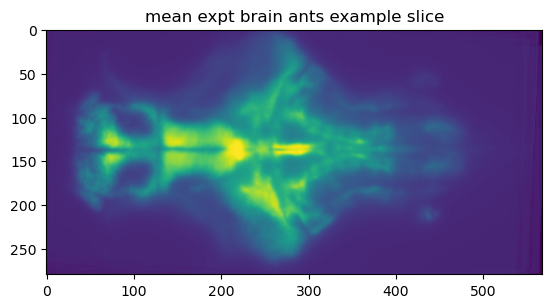

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

📏 Recording duration (min) across fish: min=120.0, p10=120.0, median=120.0
⚙️ Using FRAME_RATE_HZ=1. If this is wrong, EVERYTHING shifts.
Using full requested comparison end: WASH_END_MIN_EFF = 90.0 min
Baseline slice frames: 900 2700 len= 1800
Win0 0 - 10 min frames: 2760-3360 (len=600)
Win1 5 - 15 min frames: 3060-3660 (len=600)
Win2 10 - 20 min frames: 3360-3960 (len=600)
Win3 15 - 25 min frames: 3660-4260 (len=600)
Win4 20 - 30 min frames: 3960-4560 (len=600)
Win5 25 - 35 min frames: 4260-4860 (len=600)
Win6 30 - 40 min frames: 4560-5160 (len=600)
Expected total frames for 120 min: 7200
Plan: 7 contiguous windows from Drug Start (effective end=90.0 min).
Windows: ['0 - 10 min', '5 - 15 min', '10 - 20 min', '15 - 25 min', '20 - 30 min', '25 - 35 min', '30 - 40 min']
🚀 Processing 7 C

CTRL:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_1996390/1765511774.py:80: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:81: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:80: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:80: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/1765511774.py:81: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:81: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:83: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/1765511774.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/1765511774.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/1765511774.py:83: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/1765511774.py:83: RuntimeWarning: Degrees of freedom <=

🚀 Processing 7 HCRT-TRPV1 fish...


/tmp/ipykernel_1996390/1765511774.py:353: RuntimeWarning: Mean of empty slice
  m = np.nanmean(stack, axis=0).astype(np.float32)


HCRT-TRPV1:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_1996390/1765511774.py:80: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:81: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:80: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:81: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:80: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/1765511774.py:81: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:83: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/1765511774.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/1765511774.py:80: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/1765511774.py:83: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/1765511774.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice.
/

In [ ]:
import os
import gc
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.gridspec import GridSpec
from joblib import Parallel, delayed
from tqdm.auto import tqdm

# =========================
# USER SETTINGS
# =========================
# --- ROBUSTNESS SETTINGS ---
DPRIME_CLIP_ABS = 1.5          # clip per-cell d′ to [-1.5, 1.5]

# --- CONTIGUOUS WINDOWS ---
WINDOW_DURATION_MIN = 10
WINDOW_STEP_MIN = 5

TAG = "phasic_dprime_contiguous_10min_step5_clip1p5"
DS = (5, 5, 2)
ROTATE_XY_MINUS_90 = True
N_JOBS = 25  # Adjust based on your CPU

# Optional debug (avoid printing from joblib workers)
DEBUG_ONE_FISH = False   # True: run 1 fish sequentially with prints
DEBUG_N_WINDOWS_PRINT = 3

# --- INPUT FILES ---
F_NAME_COORDS = "transformed_all_cells_meanbrain.npy"
F_NAME_PHASIC_TRACES = "data_array_f_phasic.npy"

OUT_NAME = f"Phasic_Dprime_Map_{TAG}.png"

# --- TIME & d' SETTINGS ---
FRAME_RATE_HZ = volume_per_sec
AMPLITUDE_MODE = "raw"     # IMPORTANT: signed d′ for maps
EPS_VAR = 1e-8
VAR_FLOOR = 1e-4           # stabilizes denom when windows are quiet

# Time Anchors (in Minutes)
BASELINE_START_MIN = baseline_start / 60 / volume_per_sec
BASELINE_END_MIN   = baseline_end / 60 / volume_per_sec
BASELINE_OFFSET_MIN = 15   # Baseline used: 15-45 min

DRUG_START_MIN = drug_start / 60 / volume_per_sec        # Time 0 for labels
WASH_END_MIN   = wash_end / 60 / volume_per_sec - 30

# =========================
# MATH & HELPERS
# =========================
def _get_n_frames(expt_ID):
    p = Path(dir_ants_output) / proj_ID / expt_ID / F_NAME_PHASIC_TRACES
    if not p.exists():
        return None
    x = np.load(p, mmap_mode="r")
    if x.ndim != 2:
        return None
    return int(x.shape[1])

def _amplitude_transform(Fph, mode):
    if mode == "raw":
        return Fph
    if mode == "abs":
        return np.abs(Fph)
    if mode == "rms":
        return Fph ** 2
    raise ValueError(f"Unknown AMPLITUDE_MODE: {mode}")

def dprime_per_cell(Fphasic, idx_base, idx_drug, mode, clip_abs=None):
    A = _amplitude_transform(Fphasic, mode).astype(np.float32)

    base = A[:, idx_base]
    drug = A[:, idx_drug]

    # if either window too short, return NaNs
    if base.shape[1] < 2 or drug.shape[1] < 2:
        return np.full((A.shape[0],), np.nan, dtype=np.float32)

    mu_b = np.nanmean(base, axis=1)
    mu_d = np.nanmean(drug, axis=1)
    var_b = np.nanvar(base, axis=1, ddof=1)
    var_d = np.nanvar(drug, axis=1, ddof=1)

    # stabilize variance
    var_b = np.maximum(var_b, VAR_FLOOR)
    var_d = np.maximum(var_d, VAR_FLOOR)

    denom = np.sqrt((var_b + var_d) / 2.0 + EPS_VAR).astype(np.float32)
    dprime = (mu_d - mu_b) / denom

    dprime[~np.isfinite(dprime)] = np.nan
    dprime[denom <= 0] = np.nan

    # clip extreme per-cell d′
    if clip_abs is not None:
        dprime = np.clip(dprime, -clip_abs, clip_abs)

    return dprime.astype(np.float32)

def _mean_brain_shape(combine_proj_ID):
    mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)
    return tuple(map(int, mean_img.shape))

def _safe_load(path, mmap_mode=None):
    if not os.path.exists(path):
        return None
    return np.load(path, mmap_mode=mmap_mode)

def _coarse_shape(brain_shape, ds):
    brain_shape = np.array(brain_shape, dtype=int)
    ds = np.array(ds, dtype=int)
    return tuple(((brain_shape + ds - 1) // ds).astype(int))

def _min_to_idx(minutes, fs_hz):
    return int(np.round(minutes * 60 * fs_hz))

def _voxelize_cell_values(coords, vals, brain_shape, ds):
    coords = np.asarray(coords)
    vals = np.asarray(vals)

    mask = np.isfinite(vals) & (~np.isnan(coords).any(axis=1))
    coords = coords[mask]
    vals = vals[mask]

    X, Y, Z = brain_shape
    inb = (
        (coords[:, 0] >= 0) & (coords[:, 0] < X) &
        (coords[:, 1] >= 0) & (coords[:, 1] < Y) &
        (coords[:, 2] >= 0) & (coords[:, 2] < Z)
    )
    coords = coords[inb]
    vals = vals[inb]

    if coords.shape[0] == 0:
        return None

    ds = np.array(ds, dtype=int)
    Xc, Yc, Zc = _coarse_shape((X, Y, Z), ds)

    cidx = np.floor(coords / ds).astype(int)
    cidx[:, 0] = np.clip(cidx[:, 0], 0, Xc - 1)
    cidx[:, 1] = np.clip(cidx[:, 1], 0, Yc - 1)
    cidx[:, 2] = np.clip(cidx[:, 2], 0, Zc - 1)

    lin = (cidx[:, 0] * (Yc * Zc) + cidx[:, 1] * Zc + cidx[:, 2]).astype(np.int64)
    nvox = Xc * Yc * Zc

    sumv = np.zeros(nvox, dtype=np.float64)
    cntv = np.zeros(nvox, dtype=np.int64)

    np.add.at(sumv, lin, vals.astype(np.float64))
    np.add.at(cntv, lin, 1)

    out = np.full(nvox, np.nan, dtype=np.float32)
    m = cntv > 0
    out[m] = (sumv[m] / cntv[m]).astype(np.float32)
    return out.reshape((Xc, Yc, Zc))

# =========================
# WORKER FUNCTION
# =========================
def _process_one_fish_all_windows(
    expt_ID, proj_ID, dir_ants_output,
    brain_shape, ds,
    base_slice, window_slices,
    amp_mode,
    min_fraction_available=0.50,
    dprime_clip_abs=None,
):
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    p_coords = dir_expt / F_NAME_COORDS
    p_traces = dir_expt / F_NAME_PHASIC_TRACES

    coords = _safe_load(str(p_coords))
    Fp = _safe_load(str(p_traces), mmap_mode="r")

    if coords is None or Fp is None:
        return [None] * len(window_slices)

    if Fp.ndim != 2 or Fp.shape[0] != coords.shape[0]:
        return [None] * len(window_slices)

    n_frames_total = int(Fp.shape[1])

    # clip baseline slice too
    b0, b1 = int(base_slice.start), int(base_slice.stop)
    if b0 >= n_frames_total or (b1 - b0) < 2:
        return [None] * len(window_slices)
    b1 = min(b1, n_frames_total)
    base_slice_clipped = slice(b0, b1)

    volumes = []
    for w_slice in window_slices:
        start = int(w_slice.start)
        stop = int(w_slice.stop)

        if start >= n_frames_total:
            volumes.append(None)
            continue

        if stop > n_frames_total:
            available = n_frames_total - start
            intended = stop - start
            if available < (min_fraction_available * intended):
                volumes.append(None)
                continue
            actual_slice = slice(start, n_frames_total)
        else:
            actual_slice = w_slice

        try:
            dvals = dprime_per_cell(
                Fp,
                base_slice_clipped,
                actual_slice,
                amp_mode,
                clip_abs=dprime_clip_abs
            )

            vol = _voxelize_cell_values(coords, dvals, brain_shape, ds)

            if vol is None or not np.isfinite(vol).any():
                volumes.append(None)
            else:
                volumes.append(vol)

        except Exception:
            volumes.append(None)

    del Fp, coords
    gc.collect()
    return volumes

# =========================
# MAIN EXECUTION
# =========================
brain_shape = _mean_brain_shape(combine_proj_ID)
Xc, Yc, Zc = _coarse_shape(brain_shape, DS)

all_expts = list(ctrl_expt_ID_list) + list(hcrt_expt_ID_list)
nframes_list = [nf for nf in (_get_n_frames(e) for e in all_expts) if nf is not None]
if len(nframes_list) == 0:
    raise RuntimeError("No phasic trace files found to determine recording length.")

nframes_arr = np.asarray(nframes_list, dtype=float)
dur_mins = nframes_arr / FRAME_RATE_HZ / 60.0
min_dur_min = float(np.nanmin(dur_mins))
p10_dur_min = float(np.nanpercentile(dur_mins, 10))
med_dur_min = float(np.nanmedian(dur_mins))

print(f"📏 Recording duration (min) across fish: min={min_dur_min:.1f}, p10={p10_dur_min:.1f}, median={med_dur_min:.1f}")
print(f"⚙️ Using FRAME_RATE_HZ={FRAME_RATE_HZ}. If this is wrong, EVERYTHING shifts.")

# Do NOT cap by fish duration here.
WASH_END_MIN_EFF = WASH_END_MIN
print(f"Using full requested comparison end: WASH_END_MIN_EFF = {WASH_END_MIN_EFF:.1f} min")

base_start_idx = _min_to_idx(BASELINE_START_MIN + BASELINE_OFFSET_MIN, FRAME_RATE_HZ)
base_end_idx   = _min_to_idx(BASELINE_END_MIN, FRAME_RATE_HZ)
baseline_slice = slice(base_start_idx, base_end_idx)

typ_nf = int(np.nanmedian(nframes_arr))
if base_end_idx > typ_nf:
    print(f"🚨 Baseline slice ends at frame {base_end_idx}, but typical recording has {typ_nf} frames.")
    print("   This screams FRAME_RATE_HZ mismatch or wrong time anchors.")

# latest valid window start so that (start + duration) still fits
last_start_min = WASH_END_MIN_EFF - WINDOW_DURATION_MIN

# include endpoint with tiny epsilon to protect against float rounding
comp_start_times = np.arange(
    DRUG_START_MIN,
    last_start_min + 1e-9,
    WINDOW_STEP_MIN
)

window_slices = []
window_labels = []

for t_start in comp_start_times:
    t_end = t_start + WINDOW_DURATION_MIN

    s_idx = _min_to_idx(t_start, FRAME_RATE_HZ)
    e_idx = _min_to_idx(t_end, FRAME_RATE_HZ)

    window_slices.append(slice(s_idx, e_idx))

    rel_start = t_start - DRUG_START_MIN
    rel_end   = t_end - DRUG_START_MIN
    window_labels.append(f"{int(round(rel_start))} - {int(round(rel_end))} min")

n_windows = len(window_slices)

print("Baseline slice frames:", baseline_slice.start, baseline_slice.stop,
      "len=", baseline_slice.stop - baseline_slice.start)
for i in range(min(10, len(window_slices))):
    s = window_slices[i].start
    e = window_slices[i].stop
    print(f"Win{i} {window_labels[i]} frames: {s}-{e} (len={e-s})")

expected_frames = int(round(120 * 60 * FRAME_RATE_HZ))
print("Expected total frames for 120 min:", expected_frames)
print(f"Plan: {n_windows} contiguous windows from Drug Start (effective end={WASH_END_MIN_EFF:.1f} min).")
print(f"Windows: {window_labels}")

# =========================
# RUN PARALLEL + AVERAGE MAPS
# =========================
def run_group(expt_list, group_name):
    print(f"🚀 Processing {len(expt_list)} {group_name} fish...")

    if DEBUG_ONE_FISH:
        expt_list = expt_list[:1]
        print(f"🧪 DEBUG_ONE_FISH=True -> running only {expt_list}")

        results = []
        for expt_ID in expt_list:
            vols = _process_one_fish_all_windows(
                expt_ID, proj_ID, dir_ants_output,
                brain_shape, DS,
                baseline_slice, window_slices,
                AMPLITUDE_MODE,
                dprime_clip_abs=DPRIME_CLIP_ABS
            )
            results.append(vols)

            for wi in range(min(DEBUG_N_WINDOWS_PRINT, len(window_slices))):
                v = vols[wi]
                frac = np.nan if v is None else float(np.mean(np.isfinite(v)))
                print(f"[{expt_ID}] win{wi} {window_labels[wi]} finite-voxel-frac={frac:.4f}")
    else:
        results = Parallel(n_jobs=N_JOBS, backend="loky")(
            delayed(_process_one_fish_all_windows)(
                expt_ID, proj_ID, dir_ants_output,
                brain_shape, DS,
                baseline_slice, window_slices,
                AMPLITUDE_MODE,
                dprime_clip_abs=DPRIME_CLIP_ABS
            )
            for expt_ID in tqdm(expt_list, desc=group_name)
        )

    avg_maps = []
    for w_i in range(n_windows):
        fish_maps = [res[w_i] for res in results if res and res[w_i] is not None]

        if not fish_maps:
            avg_maps.append(None)
            continue

        stack = np.stack(fish_maps, axis=0)
        m = np.nanmean(stack, axis=0).astype(np.float32)

        if not np.isfinite(m).any():
            avg_maps.append(None)
        else:
            avg_maps.append(m)

    return avg_maps

ctrl_maps = run_group(ctrl_expt_ID_list, CTRL_TAG)
hcrt_maps = run_group(hcrt_expt_ID_list, EXPT_TAG)

maps_by_window = [{CTRL_TAG: ctrl_maps[i], EXPT_TAG: hcrt_maps[i]} for i in range(n_windows)]

# =========================
# PLOTTING
# =========================
vmin, vmax = -0.8, 0.8
cmap = "bwr"
PROJ_MODE = "mean"   # "mean" | "max" | "maxabs"

def _rotate(arr):
    return np.rot90(arr, k=3) if ROTATE_XY_MINUS_90 else arr

titles = [CTRL_TAG, EXPT_TAG]
n_cols = 2

height_ratios = []
for _ in range(n_windows):
    height_ratios.extend([Xc, Zc])

fig = plt.figure(figsize=(5 * n_cols, 2.0 * n_windows))
gs = GridSpec(
    nrows=2 * n_windows,
    ncols=n_cols,
    height_ratios=height_ratios,
    hspace=0.1,
    wspace=0.05,
    top=0.88,
    bottom=0.05
)

axs = np.empty((2 * n_windows, n_cols), dtype=object)
for r in range(2 * n_windows):
    for c in range(n_cols):
        axs[r, c] = fig.add_subplot(gs[r, c])

def _proj(vol, axis, mode="mean"):
    if mode == "mean":
        return np.nanmean(vol, axis=axis)

    if mode == "max":
        return np.nanmax(vol, axis=axis)

    if mode == "maxabs":
        a = np.abs(vol)
        a = np.where(np.isfinite(a), a, -np.inf)
        idx = np.nanargmax(a, axis=axis)
        vol0 = np.where(np.isfinite(vol), vol, np.nan)
        take = np.take_along_axis(vol0, np.expand_dims(idx, axis=axis), axis=axis)
        return np.squeeze(take, axis=axis)

    raise ValueError(f"Unknown PROJ_MODE: {mode}")

last_im = None

for wi in range(n_windows):
    m = maps_by_window[wi]
    row_xy, row_yz = 2 * wi, 2 * wi + 1

    for j, key in enumerate(titles):
        vol = m[key]
        if vol is None:
            axs[row_xy, j].axis("off")
            axs[row_yz, j].axis("off")
            continue

        # XY: mean over Z
        xy = _proj(vol, axis=2, mode=PROJ_MODE)
        if not np.isfinite(xy).any():
            axs[row_xy, j].axis("off")
        else:
            xy = _rotate(xy)
            xy_disp = np.rot90(xy, k=4).T
            axs[row_xy, j].imshow(
                xy_disp,
                cmap=cmap, vmin=vmin, vmax=vmax,
                origin="upper", aspect="equal", interpolation="nearest",
                extent=[0, Yc, Xc, 0]
            )
            axs[row_xy, j].axis("off")
            axs[row_xy, j].set_xlim(0, Yc)
            if wi == 0:
                axs[row_xy, j].set_title(key, fontsize=14, pad=10)

        # YZ: mean over X
        yz = _proj(vol, axis=0, mode=PROJ_MODE)
        if not np.isfinite(yz).any():
            axs[row_yz, j].axis("off")
        else:
            yz = yz.T
            yz = np.rot90(yz, k=3).T
            yz_disp = np.flipud(yz)

            last_im = axs[row_yz, j].imshow(
                yz_disp,
                cmap=cmap, vmin=vmin, vmax=vmax,
                origin="upper", aspect="equal", interpolation="nearest",
                extent=[0, Yc, Zc, 0]
            )
            axs[row_yz, j].axis("off")
            axs[row_yz, j].invert_yaxis()
            axs[row_yz, j].set_xlim(0, Yc)

    pos_top = axs[row_xy, 0].get_position()
    pos_bot = axs[row_yz, 0].get_position()
    y_center = (pos_top.y1 + pos_bot.y0) / 2

    fig.text(
        0.02, y_center, window_labels[wi],
        va="center", ha="right", rotation=90,
        fontsize=12, fontweight="bold",
        transform=fig.transFigure
    )

if last_im is not None:
    cbar = fig.colorbar(
        last_im,
        ax=axs.ravel().tolist(),
        fraction=0.02,
        pad=0.02,
        ticks=[-1, -0.5, 0, 0.5, 1],
    )
    cbar.set_label(f"d′ ({AMPLITUDE_MODE}) vs Baseline")
else:
    print("⚠️ No finite maps to colorbar (last_im is None).")

fig.suptitle(
    f"Contiguous Phasic d′ ({WINDOW_DURATION_MIN}m bins, {WINDOW_STEP_MIN}m step) | "
    f"{AMPLITUDE_MODE} | DS={DS} | fish=mean | clip=±{DPRIME_CLIP_ABS}",
    y=0.96, fontsize=16
)

# Save
fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)
plt.savefig(fig_dir / OUT_NAME, dpi=300, bbox_inches="tight")
print(f"✅ Saved figure: {fig_dir / OUT_NAME}")
plt.show()

## 【MAP: Tonic-Spearman corr. lagged】

### [COMPOSITE POS+NEG CORR. INTENSITY MAP]

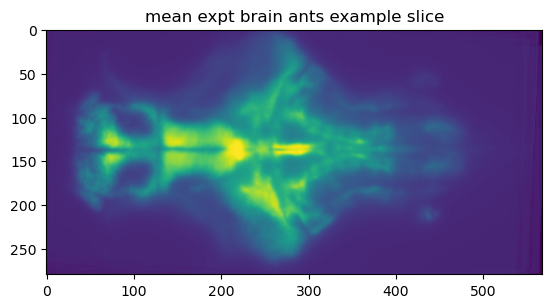

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

Found n_lags=5 with lag_grid_min=[0.0, 5.0, 10.0, 15.0, 20.0]


/tmp/ipykernel_628160/643432259.py:134: RuntimeWarning: Mean of empty slice
  meanV = np.nanmean(V, axis=0).astype(np.float32)


CTRL fish used per lag: [7, 7, 7, 7, 7]
HCRT-TRPV1 fish used per lag: [7, 7, 7, 7, 7]
Color scale fixed to [-0.9, 0.9]


/tmp/ipykernel_628160/643432259.py:138: RuntimeWarning: Mean of empty slice
  return np.nanmean(vol, axis=2)  # (Xc,Yc)
/tmp/ipykernel_628160/643432259.py:141: RuntimeWarning: Mean of empty slice
  return np.nanmean(vol, axis=0)  # (Yc,Zc)


✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/Tonic_Map_ranked_corr_allcells_meanRho_ds2_allLags_OVERLAP.png


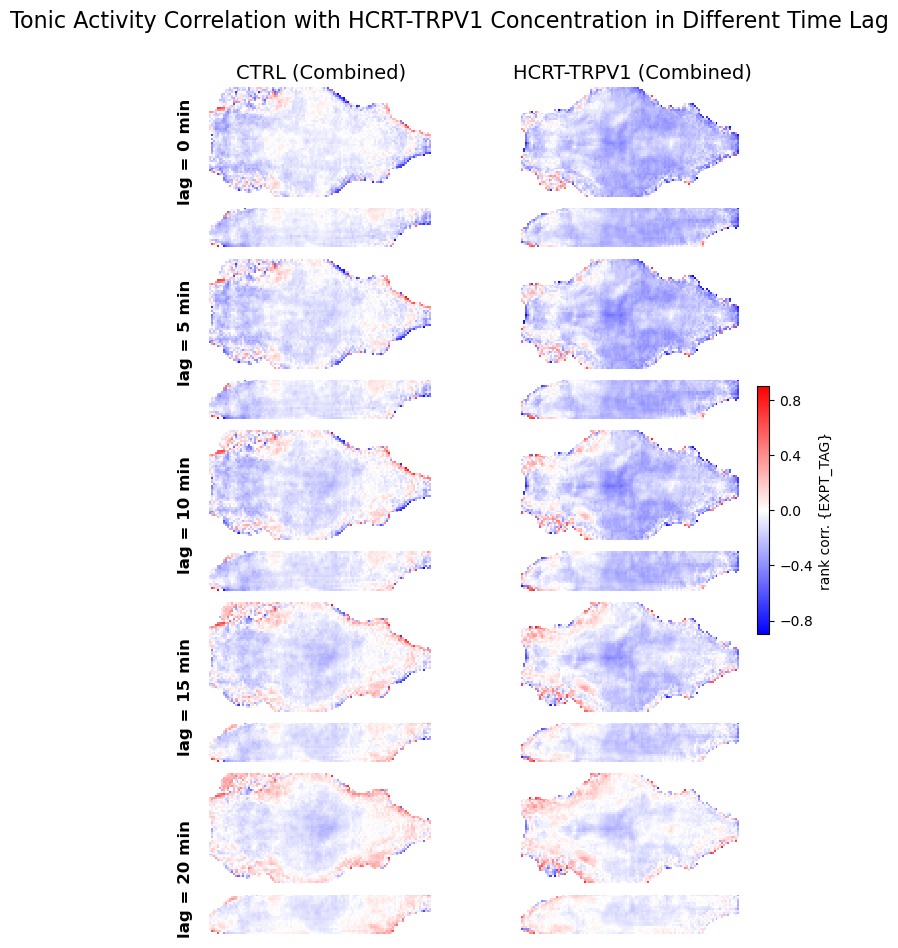

✅ Saved per-lag combined 3D maps as .npy
✅ Saved per-lag z-stack TIFFs to: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/tiff_stacks_tonic_correlation


In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.gridspec import GridSpec

# =========================
# USER SETTINGS
# =========================
TAG = "allcells_meanRho_ds2_allLags_OVERLAP"
DS = (5, 5, 2)
ROTATE_XY_MINUS_90 = True

F_NAME_COORDS   = "transformed_all_cells_meanbrain.npy"
F_NAME_RHO_ALL  = "rho_tonic_all_lags.npy"
F_NAME_LAG_GRID = "rho_tonic_lag_grid_sec.npy"

OUT_NAME = f"Tonic_Map_ranked_corr_{TAG}.png"

# =========================
# Helpers
# =========================
def _mean_brain_shape(combine_proj_ID):
    mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)
    shp = tuple(map(int, mean_img.shape))
    if len(shp) != 3:
        raise ValueError(f"Mean brain shape is not 3D: {shp}")
    return shp

def _safe_load(path):
    if not os.path.exists(path):
        return None
    return np.load(path)

def _coarse_shape(brain_shape, ds):
    brain_shape = np.array(brain_shape, dtype=int)
    ds = np.array(ds, dtype=int)
    return tuple(((brain_shape + ds - 1) // ds).astype(int))  # ceil div

def _voxelize_mean_rho(coords_xyz, rho, brain_shape, ds, sign="pos"):
    coords = np.asarray(coords_xyz, dtype=np.float32)
    rho = np.asarray(rho, dtype=np.float32).ravel()

    if coords.ndim != 2 or coords.shape[1] != 3:
        raise ValueError(f"coords must be (N,3). Got {coords.shape}")
    if rho.shape[0] != coords.shape[0]:
        raise ValueError(f"rho length mismatch: rho={rho.shape[0]} vs coords={coords.shape[0]}")

    good = np.isfinite(rho) & (~np.isnan(coords).any(axis=1))
    coords = coords[good]
    rho = rho[good]

    X, Y, Z = brain_shape
    inb = (
        (coords[:,0] >= 0) & (coords[:,0] < X) &
        (coords[:,1] >= 0) & (coords[:,1] < Y) &
        (coords[:,2] >= 0) & (coords[:,2] < Z)
    )
    coords = coords[inb]
    rho = rho[inb]

    if coords.shape[0] == 0:
        return None

    if sign == "pos":
        val = np.clip(rho, 0.0, 1.0)
    elif sign == "neg":
        val = np.clip(rho, -1.0, 0.0)
    else:
        raise ValueError("sign must be 'pos' or 'neg'")

    ds = np.array(ds, dtype=int)
    Xc, Yc, Zc = _coarse_shape((X, Y, Z), ds)

    cidx = np.floor(coords / ds).astype(int)
    cidx[:,0] = np.clip(cidx[:,0], 0, Xc-1)
    cidx[:,1] = np.clip(cidx[:,1], 0, Yc-1)
    cidx[:,2] = np.clip(cidx[:,2], 0, Zc-1)

    lin = (cidx[:,0] * (Yc*Zc) + cidx[:,1] * Zc + cidx[:,2]).astype(np.int64)
    nvox = Xc * Yc * Zc

    sumv = np.zeros(nvox, dtype=np.float64)
    cntv = np.zeros(nvox, dtype=np.int64)

    np.add.at(sumv, lin, val.astype(np.float64))
    np.add.at(cntv, lin, 1)

    out = np.full(nvox, np.nan, dtype=np.float32)
    m = cntv > 0
    out[m] = (sumv[m] / cntv[m]).astype(np.float32)

    return out.reshape((Xc, Yc, Zc))

def _avg_across_fish_one_lag(expt_IDs, proj_ID, dir_ants_output, brain_shape, ds, sign, lag_idx):
    vols = []
    used = 0

    for expt_ID in expt_IDs:
        dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
        p_coords = dir_expt / F_NAME_COORDS
        p_rhoall = dir_expt / F_NAME_RHO_ALL

        coords = _safe_load(str(p_coords))
        rhoall = _safe_load(str(p_rhoall))
        if coords is None or rhoall is None:
            print(f"⚠️ {expt_ID}: missing coords or rho_all")
            continue

        if rhoall.ndim != 2:
            print(f"⚠️ {expt_ID}: rho_all must be 2D (n_cells,n_lags). Got {rhoall.shape}")
            continue
        if rhoall.shape[0] != coords.shape[0]:
            print(f"⚠️ {expt_ID}: rho_all n_cells mismatch: {rhoall.shape[0]} vs coords {coords.shape[0]}")
            continue
        if not (0 <= lag_idx < rhoall.shape[1]):
            print(f"⚠️ {expt_ID}: lag_idx {lag_idx} out of bounds for rho_all {rhoall.shape}")
            continue

        rho = rhoall[:, lag_idx]
        vol = _voxelize_mean_rho(coords, rho, brain_shape, ds, sign=sign)
        if vol is None:
            continue

        vols.append(vol)
        used += 1

    if used == 0:
        return None, 0

    V = np.stack(vols, axis=0)
    # Using nanmean here. If a voxel is NaN in one fish but valid in others, we take the mean of valid ones.
    # If all are NaN, it remains NaN.
    meanV = np.nanmean(V, axis=0).astype(np.float32)
    return meanV, used

def _proj_xy(vol):
    return np.nanmean(vol, axis=2)  # (Xc,Yc)

def _proj_yz(vol):
    return np.nanmean(vol, axis=0)  # (Yc,Zc)

def _rotate_xy_minus_90(arr2d):
    return np.rot90(arr2d, k=3)

# =========================
# BUILD MAPS (ALL LAGS)
# =========================
brain_shape = _mean_brain_shape(combine_proj_ID)

def _load_lag_grid_any(expt_list):
    for expt_ID in expt_list:
        p = Path(dir_ants_output) / proj_ID / expt_ID / F_NAME_LAG_GRID
        g = _safe_load(str(p))
        if g is not None:
            g = np.asarray(g, dtype=np.float32).ravel()
            if g.size > 0:
                return g
    return None

lag_grid_sec = _load_lag_grid_any(ctrl_expt_ID_list)
if lag_grid_sec is None:
    lag_grid_sec = _load_lag_grid_any(hcrt_expt_ID_list)

if lag_grid_sec is None:
    raise FileNotFoundError(f"Could not find '{F_NAME_LAG_GRID}' in any fish folder.")
if lag_grid_sec.ndim != 1 or lag_grid_sec.size == 0:
    raise ValueError(f"Bad lag_grid_sec: shape={lag_grid_sec.shape}")

lag_grid_min = lag_grid_sec / 60.0
n_lags = int(lag_grid_sec.size)
print(f"Found n_lags={n_lags} with lag_grid_min={lag_grid_min.tolist()}")

maps_by_lag = []
n_used_ctrl = []
n_used_hcrt = []

for li in range(n_lags):
    # Fetch positive and negative components separately
    ctrl_pos, n_ctrl = _avg_across_fish_one_lag(ctrl_expt_ID_list, proj_ID, dir_ants_output, brain_shape, DS, sign="pos", lag_idx=li)
    ctrl_neg, _      = _avg_across_fish_one_lag(ctrl_expt_ID_list, proj_ID, dir_ants_output, brain_shape, DS, sign="neg", lag_idx=li)
    hcrt_pos, n_hcrt = _avg_across_fish_one_lag(hcrt_expt_ID_list, proj_ID, dir_ants_output, brain_shape, DS, sign="pos", lag_idx=li)
    hcrt_neg, _      = _avg_across_fish_one_lag(hcrt_expt_ID_list, proj_ID, dir_ants_output, brain_shape, DS, sign="neg", lag_idx=li)

    if any(v is None for v in [ctrl_pos, ctrl_neg, hcrt_pos, hcrt_neg]):
        raise RuntimeError(f"Lag idx {li} (lag={lag_grid_min[li]:g} min): one or more maps is None.")

    # --- MERGE POS AND NEG ---
    # Convert NaNs to 0 temporarily to sum them safely, then put NaN back if both were NaN
    # Actually, simpler: just use np.nansum, but we want to keep NaNs where there is NO data.
    # Strategy: Replace None/NaN with 0.0, add them.
    
    def merge_pos_neg(pmap, nmap):
        # pmap is [0..1] or NaN
        # nmap is [-1..0] or NaN
        p_safe = np.nan_to_num(pmap, nan=0.0)
        n_safe = np.nan_to_num(nmap, nan=0.0)
        
        # Mask where both are NaN (no data at all)
        mask_p = np.isnan(pmap)
        mask_n = np.isnan(nmap)
        both_nan = mask_p & mask_n
        
        combined = p_safe + n_safe
        combined[both_nan] = np.nan
        return combined

    ctrl_combined = merge_pos_neg(ctrl_pos, ctrl_neg)
    hcrt_combined = merge_pos_neg(hcrt_pos, hcrt_neg)

    maps_by_lag.append({
        F"{CTRL_TAG} (Combined)": ctrl_combined,
        F"{EXPT_TAG} (Combined)": hcrt_combined,
    })
    n_used_ctrl.append(n_ctrl)
    n_used_hcrt.append(n_hcrt)

print(F"{CTRL_TAG} fish used per lag:", n_used_ctrl)
print(F"{EXPT_TAG} fish used per lag:", n_used_hcrt)

# =========================
# Color scaling
# =========================
vmin, vmax = -0.9, 0.9
print(f"Color scale fixed to [{vmin:.1f}, {vmax:.1f}]")

# =========================
# PLOT
# =========================
titles = list(maps_by_lag[0].keys())
n_cols = len(titles) # Should be 2 now
cmap = "bwr"

Xc, Yc, Zc = _coarse_shape(brain_shape, np.array(DS, dtype=int))

# Set height ratios based on data dimensions
height_ratios = []
for _ in range(n_lags):
    height_ratios.extend([Xc, Zc]) 

fig = plt.figure(figsize=(4 * n_cols, 2.2 * n_lags)) # Adjusted figure width
gs = GridSpec(
    nrows=2 * n_lags,
    ncols=n_cols,
    figure=fig,
    height_ratios=height_ratios,
    hspace=0.15,
    wspace=0.1, # Slightly more space between the two distinct groups
)

axs = np.empty((2 * n_lags, n_cols), dtype=object)
for r in range(2 * n_lags):
    for c in range(n_cols):
        axs[r, c] = fig.add_subplot(gs[r, c])

last_im = None

for li in range(n_lags):
    maps = maps_by_lag[li]

    xy = {k: _proj_xy(v) for k, v in maps.items()}  # (Xc,Yc)
    yz = {k: _proj_yz(v) for k, v in maps.items()}  # (Yc,Zc)

    if ROTATE_XY_MINUS_90:
        xy = {k: _rotate_xy_minus_90(a) for k, a in xy.items()}  # still 2D

    r_xy = 2 * li
    r_yz = 2 * li + 1

    # ---- XY row ----
    for j, t in enumerate(titles):
        xy_img = xy[t]
        xy_img = np.rot90(xy_img, k=4) 
        xy_img_disp = xy_img.T 

        last_im = axs[r_xy, j].imshow(
            xy_img_disp,
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            origin="upper",
            extent=[0, Yc, Xc, 0],
            aspect="equal",
            interpolation="nearest",
        )
        axs[r_xy, j].axis("off")
        if li == 0:
            axs[r_xy, j].set_title(t, fontsize=14)
        axs[r_xy, j].set_xlim(0, Yc)

    # ---- YZ row ----
    for j, t in enumerate(titles):
        yz_img = yz[t].T 
        yz_img = np.rot90(yz_img, k=3)
        yz_img_disp = yz_img.T 
        yz_img_disp = np.flipud(yz_img_disp)
        
        last_im = axs[r_yz, j].imshow(
            yz_img_disp,
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            origin="upper",
            extent=[0, Yc, Zc, 0],
            aspect="equal",
            interpolation="nearest",
        )
        axs[r_yz, j].axis("off")
        axs[r_yz, j].set_xlim(0, Yc)
        axs[r_yz, j].invert_yaxis()


    # ---- Lag label ----
    lag_txt = f"lag = {lag_grid_min[li]:g} min"
    bb_xy = axs[r_xy, 0].get_position()
    bb_yz = axs[r_yz, 0].get_position()
    
    x_mid = bb_xy.x0 - 0.0 # Adjusted offset for fewer columns
    y_mid = 0.53 * (bb_xy.y0 + bb_yz.y1)

    fig.text(
        x_mid, y_mid,
        lag_txt,
        ha="center", va="center",
        rotation=90,
        fontsize=12,
        fontweight="bold",
    )

# ---- Shared colorbar ----
cbar = fig.colorbar(
    last_im,
    ax=axs.ravel().tolist(),
    fraction=0.02,
    pad=0.02,
)
cbar.set_label("rank corr. {EXPT_TAG}")
cbar.set_ticks([-0.8, -0.4, 0, 0.4, 0.8])

fig.suptitle(
    f"Tonic Activity Correlation with {EXPT_TAG} Concentration in Different Time Lag",
    y=0.95, # Adjusted title height
    fontsize=16,
)

# ---- Save ----
fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)
save_path = fig_dir / OUT_NAME
plt.savefig(save_path, dpi=300, bbox_inches="tight")
print(f"✅ Saved: {save_path}")

plt.show()

# ============ save ==================
# Saving the combined maps
for li in range(n_lags):
    lag_min = lag_grid_min[li]
    lag_tag = f"lag{int(round(lag_min))}min"
    maps = maps_by_lag[li]
    np.save(fig_dir / f"Tonic_Map_ranked_corr_{TAG}__{lag_tag}__{CTRL_TAG}_combined.npy", maps[F"{CTRL_TAG} (Combined)"])
    np.save(fig_dir / f"Tonic_Map_ranked_corr_{TAG}__{lag_tag}__{EXPT_TAG}_combined.npy", maps[F"{EXPT_TAG} (Combined)"])
print("✅ Saved per-lag combined 3D maps as .npy")


# =========================
# EXPORT per-lag 3D z-stack TIFFs (Fiji)
# =========================
# -------------------------
# ensure n_lags is defined
# -------------------------
n_lags = len(maps_by_lag)

try:
    import tifffile as tiff
except ImportError as e:
    raise ImportError(
        "tifffile is required to export TIFF stacks. Install with: pip install tifffile"
    ) from e

tiff_dir = fig_dir / "tiff_stacks_tonic_correlation"
tiff_dir.mkdir(parents=True, exist_ok=True)

def _to_fiji_zyx(vol_xyz):
    """
    Input:  (X, Y, Z) float volume (your internal)
    Output: (Z, Y, X) float volume (Fiji-friendly)
    """
    vol_xyz = np.asarray(vol_xyz)
    if vol_xyz.ndim != 3:
        raise ValueError(f"Expected 3D vol, got shape={vol_xyz.shape}")
    return np.transpose(vol_xyz, (2, 1, 0))  # (Z, Y, X)

for li in range(n_lags):
    lag_min = float(lag_grid_min[li])
    # keep filename stable even if lag isn't integer minutes
    lag_tag = f"lag{lag_min:+.2f}min".replace(".", "p").replace("+", "plus").replace("-", "minus")

    maps = maps_by_lag[li]
    ctrl_vol = maps[F"{CTRL_TAG} (Combined)"]   # (Xc,Yc,Zc), float32 with NaNs
    hcrt_vol = maps[F"{EXPT_TAG} (Combined)"]

    # Convert to Fiji axis order
    ctrl_zyx = _to_fiji_zyx(ctrl_vol).astype(np.float32, copy=False)
    hcrt_zyx = _to_fiji_zyx(hcrt_vol).astype(np.float32, copy=False)

    # Option A (recommended): keep NaNs (Fiji opens 32-bit, NaNs usually render as black)
    out_ctrl = tiff_dir / f"Tonic_Map_ranked_corr_{TAG}__{lag_tag}__{CTRL_TAG}_combined_32f.tif"
    out_hcrt = tiff_dir / f"Tonic_Map_ranked_corr_{TAG}__{lag_tag}__{EXPT_TAG}_combined_32f.tif"
    tiff.imwrite(out_ctrl, ctrl_zyx, imagej=True)
    tiff.imwrite(out_hcrt, hcrt_zyx, imagej=True)

    # Option B (compat): replace NaNs with 0 so Fiji display/range tools behave more predictably
    out_ctrl0 = tiff_dir / f"Tonic_Map_ranked_corr_{TAG}__{lag_tag}__{CTRL_TAG}_combined_32f_nan0.tif"
    out_hcrt0 = tiff_dir / f"Tonic_Map_ranked_corr_{TAG}__{lag_tag}__{EXPT_TAG}_combined_32f_nan0.tif"
    tiff.imwrite(out_ctrl0, np.nan_to_num(ctrl_zyx, nan=0.0), imagej=True)
    tiff.imwrite(out_hcrt0, np.nan_to_num(hcrt_zyx, nan=0.0), imagej=True)

print(f"✅ Saved per-lag z-stack TIFFs to: {tiff_dir}")


### [Effect size intensity map] Spearman corr>0.9/>-0.9 ONLY Averaged Tonic Activity Change Effect Size Over Time

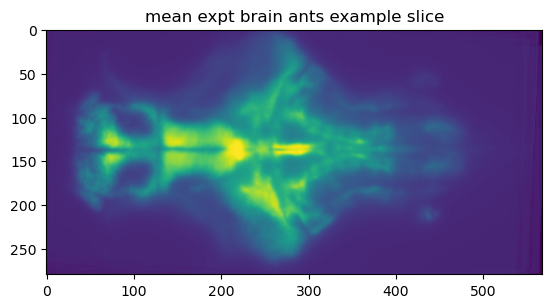

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

📏 Recording duration (min) across fish: min=120.0, p10=120.0, median=120.0
⚙️ Using FRAME_RATE_HZ=1.0. If this is wrong, EVERYTHING shifts.
Baseline slice frames: 1800 2700 len= 900
Win0 0 - 15 min frames: 2760-3660 (len=900)
Win1 10 - 25 min frames: 3360-4260 (len=900)
Win2 20 - 35 min frames: 3960-4860 (len=900)
Win3 30 - 45 min frames: 4560-5460 (len=900)
Win4 40 - 55 min frames: 5160-6060 (len=900)
Plan: 6 windows from drug start (effective end=120.0 min).
Windows: ['0 - 15 min', '10 - 25 min', '20 - 35 min', '30 - 45 min', '40 - 55 min', '50 - 65 min']
🚀 Processing 7 CTRL fish...


CTRL:   0%|          | 0/7 [00:00<?, ?it/s]

🚀 Processing 7 HCRT-TRPV1 fish...


/tmp/ipykernel_628160/837735607.py:333: RuntimeWarning: Mean of empty slice
  m = np.nanmean(stack, axis=0).astype(np.float32)


HCRT-TRPV1:   0%|          | 0/7 [00:00<?, ?it/s]

🎨 Robust color limits set to vmin=-24, vmax=24 (q=99)


/tmp/ipykernel_628160/837735607.py:134: RuntimeWarning: Mean of empty slice
  return np.nanmean(vol, axis=axis)


✅ Saved figure: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/Tonic_DZ_WindowMean_SpearmanAbsRhoGT_tonic_dz_windowmean_spearman_absrhoGT0.9_20min_step10.png


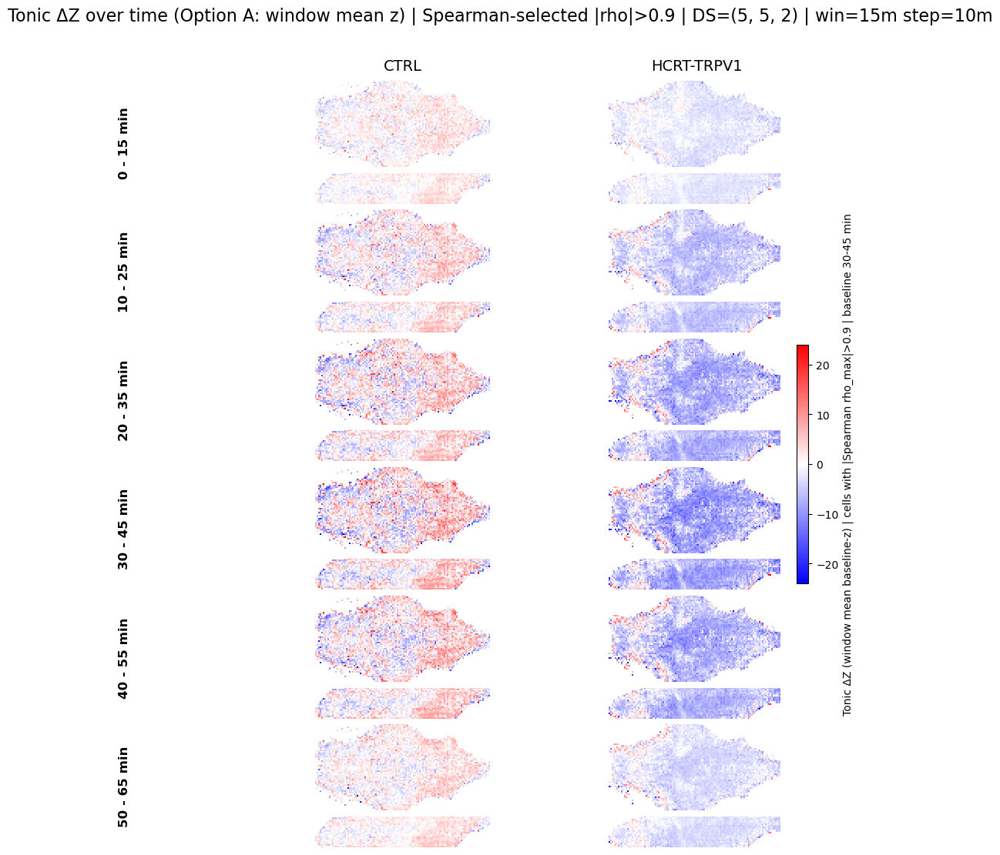

In [21]:
import os
import gc
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.gridspec import GridSpec
from joblib import Parallel, delayed
from tqdm.auto import tqdm

# =========================
# TONIC ΔZ MAP (Spearman-selected cells only)
#   Option A = window mean baseline-z (no max-search)
#   mask = cells with |rho_max| > 0.9 from rho_tonic_lagmax.npy
# =========================

# =========================
# USER SETTINGS
# =========================
RHO_THRESH = 0.9
TAG = f"tonic_dz_windowmean_spearman_absrhoGT{RHO_THRESH:g}_20min_step10"
DS = (5, 5, 2)
ROTATE_XY_MINUS_90 = True
N_JOBS = 25

# --- INPUT FILES ---
F_NAME_COORDS = "transformed_all_cells_meanbrain.npy"
F_NAME_TONIC  = "data_array_f_tonic.npy"
F_NAME_RHO    = "rho_tonic_lagmax.npy"     # saved best-lag signed rho per cell

OUT_NAME = f"Tonic_DZ_WindowMean_SpearmanAbsRhoGT_{TAG}.png"

# --- TIME SETTINGS ---
FRAME_RATE_HZ = float(volume_per_sec)

# Baseline for z-scoring (match your tonic ΔZ normalization)
BASELINE_MIN_PAIR = (baseline_end/60/volume_per_sec-15, (baseline_end)/ 60 / volume_per_sec) 

# Drug time anchor for window labels
DRUG_START_MIN = drug_start / 60 / volume_per_sec

# plotting time coverage (will be capped by data length)
WASH_END_MIN = wash_end / 60 / volume_per_sec

# --- CONTIGUOUS WINDOWS ---
WINDOW_DURATION_MIN = 15.0
WINDOW_STEP_MIN     = 10.0

# --- NUMERICS ---
EPS_SD = 1e-6

# --- PLOT SETTINGS ---
USE_ROBUST_LIMITS = True    # robust symmetric vmin/vmax from pooled voxel values
ROBUST_Q = 99.0             # percentile for symmetric limit (99 => ignore extremes)
vmin, vmax = -10.0, 10.0    # used only if USE_ROBUST_LIMITS=False
cmap = "bwr"
PROJ_MODE = "mean"

# =========================
# HELPERS
# =========================
def _safe_load(path, mmap_mode=None):
    if not os.path.exists(path):
        return None
    return np.load(path, mmap_mode=mmap_mode)

def _mean_brain_shape(combine_proj_ID):
    mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)
    return tuple(map(int, mean_img.shape))

def _coarse_shape(brain_shape, ds):
    brain_shape = np.array(brain_shape, dtype=int)
    ds = np.array(ds, dtype=int)
    return tuple(((brain_shape + ds - 1) // ds).astype(int))

def _min_to_idx(minutes, fs_hz):
    return int(np.round(minutes * 60.0 * fs_hz))

def _rotate(arr):
    return np.rot90(arr, k=3) if ROTATE_XY_MINUS_90 else arr

def _get_n_frames(expt_ID):
    p = Path(dir_ants_output) / proj_ID / expt_ID / F_NAME_TONIC
    if not p.exists():
        return None
    x = np.load(p, mmap_mode="r")
    if x.ndim != 2:
        return None
    return int(x.shape[1])

def _voxelize_cell_values(coords, vals, brain_shape, ds):
    coords = np.asarray(coords)
    vals = np.asarray(vals)

    mask = np.isfinite(vals) & (~np.isnan(coords).any(axis=1))
    coords = coords[mask]
    vals = vals[mask]

    X, Y, Z = brain_shape
    inb = (
        (coords[:, 0] >= 0) & (coords[:, 0] < X) &
        (coords[:, 1] >= 0) & (coords[:, 1] < Y) &
        (coords[:, 2] >= 0) & (coords[:, 2] < Z)
    )
    coords = coords[inb]
    vals = vals[inb]

    if coords.shape[0] == 0:
        return None

    ds = np.array(ds, dtype=int)
    Xc, Yc, Zc = _coarse_shape((X, Y, Z), ds)

    cidx = np.floor(coords / ds).astype(int)
    cidx[:, 0] = np.clip(cidx[:, 0], 0, Xc - 1)
    cidx[:, 1] = np.clip(cidx[:, 1], 0, Yc - 1)
    cidx[:, 2] = np.clip(cidx[:, 2], 0, Zc - 1)

    lin = (cidx[:, 0] * (Yc * Zc) + cidx[:, 1] * Zc + cidx[:, 2]).astype(np.int64)
    nvox = Xc * Yc * Zc

    sumv = np.zeros(nvox, dtype=np.float64)
    cntv = np.zeros(nvox, dtype=np.int64)

    np.add.at(sumv, lin, vals.astype(np.float64))
    np.add.at(cntv, lin, 1)

    out = np.full(nvox, np.nan, dtype=np.float32)
    m = cntv > 0
    out[m] = (sumv[m] / cntv[m]).astype(np.float32)
    return out.reshape((Xc, Yc, Zc))

def _proj(vol, axis, mode="mean"):
    if mode == "mean":
        return np.nanmean(vol, axis=axis)
    if mode == "max":
        return np.nanmax(vol, axis=axis)
    if mode == "maxabs":
        a = np.abs(vol)
        a = np.where(np.isfinite(a), a, -np.inf)
        idx = np.nanargmax(a, axis=axis)
        vol0 = np.where(np.isfinite(vol), vol, np.nan)
        take = np.take_along_axis(vol0, np.expand_dims(idx, axis=axis), axis=axis)
        return np.squeeze(take, axis=axis)
    raise ValueError(f"Unknown PROJ_MODE: {mode}")

# =========================
# WORKER (per fish, all windows) — Spearman mask |rho|>thr
# =========================
def _process_one_fish_all_windows_tonic_optionA_spearman(
    expt_ID, proj_ID, dir_ants_output,
    brain_shape, ds,
    baseline_slice, window_slices,
    rho_thresh=0.9,
    min_fraction_available=0.50,
):
    """
    Option A per window ΔZ = mean(z) in that window, where:
      z(t) = (F(t)-mu_baseline)/sd_baseline
      mean(z) over window == (mean(F_window)-mu_baseline)/sd_baseline

    Mask: only keep cells with |rho_max| > rho_thresh (rho_tonic_lagmax.npy).
    """
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    p_coords = dir_expt / F_NAME_COORDS
    p_traces = dir_expt / F_NAME_TONIC
    p_rho    = dir_expt / F_NAME_RHO

    coords = _safe_load(str(p_coords))
    Ft = _safe_load(str(p_traces), mmap_mode="r")
    rho = _safe_load(str(p_rho))

    if coords is None or Ft is None or rho is None:
        return [None] * len(window_slices)

    if Ft.ndim != 2 or coords.ndim != 2 or coords.shape[1] != 3:
        return [None] * len(window_slices)

    n_cells, n_frames_total = int(Ft.shape[0]), int(Ft.shape[1])
    if coords.shape[0] != n_cells or rho.shape[0] != n_cells:
        return [None] * len(window_slices)

    # Spearman mask: |rho| > threshold
    rho = np.asarray(rho, dtype=np.float32).reshape(-1)
    resp_mask = np.isfinite(rho) & (np.abs(rho) > float(rho_thresh))
    if not np.any(resp_mask):
        return [None] * len(window_slices)

    # clip baseline slice
    b0, b1 = int(baseline_slice.start), int(baseline_slice.stop)
    if b0 >= n_frames_total or (b1 - b0) < 2:
        return [None] * len(window_slices)
    b1 = min(b1, n_frames_total)
    baseline_slice_clipped = slice(b0, b1)

    # baseline stats per cell (compute all, apply mask later)
    base_seg = np.asarray(Ft[:, baseline_slice_clipped], dtype=np.float32)
    mu_b = np.nanmean(base_seg, axis=1).astype(np.float32)
    sd_b = (np.nanstd(base_seg, axis=1, ddof=0).astype(np.float32) + EPS_SD)

    volumes = []
    for w_slice in window_slices:
        start = int(w_slice.start)
        stop  = int(w_slice.stop)

        if start >= n_frames_total:
            volumes.append(None)
            continue

        if stop > n_frames_total:
            available = n_frames_total - start
            intended  = stop - start
            if available < (min_fraction_available * intended):
                volumes.append(None)
                continue
            actual_slice = slice(start, n_frames_total)
        else:
            actual_slice = w_slice

        try:
            win_seg = np.asarray(Ft[:, actual_slice], dtype=np.float32)
            if win_seg.shape[1] < 2:
                volumes.append(None)
                continue

            mu_w = np.nanmean(win_seg, axis=1).astype(np.float32)
            dz = (mu_w - mu_b) / sd_b
            dz[~np.isfinite(dz)] = np.nan

            # apply Spearman mask
            dz[~resp_mask] = np.nan

            vol = _voxelize_cell_values(coords, dz, brain_shape, ds)
            if vol is None or not np.isfinite(vol).any():
                volumes.append(None)
            else:
                volumes.append(vol)

        except Exception:
            volumes.append(None)

    del Ft, coords, rho, base_seg
    gc.collect()
    return volumes

# =========================
# WINDOW PLAN (data-driven cap like your phasic map)
# =========================
brain_shape = _mean_brain_shape(combine_proj_ID)
Xc, Yc, Zc = _coarse_shape(brain_shape, DS)

all_expts = list(ctrl_expt_ID_list) + list(hcrt_expt_ID_list)
nframes_list = [nf for nf in (_get_n_frames(e) for e in all_expts) if nf is not None]
if len(nframes_list) == 0:
    raise RuntimeError("No tonic trace files found to determine recording length.")

nframes_arr = np.asarray(nframes_list, dtype=float)
dur_mins = nframes_arr / FRAME_RATE_HZ / 60.0
min_dur_min = float(np.nanmin(dur_mins))
p10_dur_min = float(np.nanpercentile(dur_mins, 10))
med_dur_min = float(np.nanmedian(dur_mins))

print(f"📏 Recording duration (min) across fish: min={min_dur_min:.1f}, p10={p10_dur_min:.1f}, median={med_dur_min:.1f}")
print(f"⚙️ Using FRAME_RATE_HZ={FRAME_RATE_HZ}. If this is wrong, EVERYTHING shifts.")

USE_QUANTILE = 10  # set to 0 to use min
effective_dur_min = p10_dur_min if USE_QUANTILE > 0 else min_dur_min

WASH_END_MIN_EFF = min(WASH_END_MIN, effective_dur_min)
if WASH_END_MIN_EFF < WASH_END_MIN:
    print(f"⚠️ Capping WASH_END_MIN from {WASH_END_MIN} → {WASH_END_MIN_EFF:.1f} based on data length.")

# baseline slice
b0 = _min_to_idx(BASELINE_MIN_PAIR[0], FRAME_RATE_HZ)
b1 = _min_to_idx(BASELINE_MIN_PAIR[1], FRAME_RATE_HZ)
baseline_slice = slice(b0, b1)

typ_nf = int(np.nanmedian(nframes_arr))
if b1 > typ_nf:
    print(f"🚨 Baseline slice ends at frame {b1}, but typical recording has {typ_nf} frames.")
    print("   This screams FRAME_RATE_HZ mismatch or wrong time anchors.")

# contiguous windows after drug start
comp_start_times = np.arange(DRUG_START_MIN, WASH_END_MIN_EFF, WINDOW_STEP_MIN)

window_slices = []
window_labels = []
for t_start in comp_start_times:
    t_end = t_start + WINDOW_DURATION_MIN
    if t_end > WASH_END_MIN_EFF:
        break
    s_idx = _min_to_idx(t_start, FRAME_RATE_HZ)
    e_idx = _min_to_idx(t_end, FRAME_RATE_HZ)
    window_slices.append(slice(s_idx, e_idx))

    rel_start = t_start - DRUG_START_MIN
    rel_end   = t_end   - DRUG_START_MIN
    window_labels.append(f"{int(rel_start)} - {int(rel_end)} min")

n_windows = len(window_slices)

print("Baseline slice frames:", baseline_slice.start, baseline_slice.stop,
      "len=", baseline_slice.stop - baseline_slice.start)
for i in range(min(5, len(window_slices))):
    s = window_slices[i].start
    e = window_slices[i].stop
    print(f"Win{i} {window_labels[i]} frames: {s}-{e} (len={e-s})")
print(f"Plan: {n_windows} windows from drug start (effective end={WASH_END_MIN_EFF:.1f} min).")
print(f"Windows: {window_labels}")

# =========================
# RUN PARALLEL + AVERAGE MAPS
# =========================
def run_group(expt_list, group_name):
    print(f"🚀 Processing {len(expt_list)} {group_name} fish...")

    results = Parallel(n_jobs=N_JOBS, backend="loky")(
        delayed(_process_one_fish_all_windows_tonic_optionA_spearman)(
            expt_ID, proj_ID, dir_ants_output,
            brain_shape, DS,
            baseline_slice, window_slices,
            rho_thresh=RHO_THRESH
        )
        for expt_ID in tqdm(expt_list, desc=group_name)
    )

    avg_maps = []
    for w_i in range(n_windows):
        fish_maps = [res[w_i] for res in results if res and res[w_i] is not None]
        if not fish_maps:
            avg_maps.append(None)
        else:
            stack = np.stack(fish_maps, axis=0).astype(np.float32)
            m = np.nanmean(stack, axis=0).astype(np.float32)
            avg_maps.append(m if np.isfinite(m).any() else None)
    return avg_maps

ctrl_maps = run_group(ctrl_expt_ID_list, CTRL_TAG)
hcrt_maps = run_group(hcrt_expt_ID_list, EXPT_TAG)
maps_by_window = [{CTRL_TAG: ctrl_maps[i], EXPT_TAG: hcrt_maps[i]} for i in range(n_windows)]

# =========================
# AUTO COLOR LIMITS (robust)
# =========================
if USE_ROBUST_LIMITS:
    pooled = []
    for wi in range(n_windows):
        for key in (CTRL_TAG, EXPT_TAG):
            v = maps_by_window[wi][key]
            if v is None:
                continue
            x = v[np.isfinite(v)]
            if x.size:
                pooled.append(x)
    if len(pooled):
        pooled = np.concatenate(pooled, axis=0)
        lim = float(np.nanpercentile(np.abs(pooled), ROBUST_Q))
        if np.isfinite(lim) and lim > 0:
            vmin, vmax = -lim, lim
    print(f"🎨 Robust color limits set to vmin={vmin:.3g}, vmax={vmax:.3g} (q={ROBUST_Q:g})")

# =========================
# PLOTTING (same layout style)
# =========================
titles = [CTRL_TAG, EXPT_TAG]
n_cols = 2

height_ratios = []
for _ in range(n_windows):
    height_ratios.extend([Xc, Zc])

fig = plt.figure(figsize=(5 * n_cols, 2.0 * n_windows))
gs = GridSpec(
    nrows=2 * n_windows,
    ncols=n_cols,
    height_ratios=height_ratios,
    hspace=0.1,
    wspace=0.05,
    top=0.88,
    bottom=0.05
)

axs = np.empty((2 * n_windows, n_cols), dtype=object)
for r in range(2 * n_windows):
    for c in range(n_cols):
        axs[r, c] = fig.add_subplot(gs[r, c])

last_im = None

for wi in range(n_windows):
    m = maps_by_window[wi]
    row_xy, row_yz = 2 * wi, 2 * wi + 1

    for j, key in enumerate(titles):
        vol = m[key]
        if vol is None:
            axs[row_xy, j].axis("off")
            axs[row_yz, j].axis("off")
            continue

        # XY: mean over Z
        xy = _proj(vol, axis=2, mode=PROJ_MODE)
        if not np.isfinite(xy).any():
            axs[row_xy, j].axis("off")
        else:
            xy = _rotate(xy)
            xy_disp = np.rot90(xy, k=4).T
            axs[row_xy, j].imshow(
                xy_disp,
                cmap=cmap, vmin=vmin, vmax=vmax,
                origin="upper", aspect="equal", interpolation="nearest",
                extent=[0, Yc, Xc, 0]
            )
            axs[row_xy, j].axis("off")
            axs[row_xy, j].set_xlim(0, Yc)
            if wi == 0:
                axs[row_xy, j].set_title(key, fontsize=14, pad=10)

        # YZ: mean over X
        yz = _proj(vol, axis=0, mode=PROJ_MODE)
        if not np.isfinite(yz).any():
            axs[row_yz, j].axis("off")
        else:
            yz = yz.T
            yz = np.rot90(yz, k=3).T
            yz_disp = np.flipud(yz)

            last_im = axs[row_yz, j].imshow(
                yz_disp,
                cmap=cmap, vmin=vmin, vmax=vmax,
                origin="upper", aspect="equal", interpolation="nearest",
                extent=[0, Yc, Zc, 0]
            )
            axs[row_yz, j].axis("off")
            axs[row_yz, j].invert_yaxis()
            axs[row_yz, j].set_xlim(0, Yc)

    # label between XY and YZ rows (left side)
    pos_top = axs[row_xy, 0].get_position()
    pos_bot = axs[row_yz, 0].get_position()
    y_center = (pos_top.y1 + pos_bot.y0) / 2

    fig.text(
        0.02, y_center, window_labels[wi],
        va="center", ha="right", rotation=90,
        fontsize=12, fontweight="bold",
        transform=fig.transFigure
    )

# colorbar only if something was drawn
if last_im is not None:
    cbar = fig.colorbar(
        last_im,
        ax=axs.ravel().tolist(),
        fraction=0.02,
        pad=0.02,
    )
    cbar.set_label(
        f"Tonic ΔZ (window mean baseline-z) | cells with |Spearman rho_max|>{RHO_THRESH:g} | baseline {BASELINE_MIN_PAIR[0]:g}-{BASELINE_MIN_PAIR[1]:g} min"
    )
else:
    print("⚠️ No finite maps to colorbar (last_im is None).")

fig.suptitle(
    f"Tonic ΔZ over time (Option A: window mean z) | Spearman-selected |rho|>{RHO_THRESH:g} | DS={DS} | win={WINDOW_DURATION_MIN:g}m step={WINDOW_STEP_MIN:g}m",
    y=0.96, fontsize=16
)

# Save
fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)
out_path = fig_dir / OUT_NAME
plt.savefig(out_path, dpi=300, bbox_inches="tight")
print(f"✅ Saved figure: {out_path}")
plt.show()

## 【MAP: Tonic-GLM】

### 【MAP: Tonic-GLM】】Averaged binary (has category label, or not) histogram cell count across fish 
    this map is dominated by fish with more responder cells.
    Each fish does not have equal power in MAP#1

CTRL fish: 7 | HCRT-TRPV1 fish: 7


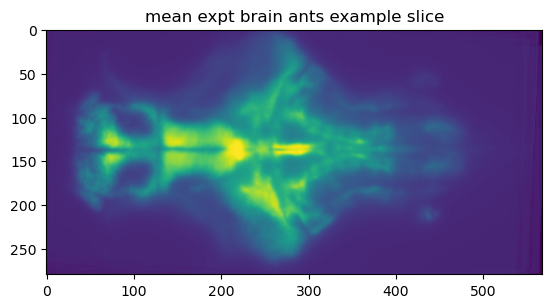

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]


=== MAP#1: CTRL | NULL=iaaft p95 | using 7/7 fish ===
fig_dir: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/CTRL

📊 CTRL | tonic_pos: 75445 points from 7 fish-contributions


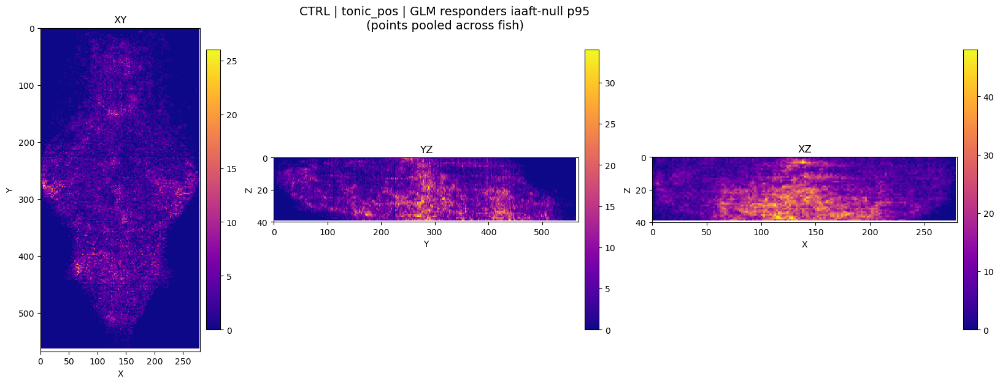

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/CTRL/avg_binary_CTRL_tonic_pos_glm_iaaft_nullp95.png
📊 CTRL | tonic_neg: 179802 points from 7 fish-contributions


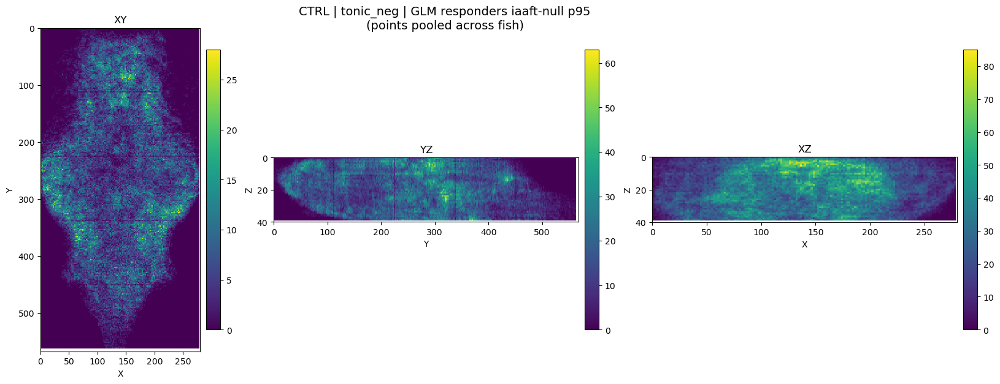

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/CTRL/avg_binary_CTRL_tonic_neg_glm_iaaft_nullp95.png


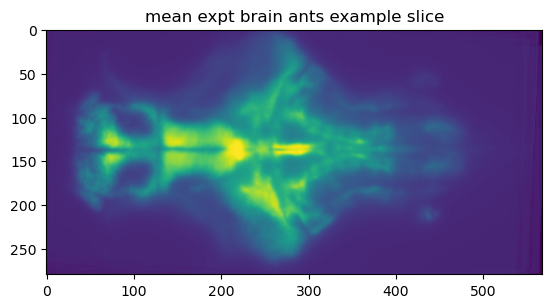

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]


=== MAP#1: HCRT-TRPV1 | NULL=iaaft p95 | using 7/7 fish ===
fig_dir: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/HCRT-TRPV1

📊 HCRT-TRPV1 | tonic_pos: 65877 points from 7 fish-contributions


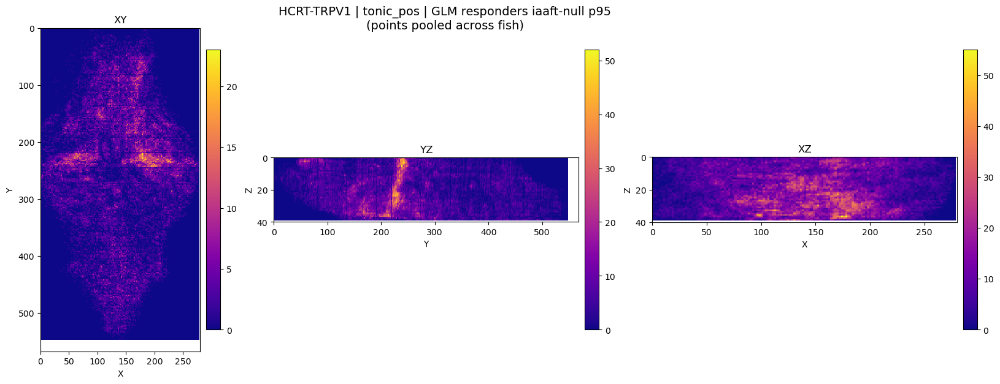

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/HCRT-TRPV1/avg_binary_HCRT-TRPV1_tonic_pos_glm_iaaft_nullp95.png
📊 HCRT-TRPV1 | tonic_neg: 302318 points from 7 fish-contributions


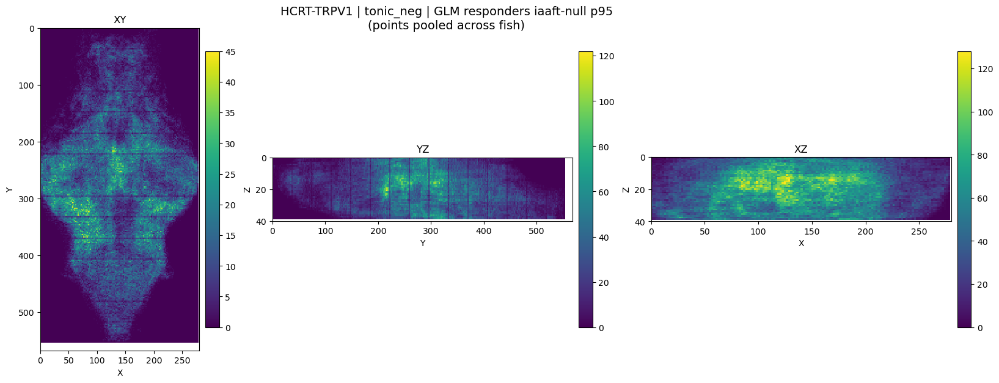

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/HCRT-TRPV1/avg_binary_HCRT-TRPV1_tonic_neg_glm_iaaft_nullp95.png


In [14]:

# =========================
# NULL TOGGLE (ONLY CHANGE THIS)
# =========================
NULL_METHOD = "iaaft"   # "none"/"shift" or "iaaft"
RESPONDER_NULL_THRESH = 95
# =========================
# Helpers
# =========================
def _normalize_null_method(m: str) -> str:
    m = str(m).lower().strip()
    if m in {"none", "shift"}:
        return "none"   # filenames use the "none" convention for shift
    if m == "iaaft":
        return "iaaft"
    raise ValueError(f"NULL_METHOD must be 'none' (shift) or 'iaaft', got {m!r}")

def _method_label(m: str) -> str:
    return "shift" if _normalize_null_method(m) == "none" else "iaaft"

def _idx_filename(label: str, P: int, null_method: str) -> str:
    """
    Deterministic responder idx filenames.
      - none/shift : tonic_{pos/neg}_glm_nullp{P}_idxs.npy
      - iaaft      : tonic_{pos/neg}_glm_iaaft_nullp{P}_idxs.npy
    label must be like: "tonic_pos", "tonic_neg"
    """
    m = _normalize_null_method(null_method)
    if m == "none":
        return f"{label}_glm_nullp{P}_idxs.npy"
    else:
        return f"{label}_glm_iaaft_nullp{P}_idxs.npy"

def _get_mean_brain_shape(combine_proj_ID):
    """Return (X, Y, Z) voxel shape of the mean brain."""
    mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)  # ants.ANTsImage
    shape = mean_img.shape  # (x, y, z)
    if len(shape) != 3:
        raise ValueError(f"Mean brain is not 3D: shape={shape}")
    return shape

def _auto_bins(brain_shape, max_bins_per_axis=400, divisor=2):
    """Choose hist2d bins per axis (cap to keep arrays reasonable)."""
    bx = min(max(brain_shape[0] // divisor, 50), max_bins_per_axis)
    by = min(max(brain_shape[1] // divisor, 50), max_bins_per_axis)
    bz = min(max(brain_shape[2] // divisor, 50), max_bins_per_axis)
    return bx, by, bz


def plot_avg_across_experiments_meanspace_glm(
    expt_ID_list,
    proj_ID,
    dir_ants_output,
    combine_proj_ID,
    thr_percentile,
    group_name="group",
    glm_labels=("tonic_pos", "tonic_neg"),
    null_method="none",            # <<< NEW
    flip_z_for_display=True,
    max_bins_per_axis=400,
):
    """
    MAP#1:
    Concatenate GLM responder centroids across fish and histogram in mean-brain voxel space.
    Generates XY / YZ / XZ projections for each label.

    Reads:
      - transformed_all_cells_meanbrain.npy
      - tonic_pos_glm_{[iaaft_]}nullp{P}_idxs.npy
      - tonic_neg_glm_{[iaaft_]}nullp{P}_idxs.npy
    """

    # ===== 0) Resolve mean-brain shape =====
    brain_shape = _get_mean_brain_shape(combine_proj_ID)  # (X,Y,Z)
    bx, by, bz = _auto_bins(brain_shape, max_bins_per_axis=max_bins_per_axis)

    P = int(thr_percentile)
    mlabel = _method_label(null_method)

    # Deterministic per-label idx filenames
    idx_files = {lab: _idx_filename(lab, P, null_method) for lab in glm_labels}

    # ===== 1) Gather coords =====
    medoid_coords_all = {label: [] for label in glm_labels}
    n_used = 0

    for expt_ID in expt_ID_list:
        dir_expt = os.path.join(dir_ants_output, proj_ID, expt_ID)
        path_all = os.path.join(dir_expt, "transformed_all_cells_meanbrain.npy")

        if not os.path.exists(path_all):
            print(f"❌ Missing transformed_all_cells_meanbrain.npy for {expt_ID}")
            continue

        all_coords = np.load(path_all)
        if all_coords.ndim != 2 or all_coords.shape[1] != 3:
            print(f"❌ Bad coords shape in {path_all}: {all_coords.shape}")
            continue

        any_added = False
        for label in glm_labels:
            idx_name = idx_files[label]

            # Search order: fish root first (your old behavior)
            idx_path = os.path.join(dir_expt, idx_name)
            if not os.path.exists(idx_path):
                # optional fallback: also check glm run dir if you sometimes save there
                run_dir = os.path.join(dir_expt, "glm", param_folder_name) if "param_folder_name" in globals() else None
                if run_dir is not None:
                    idx_path2 = os.path.join(run_dir, idx_name)
                    if os.path.exists(idx_path2):
                        idx_path = idx_path2

            if not os.path.exists(idx_path):
                print(f"⚠️ Missing {idx_name} for {expt_ID}")
                continue

            idxs = np.load(idx_path).astype(np.int64).ravel()
            if idxs.size == 0:
                continue
            if np.any((idxs < 0) | (idxs >= len(all_coords))):
                print(f"⚠️ Invalid indices in {idx_path}")
                continue

            selected_coords = all_coords[idxs]  # (N,3) float w/ NaNs possible
            medoid_coords_all[label].append(selected_coords)
            any_added = True

        if any_added:
            n_used += 1

    # ===== 2) Output dir =====
    out_tag = f"avg_across_expts_glm_{mlabel}_nullp{P}"
    fig_dir = os.path.join(dir_ants_output, proj_ID, out_tag, group_name)
    os.makedirs(fig_dir, exist_ok=True)

    print(f"\n=== MAP#1: {group_name} | NULL={mlabel} p{P} | using {n_used}/{len(expt_ID_list)} fish ===")
    print(f"fig_dir: {fig_dir}\n")

    # ===== 3) Plot per label =====
    for label, coord_list in medoid_coords_all.items():
        if not coord_list:
            print(f"⚠️ No data to plot for {group_name} / {label}")
            continue

        coords = np.vstack(coord_list)  # (N,3)
        print(f"📊 {group_name} | {label}: {coords.shape[0]} points from {len(coord_list)} fish-contributions")

        # Drop NaNs and out-of-bounds
        valid = ~np.isnan(coords).any(axis=1)
        coords = coords[valid]

        in_bounds = (
            (coords[:, 0] >= 0) & (coords[:, 0] < brain_shape[0]) &
            (coords[:, 1] >= 0) & (coords[:, 1] < brain_shape[1]) &
            (coords[:, 2] >= 0) & (coords[:, 2] < brain_shape[2])
        )
        coords = coords[in_bounds]

        if coords.shape[0] == 0:
            print(f"⚠️ No valid coordinates to plot for {group_name} / {label}")
            continue

        cmap = "plasma" if "pos" in label else "viridis"

        fig, axs = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

        # ---- XY ----
        im0 = axs[0].hist2d(
            coords[:, 0], coords[:, 1],
            bins=[min(bx, brain_shape[0]), min(by, brain_shape[1])],
            cmap=cmap
        )
        axs[0].set_xlim(0, brain_shape[0])
        axs[0].set_ylim(0, brain_shape[1])
        axs[0].set_aspect('equal', adjustable='box')
        axs[0].set_title("XY")
        axs[0].set_xlabel("X")
        axs[0].set_ylabel("Y")
        axs[0].invert_yaxis()
        fig.colorbar(im0[3], ax=axs[0], fraction=0.046, pad=0.02)

        # ---- YZ ----
        im1 = axs[1].hist2d(
            coords[:, 1], coords[:, 2],
            bins=[min(by, brain_shape[1]), min(bz, brain_shape[2])],
            cmap=cmap
        )
        axs[1].set_xlim(0, brain_shape[1])
        axs[1].set_ylim(0, brain_shape[2])
        if flip_z_for_display:
            axs[1].invert_yaxis()
        yz_stretch = 3.0
        axs[1].set_box_aspect((brain_shape[2] / brain_shape[1]) * yz_stretch)
        axs[1].set_title("YZ")
        axs[1].set_xlabel("Y")
        axs[1].set_ylabel("Z")
        fig.colorbar(im1[3], ax=axs[1], fraction=0.046, pad=0.02)

        # ---- XZ ----
        im2 = axs[2].hist2d(
            coords[:, 0], coords[:, 2],
            bins=[min(bx, brain_shape[0]), min(bz, brain_shape[2])],
            cmap=cmap
        )
        axs[2].set_xlim(0, brain_shape[0])
        axs[2].set_ylim(0, brain_shape[2])
        if flip_z_for_display:
            axs[2].invert_yaxis()
        xz_stretch = 1.5
        axs[2].set_box_aspect((brain_shape[2] / brain_shape[0]) * xz_stretch)
        axs[2].set_title("XZ")
        axs[2].set_xlabel("X")
        axs[2].set_ylabel("Z")
        fig.colorbar(im2[3], ax=axs[2], fraction=0.046, pad=0.02)

        fig.suptitle(
            f"{group_name} | {label} | GLM responders {mlabel}-null p{P}\n(points pooled across fish)",
            fontsize=14,
            y=1.02
        )

        save_path = os.path.join(fig_dir, f"avg_binary_{group_name}_{label}_glm_{mlabel}_nullp{P}.png")
        plt.savefig(save_path, dpi=200, bbox_inches="tight")
        plt.show()
        print(f"✅ Saved: {save_path}")


# ============================ EXECUTION ============================
if __name__ == "__main__":

    # split expt_ID_list by genotype using your helper
    ctrl_ids, hcrt_ids = [], []
    for expt_ID in expt_ID_list:
        group, _ = get_group_meta(expt_ID)   # <-- your existing function
        if group == CTRL_TAG:
            ctrl_ids.append(expt_ID)
        elif group == EXPT_TAG:
            hcrt_ids.append(expt_ID)

    print(f"{CTRL_TAG} fish: {len(ctrl_ids)} | {EXPT_TAG} fish: {len(hcrt_ids)}")

    P = int(RESPONDER_NULL_THRESH)
    NULL_LABEL = _method_label(NULL_METHOD)

    plot_avg_across_experiments_meanspace_glm(
        expt_ID_list=ctrl_ids,
        proj_ID=proj_ID,
        dir_ants_output=dir_ants_output,
        combine_proj_ID=combine_proj_ID,
        thr_percentile=P,
        group_name=CTRL_TAG,
        glm_labels=("tonic_pos", "tonic_neg"),
        null_method=NULL_METHOD,              # <<< NEW
        flip_z_for_display=True,
        max_bins_per_axis=400,
    )

    plot_avg_across_experiments_meanspace_glm(
        expt_ID_list=hcrt_ids,
        proj_ID=proj_ID,
        dir_ants_output=dir_ants_output,
        combine_proj_ID=combine_proj_ID,
        thr_percentile=P,
        group_name=EXPT_TAG,
        glm_labels=("tonic_pos", "tonic_neg"),
        null_method=NULL_METHOD,              # <<< NEW
        flip_z_for_display=True,
        max_bins_per_axis=400,
    )


### 【MAP: Tonic-GLM】 N-fish presence intensity map on a coarse grid

CTRL fish: 7 | HCRT-TRPV1 fish: 7


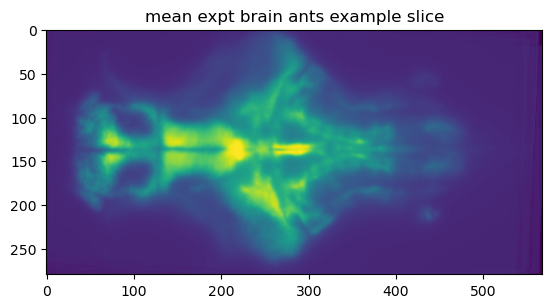

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]



Presence map (CTRL): 100%|██████████| 7/7 [00:00<00:00, 121.15it/s]


=== MAP#2a: CTRL | using 7/7 fish ===
brain_shape=(280, 568, 40) | coarse_shape=(70, 142, 40) | ds=(4, 4, 1)
fig_dir: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/CTRL/presence_coarse_ds(4, 4, 1)



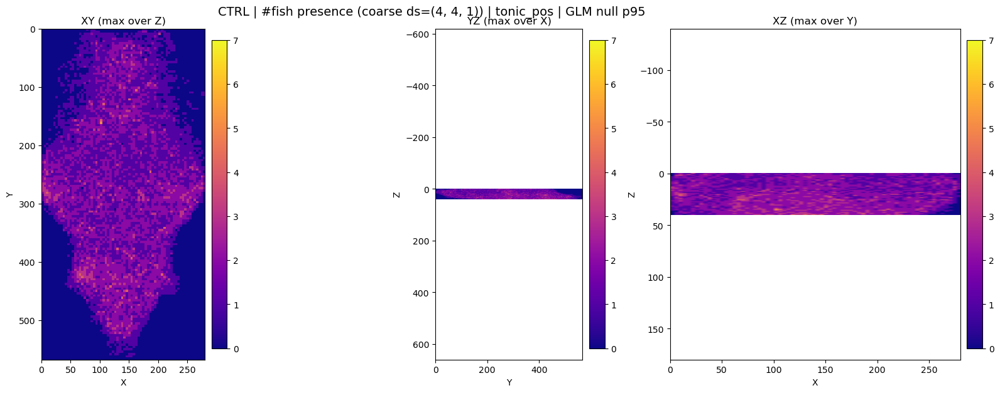

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/CTRL/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_CTRL_tonic_pos_glm_nullp95_ds(4, 4, 1).png
💾 Saved volume: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/CTRL/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_CTRL_tonic_pos_glm_nullp95_ds(4, 4, 1).npy


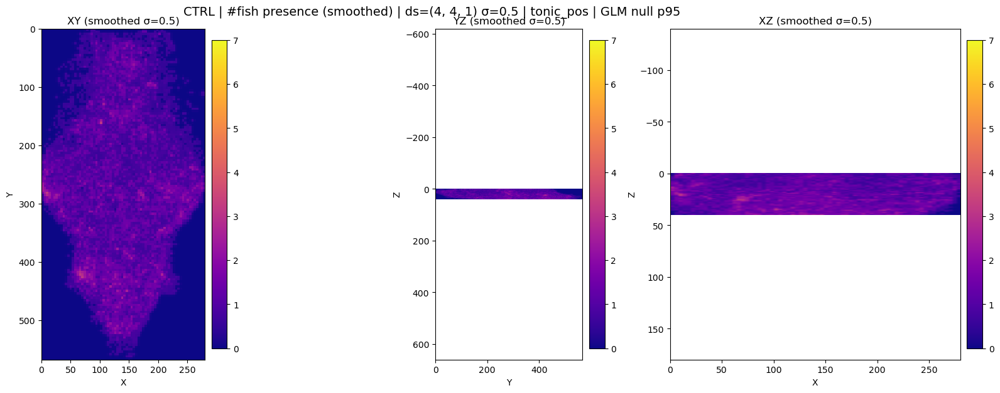

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/CTRL/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_smooth_CTRL_tonic_pos_glm_nullp95_ds(4, 4, 1)_sig0.5.png
💾 Saved smoothed volume: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/CTRL/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_smooth_CTRL_tonic_pos_glm_nullp95_ds(4, 4, 1)_sig0.5.npy


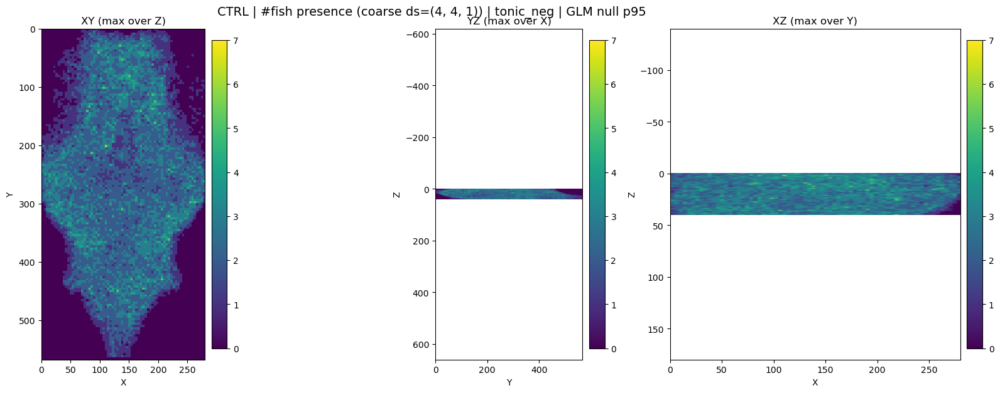

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/CTRL/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_CTRL_tonic_neg_glm_nullp95_ds(4, 4, 1).png
💾 Saved volume: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/CTRL/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_CTRL_tonic_neg_glm_nullp95_ds(4, 4, 1).npy


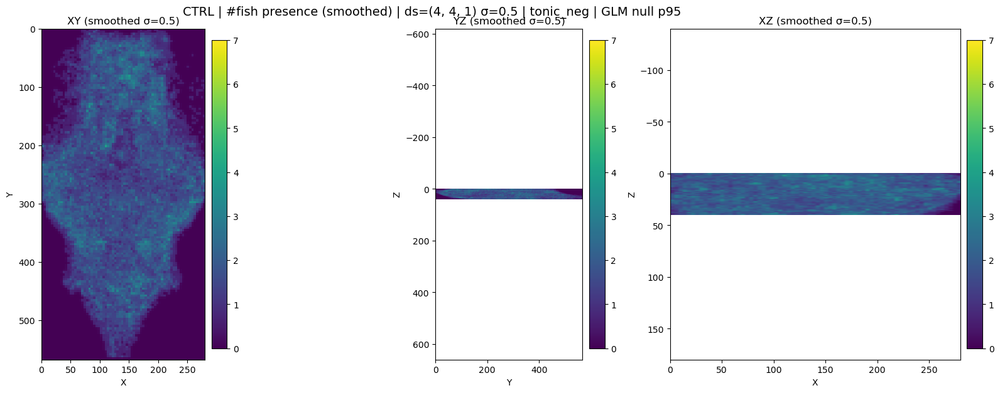

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/CTRL/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_smooth_CTRL_tonic_neg_glm_nullp95_ds(4, 4, 1)_sig0.5.png
💾 Saved smoothed volume: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/CTRL/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_smooth_CTRL_tonic_neg_glm_nullp95_ds(4, 4, 1)_sig0.5.npy


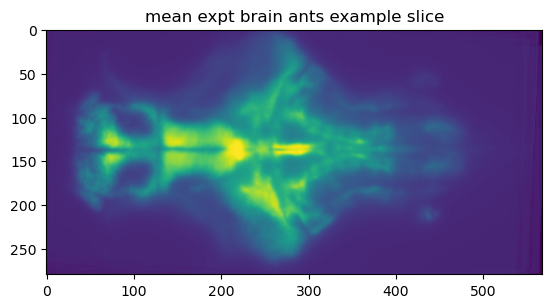

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]



Presence map (HCRT-TRPV1): 100%|██████████| 7/7 [00:00<00:00, 102.32it/s]


=== MAP#2a: HCRT-TRPV1 | using 7/7 fish ===
brain_shape=(280, 568, 40) | coarse_shape=(70, 142, 40) | ds=(4, 4, 1)
fig_dir: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/HCRT-TRPV1/presence_coarse_ds(4, 4, 1)



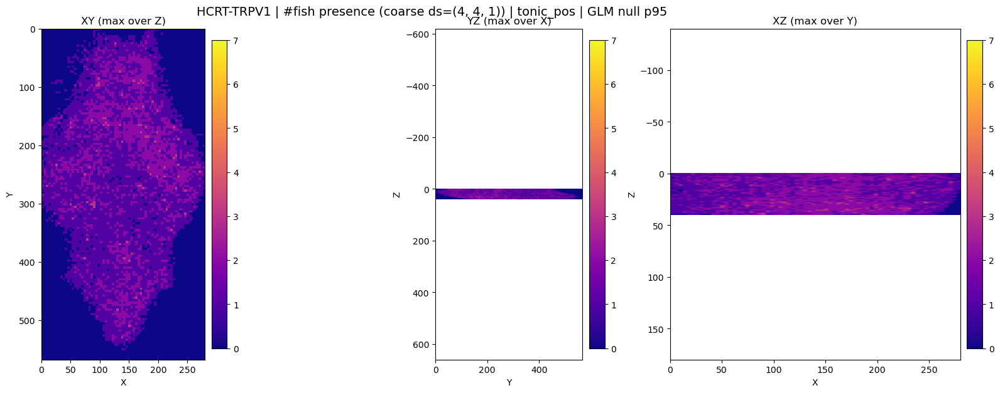

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/HCRT-TRPV1/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_HCRT-TRPV1_tonic_pos_glm_nullp95_ds(4, 4, 1).png
💾 Saved volume: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/HCRT-TRPV1/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_HCRT-TRPV1_tonic_pos_glm_nullp95_ds(4, 4, 1).npy


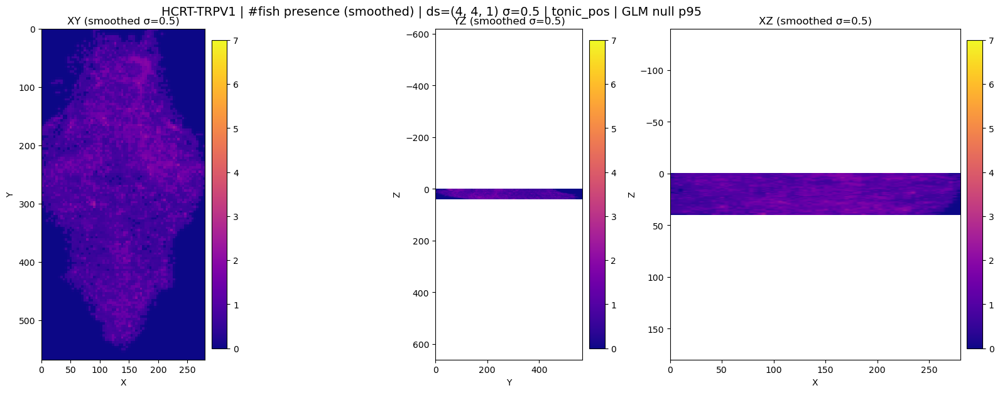

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/HCRT-TRPV1/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_smooth_HCRT-TRPV1_tonic_pos_glm_nullp95_ds(4, 4, 1)_sig0.5.png
💾 Saved smoothed volume: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/HCRT-TRPV1/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_smooth_HCRT-TRPV1_tonic_pos_glm_nullp95_ds(4, 4, 1)_sig0.5.npy


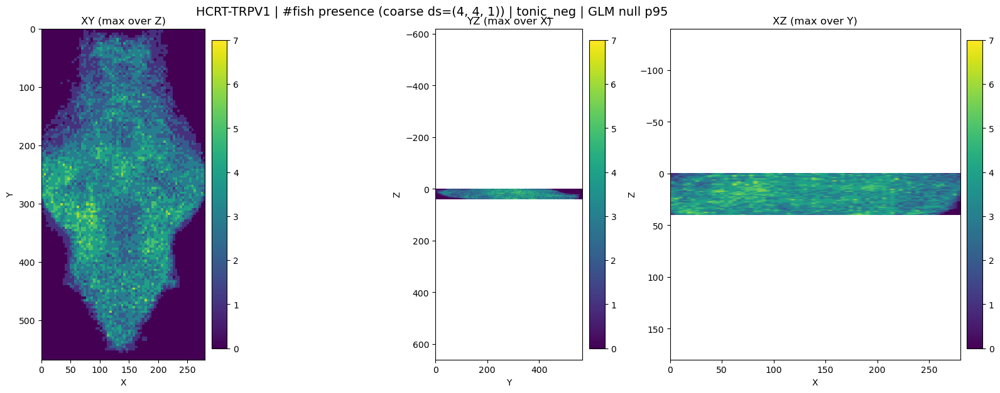

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/HCRT-TRPV1/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_HCRT-TRPV1_tonic_neg_glm_nullp95_ds(4, 4, 1).png
💾 Saved volume: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/HCRT-TRPV1/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_HCRT-TRPV1_tonic_neg_glm_nullp95_ds(4, 4, 1).npy


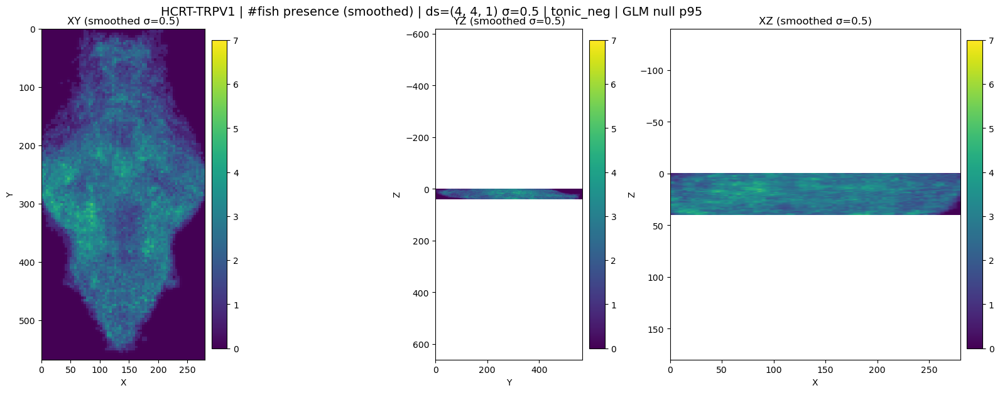

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/HCRT-TRPV1/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_smooth_HCRT-TRPV1_tonic_neg_glm_nullp95_ds(4, 4, 1)_sig0.5.png
💾 Saved smoothed volume: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_nullp95/HCRT-TRPV1/presence_coarse_ds(4, 4, 1)/n_fish_presence_coarse_smooth_HCRT-TRPV1_tonic_neg_glm_nullp95_ds(4, 4, 1)_sig0.5.npy


In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.ndimage import gaussian_filter

import library_registration  # must provide: load_mean_expt_brain(combine_proj_ID)


def _get_mean_brain_shape(combine_proj_ID):
    """Return (X,Y,Z) voxel shape of the mean brain template."""
    mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)  # ants.ANTsImage
    shp = mean_img.shape
    if len(shp) != 3:
        raise ValueError(f"Mean brain is not 3D: shape={shp}")
    return shp  # (X,Y,Z)


def plot_fish_presence_map_coarse_glm(
    expt_ID_list,
    proj_ID,
    dir_ants_output,
    combine_proj_ID,
    thr_percentile,
    group_name="group",
    glm_labels=("tonic_pos", "tonic_neg"),
    ds=(8, 8, 4),             # downsample factors in MEAN-BRAIN voxels
    sigma_coarse=0.0,         # Gaussian sigma in *coarse* voxels; 0 disables smoothing
    yz_stretch=3.0,           # visual stretch for YZ panel (make Z taller)
    xz_stretch=1.5,           # visual stretch for XZ panel
    flip_z_for_display=True,  # invert Z axis to match your convention
):
    """
    MAP#2a (GLM):
    N-fish presence maps on a coarse grid in MEAN-BRAIN space.
    For each fish:
        take GLM-responder cell centroids
        coarse-bin them
        mark presence (0/1) per coarse bin
    Sum presence across fish => voxel value = #fish with at least 1 responder in that bin.

    Reads per fish:
      - transformed_all_cells_meanbrain.npy
      - tonic_pos_glm_nullp{P}_idxs.npy
      - tonic_neg_glm_nullp{P}_idxs.npy
    """

    P = int(thr_percentile)

    # map label -> idx filename
    idx_files = {
        "tonic_pos": f"tonic_pos_glm_{NULL_METHOD}_nullp{P}_idxs.npy",
        "tonic_neg": f"tonic_neg_glm_{NULL_METHOD}_nullp{P}_idxs.npy",
        # extend later if you add phasic GLM indices:
        # "phasic_pos": f"phasic_pos_glm_nullp{P}_idxs.npy",
        # "phasic_neg": f"phasic_neg_glm_nullp{P}_idxs.npy",
    }

    # == 0) Resolve brain shape ==
    brain_shape = np.array(_get_mean_brain_shape(combine_proj_ID), dtype=int)  # (X,Y,Z)
    X, Y, Z = brain_shape

    ds = np.array(ds, dtype=int)
    if np.any(ds < 1):
        raise ValueError("Downsample factors ds must be >= 1")

    # == 1) Coarse grid ==
    coarse_shape = tuple(((brain_shape + ds - 1) // ds).astype(int))  # ceil-div
    Xc, Yc, Zc = coarse_shape
    count_volume = {label: np.zeros(coarse_shape, dtype=np.int32) for label in glm_labels}

    # == 2) Fill counts ==
    n_used = 0
    for expt_ID in tqdm(expt_ID_list, desc=f"Presence map ({group_name})"):
        dir_expt = os.path.join(dir_ants_output, proj_ID, expt_ID)
        path_all = os.path.join(dir_expt, "transformed_all_cells_meanbrain.npy")
        if not os.path.exists(path_all):
            print(f"❌ Missing transformed_all_cells_meanbrain.npy for {expt_ID}")
            continue

        all_coords = np.load(path_all)  # (n_cells, 3) mean-brain voxel coords (float ok)
        if all_coords.ndim != 2 or all_coords.shape[1] != 3:
            print(f"❌ Bad coords shape in {path_all}: {all_coords.shape}")
            continue

        any_added = False

        for label in glm_labels:
            if label not in idx_files:
                raise ValueError(f"Unknown label {label}. Known: {list(idx_files.keys())}")

            idx_path = os.path.join(dir_expt, idx_files[label])
            if not os.path.exists(idx_path):
                print(f"⚠️ Missing {idx_files[label]} for {expt_ID}")
                continue

            idxs = np.load(idx_path).astype(np.int64).ravel()
            if idxs.size == 0:
                continue
            if np.any((idxs < 0) | (idxs >= len(all_coords))):
                print(f"⚠️ Invalid indices in {idx_path}")
                continue

            coords = all_coords[idxs]  # (N,3)
            valid = ~np.isnan(coords).any(axis=1)
            coords = coords[valid]
            if coords.size == 0:
                continue

            # bounds check in mean-brain grid
            in_bounds = (
                (coords[:, 0] >= 0) & (coords[:, 0] < X) &
                (coords[:, 1] >= 0) & (coords[:, 1] < Y) &
                (coords[:, 2] >= 0) & (coords[:, 2] < Z)
            )
            coords = coords[in_bounds]
            if coords.size == 0:
                continue

            # coarse bin indices
            cidx = np.floor(coords / ds).astype(int)
            cidx = np.minimum(cidx, np.array(coarse_shape) - 1)  # clamp

            # presence once per coarse bin per fish
            fish_presence = np.zeros(coarse_shape, dtype=bool)
            fish_presence[cidx[:, 0], cidx[:, 1], cidx[:, 2]] = True

            count_volume[label] += fish_presence.astype(np.int32)
            any_added = True

        if any_added:
            n_used += 1

    # == 3) Output dir ==
    fig_dir = os.path.join(
        dir_ants_output,
        proj_ID,
        f"avg_across_expts_glm_nullp{P}",
        group_name,
        f"presence_coarse_ds{tuple(ds)}"
    )
    os.makedirs(fig_dir, exist_ok=True)

    vmax_abs = max(len(expt_ID_list), 1)

    print(f"\n=== MAP#2a: {group_name} | using {n_used}/{len(expt_ID_list)} fish ===")
    print(f"brain_shape={tuple(brain_shape)} | coarse_shape={coarse_shape} | ds={tuple(ds)}")
    print(f"fig_dir: {fig_dir}\n")

    # == 4) Plot/save per label ==
    for label in glm_labels:
        data = count_volume[label]  # (Xc,Yc,Zc)
        cmap = "plasma" if "pos" in label else "viridis"

        # projections
        xy = np.max(data, axis=2)  # (Xc,Yc)
        yz = np.max(data, axis=0)  # (Yc,Zc)
        xz = np.max(data, axis=1)  # (Xc,Zc)

        fig, axs = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

        # XY
        im0 = axs[0].imshow(
            xy.T, cmap=cmap, origin="upper", vmin=0, vmax=vmax_abs,
            extent=[0, X, Y, 0]
        )
        axs[0].set_title("XY (max over Z)")
        axs[0].set_xlabel("X"); axs[0].set_ylabel("Y")
        axs[0].set_box_aspect(Yc / Xc)
        fig.colorbar(im0, ax=axs[0], fraction=0.046, pad=0.02)

        # YZ
        im1 = axs[1].imshow(
            yz.T, cmap=cmap, origin="lower", vmin=0, vmax=vmax_abs,
            extent=[0, Y, 0, Z]
        )
        if flip_z_for_display:
            axs[1].invert_yaxis()
        axs[1].set_title("YZ (max over X)")
        axs[1].set_xlabel("Y"); axs[1].set_ylabel("Z")
        axs[1].set_box_aspect((Zc / Yc) * yz_stretch)
        fig.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.02)

        # XZ
        im2 = axs[2].imshow(
            xz.T, cmap=cmap, origin="lower", vmin=0, vmax=vmax_abs,
            extent=[0, X, 0, Z]
        )
        if flip_z_for_display:
            axs[2].invert_yaxis()
        axs[2].set_title("XZ (max over Y)")
        axs[2].set_xlabel("X"); axs[2].set_ylabel("Z")
        axs[2].set_box_aspect((Zc / Xc) * xz_stretch)
        fig.colorbar(im2, ax=axs[2], fraction=0.046, pad=0.02)

        fig.suptitle(
            f"{group_name} | #fish presence (coarse ds={tuple(ds)}) | {label} | GLM null p{P}",
            fontsize=14,
            y=1.02
        )

        out_png = os.path.join(fig_dir, f"n_fish_presence_coarse_{group_name}_{label}_glm_nullp{P}_ds{tuple(ds)}.png")
        plt.savefig(out_png, dpi=200, bbox_inches="tight")
        plt.show()
        print(f"✅ Saved: {out_png}")

        out_npy = os.path.join(fig_dir, f"n_fish_presence_coarse_{group_name}_{label}_glm_nullp{P}_ds{tuple(ds)}.npy")
        np.save(out_npy, data.astype(np.int16))
        print(f"💾 Saved volume: {out_npy}")

        # --- Optional smoothing ---
        if sigma_coarse and sigma_coarse > 0:
            smooth = gaussian_filter(data.astype(np.float32), sigma=float(sigma_coarse), mode="nearest")

            xy_s = np.max(smooth, axis=2)
            yz_s = np.max(smooth, axis=0)
            xz_s = np.max(smooth, axis=1)

            fig_s, axs_s = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

            im0s = axs_s[0].imshow(xy_s.T, cmap=cmap, origin="upper", vmin=0, vmax=vmax_abs, extent=[0, X, Y, 0])
            axs_s[0].set_title(f"XY (smoothed σ={sigma_coarse})")
            axs_s[0].set_xlabel("X"); axs_s[0].set_ylabel("Y")
            axs_s[0].set_box_aspect(Yc / Xc)
            fig_s.colorbar(im0s, ax=axs_s[0], fraction=0.046, pad=0.02)

            im1s = axs_s[1].imshow(yz_s.T, cmap=cmap, origin="lower", vmin=0, vmax=vmax_abs, extent=[0, Y, 0, Z])
            if flip_z_for_display:
                axs_s[1].invert_yaxis()
            axs_s[1].set_title(f"YZ (smoothed σ={sigma_coarse})")
            axs_s[1].set_xlabel("Y"); axs_s[1].set_ylabel("Z")
            axs_s[1].set_box_aspect((Zc / Yc) * yz_stretch)
            fig_s.colorbar(im1s, ax=axs_s[1], fraction=0.046, pad=0.02)

            im2s = axs_s[2].imshow(xz_s.T, cmap=cmap, origin="lower", vmin=0, vmax=vmax_abs, extent=[0, X, 0, Z])
            if flip_z_for_display:
                axs_s[2].invert_yaxis()
            axs_s[2].set_title(f"XZ (smoothed σ={sigma_coarse})")
            axs_s[2].set_xlabel("X"); axs_s[2].set_ylabel("Z")
            axs_s[2].set_box_aspect((Zc / Xc) * xz_stretch)
            fig_s.colorbar(im2s, ax=axs_s[2], fraction=0.046, pad=0.02)

            fig_s.suptitle(
                f"{group_name} | #fish presence (smoothed) | ds={tuple(ds)} σ={sigma_coarse} | {label} | GLM null p{P}",
                fontsize=14,
                y=1.02
            )

            out_png_s = os.path.join(fig_dir, f"n_fish_presence_coarse_smooth_{group_name}_{label}_glm_nullp{P}_ds{tuple(ds)}_sig{sigma_coarse}.png")
            plt.savefig(out_png_s, dpi=200, bbox_inches="tight")
            plt.show()
            print(f"✅ Saved: {out_png_s}")

            out_npy_s = os.path.join(fig_dir, f"n_fish_presence_coarse_smooth_{group_name}_{label}_glm_nullp{P}_ds{tuple(ds)}_sig{sigma_coarse}.npy")
            np.save(out_npy_s, smooth.astype(np.float32))
            print(f"💾 Saved smoothed volume: {out_npy_s}")


# ---- Run (split ctrl vs expt) ----
P = int(RESPONDER_NULL_THRESH)

ctrl_ids, hcrt_ids = [], []
for expt_ID in expt_ID_list:
    group, _ = get_group_meta(expt_ID)
    if group == CTRL_TAG:
        ctrl_ids.append(expt_ID)
    elif group == EXPT_TAG:
        hcrt_ids.append(expt_ID)

print(f"{CTRL_TAG} fish: {len(ctrl_ids)} | {EXPT_TAG} fish: {len(hcrt_ids)}")

plot_fish_presence_map_coarse_glm(
    expt_ID_list=ctrl_ids,
    proj_ID=proj_ID,
    dir_ants_output=dir_ants_output,
    combine_proj_ID=combine_proj_ID,
    thr_percentile=P,
    group_name=CTRL_TAG,
    glm_labels=("tonic_pos", "tonic_neg"),
    ds=(4, 4, 1),
    sigma_coarse=0.5,
    yz_stretch=8.0,
    xz_stretch=2.0,
    flip_z_for_display=True,
)

plot_fish_presence_map_coarse_glm(
    expt_ID_list=hcrt_ids,
    proj_ID=proj_ID,
    dir_ants_output=dir_ants_output,
    combine_proj_ID=combine_proj_ID,
    thr_percentile=P,
    group_name=EXPT_TAG,
    glm_labels=("tonic_pos", "tonic_neg"),
    ds=(4, 4, 1),
    sigma_coarse=0.5,
    yz_stretch=8.0,
    xz_stretch=2.0,
    flip_z_for_display=True,
)


### 【MAP: Tonic-GLM】N-fish "radius" presence intensity map on a coarse grid

CTRL fish: 7 | HCRT-TRPV1 fish: 7
Using responder idx NULL_METHOD=iaaft @ p95


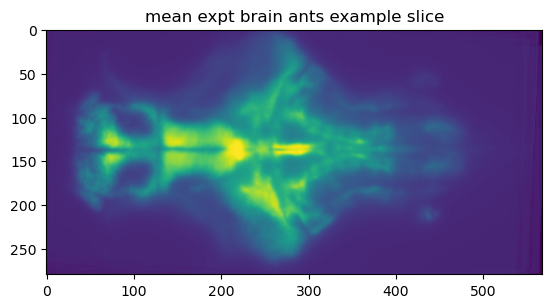

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]



Processing CTRL fish (iaaft): 100%|██████████| 7/7 [00:00<00:00, 58.44it/s]


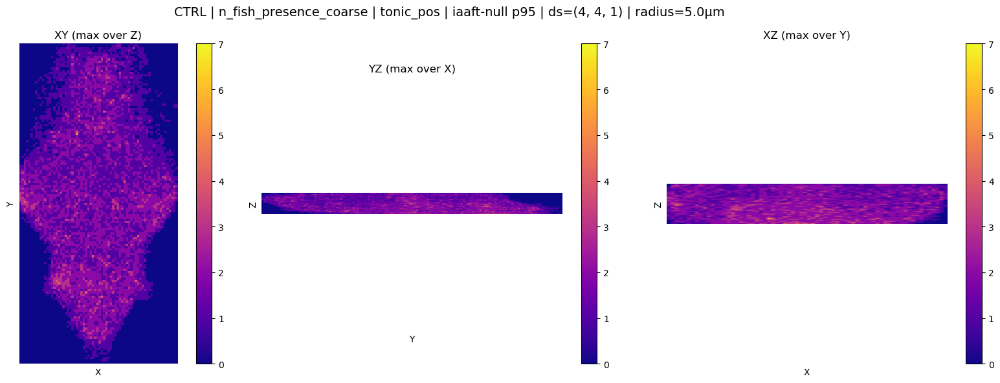

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/CTRL/n_fish_presence_coarse_tonic_pos_glm_iaaft_nullp95_ds(4, 4, 1)_rad5.png
💾 NPY: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/CTRL/n_fish_presence_coarse_tonic_pos_glm_iaaft_nullp95_ds(4, 4, 1)_rad5.npy


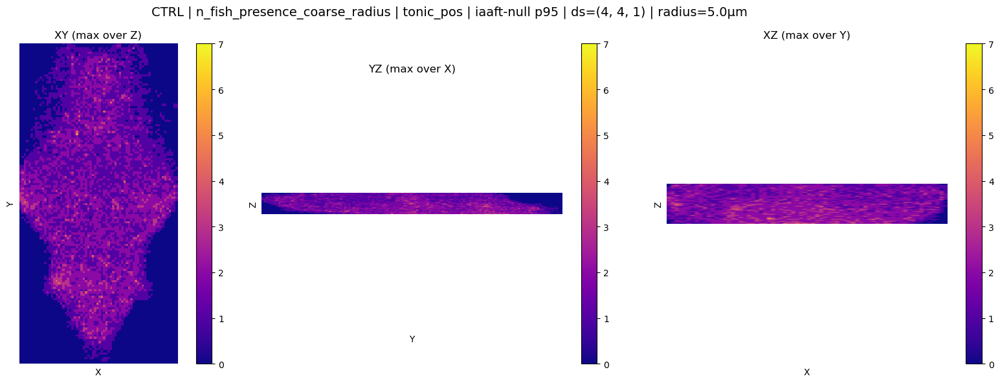

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/CTRL/n_fish_presence_coarse_radius_tonic_pos_glm_iaaft_nullp95_ds(4, 4, 1)_rad5.png
💾 NPY: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/CTRL/n_fish_presence_coarse_radius_tonic_pos_glm_iaaft_nullp95_ds(4, 4, 1)_rad5.npy


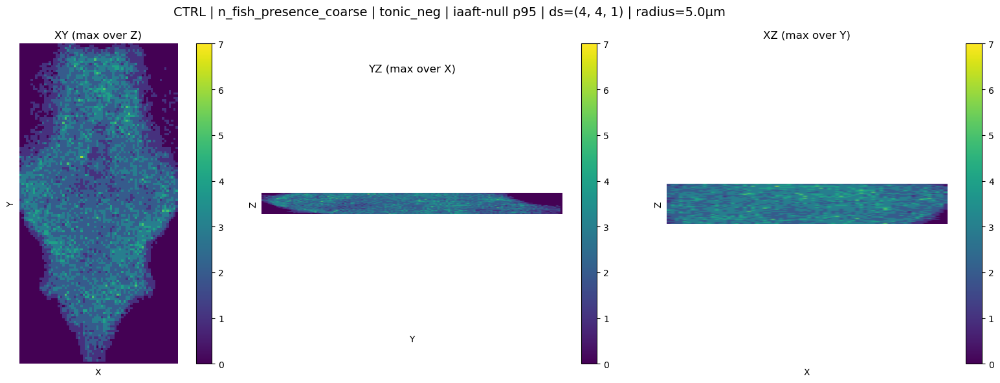

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/CTRL/n_fish_presence_coarse_tonic_neg_glm_iaaft_nullp95_ds(4, 4, 1)_rad5.png
💾 NPY: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/CTRL/n_fish_presence_coarse_tonic_neg_glm_iaaft_nullp95_ds(4, 4, 1)_rad5.npy


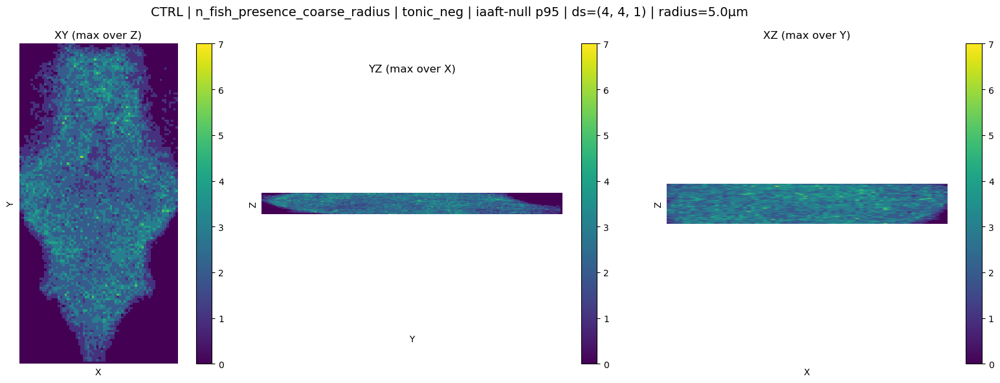

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/CTRL/n_fish_presence_coarse_radius_tonic_neg_glm_iaaft_nullp95_ds(4, 4, 1)_rad5.png
💾 NPY: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/CTRL/n_fish_presence_coarse_radius_tonic_neg_glm_iaaft_nullp95_ds(4, 4, 1)_rad5.npy


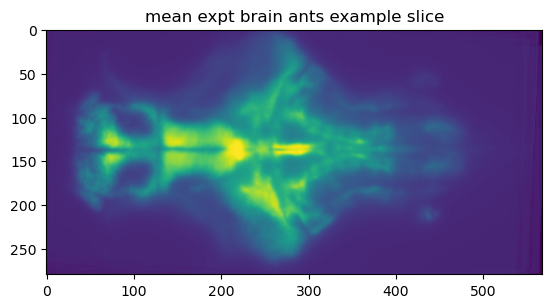

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]



Processing HCRT-TRPV1 fish (iaaft): 100%|██████████| 7/7 [00:00<00:00, 53.36it/s]


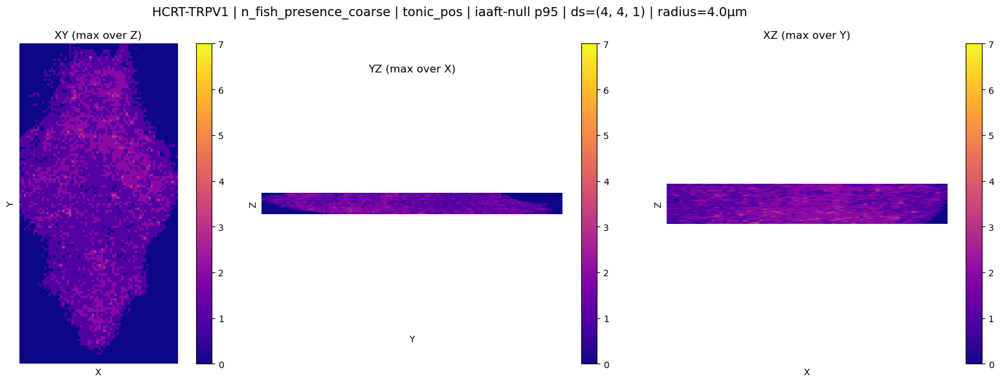

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/HCRT-TRPV1/n_fish_presence_coarse_tonic_pos_glm_iaaft_nullp95_ds(4, 4, 1)_rad4.png
💾 NPY: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/HCRT-TRPV1/n_fish_presence_coarse_tonic_pos_glm_iaaft_nullp95_ds(4, 4, 1)_rad4.npy


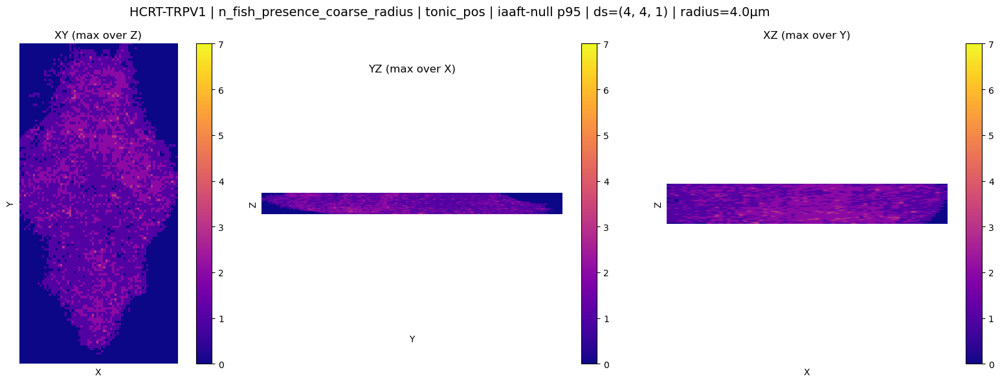

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/HCRT-TRPV1/n_fish_presence_coarse_radius_tonic_pos_glm_iaaft_nullp95_ds(4, 4, 1)_rad4.png
💾 NPY: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/HCRT-TRPV1/n_fish_presence_coarse_radius_tonic_pos_glm_iaaft_nullp95_ds(4, 4, 1)_rad4.npy


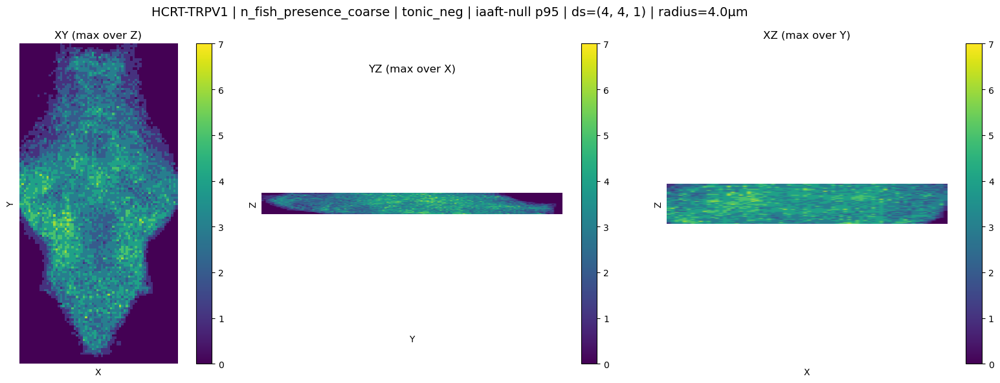

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/HCRT-TRPV1/n_fish_presence_coarse_tonic_neg_glm_iaaft_nullp95_ds(4, 4, 1)_rad4.png
💾 NPY: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/HCRT-TRPV1/n_fish_presence_coarse_tonic_neg_glm_iaaft_nullp95_ds(4, 4, 1)_rad4.npy


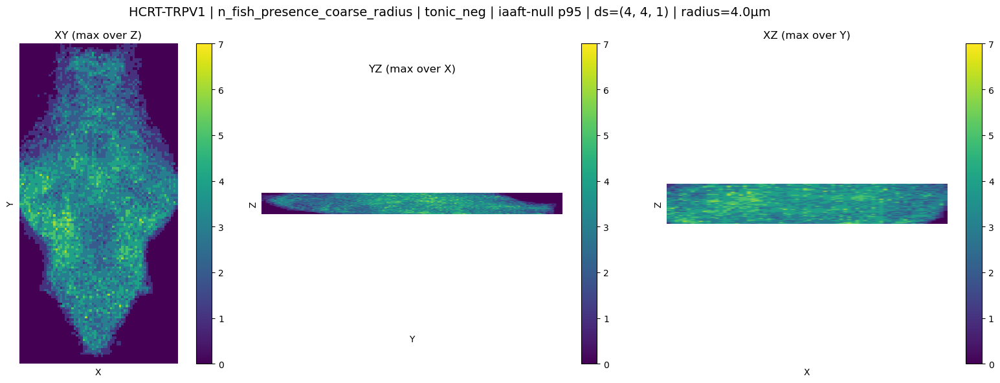

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/HCRT-TRPV1/n_fish_presence_coarse_radius_tonic_neg_glm_iaaft_nullp95_ds(4, 4, 1)_rad4.png
💾 NPY: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/avg_across_expts_glm_iaaft_nullp95/HCRT-TRPV1/n_fish_presence_coarse_radius_tonic_neg_glm_iaaft_nullp95_ds(4, 4, 1)_rad4.npy


In [16]:
# MAP#3: N-fish presence (raw + radius dilation) on coarse grid
# - Separate CTRL vs HCRT groups
# - Toggle responder idx null type: shift vs iaaft
# - Mean-brain geometry (shape + spacing) from combine_proj_ID
# ------------------------------------------------------------

import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.ndimage import binary_dilation

import ants
import library_registration  # must provide: load_mean_expt_brain(combine_proj_ID)


# =========================
# NULL TOGGLE (ONLY CHANGE THIS)
# =========================
NULL_METHOD = "iaaft"   # "none"/"shift" or "iaaft"
RESPONDER_NULL_THRESH = 95


# =========================
# Helpers
# =========================
def _normalize_null_method(m: str) -> str:
    m = str(m).lower().strip()
    if m in {"none", "shift"}:
        return "none"   # filenames use the "none" convention for shift
    if m == "iaaft":
        return "iaaft"
    raise ValueError(f"NULL_METHOD must be 'none' (shift) or 'iaaft', got {m!r}")

def _method_label(m: str) -> str:
    return "shift" if _normalize_null_method(m) == "none" else "iaaft"

def _idx_filename(label: str, P: int, null_method: str) -> str:
    """
    Deterministic responder idx filenames.
      - none/shift : tonic_{pos/neg}_glm_nullp{P}_idxs.npy
      - iaaft      : tonic_{pos/neg}_glm_iaaft_nullp{P}_idxs.npy
    label must be like: "tonic_pos", "tonic_neg"
    """
    m = _normalize_null_method(null_method)
    if m == "none":
        return f"{label}_glm_nullp{P}_idxs.npy"
    else:
        return f"{label}_glm_iaaft_nullp{P}_idxs.npy"

def _mean_shape_and_spacing(combine_proj_ID):
    """Return (shape_xyz, spacing_xyz_um) for the mean brain."""
    mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)  # ants.ANTsImage
    shp = tuple(map(int, mean_img.shape))          # (X, Y, Z)
    spc = tuple(map(float, mean_img.spacing))      # physical units from header (assumed µm)
    if len(shp) != 3:
        raise ValueError(f"Mean brain is not 3D: shape={shp}")
    return shp, spc

def _ellipsoid_struct(radius_um, coarse_spacing_um):
    """Ellipsoidal footprint with physical radius_um on the coarse grid."""
    rx = int(np.ceil(radius_um / coarse_spacing_um[0]))
    ry = int(np.ceil(radius_um / coarse_spacing_um[1]))
    rz = int(np.ceil(radius_um / coarse_spacing_um[2]))
    xs = np.arange(-rx, rx + 1)
    ys = np.arange(-ry, ry + 1)
    zs = np.arange(-rz, rz + 1)
    X, Y, Z = np.meshgrid(xs, ys, zs, indexing="ij")
    d2 = (X * coarse_spacing_um[0])**2 + (Y * coarse_spacing_um[1])**2 + (Z * coarse_spacing_um[2])**2
    return d2 <= (radius_um ** 2)


def plot_fish_presence_map_coarse_glm_radius(
    expt_ID_list,
    proj_ID,
    dir_ants_output,
    combine_proj_ID,
    thr_percentile,
    glm_labels=("tonic_pos", "tonic_neg"),
    null_method="none",            # <<< NEW
    ds=(2, 2, 2),
    radius_um=12.0,
    yz_stretch=6.0,
    xz_stretch=6.0,
    flip_z_for_display=True,
    group_name="GROUP",
    out_subdir=None,
):
    """
    MAP#3:
    Coarse-grid N-fish presence map in mean-brain space.
    For each fish:
      - load transformed_all_cells_meanbrain.npy
      - load GLM responder indices (pos/neg) for null percentile P + null_method
      - mark coarse bins as present
      - optionally radius-dilate (physical um) on coarse grid
    Then sum across fish => count maps.

    Saves PNG + NPY for each label, both raw and radius-dilated.
    """

    # ---- mean-brain geometry ----
    brain_shape, spacing_um = _mean_shape_and_spacing(combine_proj_ID)  # (X,Y,Z), (sx,sy,sz)
    brain_shape = np.array(brain_shape, dtype=int)
    spacing_um  = np.array(spacing_um, dtype=float)

    P = int(thr_percentile)
    mlabel = _method_label(null_method)

    # ---- GLM idx file mapping (DETERMINISTIC) ----
    idx_files = {lab: _idx_filename(lab, P, null_method) for lab in glm_labels}

    # ---- coarse grid ----
    ds = np.array(ds, dtype=int)
    if not np.all(ds >= 1):
        raise ValueError("Downsample factors ds must be >= 1")
    coarse_shape = tuple(((brain_shape + ds - 1) // ds).astype(int))   # ceil-div
    coarse_spacing_um = tuple(spacing_um * ds)                         # physical size of coarse voxels

    # ---- dilation footprint ----
    footprint = _ellipsoid_struct(radius_um, coarse_spacing_um) if (radius_um and radius_um > 0) else None

    # ---- accumulators ----
    count_raw    = {label: np.zeros(coarse_shape, dtype=np.int32) for label in glm_labels}
    count_radius = {label: np.zeros(coarse_shape, dtype=np.int32) for label in glm_labels}

    # ---- iterate fish ----
    for expt_ID in tqdm(expt_ID_list, desc=f"Processing {group_name} fish ({mlabel})"):
        dir_expt = os.path.join(dir_ants_output, proj_ID, expt_ID)
        path_all = os.path.join(dir_expt, "transformed_all_cells_meanbrain.npy")
        if not os.path.exists(path_all):
            print(f"❌ Missing transformed_all_cells_meanbrain.npy for {expt_ID}")
            continue

        all_coords = np.load(path_all)  # (n_cells,3) float; can include NaNs
        if all_coords.ndim != 2 or all_coords.shape[1] != 3:
            print(f"❌ Bad coords shape in {path_all}: {all_coords.shape}")
            continue

        # for each label load idxs and mark presence
        for label in glm_labels:
            idx_name = idx_files[label]

            # Search order:
            #  1) fish root (dir_expt)  (your older style)
            #  2) glm run dir (dir_expt/glm/param_folder_name) if present in globals
            idx_path = os.path.join(dir_expt, idx_name)
            if not os.path.exists(idx_path):
                run_dir = os.path.join(dir_expt, "glm", param_folder_name) if "param_folder_name" in globals() else None
                if run_dir is not None:
                    idx_path2 = os.path.join(run_dir, idx_name)
                    if os.path.exists(idx_path2):
                        idx_path = idx_path2

            if not os.path.exists(idx_path):
                print(f"⚠️ Missing {idx_name} for {expt_ID}")
                continue

            idxs = np.load(idx_path).astype(np.int64).ravel()
            if idxs.size == 0:
                continue
            if np.any((idxs < 0) | (idxs >= len(all_coords))):
                print(f"⚠️ Invalid indices in {idx_path}")
                continue

            coords = all_coords[idxs]
            coords = coords[~np.isnan(coords).any(axis=1)]
            if coords.size == 0:
                continue

            in_bounds = (
                (coords[:, 0] >= 0) & (coords[:, 0] < brain_shape[0]) &
                (coords[:, 1] >= 0) & (coords[:, 1] < brain_shape[1]) &
                (coords[:, 2] >= 0) & (coords[:, 2] < brain_shape[2])
            )
            coords = coords[in_bounds]
            if coords.size == 0:
                continue

            # coarse indices
            cidx = np.floor(coords / ds).astype(int)
            cidx = np.minimum(cidx, np.array(coarse_shape) - 1)

            fish_presence = np.zeros(coarse_shape, dtype=bool)
            fish_presence[cidx[:, 0], cidx[:, 1], cidx[:, 2]] = True

            count_raw[label] += fish_presence.astype(np.int32)

            if footprint is not None:
                fish_radius = binary_dilation(fish_presence, structure=footprint)
                count_radius[label] += fish_radius.astype(np.int32)

    # ---- output dir ----
    if out_subdir is None:
        out_subdir = f"avg_across_expts_glm_{mlabel}_nullp{P}"
    fig_dir = os.path.join(dir_ants_output, proj_ID, out_subdir, group_name)
    os.makedirs(fig_dir, exist_ok=True)

    X, Y, Z = brain_shape
    Xc, Yc, Zc = coarse_shape
    vmax_abs = max(1, len(expt_ID_list))

    def _plot(vol, prefix, label):
        data = vol[label]
        cmap = "plasma" if "pos" in label else "viridis"

        xy = np.max(data, axis=2)   # (Xc,Yc)
        yz = np.max(data, axis=0)   # (Yc,Zc)
        xz = np.max(data, axis=1)   # (Xc,Zc)

        fig, axs = plt.subplots(1, 3, figsize=(18, 6))

        im0 = axs[0].imshow(
            xy.T, cmap=cmap, origin="upper", vmin=0, vmax=vmax_abs,
            extent=[0, X, Y, 0]
        )
        axs[0].set_title("XY (max over Z)")
        axs[0].set_xlabel("X"); axs[0].set_ylabel("Y")
        axs[0].set_box_aspect((Yc / Xc))
        fig.colorbar(im0, ax=axs[0])

        im1 = axs[1].imshow(
            yz.T, cmap=cmap, origin="lower", vmin=0, vmax=vmax_abs,
            extent=[0, Y, 0, Z]
        )
        if flip_z_for_display:
            axs[1].invert_yaxis()
        axs[1].set_title("YZ (max over X)")
        axs[1].set_xlabel("Y"); axs[1].set_ylabel("Z")
        axs[1].set_box_aspect((Zc / Yc) * yz_stretch)
        fig.colorbar(im1, ax=axs[1])

        im2 = axs[2].imshow(
            xz.T, cmap=cmap, origin="lower", vmin=0, vmax=vmax_abs,
            extent=[0, X, 0, Z]
        )
        if flip_z_for_display:
            axs[2].invert_yaxis()
        axs[2].set_title("XZ (max over Y)")
        axs[2].set_xlabel("X"); axs[2].set_ylabel("Z")
        axs[2].set_box_aspect((Zc / Xc) * xz_stretch)
        fig.colorbar(im2, ax=axs[2])

        for ax in axs:
            ax.set_xticks([]); ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_visible(False)

        fig.suptitle(
            f"{group_name} | {prefix} | {label} | {mlabel}-null p{P} | ds={tuple(ds)} | radius={radius_um}µm",
            fontsize=14
        )
        fig.tight_layout()

        rad_tag = int(round(radius_um)) if (radius_um is not None) else 0
        png = os.path.join(fig_dir, f"{prefix}_{label}_glm_{mlabel}_nullp{P}_ds{tuple(ds)}_rad{rad_tag}.png")
        npy = os.path.join(fig_dir, f"{prefix}_{label}_glm_{mlabel}_nullp{P}_ds{tuple(ds)}_rad{rad_tag}.npy")
        plt.savefig(png, dpi=200, bbox_inches="tight")
        plt.show(fig)
        np.save(npy, data.astype(np.int16))
        print(f"✅ Saved: {png}\n💾 NPY: {npy}")

    for label in glm_labels:
        _plot(count_raw,    "n_fish_presence_coarse",        label)
        _plot(count_radius, "n_fish_presence_coarse_radius", label)


# -----------------------------
# RUN (group split)
# -----------------------------
# assumes you have: expt_ID_list, get_group_meta(expt_ID)
# and optionally: param_folder_name (only needed if you saved idx inside glm/run_dir)

ctrl_ids, hcrt_ids = [], []
for expt_ID in expt_ID_list:
    g, _ = get_group_meta(expt_ID)
    if g == CTRL_TAG:
        ctrl_ids.append(expt_ID)
    elif g == EXPT_TAG:
        hcrt_ids.append(expt_ID)

print(f"{CTRL_TAG} fish: {len(ctrl_ids)} | {EXPT_TAG} fish: {len(hcrt_ids)}")
print(f"Using responder idx NULL_METHOD={_method_label(NULL_METHOD)} @ p{int(RESPONDER_NULL_THRESH)}")

plot_fish_presence_map_coarse_glm_radius(
    expt_ID_list=ctrl_ids,
    proj_ID=proj_ID,
    dir_ants_output=dir_ants_output,
    combine_proj_ID=combine_proj_ID,
    thr_percentile=RESPONDER_NULL_THRESH,
    glm_labels=("tonic_pos", "tonic_neg"),
    null_method=NULL_METHOD,     # <<< NEW
    ds=(4, 4, 1),
    radius_um=5.0,
    yz_stretch=3.0,
    xz_stretch=2.0,
    flip_z_for_display=True,
    group_name=CTRL_TAG,
)

plot_fish_presence_map_coarse_glm_radius(
    expt_ID_list=hcrt_ids,
    proj_ID=proj_ID,
    dir_ants_output=dir_ants_output,
    combine_proj_ID=combine_proj_ID,
    thr_percentile=RESPONDER_NULL_THRESH,
    glm_labels=("tonic_pos", "tonic_neg"),
    null_method=NULL_METHOD,     # <<< NEW
    ds=(4, 4, 1),
    radius_um=4.0,
    yz_stretch=3.0,
    xz_stretch=2.0,
    flip_z_for_display=True,
    group_name=EXPT_TAG,
)


## [All cells, delta R2 map]

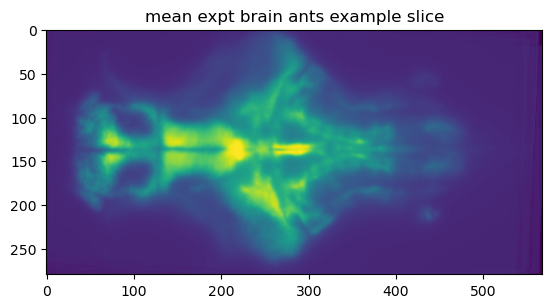

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

Mean-brain shape: (280, 568, 40)
Coarse shape after DS=(2, 2, 1): (140, 284, 40)
🚀 Processing 7 CTRL fish...


CTRL:   0%|          | 0/7 [00:00<?, ?it/s]

✅ Done: CTRL | POS n_fish=7 | NEG n_fish=7
🚀 Processing 7 HCRT-TRPV1 fish...


/tmp/ipykernel_1996390/3043224708.py:306: RuntimeWarning: Mean of empty slice
  avg_pos = np.nanmean(stack, axis=0).astype(np.float32)
/tmp/ipykernel_1996390/3043224708.py:315: RuntimeWarning: Mean of empty slice
  avg_neg = np.nanmean(stack, axis=0).astype(np.float32)


HCRT-TRPV1:   0%|          | 0/7 [00:00<?, ?it/s]

✅ Done: HCRT-TRPV1 | POS n_fish=7 | NEG n_fish=7


/tmp/ipykernel_1996390/3043224708.py:167: RuntimeWarning: Mean of empty slice
  return np.nanmean(vol, axis=axis)


✅ Saved figure: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/Tonic_dR2_Map_SplitPosNeg_tonic_dR2_map_splitposneg_iaaft_nullp95.png


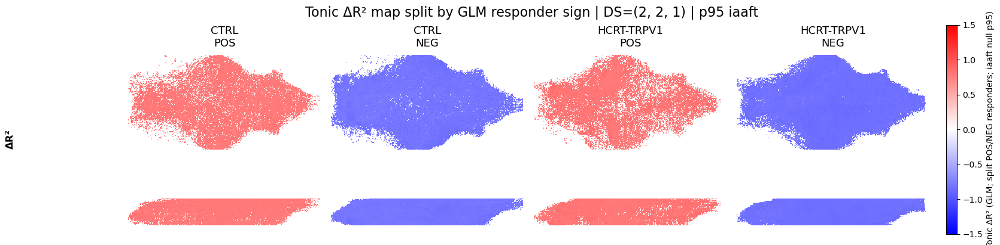

In [14]:
import os
import gc
import json
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.gridspec import GridSpec
from joblib import Parallel, delayed
from tqdm.auto import tqdm

# =========================
# TONIC ΔR² MAP (static; split POS vs NEG responders)
#   IMPORTANT:
#   ΔR² is a single scalar per cell, not a time series.
#   So this is a single static anatomical map, not a movie over windows.
# =========================

# =========================
# USER SETTINGS
# =========================
TAG = f"tonic_dR2_map_splitposneg_{NULL_TAG}_nullp{RESPONDER_NULL_THRESH}"
DS = (2, 2, 1)
ROTATE_XY_MINUS_90 = True
N_JOBS = 25

# --- INPUT FILES ---
F_NAME_COORDS = "transformed_all_cells_meanbrain.npy"
F_NAME_DR2    = "kernel_delta_r2_fit.npy"

OUT_NAME = f"Tonic_dR2_Map_SplitPosNeg_{TAG}.png"

# If True:
#   only plot responder cells, split by sign
# If False:
#   the whole point of this script is gone
USE_RESPONDER_SPLIT_ONLY = True

# --- PLOT SETTINGS ---
# tune these after first run; your current ±1 is probably way too wide unless your ΔR² is huge
vmin, vmax = -1.5, 1.5
cmap = "bwr"
COLORBAR_LABEL = f"Tonic ΔR² (GLM; split POS/NEG responders; {NULL_TAG} null p{RESPONDER_NULL_THRESH})"

PROJ_MODE = "mean"   # keep same style as your current code
# try "maxabs" if mean projection still looks too washed out

# =========================
# HELPERS
# =========================
def _mean_brain_shape(combine_proj_ID):
    mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)
    return tuple(map(int, mean_img.shape))

def _safe_load(path, mmap_mode=None):
    if not os.path.exists(path):
        return None
    return np.load(path, mmap_mode=mmap_mode)

def _coarse_shape(brain_shape, ds):
    brain_shape = np.array(brain_shape, dtype=int)
    ds = np.array(ds, dtype=int)
    return tuple(((brain_shape + ds - 1) // ds).astype(int))

def _rotate(arr):
    return np.rot90(arr, k=3) if ROTATE_XY_MINUS_90 else arr

def _normalize_null_tag(null_tag: str) -> str:
    m = str(null_tag).lower().strip()
    if m in {"none", "shift", "cshift", "circular_shift"}:
        return "shift"
    if m in {"iaaft", "aaft"}:
        return "iaaft"
    raise ValueError(f"NULL_TAG must be 'shift' or 'iaaft' (or 'none' alias), got {null_tag!r}")

def idx_paths_for_null_tag(dir_expt, ptag: int, null_tag: str, param_folder_name=None):
    """
    Supports:
      - new: tonic_pos_glm_{null_tag}_nullp{ptag}_idxs.npy
      - legacy: shift -> tonic_pos_glm_nullp{ptag}_idxs.npy
                iaaft -> tonic_pos_glm_iaaft_nullp{ptag}_idxs.npy
    Searches both in:
      - {dir_expt}/glm/{param_folder_name}/   (if provided)
      - {dir_expt}/
    """
    null_tag = _normalize_null_tag(null_tag)

    pos_new = f"tonic_pos_glm_{null_tag}_nullp{ptag}_idxs.npy"
    neg_new = f"tonic_neg_glm_{null_tag}_nullp{ptag}_idxs.npy"

    if null_tag == "shift":
        pos_legacy = f"tonic_pos_glm_nullp{ptag}_idxs.npy"
        neg_legacy = f"tonic_neg_glm_nullp{ptag}_idxs.npy"
    else:
        pos_legacy = f"tonic_pos_glm_iaaft_nullp{ptag}_idxs.npy"
        neg_legacy = f"tonic_neg_glm_iaaft_nullp{ptag}_idxs.npy"

    candidates = []
    if param_folder_name is not None:
        run_dir = os.path.join(dir_expt, "glm", param_folder_name)
        candidates += [
            (os.path.join(run_dir, pos_new),    os.path.join(run_dir, neg_new)),
            (os.path.join(run_dir, pos_legacy), os.path.join(run_dir, neg_legacy)),
        ]

    candidates += [
        (os.path.join(dir_expt, pos_new),    os.path.join(dir_expt, neg_new)),
        (os.path.join(dir_expt, pos_legacy), os.path.join(dir_expt, neg_legacy)),
    ]

    for pp, nn in candidates:
        if os.path.exists(pp) and os.path.exists(nn):
            return pp, nn, null_tag

    tried = []
    for pp, nn in candidates:
        tried.append(pp)
        tried.append(nn)

    raise FileNotFoundError(
        f"Missing idx files for NULL_TAG={null_tag}, p{ptag}.\nTried:\n  " + "\n  ".join(tried)
    )

def _voxelize_cell_values(coords, vals, brain_shape, ds):
    coords = np.asarray(coords)
    vals = np.asarray(vals)

    mask = np.isfinite(vals) & (~np.isnan(coords).any(axis=1))
    coords = coords[mask]
    vals = vals[mask]

    X, Y, Z = brain_shape
    inb = (
        (coords[:, 0] >= 0) & (coords[:, 0] < X) &
        (coords[:, 1] >= 0) & (coords[:, 1] < Y) &
        (coords[:, 2] >= 0) & (coords[:, 2] < Z)
    )
    coords = coords[inb]
    vals = vals[inb]

    if coords.shape[0] == 0:
        return None

    ds = np.array(ds, dtype=int)
    Xc, Yc, Zc = _coarse_shape((X, Y, Z), ds)

    cidx = np.floor(coords / ds).astype(int)
    cidx[:, 0] = np.clip(cidx[:, 0], 0, Xc - 1)
    cidx[:, 1] = np.clip(cidx[:, 1], 0, Yc - 1)
    cidx[:, 2] = np.clip(cidx[:, 2], 0, Zc - 1)

    lin = (cidx[:, 0] * (Yc * Zc) + cidx[:, 1] * Zc + cidx[:, 2]).astype(np.int64)
    nvox = Xc * Yc * Zc

    sumv = np.zeros(nvox, dtype=np.float64)
    cntv = np.zeros(nvox, dtype=np.int64)

    np.add.at(sumv, lin, vals.astype(np.float64))
    np.add.at(cntv, lin, 1)

    out = np.full(nvox, np.nan, dtype=np.float32)
    m = cntv > 0
    out[m] = (sumv[m] / cntv[m]).astype(np.float32)
    return out.reshape((Xc, Yc, Zc))

def _proj(vol, axis, mode="mean"):
    if mode == "mean":
        return np.nanmean(vol, axis=axis)
    if mode == "max":
        return np.nanmax(vol, axis=axis)
    if mode == "maxabs":
        a = np.abs(vol)
        a = np.where(np.isfinite(a), a, -np.inf)
        idx = np.nanargmax(a, axis=axis)
        vol0 = np.where(np.isfinite(vol), vol, np.nan)
        take = np.take_along_axis(vol0, np.expand_dims(idx, axis=axis), axis=axis)
        return np.squeeze(take, axis=axis)
    raise ValueError(f"Unknown PROJ_MODE: {mode}")

def build_split_dr2_arrays(dR2, pos_idx, neg_idx):
    """
    Return two arrays:
      vals_pos: +dR2 on positive responders, NaN elsewhere
      vals_neg: -dR2 on negative responders, NaN elsewhere
    """
    dR2 = np.asarray(dR2).reshape(-1).astype(np.float32)

    vals_pos = np.full(dR2.shape, np.nan, dtype=np.float32)
    vals_neg = np.full(dR2.shape, np.nan, dtype=np.float32)

    pos_idx = np.asarray(pos_idx, dtype=np.int64).reshape(-1)
    neg_idx = np.asarray(neg_idx, dtype=np.int64).reshape(-1)

    pos_idx = pos_idx[(pos_idx >= 0) & (pos_idx < dR2.size)]
    neg_idx = neg_idx[(neg_idx >= 0) & (neg_idx < dR2.size)]

    if pos_idx.size > 0:
        pos_idx = np.unique(pos_idx)
        vals_pos[pos_idx] = dR2[pos_idx]

    if neg_idx.size > 0:
        neg_idx = np.unique(neg_idx)
        vals_neg[neg_idx] = -dR2[neg_idx]

    vals_pos[~np.isfinite(vals_pos)] = np.nan
    vals_neg[~np.isfinite(vals_neg)] = np.nan
    return vals_pos, vals_neg

# =========================
# WORKER (per fish)
# =========================
def _process_one_fish_dr2_map_splitposneg(
    expt_ID,
    proj_ID,
    dir_ants_output,
    brain_shape,
    ds,
):
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    run_dir = dir_expt / "glm" / param_folder_name

    p_coords = dir_expt / F_NAME_COORDS
    p_dr2    = run_dir / F_NAME_DR2

    empty = {"pos": None, "neg": None}

    coords = _safe_load(str(p_coords))
    dR2    = _safe_load(str(p_dr2))

    if coords is None or dR2 is None:
        return empty

    if coords.ndim != 2 or coords.shape[1] != 3:
        return empty
    if dR2.ndim != 1:
        return empty
    if coords.shape[0] != dR2.shape[0]:
        return empty

    if not USE_RESPONDER_SPLIT_ONLY:
        # this script is designed for split maps; keeping fallback just in case
        vals_pos = np.asarray(dR2, dtype=np.float32)
        vals_neg = None
        vals_pos[~np.isfinite(vals_pos)] = np.nan
    else:
        try:
            pos_path, neg_path, _ = idx_paths_for_null_tag(
                dir_expt=str(dir_expt),
                ptag=int(RESPONDER_NULL_THRESH),
                null_tag=NULL_TAG,
                param_folder_name=param_folder_name,
            )
        except Exception:
            return empty

        pos_idx = _safe_load(str(pos_path))
        neg_idx = _safe_load(str(neg_path))
        if pos_idx is None or neg_idx is None:
            return empty

        vals_pos, vals_neg = build_split_dr2_arrays(dR2, pos_idx, neg_idx)

    vol_pos = _voxelize_cell_values(coords, vals_pos, brain_shape, ds)
    vol_neg = None if vals_neg is None else _voxelize_cell_values(coords, vals_neg, brain_shape, ds)

    out = {
        "pos": vol_pos if (vol_pos is not None and np.isfinite(vol_pos).any()) else None,
        "neg": vol_neg if (vol_neg is not None and np.isfinite(vol_neg).any()) else None,
    }

    del coords, dR2, vals_pos
    if vals_neg is not None:
        del vals_neg
    gc.collect()
    return out

# =========================
# PREP
# =========================
brain_shape = _mean_brain_shape(combine_proj_ID)
Xc, Yc, Zc = _coarse_shape(brain_shape, DS)

print(f"Mean-brain shape: {brain_shape}")
print(f"Coarse shape after DS={DS}: {(Xc, Yc, Zc)}")

# =========================
# RUN PARALLEL + AVERAGE MAPS
# =========================
def run_group(expt_list, group_name):
    print(f"🚀 Processing {len(expt_list)} {group_name} fish...")

    results = Parallel(n_jobs=N_JOBS, backend="loky")(
        delayed(_process_one_fish_dr2_map_splitposneg)(
            expt_ID, proj_ID, dir_ants_output, brain_shape, DS
        )
        for expt_ID in tqdm(expt_list, desc=group_name)
    )

    fish_maps_pos = [res["pos"] for res in results if res["pos"] is not None]
    fish_maps_neg = [res["neg"] for res in results if res["neg"] is not None]

    if len(fish_maps_pos) == 0:
        avg_pos = None
        print(f"⚠️ No valid POS maps for {group_name}")
    else:
        stack = np.stack(fish_maps_pos, axis=0)
        avg_pos = np.nanmean(stack, axis=0).astype(np.float32)
        if not np.isfinite(avg_pos).any():
            avg_pos = None

    if len(fish_maps_neg) == 0:
        avg_neg = None
        print(f"⚠️ No valid NEG maps for {group_name}")
    else:
        stack = np.stack(fish_maps_neg, axis=0)
        avg_neg = np.nanmean(stack, axis=0).astype(np.float32)
        if not np.isfinite(avg_neg).any():
            avg_neg = None

    print(
        f"✅ Done: {group_name} | "
        f"POS n_fish={len(fish_maps_pos)} | NEG n_fish={len(fish_maps_neg)}"
    )
    return {"pos": avg_pos, "neg": avg_neg}

ctrl_maps = run_group(ctrl_expt_ID_list, CTRL_TAG)
hcrt_maps = run_group(hcrt_expt_ID_list, EXPT_TAG)

maps = {
    f"{CTRL_TAG}\nPOS": ctrl_maps["pos"],
    f"{CTRL_TAG}\nNEG": ctrl_maps["neg"],
    f"{EXPT_TAG}\nPOS": hcrt_maps["pos"],
    f"{EXPT_TAG}\nNEG": hcrt_maps["neg"],
}

# =========================
# PLOTTING (same projection style, static map)
# =========================
titles = [
    f"{CTRL_TAG}\nPOS",
    f"{CTRL_TAG}\nNEG",
    f"{EXPT_TAG}\nPOS",
    f"{EXPT_TAG}\nNEG",
]
n_cols = 4

fig = plt.figure(figsize=(4.5 * n_cols, 4.5))
gs = GridSpec(
    nrows=2,
    ncols=n_cols,
    height_ratios=[Xc, Zc],
    hspace=0.1,
    wspace=0.05,
    top=0.86,
    bottom=0.08
)

axs = np.empty((2, n_cols), dtype=object)
for r in range(2):
    for c in range(n_cols):
        axs[r, c] = fig.add_subplot(gs[r, c])

last_im = None

for j, key in enumerate(titles):
    vol = maps[key]
    if vol is None:
        axs[0, j].axis("off")
        axs[1, j].axis("off")
        continue

    # XY: projection over Z
    xy = _proj(vol, axis=2, mode=PROJ_MODE)
    if not np.isfinite(xy).any():
        axs[0, j].axis("off")
    else:
        xy = _rotate(xy)
        xy_disp = np.rot90(xy, k=4).T
        axs[0, j].imshow(
            xy_disp,
            cmap=cmap, vmin=vmin, vmax=vmax,
            origin="upper", aspect="equal", interpolation="nearest",
            extent=[0, Yc, Xc, 0]
        )
        axs[0, j].axis("off")
        axs[0, j].set_xlim(0, Yc)
        axs[0, j].set_title(key, fontsize=13, pad=10)

    # YZ: projection over X
    yz = _proj(vol, axis=0, mode=PROJ_MODE)
    if not np.isfinite(yz).any():
        axs[1, j].axis("off")
    else:
        yz = yz.T
        yz = np.rot90(yz, k=3).T
        yz_disp = np.flipud(yz)

        last_im = axs[1, j].imshow(
            yz_disp,
            cmap=cmap, vmin=vmin, vmax=vmax,
            origin="upper", aspect="equal", interpolation="nearest",
            extent=[0, Yc, Zc, 0]
        )
        axs[1, j].axis("off")
        axs[1, j].invert_yaxis()
        axs[1, j].set_xlim(0, Yc)

# Left-side label between XY and YZ
pos_top = axs[0, 0].get_position()
pos_bot = axs[1, 0].get_position()
y_center = (pos_top.y1 + pos_bot.y0) / 2

fig.text(
    0.02, y_center,
    "ΔR²",
    va="center", ha="right", rotation=90,
    fontsize=12, fontweight="bold",
    transform=fig.transFigure
)

if last_im is not None:
    cbar = fig.colorbar(
        last_im,
        ax=axs.ravel().tolist(),
        fraction=0.02,
        pad=0.02,
    )
    cbar.set_label(COLORBAR_LABEL)
else:
    print("⚠️ No finite maps to colorbar (last_im is None).")

fig.suptitle(
    f"Tonic ΔR² map split by GLM responder sign | DS={DS} | "
    f"p{RESPONDER_NULL_THRESH} {NULL_TAG}",
    y=0.93, fontsize=16
)

# Save
fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)
out_path = fig_dir / OUT_NAME
plt.savefig(out_path, dpi=300, bbox_inches="tight")
print(f"✅ Saved figure: {out_path}")
plt.show()

### 【ALL CELLS, delta Z】 ALL CELLS Averaged Tonic Activity Change Effect Size (delta Z) 

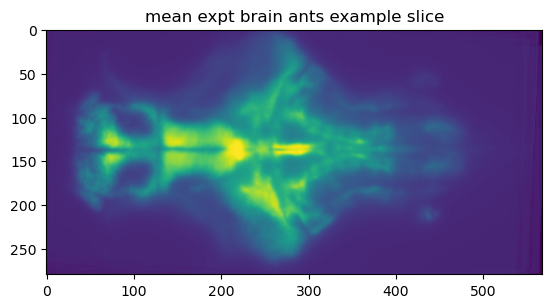

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

📏 Recording duration (min) across fish: min=120.0, p10=120.0, median=120.0
⚙️ Using FRAME_RATE_HZ=1.0. If this is wrong, EVERYTHING shifts.
Using full requested comparison end: WASH_END_MIN_EFF = 90.0 min
Baseline slice frames: 1800 2700 len= 900
Win0 0 - 10 min frames: 2760-3360 (len=600)
Win1 5 - 15 min frames: 3060-3660 (len=600)
Win2 10 - 20 min frames: 3360-3960 (len=600)
Win3 15 - 25 min frames: 3660-4260 (len=600)
Win4 20 - 30 min frames: 3960-4560 (len=600)
Plan: 7 windows from drug start (effective end=90.0 min).
Windows: ['0 - 10 min', '5 - 15 min', '10 - 20 min', '15 - 25 min', '20 - 30 min', '25 - 35 min', '30 - 40 min']
🚀 Processing 7 CTRL fish...


CTRL:   0%|          | 0/7 [00:00<?, ?it/s]

🚀 Processing 7 HCRT-TRPV1 fish...


/tmp/ipykernel_748912/450445323.py:326: RuntimeWarning: Mean of empty slice
  m = np.nanmean(stack, axis=0).astype(np.float32)


HCRT-TRPV1:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_748912/450445323.py:135: RuntimeWarning: Mean of empty slice
  return np.nanmean(vol, axis=axis)


✅ Saved figure: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/Tonic_DZ_WindowMean_Map_tonic_dz_windowmean_allcells_20min_step10.png


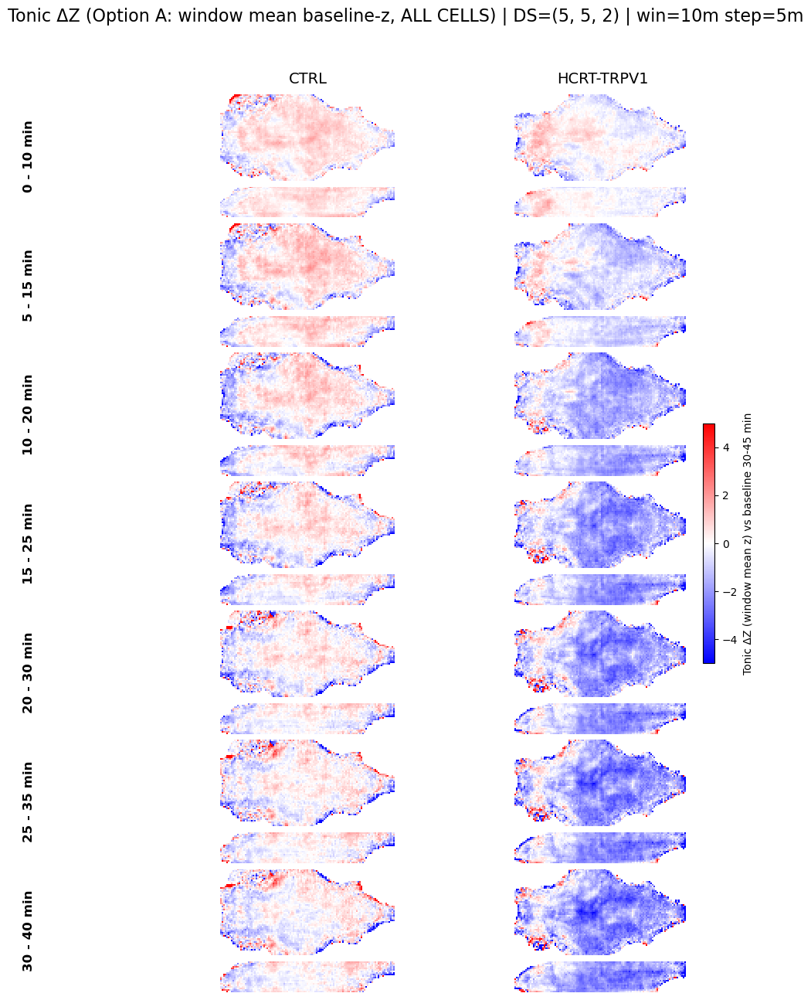

In [12]:
import os
import gc
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.gridspec import GridSpec
from joblib import Parallel, delayed
from tqdm.auto import tqdm

# =========================
# TONIC OPTION A MAP (ALL CELLS)
#   Option A = window mean baseline-z (no max-search)
#   all cells = no responder masking
# =========================

# =========================
# USER SETTINGS
# =========================
TAG = "tonic_dz_windowmean_allcells_20min_step10"
DS = (5, 5, 2)
ROTATE_XY_MINUS_90 = True
N_JOBS = 25  # adjust for your machine/filesystem

# --- INPUT FILES ---
F_NAME_COORDS = "transformed_all_cells_meanbrain.npy"
F_NAME_TONIC  = "data_array_f_tonic.npy"

OUT_NAME = f"Tonic_DZ_WindowMean_Map_{TAG}.png"

# --- TIME SETTINGS ---
# ⚠️ Must match your global volume_per_sec
FRAME_RATE_HZ = float(volume_per_sec)



# Baseline for z-scoring (match your tonic ΔZ normalization)
BASELINE_MIN_PAIR = (baseline_end/60/volume_per_sec-15, (baseline_end)/ 60 / volume_per_sec) 

# Drug time anchor for window labels
DRUG_START_MIN = drug_start / 60 / volume_per_sec

# plotting time coverage (will be capped by data length)
WASH_END_MIN = drug_end / 60 / volume_per_sec  # cap at active comparison epoch end


# --- CONTIGUOUS WINDOWS (after DRUG_START_MIN) ---
WINDOW_DURATION_MIN = 10.0
WINDOW_STEP_MIN     = 5.0

# --- NUMERICS ---
EPS_SD = 1e-6

# --- PLOT SETTINGS ---
vmin, vmax = -5.0, 5.0     # adjust after first run
cmap = "bwr"
PROJ_MODE = "mean"         # for signed ΔZ, mean is sensible

# =========================
# HELPERS
# =========================
def _get_n_frames(expt_ID):
    p = Path(dir_ants_output) / proj_ID / expt_ID / F_NAME_TONIC
    if not p.exists():
        return None
    x = np.load(p, mmap_mode="r")
    if x.ndim != 2:
        return None
    return int(x.shape[1])

def _mean_brain_shape(combine_proj_ID):
    # requires library_registration in your environment
    mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)
    return tuple(map(int, mean_img.shape))

def _safe_load(path, mmap_mode=None):
    if not os.path.exists(path):
        return None
    return np.load(path, mmap_mode=mmap_mode)

def _coarse_shape(brain_shape, ds):
    brain_shape = np.array(brain_shape, dtype=int)
    ds = np.array(ds, dtype=int)
    return tuple(((brain_shape + ds - 1) // ds).astype(int))

def _min_to_idx(minutes, fs_hz):
    return int(np.round(minutes * 60.0 * fs_hz))

def _rotate(arr):
    return np.rot90(arr, k=3) if ROTATE_XY_MINUS_90 else arr

def _voxelize_cell_values(coords, vals, brain_shape, ds):
    coords = np.asarray(coords)
    vals = np.asarray(vals)

    mask = np.isfinite(vals) & (~np.isnan(coords).any(axis=1))
    coords = coords[mask]
    vals = vals[mask]

    X, Y, Z = brain_shape
    inb = (
        (coords[:, 0] >= 0) & (coords[:, 0] < X) &
        (coords[:, 1] >= 0) & (coords[:, 1] < Y) &
        (coords[:, 2] >= 0) & (coords[:, 2] < Z)
    )
    coords = coords[inb]
    vals = vals[inb]

    if coords.shape[0] == 0:
        return None

    ds = np.array(ds, dtype=int)
    Xc, Yc, Zc = _coarse_shape((X, Y, Z), ds)

    cidx = np.floor(coords / ds).astype(int)
    cidx[:, 0] = np.clip(cidx[:, 0], 0, Xc - 1)
    cidx[:, 1] = np.clip(cidx[:, 1], 0, Yc - 1)
    cidx[:, 2] = np.clip(cidx[:, 2], 0, Zc - 1)

    lin = (cidx[:, 0] * (Yc * Zc) + cidx[:, 1] * Zc + cidx[:, 2]).astype(np.int64)
    nvox = Xc * Yc * Zc

    sumv = np.zeros(nvox, dtype=np.float64)
    cntv = np.zeros(nvox, dtype=np.int64)

    np.add.at(sumv, lin, vals.astype(np.float64))
    np.add.at(cntv, lin, 1)

    out = np.full(nvox, np.nan, dtype=np.float32)
    m = cntv > 0
    out[m] = (sumv[m] / cntv[m]).astype(np.float32)
    return out.reshape((Xc, Yc, Zc))

def _proj(vol, axis, mode="mean"):
    if mode == "mean":
        return np.nanmean(vol, axis=axis)
    if mode == "max":
        return np.nanmax(vol, axis=axis)
    if mode == "maxabs":
        a = np.abs(vol)
        a = np.where(np.isfinite(a), a, -np.inf)
        idx = np.nanargmax(a, axis=axis)
        vol0 = np.where(np.isfinite(vol), vol, np.nan)
        take = np.take_along_axis(vol0, np.expand_dims(idx, axis=axis), axis=axis)
        return np.squeeze(take, axis=axis)
    raise ValueError(f"Unknown PROJ_MODE: {mode}")

# =========================
# WORKER (per fish, all windows)
# =========================
def _process_one_fish_all_windows_tonic_optionA(
    expt_ID, proj_ID, dir_ants_output,
    brain_shape, ds,
    baseline_slice, window_slices,
    min_fraction_available=0.50,
):
    """
    Option A: per window ΔZ = mean(z) in that window
      z(t) = (F(t)-mu_baseline)/sd_baseline
      mean(z) over window == (mean(F_window)-mu_baseline)/sd_baseline

    All cells: no responder mask.
    Returns: list of volumes [vol_w0, vol_w1, ...] each (Xc,Yc,Zc) or None
    """
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    p_coords = dir_expt / F_NAME_COORDS
    p_traces = dir_expt / F_NAME_TONIC

    coords = _safe_load(str(p_coords))
    Ft = _safe_load(str(p_traces), mmap_mode="r")

    if coords is None or Ft is None:
        return [None] * len(window_slices)

    if Ft.ndim != 2 or Ft.shape[0] != coords.shape[0]:
        return [None] * len(window_slices)

    n_cells, n_frames_total = int(Ft.shape[0]), int(Ft.shape[1])

    # clip baseline slice
    b0, b1 = int(baseline_slice.start), int(baseline_slice.stop)
    if b0 >= n_frames_total or (b1 - b0) < 2:
        return [None] * len(window_slices)
    b1 = min(b1, n_frames_total)
    baseline_slice_clipped = slice(b0, b1)

    # baseline stats per cell
    base_seg = np.asarray(Ft[:, baseline_slice_clipped], dtype=np.float32)  # (N, Tb)
    mu_b = np.nanmean(base_seg, axis=1).astype(np.float32)
    sd_b = (np.nanstd(base_seg, axis=1, ddof=0).astype(np.float32) + EPS_SD)

    volumes = []
    for w_slice in window_slices:
        start = int(w_slice.start)
        stop  = int(w_slice.stop)

        if start >= n_frames_total:
            volumes.append(None)
            continue

        if stop > n_frames_total:
            available = n_frames_total - start
            intended  = stop - start
            if available < (min_fraction_available * intended):
                volumes.append(None)
                continue
            actual_slice = slice(start, n_frames_total)
        else:
            actual_slice = w_slice

        # mean over window, then z-diff in baseline SD units
        try:
            win_seg = np.asarray(Ft[:, actual_slice], dtype=np.float32)
            if win_seg.shape[1] < 2:
                volumes.append(None)
                continue

            mu_w = np.nanmean(win_seg, axis=1).astype(np.float32)
            dz = (mu_w - mu_b) / sd_b
            dz[~np.isfinite(dz)] = np.nan

            vol = _voxelize_cell_values(coords, dz, brain_shape, ds)
            if vol is None or not np.isfinite(vol).any():
                volumes.append(None)
            else:
                volumes.append(vol)

        except Exception:
            volumes.append(None)

    del Ft, coords, base_seg
    gc.collect()
    return volumes

# =========================
# WINDOW PLAN (data-driven cap like your phasic map)
# =========================
brain_shape = _mean_brain_shape(combine_proj_ID)
Xc, Yc, Zc = _coarse_shape(brain_shape, DS)

all_expts = list(ctrl_expt_ID_list) + list(hcrt_expt_ID_list)
nframes_list = [nf for nf in (_get_n_frames(e) for e in all_expts) if nf is not None]
if len(nframes_list) == 0:
    raise RuntimeError("No tonic trace files found to determine recording length.")

nframes_arr = np.asarray(nframes_list, dtype=float)
dur_mins = nframes_arr / FRAME_RATE_HZ / 60.0
min_dur_min = float(np.nanmin(dur_mins))
p10_dur_min = float(np.nanpercentile(dur_mins, 10))
med_dur_min = float(np.nanmedian(dur_mins))

print(f"📏 Recording duration (min) across fish: min={min_dur_min:.1f}, p10={p10_dur_min:.1f}, median={med_dur_min:.1f}")
print(f"⚙️ Using FRAME_RATE_HZ={FRAME_RATE_HZ}. If this is wrong, EVERYTHING shifts.")

# DO NOT cap by fish duration here.
# We want the requested window plan to include the full drug epoch.
WASH_END_MIN_EFF = WASH_END_MIN
print(f"Using full requested comparison end: WASH_END_MIN_EFF = {WASH_END_MIN_EFF:.1f} min")

# baseline slice
b0 = _min_to_idx(BASELINE_MIN_PAIR[0], FRAME_RATE_HZ)
b1 = _min_to_idx(BASELINE_MIN_PAIR[1], FRAME_RATE_HZ)
baseline_slice = slice(b0, b1)

typ_nf = int(np.nanmedian(nframes_arr))
if b1 > typ_nf:
    print(f"🚨 Baseline slice ends at frame {b1}, but typical recording has {typ_nf} frames.")
    print("   This screams FRAME_RATE_HZ mismatch or wrong time anchors.")

# contiguous windows after drug start
# latest valid start so that (start + duration) still fits
last_start_min = WASH_END_MIN_EFF - WINDOW_DURATION_MIN

# include endpoint with tiny epsilon to avoid float-rounding loss of final window
comp_start_times = np.arange(
    DRUG_START_MIN,
    last_start_min + 1e-9,
    WINDOW_STEP_MIN
)

window_slices = []
window_labels = []
for t_start in comp_start_times:
    t_end = t_start + WINDOW_DURATION_MIN

    s_idx = _min_to_idx(t_start, FRAME_RATE_HZ)
    e_idx = _min_to_idx(t_end, FRAME_RATE_HZ)
    window_slices.append(slice(s_idx, e_idx))

    rel_start = t_start - DRUG_START_MIN
    rel_end   = t_end   - DRUG_START_MIN
    window_labels.append(f"{int(round(rel_start))} - {int(round(rel_end))} min")

n_windows = len(window_slices)

print("Baseline slice frames:", baseline_slice.start, baseline_slice.stop,
      "len=", baseline_slice.stop - baseline_slice.start)
for i in range(min(5, len(window_slices))):
    s = window_slices[i].start
    e = window_slices[i].stop
    print(f"Win{i} {window_labels[i]} frames: {s}-{e} (len={e-s})")
print(f"Plan: {n_windows} windows from drug start (effective end={WASH_END_MIN_EFF:.1f} min).")
print(f"Windows: {window_labels}")

# =========================
# RUN PARALLEL + AVERAGE MAPS
# =========================
def run_group(expt_list, group_name):
    print(f"🚀 Processing {len(expt_list)} {group_name} fish...")

    results = Parallel(n_jobs=N_JOBS, backend="loky")(
        delayed(_process_one_fish_all_windows_tonic_optionA)(
            expt_ID, proj_ID, dir_ants_output,
            brain_shape, DS,
            baseline_slice, window_slices
        )
        for expt_ID in tqdm(expt_list, desc=group_name)
    )

    avg_maps = []
    for w_i in range(n_windows):
        fish_maps = [res[w_i] for res in results if res and res[w_i] is not None]
        if not fish_maps:
            avg_maps.append(None)
        else:
            stack = np.stack(fish_maps, axis=0)
            m = np.nanmean(stack, axis=0).astype(np.float32)
            avg_maps.append(m if np.isfinite(m).any() else None)
    return avg_maps

ctrl_maps = run_group(ctrl_expt_ID_list, CTRL_TAG)
hcrt_maps = run_group(hcrt_expt_ID_list, EXPT_TAG)

maps_by_window = [{CTRL_TAG: ctrl_maps[i], EXPT_TAG: hcrt_maps[i]} for i in range(n_windows)]

# =========================
# PLOTTING (same layout style)
# =========================
titles = [CTRL_TAG, EXPT_TAG]
n_cols = 2

height_ratios = []
for _ in range(n_windows):
    height_ratios.extend([Xc, Zc])

fig = plt.figure(figsize=(5 * n_cols, 2.0 * n_windows))
gs = GridSpec(
    nrows=2 * n_windows,
    ncols=n_cols,
    height_ratios=height_ratios,
    hspace=0.1,
    wspace=0.05,
    top=0.88,
    bottom=0.05
)

axs = np.empty((2 * n_windows, n_cols), dtype=object)
for r in range(2 * n_windows):
    for c in range(n_cols):
        axs[r, c] = fig.add_subplot(gs[r, c])

last_im = None

for wi in range(n_windows):
    m = maps_by_window[wi]
    row_xy, row_yz = 2 * wi, 2 * wi + 1

    for j, key in enumerate(titles):
        vol = m[key]
        if vol is None:
            axs[row_xy, j].axis("off")
            axs[row_yz, j].axis("off")
            continue

        # XY: mean over Z
        xy = _proj(vol, axis=2, mode=PROJ_MODE)
        if not np.isfinite(xy).any():
            axs[row_xy, j].axis("off")
        else:
            xy = _rotate(xy)
            xy_disp = np.rot90(xy, k=4).T
            axs[row_xy, j].imshow(
                xy_disp,
                cmap=cmap, vmin=vmin, vmax=vmax,
                origin="upper", aspect="equal", interpolation="nearest",
                extent=[0, Yc, Xc, 0]
            )
            axs[row_xy, j].axis("off")
            axs[row_xy, j].set_xlim(0, Yc)
            if wi == 0:
                axs[row_xy, j].set_title(key, fontsize=14, pad=10)

        # YZ: mean over X
        yz = _proj(vol, axis=0, mode=PROJ_MODE)
        if not np.isfinite(yz).any():
            axs[row_yz, j].axis("off")
        else:
            yz = yz.T
            yz = np.rot90(yz, k=3).T
            yz_disp = np.flipud(yz)

            last_im = axs[row_yz, j].imshow(
                yz_disp,
                cmap=cmap, vmin=vmin, vmax=vmax,
                origin="upper", aspect="equal", interpolation="nearest",
                extent=[0, Yc, Zc, 0]
            )
            axs[row_yz, j].axis("off")
            axs[row_yz, j].invert_yaxis()
            axs[row_yz, j].set_xlim(0, Yc)

    # label between XY and YZ rows (left side)
    pos_top = axs[row_xy, 0].get_position()
    pos_bot = axs[row_yz, 0].get_position()
    y_center = (pos_top.y1 + pos_bot.y0) / 2

    fig.text(
        0.02, y_center, window_labels[wi],
        va="center", ha="right", rotation=90,
        fontsize=12, fontweight="bold",
        transform=fig.transFigure
    )

# colorbar only if something was drawn
if last_im is not None:
    cbar = fig.colorbar(
        last_im,
        ax=axs.ravel().tolist(),
        fraction=0.02,
        pad=0.02,
    )
    cbar.set_label(f"Tonic ΔZ (window mean z) vs baseline {BASELINE_MIN_PAIR[0]:g}-{BASELINE_MIN_PAIR[1]:g} min")
else:
    print("⚠️ No finite maps to colorbar (last_im is None).")

fig.suptitle(
    f"Tonic ΔZ (Option A: window mean baseline-z, ALL CELLS) | DS={DS} | win={WINDOW_DURATION_MIN:g}m step={WINDOW_STEP_MIN:g}m",
    y=0.96, fontsize=16
)

# Save
fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)
out_path = fig_dir / OUT_NAME
plt.savefig(out_path, dpi=300, bbox_inches="tight")
print(f"✅ Saved figure: {out_path}")
plt.show()

### 【MAP: Tonic-GLM】 GLM RESPONDERS ONLY Averaged Tonic Activity Change Effect Size Over Time

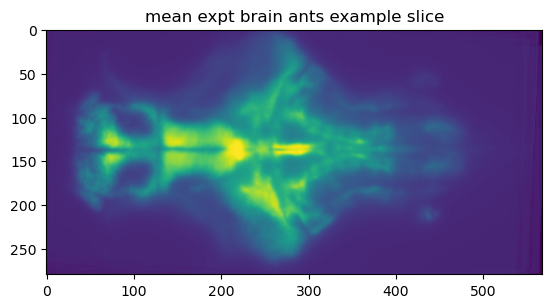

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

📏 Recording duration (min) across fish: min=120.0, p10=120.0, median=120.0
⚙️ Using FRAME_RATE_HZ=1.0. If this is wrong, EVERYTHING shifts.
Plan: 7 windows from drug start (effective end=90.0 min).
Windows: ['0 - 10 min', '5 - 15 min', '10 - 20 min', '15 - 25 min', '20 - 30 min', '25 - 35 min', '30 - 40 min']
🚀 Processing 7 CTRL fish...


CTRL:   0%|          | 0/7 [00:00<?, ?it/s]

🚀 Processing 7 HCRT-TRPV1 fish...


/tmp/ipykernel_1996390/1925155428.py:426: RuntimeWarning: Mean of empty slice
  m = np.nanmean(stack, axis=0).astype(np.float32)


HCRT-TRPV1:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_1996390/1925155428.py:212: RuntimeWarning: Mean of empty slice
  return np.nanmean(vol, axis=axis)


✅ Saved figure: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/Tonic_DZ_WindowMean_GLMResponders_tonic_dz_windowmean_glmresponders_p95_iaaft_20min_step10_smoothed.png


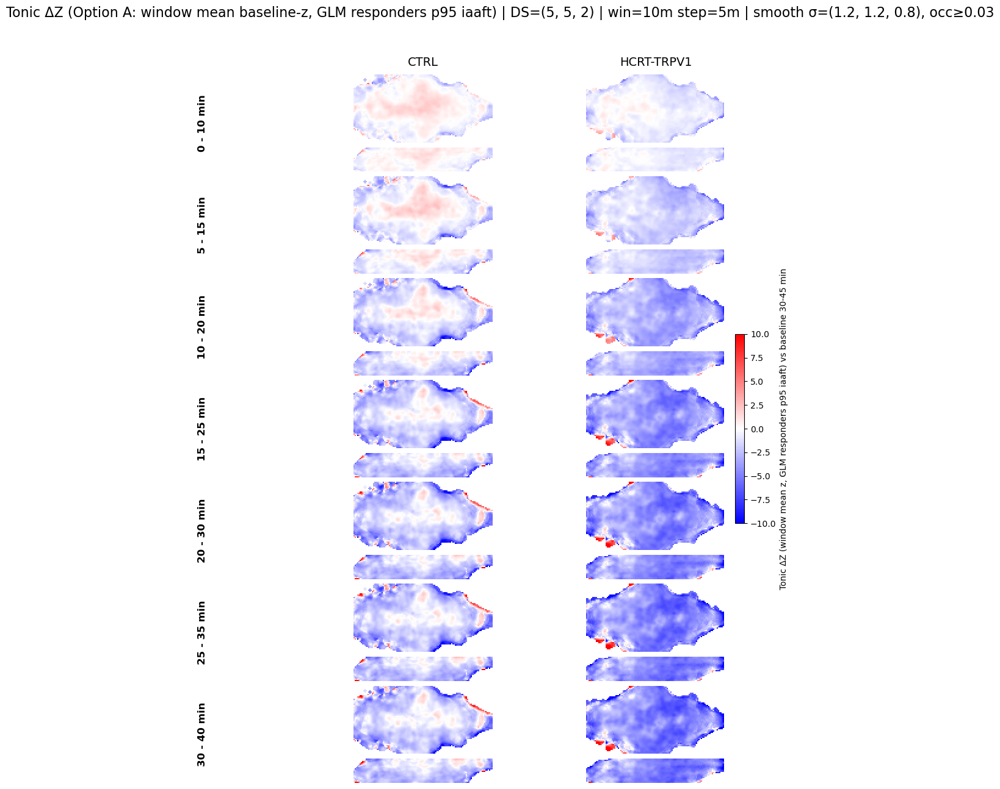

In [25]:
import os
import gc
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.gridspec import GridSpec
from joblib import Parallel, delayed
from tqdm.auto import tqdm
from scipy.ndimage import gaussian_filter

# =========================
# TONIC OPTION A MAP (GLM RESPONDERS ONLY, null pr95)
#   Option A = window mean baseline-z (no max-search)
#   responder-only = mask to tonic GLM responders (pos ∪ neg) that pass null p95
#   NEW: occupancy-aware Gaussian smoothing after voxelization
# =========================

# =========================
# USER SETTINGS
# =========================
RESPONDER_NULL_THRESH = 95
try:
    NULL_TAG
except NameError:
    NULL_TAG = "iaaft"

TAG = f"tonic_dz_windowmean_glmresponders_p{RESPONDER_NULL_THRESH}_{NULL_TAG}_20min_step10_smoothed"
DS = (5, 5, 2)
ROTATE_XY_MINUS_90 = True
N_JOBS = 30

# --- SMOOTHING SETTINGS ---
USE_GAUSSIAN_SMOOTH = True
# sigma is in COARSE voxels after DS, not raw voxels
SMOOTH_SIGMA_COARSE = (1.2, 1.2, 0.8)
# minimum smoothed occupancy required to keep a voxel
MIN_SMOOTH_OCC = 0.03

# --- INPUT FILES ---
F_NAME_COORDS = "transformed_all_cells_meanbrain.npy"
F_NAME_TONIC  = "data_array_f_tonic.npy"

OUT_NAME = f"Tonic_DZ_WindowMean_GLMResponders_{TAG}.png"

# --- TIME SETTINGS ---
FRAME_RATE_HZ = float(volume_per_sec)

BASELINE_MIN_PAIR = (baseline_end/60/volume_per_sec-15, (baseline_end)/ 60 / volume_per_sec)
DRUG_START_MIN = drug_start / 60 / volume_per_sec
WASH_END_MIN = drug_end / 60 / volume_per_sec

# --- CONTIGUOUS WINDOWS ---
WINDOW_DURATION_MIN = 10.0
WINDOW_STEP_MIN     = 5.0

# --- NUMERICS ---
EPS_SD = 1e-6

# --- PLOT SETTINGS ---
vmin, vmax = -10.0, 10.0
cmap = "bwr"
PROJ_MODE = "mean"

# =========================
# HELPERS
# =========================
def _safe_load(path, mmap_mode=None):
    if not os.path.exists(path):
        return None
    return np.load(path, mmap_mode=mmap_mode)

def _normalize_null_tag(null_tag: str) -> str:
    m = str(null_tag).lower().strip()
    if m in {"none", "shift", "cshift", "circular_shift"}:
        return "shift"
    if m in {"iaaft", "aaft"}:
        return "iaaft"
    raise ValueError(f"NULL_TAG must be 'shift' or 'iaaft' (or 'none' alias), got {null_tag!r}")

def idx_paths_for_null_tag(dir_expt, ptag: int, null_tag: str, param_folder_name=None):
    null_tag = _normalize_null_tag(null_tag)

    pos_new = f"tonic_pos_glm_{null_tag}_nullp{ptag}_idxs.npy"
    neg_new = f"tonic_neg_glm_{null_tag}_nullp{ptag}_idxs.npy"

    if null_tag == "shift":
        pos_legacy = f"tonic_pos_glm_nullp{ptag}_idxs.npy"
        neg_legacy = f"tonic_neg_glm_nullp{ptag}_idxs.npy"
    else:
        pos_legacy = f"tonic_pos_glm_iaaft_nullp{ptag}_idxs.npy"
        neg_legacy = f"tonic_neg_glm_iaaft_nullp{ptag}_idxs.npy"

    candidates = []
    if param_folder_name is not None:
        run_dir = os.path.join(dir_expt, "glm", param_folder_name)
        candidates += [
            (os.path.join(run_dir, pos_new),    os.path.join(run_dir, neg_new)),
            (os.path.join(run_dir, pos_legacy), os.path.join(run_dir, neg_legacy)),
        ]

    candidates += [
        (os.path.join(dir_expt, pos_new),    os.path.join(dir_expt, neg_new)),
        (os.path.join(dir_expt, pos_legacy), os.path.join(dir_expt, neg_legacy)),
    ]

    for pp, nn in candidates:
        if os.path.exists(pp) and os.path.exists(nn):
            return pp, nn, null_tag

    tried = []
    for pp, nn in candidates:
        tried.append(pp); tried.append(nn)
    raise FileNotFoundError(
        f"Missing idx files for NULL_TAG={null_tag}, p{ptag}.\nTried:\n  " + "\n  ".join(tried)
    )

def _get_n_frames(expt_ID):
    p = Path(dir_ants_output) / proj_ID / expt_ID / F_NAME_TONIC
    if not p.exists():
        return None
    x = np.load(p, mmap_mode="r")
    if x.ndim != 2:
        return None
    return int(x.shape[1])

def _mean_brain_shape(combine_proj_ID):
    mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)
    return tuple(map(int, mean_img.shape))

def _coarse_shape(brain_shape, ds):
    brain_shape = np.array(brain_shape, dtype=int)
    ds = np.array(ds, dtype=int)
    return tuple(((brain_shape + ds - 1) // ds).astype(int))

def _min_to_idx(minutes, fs_hz):
    return int(np.round(minutes * 60.0 * fs_hz))

def _rotate(arr):
    return np.rot90(arr, k=3) if ROTATE_XY_MINUS_90 else arr

def _voxelize_cell_sum_count(coords, vals, brain_shape, ds):
    """
    Return per-coarse-voxel sum and count, so we can do occupancy-aware smoothing.
    """
    coords = np.asarray(coords)
    vals = np.asarray(vals)

    mask = np.isfinite(vals) & (~np.isnan(coords).any(axis=1))
    coords = coords[mask]
    vals = vals[mask]

    X, Y, Z = brain_shape
    inb = (
        (coords[:, 0] >= 0) & (coords[:, 0] < X) &
        (coords[:, 1] >= 0) & (coords[:, 1] < Y) &
        (coords[:, 2] >= 0) & (coords[:, 2] < Z)
    )
    coords = coords[inb]
    vals = vals[inb]

    if coords.shape[0] == 0:
        return None, None

    ds = np.array(ds, dtype=int)
    Xc, Yc, Zc = _coarse_shape((X, Y, Z), ds)

    cidx = np.floor(coords / ds).astype(int)
    cidx[:, 0] = np.clip(cidx[:, 0], 0, Xc - 1)
    cidx[:, 1] = np.clip(cidx[:, 1], 0, Yc - 1)
    cidx[:, 2] = np.clip(cidx[:, 2], 0, Zc - 1)

    lin = (cidx[:, 0] * (Yc * Zc) + cidx[:, 1] * Zc + cidx[:, 2]).astype(np.int64)
    nvox = Xc * Yc * Zc

    sumv = np.zeros(nvox, dtype=np.float32)
    cntv = np.zeros(nvox, dtype=np.float32)

    np.add.at(sumv, lin, vals.astype(np.float32))
    np.add.at(cntv, lin, 1.0)

    return sumv.reshape((Xc, Yc, Zc)), cntv.reshape((Xc, Yc, Zc))

def _sum_count_to_mean(sumv, cntv):
    if sumv is None or cntv is None:
        return None
    out = np.full(sumv.shape, np.nan, dtype=np.float32)
    m = cntv > 0
    out[m] = (sumv[m] / cntv[m]).astype(np.float32)
    return out

def _smooth_mean_map(sumv, cntv, sigma_coarse, min_smooth_occ=0.03):
    """
    Occupancy-aware Gaussian smoothing:
      smooth(sum) / smooth(count)
    """
    if sumv is None or cntv is None:
        return None

    sum_s = gaussian_filter(sumv.astype(np.float32), sigma=sigma_coarse, mode="constant", cval=0.0)
    cnt_s = gaussian_filter(cntv.astype(np.float32), sigma=sigma_coarse, mode="constant", cval=0.0)

    out = np.full(sumv.shape, np.nan, dtype=np.float32)
    keep = cnt_s >= float(min_smooth_occ)
    out[keep] = (sum_s[keep] / cnt_s[keep]).astype(np.float32)

    if not np.isfinite(out).any():
        return None
    return out

def _proj(vol, axis, mode="mean"):
    if mode == "mean":
        return np.nanmean(vol, axis=axis)
    if mode == "max":
        return np.nanmax(vol, axis=axis)
    if mode == "maxabs":
        a = np.abs(vol)
        a = np.where(np.isfinite(a), a, -np.inf)
        idx = np.nanargmax(a, axis=axis)
        vol0 = np.where(np.isfinite(vol), vol, np.nan)
        take = np.take_along_axis(vol0, np.expand_dims(idx, axis=axis), axis=axis)
        return np.squeeze(take, axis=axis)
    raise ValueError(f"Unknown PROJ_MODE: {mode}")

# =========================
# WORKER
# =========================
def _process_one_fish_all_windows_tonic_optionA_glmresponders(
    expt_ID, proj_ID, dir_ants_output,
    brain_shape, ds,
    baseline_slice, window_slices,
    responder_null_thresh=95,
    null_tag="iaaft",
    param_folder_name=None,
    min_fraction_available=0.50,
):
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    p_coords = dir_expt / F_NAME_COORDS
    p_traces = dir_expt / F_NAME_TONIC

    coords = _safe_load(str(p_coords))
    Ft = _safe_load(str(p_traces), mmap_mode="r")

    if coords is None or Ft is None:
        return [None] * len(window_slices)

    if Ft.ndim != 2 or Ft.shape[0] != coords.shape[0]:
        return [None] * len(window_slices)

    n_cells, n_frames_total = int(Ft.shape[0]), int(Ft.shape[1])

    ptag = int(responder_null_thresh)
    try:
        pos_path, neg_path, _ = idx_paths_for_null_tag(
            dir_expt=str(dir_expt),
            ptag=ptag,
            null_tag=null_tag,
            param_folder_name=param_folder_name,
        )
    except Exception:
        return [None] * len(window_slices)

    pos_idx = _safe_load(pos_path)
    neg_idx = _safe_load(neg_path)
    if pos_idx is None or neg_idx is None:
        return [None] * len(window_slices)

    pos_idx = np.asarray(pos_idx, dtype=np.int64).ravel()
    neg_idx = np.asarray(neg_idx, dtype=np.int64).ravel()

    pos_idx = pos_idx[(pos_idx >= 0) & (pos_idx < n_cells)]
    neg_idx = neg_idx[(neg_idx >= 0) & (neg_idx < n_cells)]
    resp_idx = np.unique(np.concatenate([pos_idx, neg_idx], axis=0)) if (pos_idx.size or neg_idx.size) else np.zeros((0,), np.int64)
    if resp_idx.size == 0:
        return [None] * len(window_slices)

    resp_mask = np.zeros(n_cells, dtype=bool)
    resp_mask[resp_idx] = True

    b0, b1 = int(baseline_slice.start), int(baseline_slice.stop)
    if b0 >= n_frames_total or (b1 - b0) < 2:
        return [None] * len(window_slices)
    b1 = min(b1, n_frames_total)
    baseline_slice_clipped = slice(b0, b1)

    base_seg = np.asarray(Ft[:, baseline_slice_clipped], dtype=np.float32)
    mu_b = np.nanmean(base_seg, axis=1).astype(np.float32)
    sd_b = (np.nanstd(base_seg, axis=1, ddof=0).astype(np.float32) + EPS_SD)

    volumes = []
    for w_slice in window_slices:
        start = int(w_slice.start)
        stop  = int(w_slice.stop)

        if start >= n_frames_total:
            volumes.append(None)
            continue

        if stop > n_frames_total:
            available = n_frames_total - start
            intended  = stop - start
            if available < (min_fraction_available * intended):
                volumes.append(None)
                continue
            actual_slice = slice(start, n_frames_total)
        else:
            actual_slice = w_slice

        try:
            win_seg = np.asarray(Ft[:, actual_slice], dtype=np.float32)
            if win_seg.shape[1] < 2:
                volumes.append(None)
                continue

            mu_w = np.nanmean(win_seg, axis=1).astype(np.float32)
            dz = (mu_w - mu_b) / sd_b
            dz[~np.isfinite(dz)] = np.nan
            dz[~resp_mask] = np.nan

            sumv, cntv = _voxelize_cell_sum_count(coords, dz, brain_shape, ds)
            if sumv is None:
                volumes.append(None)
                continue

            if USE_GAUSSIAN_SMOOTH:
                vol = _smooth_mean_map(
                    sumv, cntv,
                    sigma_coarse=SMOOTH_SIGMA_COARSE,
                    min_smooth_occ=MIN_SMOOTH_OCC
                )
            else:
                vol = _sum_count_to_mean(sumv, cntv)

            if vol is None or not np.isfinite(vol).any():
                volumes.append(None)
            else:
                volumes.append(vol)

        except Exception:
            volumes.append(None)

    del Ft, coords, base_seg
    gc.collect()
    return volumes

# =========================
# WINDOW PLAN
# =========================
brain_shape = _mean_brain_shape(combine_proj_ID)
Xc, Yc, Zc = _coarse_shape(brain_shape, DS)

all_expts = list(ctrl_expt_ID_list) + list(hcrt_expt_ID_list)
nframes_list = [nf for nf in (_get_n_frames(e) for e in all_expts) if nf is not None]
if len(nframes_list) == 0:
    raise RuntimeError("No tonic trace files found to determine recording length.")

nframes_arr = np.asarray(nframes_list, dtype=float)
dur_mins = nframes_arr / FRAME_RATE_HZ / 60.0
min_dur_min = float(np.nanmin(dur_mins))
p10_dur_min = float(np.nanpercentile(dur_mins, 10))
med_dur_min = float(np.nanmedian(dur_mins))

print(f"📏 Recording duration (min) across fish: min={min_dur_min:.1f}, p10={p10_dur_min:.1f}, median={med_dur_min:.1f}")
print(f"⚙️ Using FRAME_RATE_HZ={FRAME_RATE_HZ}. If this is wrong, EVERYTHING shifts.")

USE_QUANTILE = 10
effective_dur_min = p10_dur_min if USE_QUANTILE > 0 else min_dur_min

WASH_END_MIN_EFF = min(WASH_END_MIN, effective_dur_min)
if WASH_END_MIN_EFF < WASH_END_MIN:
    print(f"⚠️ Capping WASH_END_MIN from {WASH_END_MIN} → {WASH_END_MIN_EFF:.1f} based on data length.")

b0 = _min_to_idx(BASELINE_MIN_PAIR[0], FRAME_RATE_HZ)
b1 = _min_to_idx(BASELINE_MIN_PAIR[1], FRAME_RATE_HZ)
baseline_slice = slice(b0, b1)

comp_start_times = np.arange(DRUG_START_MIN, WASH_END_MIN_EFF, WINDOW_STEP_MIN)

window_slices = []
window_labels = []
for t_start in comp_start_times:
    t_end = t_start + WINDOW_DURATION_MIN
    if t_end > WASH_END_MIN_EFF:
        break
    s_idx = _min_to_idx(t_start, FRAME_RATE_HZ)
    e_idx = _min_to_idx(t_end, FRAME_RATE_HZ)
    window_slices.append(slice(s_idx, e_idx))

    rel_start = t_start - DRUG_START_MIN
    rel_end   = t_end   - DRUG_START_MIN
    window_labels.append(f"{int(rel_start)} - {int(rel_end)} min")

n_windows = len(window_slices)
print(f"Plan: {n_windows} windows from drug start (effective end={WASH_END_MIN_EFF:.1f} min).")
print(f"Windows: {window_labels}")

# =========================
# RUN PARALLEL + AVERAGE MAPS
# =========================
try:
    param_folder_name
except NameError:
    param_folder_name = None

def run_group(expt_list, group_name):
    print(f"🚀 Processing {len(expt_list)} {group_name} fish...")

    results = Parallel(n_jobs=N_JOBS, backend="loky")(
        delayed(_process_one_fish_all_windows_tonic_optionA_glmresponders)(
            expt_ID, proj_ID, dir_ants_output,
            brain_shape, DS,
            baseline_slice, window_slices,
            responder_null_thresh=RESPONDER_NULL_THRESH,
            null_tag=NULL_TAG,
            param_folder_name=param_folder_name,
        )
        for expt_ID in tqdm(expt_list, desc=group_name)
    )

    avg_maps = []
    for w_i in range(n_windows):
        fish_maps = [res[w_i] for res in results if res and res[w_i] is not None]
        if not fish_maps:
            avg_maps.append(None)
        else:
            stack = np.stack(fish_maps, axis=0)
            m = np.nanmean(stack, axis=0).astype(np.float32)
            avg_maps.append(m if np.isfinite(m).any() else None)
    return avg_maps

ctrl_maps = run_group(ctrl_expt_ID_list, CTRL_TAG)
hcrt_maps = run_group(hcrt_expt_ID_list, EXPT_TAG)
maps_by_window = [{CTRL_TAG: ctrl_maps[i], EXPT_TAG: hcrt_maps[i]} for i in range(n_windows)]

# =========================
# PLOTTING
# =========================
titles = [CTRL_TAG, EXPT_TAG]
n_cols = 2

height_ratios = []
for _ in range(n_windows):
    height_ratios.extend([Xc, Zc])

fig = plt.figure(figsize=(5 * n_cols, 2.0 * n_windows))
gs = GridSpec(
    nrows=2 * n_windows,
    ncols=n_cols,
    height_ratios=height_ratios,
    hspace=0.1,
    wspace=0.05,
    top=0.88,
    bottom=0.05
)

axs = np.empty((2 * n_windows, n_cols), dtype=object)
for r in range(2 * n_windows):
    for c in range(n_cols):
        axs[r, c] = fig.add_subplot(gs[r, c])

last_im = None

for wi in range(n_windows):
    m = maps_by_window[wi]
    row_xy, row_yz = 2 * wi, 2 * wi + 1

    for j, key in enumerate(titles):
        vol = m[key]
        if vol is None:
            axs[row_xy, j].axis("off")
            axs[row_yz, j].axis("off")
            continue

        xy = _proj(vol, axis=2, mode=PROJ_MODE)
        if not np.isfinite(xy).any():
            axs[row_xy, j].axis("off")
        else:
            xy = _rotate(xy)
            xy_disp = np.rot90(xy, k=4).T
            axs[row_xy, j].imshow(
                xy_disp,
                cmap=cmap, vmin=vmin, vmax=vmax,
                origin="upper", aspect="equal", interpolation="nearest",
                extent=[0, Yc, Xc, 0]
            )
            axs[row_xy, j].axis("off")
            axs[row_xy, j].set_xlim(0, Yc)
            if wi == 0:
                axs[row_xy, j].set_title(key, fontsize=14, pad=10)

        yz = _proj(vol, axis=0, mode=PROJ_MODE)
        if not np.isfinite(yz).any():
            axs[row_yz, j].axis("off")
        else:
            yz = yz.T
            yz = np.rot90(yz, k=3).T
            yz_disp = np.flipud(yz)

            last_im = axs[row_yz, j].imshow(
                yz_disp,
                cmap=cmap, vmin=vmin, vmax=vmax,
                origin="upper", aspect="equal", interpolation="nearest",
                extent=[0, Yc, Zc, 0]
            )
            axs[row_yz, j].axis("off")
            axs[row_yz, j].invert_yaxis()
            axs[row_yz, j].set_xlim(0, Yc)

    pos_top = axs[row_xy, 0].get_position()
    pos_bot = axs[row_yz, 0].get_position()
    y_center = (pos_top.y1 + pos_bot.y0) / 2

    fig.text(
        0.02, y_center, window_labels[wi],
        va="center", ha="right", rotation=90,
        fontsize=12, fontweight="bold",
        transform=fig.transFigure
    )

if last_im is not None:
    cbar = fig.colorbar(
        last_im,
        ax=axs.ravel().tolist(),
        fraction=0.02,
        pad=0.02,
    )
    cbar.set_label(
        f"Tonic ΔZ (window mean z, GLM responders p{RESPONDER_NULL_THRESH} {NULL_TAG}) "
        f"vs baseline {BASELINE_MIN_PAIR[0]:g}-{BASELINE_MIN_PAIR[1]:g} min"
    )
else:
    print("⚠️ No finite maps to colorbar (last_im is None).")

smooth_txt = f" | smooth σ={SMOOTH_SIGMA_COARSE}, occ≥{MIN_SMOOTH_OCC}" if USE_GAUSSIAN_SMOOTH else ""
fig.suptitle(
    f"Tonic ΔZ (Option A: window mean baseline-z, GLM responders p{RESPONDER_NULL_THRESH} {NULL_TAG}) "
    f"| DS={DS} | win={WINDOW_DURATION_MIN:g}m step={WINDOW_STEP_MIN:g}m{smooth_txt}",
    y=0.96, fontsize=16
)

fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)
out_path = fig_dir / OUT_NAME
plt.savefig(out_path, dpi=300, bbox_inches="tight")
print(f"✅ Saved figure: {out_path}")
plt.show()

## [Generate COOL 3D maps in FIJI✨]Save the 3D intensity map as tiff files(.npy -> .tiff)

In [ ]:
import numpy as np
import os
from tifffile import imsave
from scipy.ndimage import uniform_filter, gaussian_filter

def save_zscore_volume_as_tiff(
    proj_ID,
    dir_ants_output,
    use_qc,
    apply_smoothing,
    smoothing_type,  # options: "uniform" or "gaussian"
    kernel_size_or_sigma,
    labels
):
    """
    Convert avg_zscore_intensity .npy volumes into .tiff stacks for FIJI,
    with optional 3D smoothing to reduce Z-axis striping artifacts.

    Args:
        proj_ID (str): project ID
        dir_ants_output (str): base output dir
        use_qc (bool): use *_qc.npy or not
        apply_smoothing (bool): whether to apply 3D smoothing
        smoothing_type (str): "uniform" or "gaussian"
        kernel_size_or_sigma (tuple): kernel size or sigma (x, y, z)
        labels (list): types to export
    """
    suffix = "(QC)" if use_qc else "(No QC)"
    fig_dir = os.path.join(dir_ants_output, proj_ID, "avg_across_expts_intensity")

    for label in labels:
        npy_path = os.path.join(fig_dir, f"avg_zscore_intensity_{label}{suffix}.npy")
        if not os.path.exists(npy_path):
            print(f"❌ Missing {npy_path}")
            continue

        volume = np.load(npy_path).astype(np.float32)

        if apply_smoothing:
            if smoothing_type == "uniform":
                volume = uniform_filter(volume, size=kernel_size_or_sigma)
            elif smoothing_type == "gaussian":
                volume = gaussian_filter(volume, sigma=kernel_size_or_sigma)
            else:
                raise ValueError(f"Invalid smoothing_type: {smoothing_type}")

        # Reorder to ZYX (FIJI expects Z-stacks)
        volume_fiji = np.transpose(volume, (2, 1, 0))

        tiff_path = os.path.join(fig_dir, f"{proj_ID}_smooth_avg_intensity_map_{label}.tiff")
        imsave(tiff_path, volume_fiji)
        print(f"✅ Saved: {tiff_path}")
        
save_zscore_volume_as_tiff(
    proj_ID=proj_ID,
    dir_ants_output=dir_ants_output,
    use_qc=False,
    apply_smoothing=True,
    smoothing_type="uniform",  # or "gaussian"
    kernel_size_or_sigma=(10, 10, 10),
    labels=["tonic_pos", "tonic_neg", "phasic_pos", "phasic_neg"]
)


# ⭕️ STEP 8: Compute overlap with MapZebrain region masks

## Load region masks & inspect masks

In [ ]:
region_arrays, file_names = library_registration.get_regions("/resnick/groups/Proberlab/yun/lightsheet/mapzebrain/regions/")
for i, name in enumerate(file_names):
    print(f"{i:3d}: {name}")

## Register Mapzebrain Region Masks to Meanbrain and Calculate Region Metrics (based on the N-fish presence map *FOR NOW*)

In [ ]:
import os, glob, json, numpy as np, ants
from collections import defaultdict
from typing import Tuple, List, Dict
import library_registration

# =========================
# USER CONFIG
# =========================
# --- NEW: toggle tags ---
NULL_METHOD      = "iaaft"   # "none"/"shift" or "iaaft"
DS              = (2, 2, 2)  # must match how the coarse maps were generated/saved

# only relevant if you want to load radius / radius_smooth variants
RADIUS_UM        = 4.0       # must match how you saved the radius maps
SMOOTH_SIGMA_UM  = 12.0      # must match how you saved the smooth maps (if applicable)

# --- your existing loaders / dirs ---
path_mean_brain    = library_registration.load_mean_expt_brain(combine_proj_ID)   # ANTsImage
path_mapz_template = library_registration.load_mapzebrain_reference_brain()       # ANTsImage

dir_mapz_regions   = os.path.join(dir_user_base, "mapzebrain/regions")

# Save MapZebrain→Mean registration outputs inside this combined project’s folder
dir_out_root   = os.path.join(dir_ants_output, combine_proj_ID, "mapzebrain_to_mean_registration")
dir_reg        = os.path.join(dir_out_root, "00_registration")
dir_regions_w  = os.path.join(dir_out_root, "01_regions_in_mean")
dir_overlap    = os.path.join(dir_out_root, "02_overlap")
os.makedirs(dir_reg, exist_ok=True)
os.makedirs(dir_regions_w, exist_ok=True)
os.makedirs(dir_overlap, exist_ok=True)


# =========================
# HELPERS (unchanged)
# =========================
def block_reduce_max(arr: np.ndarray, block: Tuple[int,int,int]) -> np.ndarray:
    bx, by, bz = block
    X, Y, Z = arr.shape
    assert X % bx == 0 and Y % by == 0 and Z % bz == 0, f"Shape {arr.shape} not divisible by ds {block}"
    a = arr.reshape(X//bx, bx, Y//by, by, Z//bz, bz)
    return a.max(axis=(1,3,5))

def _align_volume_to_shape(vol: np.ndarray,
                           target_shape: Tuple[int,int,int],
                           label: str) -> np.ndarray:
    if vol.shape == target_shape:
        return vol

    perms = [
        (0,1,2),(0,2,1),
        (1,0,2),(1,2,0),
        (2,0,1),(2,1,0),
    ]
    for axes in perms:
        v2 = vol.transpose(axes)
        if v2.shape == target_shape:
            print(f"🔧 Auto-aligned presence map for '{label}' with axes={axes}: {vol.shape} → {target_shape}")
            return v2
    raise ValueError(
        f"Cannot align presence map for '{label}' from shape {vol.shape} to target {target_shape}."
    )


# =========================
# 1) REGISTER MAPZEBRAIN → MEAN (unchanged)
# =========================
def register_mapz_to_mean(mapz_img, mean_img, out_dir: str):
    os.makedirs(out_dir, exist_ok=True)
    print("Load fixed (mean brain) and moving (MapZebrain template)...")

    fixed_full  = ants.reorient_image2(mean_img,  orientation="LPS")
    moving_full = ants.reorient_image2(mapz_img, orientation="LPS")

    print("[fixed] spacing:", fixed_full.spacing,  "origin:", fixed_full.origin)
    print("[mov  ] spacing:", moving_full.spacing, "origin:", moving_full.origin)

    print("Resampling to target spacing:", target_spacing)
    fixed_ds  = ants.resample_image(fixed_full,  target_spacing, use_voxels=False, interp_type=1)
    moving_ds = ants.resample_image(moving_full, target_spacing, use_voxels=False, interp_type=1)

    fixed_norm  = ants.iMath_normalize(fixed_ds)
    moving_norm = ants.iMath_normalize(moving_ds)

    fixed_mask  = ants.get_mask(fixed_norm,  cleanup=True)
    moving_mask = ants.get_mask(moving_norm, cleanup=True)
    fixed_mask  = ants.iMath(fixed_mask,  "MD", 1)
    moving_mask = ants.iMath(moving_mask, "MD", 1)

    init_tx = ants.affine_initializer(fixed_norm, moving_norm, search_factor=20, radian_fraction=0.1)

    print("\n=== Running SyN: MapZebrain → Mean Brain ===")
    warp_path, affine_path = library_registration.syn_registration(
        moving_norm,
        fixed_norm,
        out_dir,
        file_name_warp="mapz_to_mean_warp.nii.gz",
        file_name_affine="mapz_to_mean_affine.mat",
        file_name_syn_registration="mapz_to_mean_registered_ds.nii.gz",
        init_tx=init_tx,
        fixed_mask=fixed_mask,
        moving_mask=moving_mask
    )

    print("\n--- Applying composite transforms to full-res template ---")
    final_transform_list = [warp_path, affine_path]
    warped_template_full = ants.apply_transforms(
        fixed=fixed_full,
        moving=moving_full,
        transformlist=final_transform_list,
        interpolator="welchWindowedSinc",
        verbose=True
    )
    out_warped_template = os.path.join(out_dir, "mapz_to_mean_registered_full.nii.gz")
    ants.image_write(warped_template_full, out_warped_template)
    print(f"✅ Saved warped template: {out_warped_template}")
    return fixed_full, final_transform_list

def get_or_register_mapz(mapz_img, mean_img, reg_dir: str):
    full_path   = os.path.join(reg_dir, "mapz_to_mean_registered_full.nii.gz")
    warp_path   = os.path.join(reg_dir, "mapz_to_mean_warp.nii.gz")
    affine_path = os.path.join(reg_dir, "mapz_to_mean_affine.mat")

    have_full   = os.path.exists(full_path)
    have_warp   = os.path.exists(warp_path)
    have_affine = os.path.exists(affine_path)

    if have_full and have_warp and have_affine:
        print(f"🟢 Found existing registration output in {reg_dir}. Skipping registration!")
        fixed_full = ants.reorient_image2(mean_img, orientation="LPS")
        transformlist = [warp_path, affine_path]
        return fixed_full, transformlist

    if have_full and (not have_warp or not have_affine):
        print("⚠️ Found warped template but missing transforms; re-running registration to recover transforms.")

    return register_mapz_to_mean(mapz_img, mean_img, reg_dir)


# =========================
# 2) WARP REGION MASKS (unchanged)
# =========================
def warp_mapz_regions_from_tiff(
    dir_regions: str,
    fixed_img,
    transformlist: List[str],
    mapz_template_img,
    out_dir: str,
):
    os.makedirs(out_dir, exist_ok=True)

    region_arrays_raw, file_names = library_registration.get_regions(dir_regions)
    if not region_arrays_raw:
        print(f"⚠️ No region TIFFs found in {dir_regions}")
        return []

    warped_list = []
    for arr_raw, name in zip(region_arrays_raw, file_names):
        region_xyz = arr_raw.transpose(1, 0, 2)  # (X,Y,Z)

        if region_xyz.shape != mapz_template_img.shape:
            raise ValueError(
                f"Region {name} shape {region_xyz.shape} != mapz template shape {mapz_template_img.shape}"
            )

        reg_img = ants.from_numpy(region_xyz.astype("float32"))
        reg_img.set_spacing(mapz_template_img.spacing)
        reg_img.set_origin(mapz_template_img.origin)
        reg_img.set_direction(mapz_template_img.direction)

        reg_img = ants.reorient_image2(reg_img, orientation="LPS")

        warped = ants.apply_transforms(
            fixed=fixed_img,
            moving=reg_img,
            transformlist=transformlist,
            interpolator="nearestNeighbor",
        )

        out_name = name.replace(".tif", "").replace(".tiff", "")
        out_path = os.path.join(out_dir, f"{out_name}_in_mean_space.nii.gz")
        ants.image_write(warped, out_path)
        warped_list.append((out_name, out_path))

    print(f"Warped {len(warped_list)} region masks → {out_dir}")
    return warped_list

def get_or_warp_mapz_regions(
    dir_regions: str,
    fixed_img,
    transformlist: List[str],
    mapz_template_img,
    out_dir: str,
):
    os.makedirs(out_dir, exist_ok=True)

    _, file_names = library_registration.get_regions(dir_regions)
    n_expected = len(file_names)
    print(f"📦 Found {n_expected} region TIFFs in {dir_regions}")

    existing = sorted(glob.glob(os.path.join(out_dir, "*_in_mean_space.nii.gz")))
    n_existing = len(existing)
    print(f"📦 Found {n_existing} existing warped region masks in {out_dir}")

    if n_existing == n_expected and n_existing > 0:
        print("🟢 Existing warped masks match number of regions. Skipping warp!")
        warped_list = []
        for fp in existing:
            base = os.path.basename(fp)
            name = base.replace("_in_mean_space.nii.gz", "")
            warped_list.append((name, fp))
        return warped_list

    print(f"ℹ️ Need to (re)warp regions: expected {n_expected}, have {n_existing}.")
    return warp_mapz_regions_from_tiff(
        dir_regions=dir_regions,
        fixed_img=fixed_img,
        transformlist=transformlist,
        mapz_template_img=mapz_template_img,
        out_dir=out_dir,
    )



# =========================
# MAIN
# =========================
if __name__ == "__main__":

    print("=== Step 1: Register MapZebrain → Mean (or reuse) ===")
    mean_img, transformlist = get_or_register_mapz(
        mapz_img=path_mapz_template,
        mean_img=path_mean_brain,
        reg_dir=dir_reg
    )

    print("=== Step 2: Warp MapZebrain Regions (or reuse) ===")
    warped_regions = get_or_warp_mapz_regions(
        dir_regions=dir_mapz_regions,
        fixed_img=mean_img,
        transformlist=transformlist,
        mapz_template_img=path_mapz_template,
        out_dir=dir_regions_w,
    )


    print("✅ All done.")


## Plot regions with most phasic change 

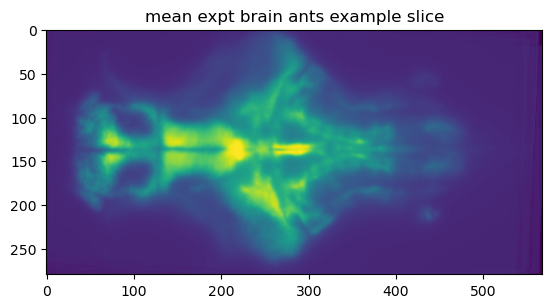

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

Loaded 110 warped region masks from: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/mapzebrain_to_mean_registration/01_regions_in_mean


CTRL:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_1603394/3984978603.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3984978603.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3984978603.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3984978603.py:62: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3984978603.py:62: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3984978603.py:62: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3984978603.py:63: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3984978603.py:63: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3984978603.py:63: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3984978603.py:64: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3984978603.py:108: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1603394/3984978603.py:108: RuntimeWarning: invalid value encoun

✅ CTRL: processed 7/7 fish with valid data.


HCRT-TRPV1:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_1603394/3984978603.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3984978603.py:62: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3984978603.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3984978603.py:63: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3984978603.py:62: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3984978603.py:108: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1603394/3984978603.py:63: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3984978603.py:108: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1603394/3984978603.py:64: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3984978603.py:108: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1603394/3984978603.py:64: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3984978603.py:108: Runtim

✅ HCRT-TRPV1: processed 7/7 fish with valid data.

Top 20 regions by |Δd'| (HCRT-TRPV1 vs CTRL):
 1. rostral_hypothalamus            CTRL=(-0.041448, -0.073)  HCRT-TRPV1=(+0.114614, +0.031)  |Δd'|=0.104
 2. lateral_reticular_nucleus       CTRL=(-0.379768, +0.038)  HCRT-TRPV1=(-0.658340, -0.066)  |Δd'|=0.103
 3. oculomotor_nucleus              CTRL=(-0.248600, +0.009)  HCRT-TRPV1=(-0.319622, +0.106)  |Δd'|=0.097
 4. locus_coeruleus                 CTRL=(-0.229227, -0.024)  HCRT-TRPV1=(-0.142497, +0.070)  |Δd'|=0.094
 5. trochlear_motor_nucleus         CTRL=(-0.210985, +0.001)  HCRT-TRPV1=(-0.324133, +0.079)  |Δd'|=0.078
 6. nucleus_of_the_medial_longitudinal_fascicle_(pretectum,_basal_part)  CTRL=(-0.079700, +0.005)  HCRT-TRPV1=(-0.301388, +0.076)  |Δd'|=0.071
 7. interpeduncular_nucleus         CTRL=(-0.236736, +0.005)  HCRT-TRPV1=(-0.507892, +0.070)  |Δd'|=0.065
 8. posterior_lateral_line_ganglion  CTRL=(+0.128451, -0.003)  HCRT-TRPV1=(-0.251546, -0.067)  |Δd'|=0.064
 9. olfactory_bul

/tmp/ipykernel_1603394/3984978603.py:286: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("gist_ncar", n_colors)



✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/Quadrant_top20_phasicShift_signed_dR2_vs_dprime_iaaft_nullp95.png


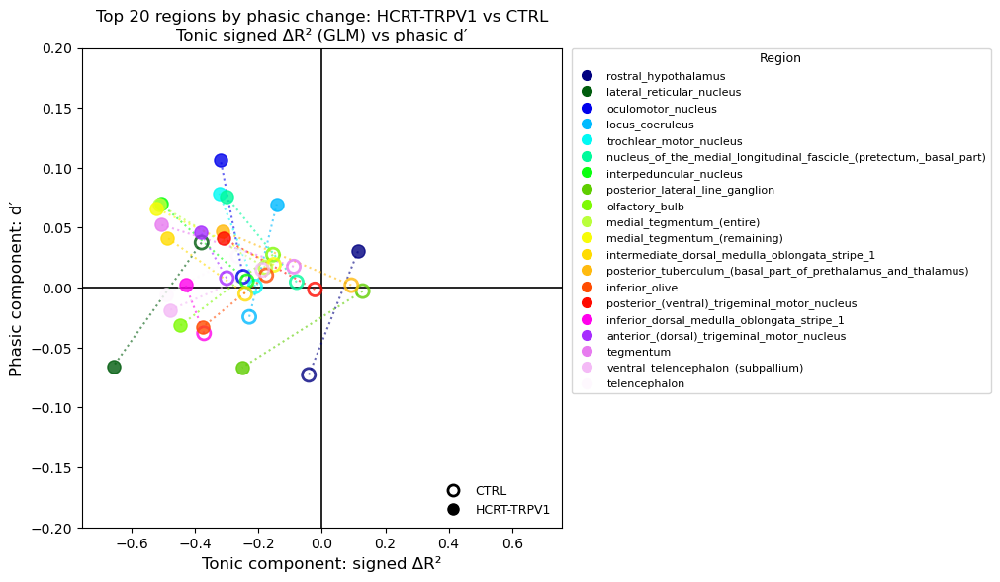

In [23]:
import os, glob, gc
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.lines import Line2D

# ============================================================
# Quadrant plot: top regions by PHASIC change
#   selection = largest |Δd'| between CTRL and EXPT
#   x-axis = tonic slow component (signed ΔR² from GLM)
#   y-axis = phasic fast component (d′; signed)
# ============================================================

# =========================
# USER SETTINGS
# =========================
DIR_REG_ROOT = os.path.join(dir_ants_output, combine_proj_ID, "mapzebrain_to_mean_registration")
dir_regions_w = os.path.join(DIR_REG_ROOT, "01_regions_in_mean")

F_NAME_COORDS = "transformed_all_cells_meanbrain.npy"
F_NAME_PHASIC = "data_array_f_phasic.npy"
F_NAME_DR2 = "kernel_delta_r2_fit.npy"

FRAME_RATE_HZ = float(volume_per_sec)
BASELINE_MIN_PAIR_PHASIC = (baseline_start / 60 / volume_per_sec + 15, baseline_end / 60 / volume_per_sec)
DRUG_MIN_PAIR_PHASIC     = (drug_start / 60 / volume_per_sec + 15, drug_end / 60 / volume_per_sec + 15)

REGION_NAME_WHITELIST = None
param_folder_name = f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}"

TOP_N_SHIFT = 20

TITLE = f"Top {TOP_N_SHIFT} regions by phasic change: {EXPT_TAG} vs {CTRL_TAG}\nTonic signed ΔR² (GLM) vs phasic d′"
OUT_NAME = f"Quadrant_top{TOP_N_SHIFT}_phasicShift_signed_dR2_vs_dprime_{NULL_TAG}_nullp{RESPONDER_NULL_THRESH}.png"

MARKER_SIZE = 90

# =========================
# HELPERS
# =========================
def _min_to_idx(minutes, fs_hz):
    return int(np.round(minutes * 60.0 * fs_hz))

def _safe_load(path, mmap_mode=None):
    if not os.path.exists(path):
        return None
    return np.load(path, mmap_mode=mmap_mode)

def _finite_1d(x):
    x = np.asarray(x).reshape(-1)
    return x[np.isfinite(x)]

def dprime_per_cell(Fphasic, idx_base, idx_drug, var_floor=1e-4, eps_var=1e-8):
    A = np.asarray(Fphasic, dtype=np.float32)
    base = A[:, idx_base]
    drug = A[:, idx_drug]

    if base.shape[1] < 2 or drug.shape[1] < 2:
        return np.full((A.shape[0],), np.nan, dtype=np.float32)

    mu_b = np.nanmean(base, axis=1)
    mu_d = np.nanmean(drug, axis=1)
    var_b = np.nanvar(base, axis=1, ddof=1)
    var_d = np.nanvar(drug, axis=1, ddof=1)

    var_b = np.maximum(var_b, var_floor)
    var_d = np.maximum(var_d, var_floor)

    denom = np.sqrt((var_b + var_d) / 2.0 + eps_var).astype(np.float32)
    d = (mu_d - mu_b) / denom
    d[~np.isfinite(d)] = np.nan
    return d.astype(np.float32)

def load_warped_region_masks(dir_regions_w, mean_shape_xyz, whitelist=None):
    import ants

    fps = sorted(glob.glob(os.path.join(dir_regions_w, "*_in_mean_space.nii.gz")))
    if len(fps) == 0:
        raise FileNotFoundError(f"No warped region masks found in: {dir_regions_w}")

    out = []
    for fp in fps:
        name = os.path.basename(fp).replace("_in_mean_space.nii.gz", "")
        if whitelist is not None and name not in whitelist:
            continue

        img = ants.image_read(fp)
        arr = img.numpy()

        if arr.shape != mean_shape_xyz:
            raise ValueError(f"Region mask shape mismatch for {name}: {arr.shape} != mean {mean_shape_xyz}")

        m = arr > 0
        if np.any(m):
            out.append((name, m))

    if len(out) == 0:
        raise RuntimeError("After filtering, no non-empty region masks remain.")

    return out

def coords_to_int_vox(coords, mean_shape_xyz):
    c = np.asarray(coords)
    if c.ndim != 2 or c.shape[1] != 3:
        raise ValueError(f"coords must be (N,3), got {c.shape}")

    X, Y, Z = mean_shape_xyz
    ci = np.rint(c).astype(np.int32)
    ci[:, 0] = np.clip(ci[:, 0], 0, X - 1)
    ci[:, 1] = np.clip(ci[:, 1], 0, Y - 1)
    ci[:, 2] = np.clip(ci[:, 2], 0, Z - 1)
    return ci

def build_signed_dr2_array(dR2, pos_idx, neg_idx):
    dR2 = np.asarray(dR2).reshape(-1).astype(np.float32)
    signed = np.full(dR2.shape, np.nan, dtype=np.float32)

    pos_idx = np.asarray(pos_idx, dtype=np.int64).reshape(-1)
    neg_idx = np.asarray(neg_idx, dtype=np.int64).reshape(-1)

    pos_idx = pos_idx[(pos_idx >= 0) & (pos_idx < dR2.size)]
    neg_idx = neg_idx[(neg_idx >= 0) & (neg_idx < dR2.size)]

    signed[pos_idx] =  dR2[pos_idx]
    signed[neg_idx] = -dR2[neg_idx]
    return signed

def summarize_region(reg_to_vals):
    out = {}
    for rname, vals in reg_to_vals.items():
        v = _finite_1d(vals)
        out[rname] = dict(mean=float(np.nanmean(v)) if v.size else np.nan,
                          n=int(v.size))
    return out

# =========================
# PREP
# =========================
mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)
mean_shape_xyz = tuple(map(int, mean_img.shape))

regions = load_warped_region_masks(
    dir_regions_w=dir_regions_w,
    mean_shape_xyz=mean_shape_xyz,
    whitelist=REGION_NAME_WHITELIST,
)
print(f"Loaded {len(regions)} warped region masks from: {dir_regions_w}")

base0 = _min_to_idx(BASELINE_MIN_PAIR_PHASIC[0], FRAME_RATE_HZ)
base1 = _min_to_idx(BASELINE_MIN_PAIR_PHASIC[1], FRAME_RATE_HZ)
drug0 = _min_to_idx(DRUG_MIN_PAIR_PHASIC[0], FRAME_RATE_HZ)
drug1 = _min_to_idx(DRUG_MIN_PAIR_PHASIC[1], FRAME_RATE_HZ)
idx_base = slice(base0, base1)
idx_drug = slice(drug0, drug1)

def process_one_fish_region_means(expt_ID):
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    run_dir = dir_expt / "glm" / param_folder_name

    coords = _safe_load(str(dir_expt / F_NAME_COORDS))
    Fp     = _safe_load(str(dir_expt / F_NAME_PHASIC), mmap_mode="r")
    dR2    = _safe_load(str(run_dir / F_NAME_DR2))

    pos_idx = _safe_load(str(dir_expt / f"tonic_pos_glm_{NULL_TAG}_nullp{RESPONDER_NULL_THRESH}_idxs.npy"))
    neg_idx = _safe_load(str(dir_expt / f"tonic_neg_glm_{NULL_TAG}_nullp{RESPONDER_NULL_THRESH}_idxs.npy"))

    if coords is None or Fp is None or dR2 is None or pos_idx is None or neg_idx is None:
        return expt_ID, None
    if Fp.ndim != 2 or dR2.ndim != 1:
        return expt_ID, None
    if coords.ndim != 2 or coords.shape[1] != 3:
        return expt_ID, None
    if Fp.shape[0] != coords.shape[0] or dR2.shape[0] != coords.shape[0]:
        return expt_ID, None

    n_cells, T = Fp.shape
    b0 = max(0, min(T, idx_base.start)); b1 = max(0, min(T, idx_base.stop))
    d0 = max(0, min(T, idx_drug.start)); d1 = max(0, min(T, idx_drug.stop))
    if (b1 - b0) < 2 or (d1 - d0) < 2:
        return expt_ID, None

    dprime = dprime_per_cell(Fp, slice(b0, b1), slice(d0, d1))
    signed_dR2 = build_signed_dr2_array(dR2, pos_idx, neg_idx)

    good = np.isfinite(dprime) & np.isfinite(signed_dR2)
    if not np.any(good):
        return expt_ID, None

    ci = coords_to_int_vox(coords, mean_shape_xyz)
    xi, yi, zi = ci[:, 0], ci[:, 1], ci[:, 2]

    out = {}
    for rname, rmask in regions:
        in_reg = rmask[xi, yi, zi]
        sel = good & in_reg
        if np.any(sel):
            out[rname] = dict(
                dr2_mean=float(np.nanmean(signed_dR2[sel])),
                dprime_mean=float(np.nanmean(dprime[sel])),
                n_cells=int(np.sum(sel)),
            )
        else:
            out[rname] = dict(dr2_mean=np.nan, dprime_mean=np.nan, n_cells=0)

    del coords, dprime, signed_dR2, Fp, dR2, pos_idx, neg_idx
    gc.collect()
    return expt_ID, out

def run_group(expt_list, group_name, n_jobs=10):
    from joblib import Parallel, delayed
    from tqdm.auto import tqdm

    results = Parallel(n_jobs=n_jobs, backend="loky")(
        delayed(process_one_fish_region_means)(expt_ID)
        for expt_ID in tqdm(expt_list, desc=group_name)
    )

    reg_to_dr2 = {rname: [] for rname, _ in regions}
    reg_to_dps = {rname: [] for rname, _ in regions}
    reg_to_n   = {rname: [] for rname, _ in regions}

    ok_fish = 0
    for expt_ID, per_reg in results:
        if per_reg is None:
            continue
        ok_fish += 1
        for rname in reg_to_dr2.keys():
            reg_to_dr2[rname].append(per_reg[rname]["dr2_mean"])
            reg_to_dps[rname].append(per_reg[rname]["dprime_mean"])
            reg_to_n[rname].append(per_reg[rname]["n_cells"])

    print(f"✅ {group_name}: processed {ok_fish}/{len(expt_list)} fish with valid data.")
    return reg_to_dr2, reg_to_dps, reg_to_n

N_JOBS = 25
ctrl_dr2, ctrl_dps, ctrl_n = run_group(ctrl_expt_ID_list, CTRL_TAG, n_jobs=N_JOBS)
hcrt_dr2, hcrt_dps, hcrt_n = run_group(hcrt_expt_ID_list, EXPT_TAG, n_jobs=N_JOBS)

ctrl_dr2_s = summarize_region(ctrl_dr2)
ctrl_dp_s  = summarize_region(ctrl_dps)
hcrt_dr2_s = summarize_region(hcrt_dr2)
hcrt_dp_s  = summarize_region(hcrt_dps)

# =========================
# SELECT TOP REGIONS BY |Δd'|
# =========================
shift_rows = []
for rname, _ in regions:
    x_ctrl = ctrl_dr2_s[rname]["mean"]
    y_ctrl = ctrl_dp_s[rname]["mean"]
    x_expt = hcrt_dr2_s[rname]["mean"]
    y_expt = hcrt_dp_s[rname]["mean"]

    if not (np.isfinite(x_ctrl) and np.isfinite(y_ctrl) and np.isfinite(x_expt) and np.isfinite(y_expt)):
        continue

    shift = abs(y_expt - y_ctrl)  # phasic-only selection
    shift_rows.append((rname, x_ctrl, y_ctrl, x_expt, y_expt, shift))

shift_rows.sort(key=lambda r: r[5], reverse=True)
top_rows = shift_rows[:TOP_N_SHIFT]

if len(top_rows) == 0:
    raise RuntimeError("No regions had finite CTRL and EXPT coordinates.")

print(f"\nTop {len(top_rows)} regions by |Δd'| ({EXPT_TAG} vs {CTRL_TAG}):")
for i, (rname, x_ctrl, y_ctrl, x_expt, y_expt, shift) in enumerate(top_rows, start=1):
    print(
        f"{i:2d}. {rname:30s}  "
        f"{CTRL_TAG}=({x_ctrl:+.6f}, {y_ctrl:+.3f})  "
        f"{EXPT_TAG}=({x_expt:+.6f}, {y_expt:+.3f})  "
        f"|Δd'|={shift:.3f}"
    )

# =========================
# PLOT
# =========================
fig, ax = plt.subplots(figsize=(10, 8), layout="constrained")
ax.axhline(0, color="black", lw=1.2)
ax.axvline(0, color="black", lw=1.2)
DOT_ALPHA = 0.8
LINE_ALPHA = 0.6
LINE_WIDTH = 1.5

n_colors = max(len(top_rows), 1)
cmap = plt.cm.get_cmap("gist_ncar", n_colors)

region_handles = []

for i, (rname, x_ctrl, y_ctrl, x_expt, y_expt, shift) in enumerate(top_rows):
    color = cmap(i)

    ax.plot(
        [x_ctrl, x_expt],
        [y_ctrl, y_expt],
        color=color,
        linewidth=LINE_WIDTH,
        alpha=LINE_ALPHA,
        linestyle=":",
        zorder=2
    )

    ax.scatter(
        x_ctrl, y_ctrl,
        s=MARKER_SIZE,
        facecolors="none",
        edgecolors=color,
        linewidths=2,
        alpha=DOT_ALPHA,
        zorder=3,
    )

    ax.scatter(
        x_expt, y_expt,
        s=MARKER_SIZE,
        color=color,
        edgecolors=color,
        alpha=DOT_ALPHA,
        zorder=4,
    )

    region_handles.append(
        Line2D([0], [0], marker='o', linestyle='None',
               markerfacecolor=color, markeredgecolor=color,
               markersize=7, label=rname)
    )

legend_handles = [
    Line2D([0], [0], marker='o', linestyle='None', markerfacecolor='none',
           markeredgecolor='black', markeredgewidth=2, markersize=8, label=CTRL_TAG),
    Line2D([0], [0], marker='o', linestyle='None', markerfacecolor='black',
           markeredgecolor='black', markersize=8, label=EXPT_TAG),
]

ax.set_xlabel("Tonic component: signed ΔR²", fontsize=12)
ax.set_ylabel("Phasic component: d′", fontsize=12)
ax.set_title(TITLE)

all_x = _finite_1d([r[1] for r in top_rows] + [r[3] for r in top_rows])
all_y = _finite_1d([r[2] for r in top_rows] + [r[4] for r in top_rows])

if all_x.size and all_y.size:
    xlim = max(0.001, float(np.nanpercentile(np.abs(all_x), 100)) * 1.15)
    ylim = max(0.2,   float(np.nanpercentile(np.abs(all_y), 100)) * 1.15)
    ax.set_xlim(-xlim, xlim)
    ax.set_ylim(-ylim, ylim)

ax.set_box_aspect(1)

marker_legend = ax.legend(
    handles=legend_handles,
    frameon=False,
    loc="lower right",
    fontsize=9,
)
ax.add_artist(marker_legend)

region_legend = ax.legend(
    handles=region_handles,
    title="Region",
    frameon=True,
    loc="upper left",
    bbox_to_anchor=(1.02, 1.0),
    borderaxespad=0.0,
    fontsize=8,
    title_fontsize=9,
)

fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)
out_path = fig_dir / OUT_NAME
plt.savefig(out_path, dpi=300, bbox_inches="tight")
print(f"\n✅ Saved: {out_path}")

plt.show()

## Intensity Map for the top d' change regions

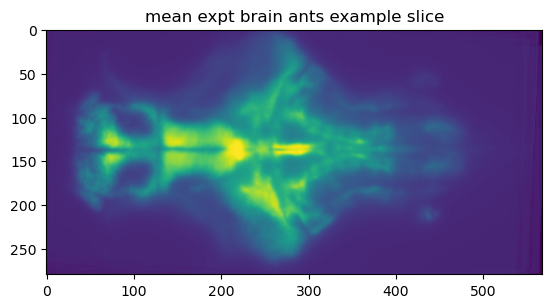

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

Loaded 110 warped region masks from: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/mapzebrain_to_mean_registration/01_regions_in_mean
📏 Recording duration (min): min=120.0, p10=120.0, median=120.0
Plan: 13 phasic windows: ['0 - 10 min', '5 - 15 min', '10 - 20 min', '15 - 25 min', '20 - 30 min', '25 - 35 min', '30 - 40 min', '35 - 45 min', '40 - 50 min', '45 - 55 min', '50 - 60 min', '55 - 65 min', '60 - 70 min']


CTRL region-summary:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:203: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:203: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:203: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:204: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:204: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/3819328901.py:205: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:204: RuntimeWarning: Degrees of 

✅ CTRL: processed 7/7 fish with valid region summaries.


HCRT-TRPV1 region-summary:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:203: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:203: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:204: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/3819328901.py:203: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:204: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:205: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered

✅ HCRT-TRPV1: processed 7/7 fish with valid region summaries.

Top 20 regions by |Δd′| (HCRT-TRPV1 - CTRL):
 1. oculomotor_nucleus             CTRL=+0.027 HCRT-TRPV1=+0.104 Δd′=+0.077 |Δd′|=0.077
 2. locus_coeruleus                CTRL=-0.002 HCRT-TRPV1=+0.074 Δd′=+0.076 |Δd′|=0.076
 3. interpeduncular_nucleus        CTRL=+0.023 HCRT-TRPV1=+0.098 Δd′=+0.075 |Δd′|=0.075
 4. medial_tegmentum_(entire)      CTRL=+0.036 HCRT-TRPV1=+0.105 Δd′=+0.069 |Δd′|=0.069
 5. medial_tegmentum_(remaining)   CTRL=+0.038 HCRT-TRPV1=+0.106 Δd′=+0.068 |Δd′|=0.068
 6. trochlear_motor_nucleus        CTRL=+0.029 HCRT-TRPV1=+0.097 Δd′=+0.067 |Δd′|=0.067
 7. rostral_hypothalamus           CTRL=-0.015 HCRT-TRPV1=+0.049 Δd′=+0.063 |Δd′|=0.063
 8. nucleus_of_the_medial_longitudinal_fascicle_(pretectum,_basal_part) CTRL=+0.023 HCRT-TRPV1=+0.086 Δd′=+0.063 |Δd′|=0.063
 9. epiphysis                      CTRL=+0.093 HCRT-TRPV1=+0.033 Δd′=-0.060 |Δd′|=0.060
10. retinal_arborization_field_2   CTRL=-0.018 HCRT-TRPV1=+0.03

CTRL maps:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:203: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:203: Ru

✅ Done: CTRL | pos-region-set n=16 | neg-region-set n=4

🚀 Processing 7 fish for HCRT-TRPV1 time-resolved region-union maps...


/tmp/ipykernel_1996390/3819328901.py:575: RuntimeWarning: Mean of empty slice
  m = np.nanmean(stack, axis=0).astype(np.float32)
/tmp/ipykernel_1996390/3819328901.py:582: RuntimeWarning: Mean of empty slice
  m = np.nanmean(stack, axis=0).astype(np.float32)


HCRT-TRPV1 maps:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:115: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:202: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:203: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1996390/3819328901.py:203: Ru

✅ Done: HCRT-TRPV1 | pos-region-set n=16 | neg-region-set n=4

✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/Phasic_dprime_Top20_ShiftRegions_PosNeg_MapsOverTime.png


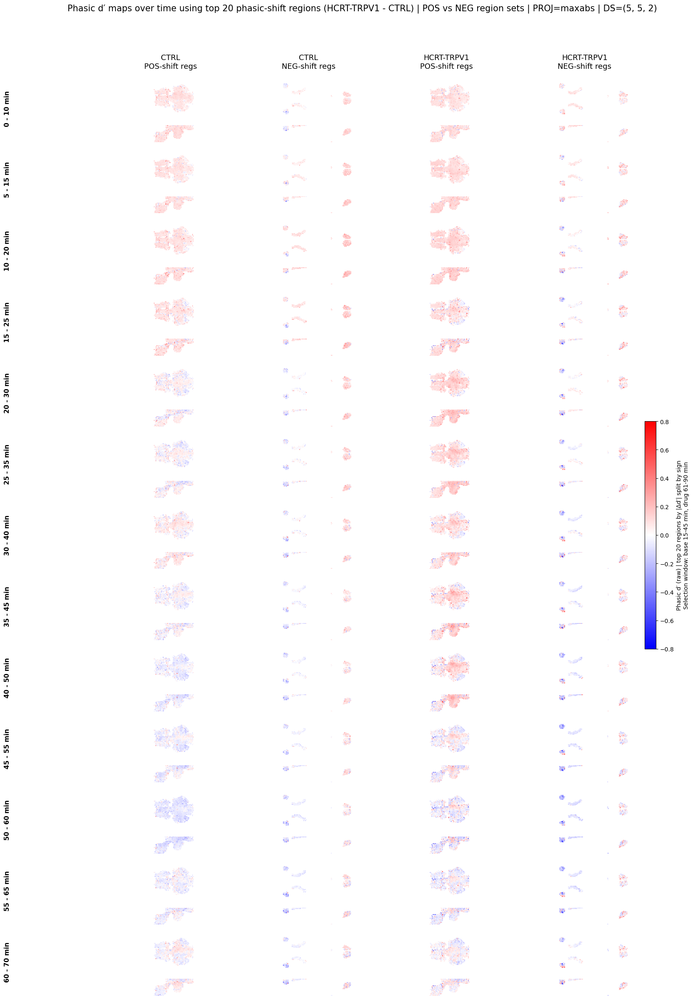

In [17]:
import os
import gc
import glob
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.gridspec import GridSpec
from joblib import Parallel, delayed
from tqdm.auto import tqdm

# ============================================================
# PHASIC d′ MAPS OVER TIME, RESTRICTED TO TOP REGION SETS
#
# Workflow:
#   1) Load warped MapZebrain region masks in mean-brain space
#   2) Compute region-level phasic d′ means per fish
#   3) Rank regions by |Δd′| = |EXPT - CTRL|
#   4) Take TOP_N_SHIFT regions, split into positive-shift and negative-shift
#   5) Build time-resolved d′ maps using only cells inside:
#         - union(pos-shift regions)
#         - union(neg-shift regions)
#
# Output columns:
#   CTRL  | POS-SHIFT REGIONS
#   CTRL  | NEG-SHIFT REGIONS
#   EXPT  | POS-SHIFT REGIONS
#   EXPT  | NEG-SHIFT REGIONS
# ============================================================

# =========================
# USER SETTINGS
# =========================
DIR_REG_ROOT = os.path.join(dir_ants_output, combine_proj_ID, "mapzebrain_to_mean_registration")
DIR_REGIONS_W = os.path.join(DIR_REG_ROOT, "01_regions_in_mean")

F_NAME_COORDS = "transformed_all_cells_meanbrain.npy"
F_NAME_PHASIC = "data_array_f_phasic.npy"

# ---------- selection of top regions ----------
TOP_N_SHIFT = 20

# selection window used to define the top regions
# Keep this aligned with the phasic summary logic you trust.
REGION_SELECT_BASELINE_MIN_PAIR = (
    baseline_start / 60.0 / volume_per_sec + 15.0,
    baseline_end   / 60.0 / volume_per_sec
)
REGION_SELECT_DRUG_MIN_PAIR = (
    drug_start / 60.0 / volume_per_sec + 15.0,
    drug_end   / 60.0 / volume_per_sec
)

# ---------- time-resolved map windowing ----------
FRAME_RATE_HZ = float(volume_per_sec)

BASELINE_START_MIN = baseline_start / 60.0 / volume_per_sec
BASELINE_END_MIN   = baseline_end   / 60.0 / volume_per_sec
DRUG_START_MIN     = drug_start     / 60.0 / volume_per_sec
WASH_END_MIN       = wash_end       / 60.0 / volume_per_sec

BASELINE_OFFSET_MIN = 15.0
WINDOW_DURATION_MIN = 10.0
WINDOW_STEP_MIN     = 5.0

# ---------- d′ settings ----------
DPRIME_CLIP_ABS = 1.5
AMPLITUDE_MODE  = "raw"   # "raw", "abs", "rms"
EPS_VAR = 1e-8
VAR_FLOOR = 1e-4

# ---------- plotting ----------
DS = (5, 5, 2)
ROTATE_XY_MINUS_90 = True
N_JOBS = 25
PROJ_MODE = "maxabs"      # use "maxabs" because mean projection washed out your maps
INTERPOLATION = "nearest"
vmin, vmax = -0.8, 0.8
cmap = "bwr"

OUT_NAME = f"Phasic_dprime_Top{TOP_N_SHIFT}_ShiftRegions_PosNeg_MapsOverTime.png"

# =========================
# HELPERS
# =========================
def _safe_load(path, mmap_mode=None):
    if not os.path.exists(path):
        return None
    return np.load(path, mmap_mode=mmap_mode)

def _min_to_idx(minutes, fs_hz):
    return int(np.round(minutes * 60.0 * fs_hz))

def _coarse_shape(brain_shape, ds):
    brain_shape = np.array(brain_shape, dtype=int)
    ds = np.array(ds, dtype=int)
    return tuple(((brain_shape + ds - 1) // ds).astype(int))

def _mean_brain_shape(combine_proj_ID):
    mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)
    return tuple(map(int, mean_img.shape))

def _rotate(arr):
    return np.rot90(arr, k=3) if ROTATE_XY_MINUS_90 else arr

def _finite_1d(x):
    x = np.asarray(x).reshape(-1)
    return x[np.isfinite(x)]

def coords_to_int_vox(coords, mean_shape_xyz):
    c = np.asarray(coords)
    if c.ndim != 2 or c.shape[1] != 3:
        raise ValueError(f"coords must be (N,3), got {c.shape}")

    X, Y, Z = mean_shape_xyz
    ci = np.rint(c).astype(np.int32)
    ci[:, 0] = np.clip(ci[:, 0], 0, X - 1)
    ci[:, 1] = np.clip(ci[:, 1], 0, Y - 1)
    ci[:, 2] = np.clip(ci[:, 2], 0, Z - 1)
    return ci

def _voxelize_cell_values(coords, vals, brain_shape, ds):
    coords = np.asarray(coords)
    vals = np.asarray(vals)

    mask = np.isfinite(vals) & (~np.isnan(coords).any(axis=1))
    coords = coords[mask]
    vals = vals[mask]

    X, Y, Z = brain_shape
    inb = (
        (coords[:, 0] >= 0) & (coords[:, 0] < X) &
        (coords[:, 1] >= 0) & (coords[:, 1] < Y) &
        (coords[:, 2] >= 0) & (coords[:, 2] < Z)
    )
    coords = coords[inb]
    vals = vals[inb]

    if coords.shape[0] == 0:
        return None

    ds = np.array(ds, dtype=int)
    Xc, Yc, Zc = _coarse_shape((X, Y, Z), ds)

    cidx = np.floor(coords / ds).astype(int)
    cidx[:, 0] = np.clip(cidx[:, 0], 0, Xc - 1)
    cidx[:, 1] = np.clip(cidx[:, 1], 0, Yc - 1)
    cidx[:, 2] = np.clip(cidx[:, 2], 0, Zc - 1)

    lin = (cidx[:, 0] * (Yc * Zc) + cidx[:, 1] * Zc + cidx[:, 2]).astype(np.int64)
    nvox = Xc * Yc * Zc

    sumv = np.zeros(nvox, dtype=np.float64)
    cntv = np.zeros(nvox, dtype=np.int64)

    np.add.at(sumv, lin, vals.astype(np.float64))
    np.add.at(cntv, lin, 1)

    out = np.full(nvox, np.nan, dtype=np.float32)
    m = cntv > 0
    out[m] = (sumv[m] / cntv[m]).astype(np.float32)
    return out.reshape((Xc, Yc, Zc))

def _proj(vol, axis, mode="mean"):
    if mode == "mean":
        return np.nanmean(vol, axis=axis)

    if mode == "max":
        return np.nanmax(vol, axis=axis)

    if mode == "maxabs":
        a = np.abs(vol)
        a = np.where(np.isfinite(a), a, -np.inf)
        if np.all(~np.isfinite(a)):
            shape = list(vol.shape)
            del shape[axis]
            return np.full(shape, np.nan, dtype=np.float32)
        idx = np.argmax(a, axis=axis)
        vol0 = np.where(np.isfinite(vol), vol, np.nan)
        take = np.take_along_axis(vol0, np.expand_dims(idx, axis=axis), axis=axis)
        return np.squeeze(take, axis=axis)

    raise ValueError(f"Unknown PROJ_MODE: {mode}")

def _amplitude_transform(Fph, mode):
    if mode == "raw":
        return Fph
    if mode == "abs":
        return np.abs(Fph)
    if mode == "rms":
        return Fph ** 2
    raise ValueError(f"Unknown AMPLITUDE_MODE: {mode}")

def dprime_per_cell(Fphasic, idx_base, idx_drug, mode="raw", clip_abs=None):
    A = _amplitude_transform(np.asarray(Fphasic, dtype=np.float32), mode)

    base = A[:, idx_base]
    drug = A[:, idx_drug]

    if base.shape[1] < 2 or drug.shape[1] < 2:
        return np.full((A.shape[0],), np.nan, dtype=np.float32)

    mu_b = np.nanmean(base, axis=1)
    mu_d = np.nanmean(drug, axis=1)
    var_b = np.nanvar(base, axis=1, ddof=1)
    var_d = np.nanvar(drug, axis=1, ddof=1)

    var_b = np.maximum(var_b, VAR_FLOOR)
    var_d = np.maximum(var_d, VAR_FLOOR)

    denom = np.sqrt((var_b + var_d) / 2.0 + EPS_VAR).astype(np.float32)
    d = (mu_d - mu_b) / denom
    d[~np.isfinite(d)] = np.nan
    d[denom <= 0] = np.nan

    if clip_abs is not None:
        d = np.clip(d, -clip_abs, clip_abs)

    return d.astype(np.float32)

def load_warped_region_masks(dir_regions_w, mean_shape_xyz):
    import ants

    fps = sorted(glob.glob(os.path.join(dir_regions_w, "*_in_mean_space.nii.gz")))
    if len(fps) == 0:
        raise FileNotFoundError(f"No warped region masks found in: {dir_regions_w}")

    out = []
    for fp in fps:
        name = os.path.basename(fp).replace("_in_mean_space.nii.gz", "")
        img = ants.image_read(fp)
        arr = img.numpy()

        if arr.shape != mean_shape_xyz:
            raise ValueError(f"Region mask shape mismatch for {name}: {arr.shape} != mean {mean_shape_xyz}")

        m = arr > 0
        if np.any(m):
            out.append((name, m))

    if len(out) == 0:
        raise RuntimeError("No non-empty warped region masks found.")
    return out

def summarize_region(reg_to_vals):
    out = {}
    for rname, vals in reg_to_vals.items():
        v = _finite_1d(vals)
        out[rname] = dict(
            mean=float(np.nanmean(v)) if v.size else np.nan,
            n=int(v.size)
        )
    return out

# =========================
# PREP
# =========================
brain_shape = _mean_brain_shape(combine_proj_ID)
Xc, Yc, Zc = _coarse_shape(brain_shape, DS)

regions = load_warped_region_masks(DIR_REGIONS_W, brain_shape)
print(f"Loaded {len(regions)} warped region masks from: {DIR_REGIONS_W}")

# selection slices
sel_base0 = _min_to_idx(REGION_SELECT_BASELINE_MIN_PAIR[0], FRAME_RATE_HZ)
sel_base1 = _min_to_idx(REGION_SELECT_BASELINE_MIN_PAIR[1], FRAME_RATE_HZ)
sel_drug0 = _min_to_idx(REGION_SELECT_DRUG_MIN_PAIR[0], FRAME_RATE_HZ)
sel_drug1 = _min_to_idx(REGION_SELECT_DRUG_MIN_PAIR[1], FRAME_RATE_HZ)
idx_base_sel = slice(sel_base0, sel_base1)
idx_drug_sel = slice(sel_drug0, sel_drug1)

# map baseline slice
map_base0 = _min_to_idx(BASELINE_START_MIN + BASELINE_OFFSET_MIN, FRAME_RATE_HZ)
map_base1 = _min_to_idx(BASELINE_END_MIN, FRAME_RATE_HZ)
baseline_slice = slice(map_base0, map_base1)

# window plan
def _get_n_frames(expt_ID):
    p = Path(dir_ants_output) / proj_ID / expt_ID / F_NAME_PHASIC
    if not p.exists():
        return None
    x = np.load(p, mmap_mode="r")
    if x.ndim != 2:
        return None
    return int(x.shape[1])

all_expts = list(ctrl_expt_ID_list) + list(hcrt_expt_ID_list)
nframes_list = [nf for nf in (_get_n_frames(e) for e in all_expts) if nf is not None]
if len(nframes_list) == 0:
    raise RuntimeError("No phasic trace files found to determine recording length.")

nframes_arr = np.asarray(nframes_list, dtype=float)
dur_mins = nframes_arr / FRAME_RATE_HZ / 60.0
min_dur_min = float(np.nanmin(dur_mins))
p10_dur_min = float(np.nanpercentile(dur_mins, 10))
med_dur_min = float(np.nanmedian(dur_mins))

print(f"📏 Recording duration (min): min={min_dur_min:.1f}, p10={p10_dur_min:.1f}, median={med_dur_min:.1f}")

WASH_END_MIN_EFF = min(WASH_END_MIN, p10_dur_min)
if WASH_END_MIN_EFF < WASH_END_MIN:
    print(f"⚠️ Capping WASH_END_MIN from {WASH_END_MIN:.1f} -> {WASH_END_MIN_EFF:.1f}")

last_start_min = WASH_END_MIN_EFF - WINDOW_DURATION_MIN
comp_start_times = np.arange(DRUG_START_MIN, last_start_min + 1e-9, WINDOW_STEP_MIN)

window_slices = []
window_labels = []
for t_start in comp_start_times:
    t_end = t_start + WINDOW_DURATION_MIN
    s_idx = _min_to_idx(t_start, FRAME_RATE_HZ)
    e_idx = _min_to_idx(t_end, FRAME_RATE_HZ)
    window_slices.append(slice(s_idx, e_idx))
    rel_start = t_start - DRUG_START_MIN
    rel_end   = t_end   - DRUG_START_MIN
    window_labels.append(f"{int(round(rel_start))} - {int(round(rel_end))} min")

n_windows = len(window_slices)
print(f"Plan: {n_windows} phasic windows: {window_labels}")

# =========================
# STEP 1: REGION-LEVEL d′ TO CHOOSE TOP REGIONS
# =========================
def process_one_fish_region_means(expt_ID):
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID

    coords = _safe_load(str(dir_expt / F_NAME_COORDS))
    Fp     = _safe_load(str(dir_expt / F_NAME_PHASIC), mmap_mode="r")

    if coords is None or Fp is None:
        return expt_ID, None
    if coords.ndim != 2 or coords.shape[1] != 3:
        return expt_ID, None
    if Fp.ndim != 2 or Fp.shape[0] != coords.shape[0]:
        return expt_ID, None

    T = Fp.shape[1]
    b0 = max(0, min(T, idx_base_sel.start)); b1 = max(0, min(T, idx_base_sel.stop))
    d0 = max(0, min(T, idx_drug_sel.start)); d1 = max(0, min(T, idx_drug_sel.stop))
    if (b1 - b0) < 2 or (d1 - d0) < 2:
        return expt_ID, None

    dprime = dprime_per_cell(
        Fp,
        slice(b0, b1),
        slice(d0, d1),
        mode=AMPLITUDE_MODE,
        clip_abs=DPRIME_CLIP_ABS
    )

    good = np.isfinite(dprime)
    if not np.any(good):
        return expt_ID, None

    ci = coords_to_int_vox(coords, brain_shape)
    xi, yi, zi = ci[:, 0], ci[:, 1], ci[:, 2]

    out = {}
    for rname, rmask in regions:
        in_reg = rmask[xi, yi, zi]
        sel = good & in_reg
        if np.any(sel):
            out[rname] = dict(
                dprime_mean=float(np.nanmean(dprime[sel])),
                n_cells=int(np.sum(sel)),
            )
        else:
            out[rname] = dict(
                dprime_mean=np.nan,
                n_cells=0,
            )

    del coords, Fp, dprime, ci
    gc.collect()
    return expt_ID, out

def run_region_summary_group(expt_list, group_name):
    results = Parallel(n_jobs=N_JOBS, backend="loky")(
        delayed(process_one_fish_region_means)(expt_ID)
        for expt_ID in tqdm(expt_list, desc=f"{group_name} region-summary")
    )

    reg_to_dps = {rname: [] for rname, _ in regions}
    reg_to_n   = {rname: [] for rname, _ in regions}

    ok_fish = 0
    for expt_ID, per_reg in results:
        if per_reg is None:
            continue
        ok_fish += 1
        for rname in reg_to_dps.keys():
            reg_to_dps[rname].append(per_reg[rname]["dprime_mean"])
            reg_to_n[rname].append(per_reg[rname]["n_cells"])

    print(f"✅ {group_name}: processed {ok_fish}/{len(expt_list)} fish with valid region summaries.")
    return reg_to_dps, reg_to_n

ctrl_dps, ctrl_n = run_region_summary_group(ctrl_expt_ID_list, CTRL_TAG)
expt_dps, expt_n = run_region_summary_group(hcrt_expt_ID_list, EXPT_TAG)

ctrl_dp_s = summarize_region(ctrl_dps)
expt_dp_s = summarize_region(expt_dps)

# rank by absolute shift
shift_rows = []
for rname, _ in regions:
    y_ctrl = ctrl_dp_s[rname]["mean"]
    y_expt = expt_dp_s[rname]["mean"]
    if not (np.isfinite(y_ctrl) and np.isfinite(y_expt)):
        continue
    shift = y_expt - y_ctrl
    shift_rows.append((rname, y_ctrl, y_expt, shift, abs(shift)))

shift_rows.sort(key=lambda r: r[4], reverse=True)
top_rows = shift_rows[:TOP_N_SHIFT]

if len(top_rows) == 0:
    raise RuntimeError("No finite region-level d′ values found for selecting top regions.")

pos_region_names = [r[0] for r in top_rows if r[3] > 0]
neg_region_names = [r[0] for r in top_rows if r[3] < 0]

print(f"\nTop {len(top_rows)} regions by |Δd′| ({EXPT_TAG} - {CTRL_TAG}):")
for i, (rname, y_ctrl, y_expt, shift, absshift) in enumerate(top_rows, start=1):
    print(
        f"{i:2d}. {rname:30s} "
        f"{CTRL_TAG}={y_ctrl:+.3f} "
        f"{EXPT_TAG}={y_expt:+.3f} "
        f"Δd′={shift:+.3f} |Δd′|={absshift:.3f}"
    )

print(f"\nPOS-shift regions ({len(pos_region_names)}): {pos_region_names}")
print(f"NEG-shift regions ({len(neg_region_names)}): {neg_region_names}")

# build union masks
region_mask_dict = {rname: rmask for rname, rmask in regions}

pos_union_mask = np.zeros(brain_shape, dtype=bool)
for rname in pos_region_names:
    pos_union_mask |= region_mask_dict[rname]

neg_union_mask = np.zeros(brain_shape, dtype=bool)
for rname in neg_region_names:
    neg_union_mask |= region_mask_dict[rname]

if not np.any(pos_union_mask):
    print("⚠️ POS-shift region union mask is empty.")
if not np.any(neg_union_mask):
    print("⚠️ NEG-shift region union mask is empty.")

# =========================
# STEP 2: TIME-RESOLVED MAPS USING SELECTED REGION UNIONS
# =========================
def process_one_fish_all_windows_regionunions(
    expt_ID,
    brain_shape,
    ds,
    baseline_slice,
    window_slices,
    pos_union_mask,
    neg_union_mask,
    min_fraction_available=0.50,
):
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    coords = _safe_load(str(dir_expt / F_NAME_COORDS))
    Fp     = _safe_load(str(dir_expt / F_NAME_PHASIC), mmap_mode="r")

    empty = {
        "pos": [None] * len(window_slices),
        "neg": [None] * len(window_slices),
    }

    if coords is None or Fp is None:
        return empty
    if coords.ndim != 2 or coords.shape[1] != 3:
        return empty
    if Fp.ndim != 2 or Fp.shape[0] != coords.shape[0]:
        return empty

    n_cells, n_frames_total = Fp.shape

    # clip baseline
    b0, b1 = int(baseline_slice.start), int(baseline_slice.stop)
    if b0 >= n_frames_total or (b1 - b0) < 2:
        return empty
    b1 = min(b1, n_frames_total)
    baseline_slice_clipped = slice(b0, b1)

    ci = coords_to_int_vox(coords, brain_shape)
    xi, yi, zi = ci[:, 0], ci[:, 1], ci[:, 2]

    pos_region_cell_mask = pos_union_mask[xi, yi, zi]
    neg_region_cell_mask = neg_union_mask[xi, yi, zi]

    pos_volumes = []
    neg_volumes = []

    for w_slice in window_slices:
        start = int(w_slice.start)
        stop  = int(w_slice.stop)

        if start >= n_frames_total:
            pos_volumes.append(None)
            neg_volumes.append(None)
            continue

        if stop > n_frames_total:
            available = n_frames_total - start
            intended = stop - start
            if available < (min_fraction_available * intended):
                pos_volumes.append(None)
                neg_volumes.append(None)
                continue
            actual_slice = slice(start, n_frames_total)
        else:
            actual_slice = w_slice

        try:
            dvals = dprime_per_cell(
                Fp,
                baseline_slice_clipped,
                actual_slice,
                mode=AMPLITUDE_MODE,
                clip_abs=DPRIME_CLIP_ABS
            )

            if np.any(pos_region_cell_mask):
                dvals_pos = dvals.copy()
                dvals_pos[~pos_region_cell_mask] = np.nan
                vol_pos = _voxelize_cell_values(coords, dvals_pos, brain_shape, ds)
                pos_volumes.append(vol_pos if (vol_pos is not None and np.isfinite(vol_pos).any()) else None)
            else:
                pos_volumes.append(None)

            if np.any(neg_region_cell_mask):
                dvals_neg = dvals.copy()
                dvals_neg[~neg_region_cell_mask] = np.nan
                vol_neg = _voxelize_cell_values(coords, dvals_neg, brain_shape, ds)
                neg_volumes.append(vol_neg if (vol_neg is not None and np.isfinite(vol_neg).any()) else None)
            else:
                neg_volumes.append(None)

        except Exception:
            pos_volumes.append(None)
            neg_volumes.append(None)

    del coords, Fp, ci
    gc.collect()
    return {"pos": pos_volumes, "neg": neg_volumes}

def run_group_maps(expt_list, group_name):
    print(f"\n🚀 Processing {len(expt_list)} fish for {group_name} time-resolved region-union maps...")

    results = Parallel(n_jobs=N_JOBS, backend="loky")(
        delayed(process_one_fish_all_windows_regionunions)(
            expt_ID,
            brain_shape,
            DS,
            baseline_slice,
            window_slices,
            pos_union_mask,
            neg_union_mask,
        )
        for expt_ID in tqdm(expt_list, desc=f"{group_name} maps")
    )

    avg_maps_pos = []
    avg_maps_neg = []

    for w_i in range(n_windows):
        fish_maps_pos = [res["pos"][w_i] for res in results if res["pos"][w_i] is not None]
        fish_maps_neg = [res["neg"][w_i] for res in results if res["neg"][w_i] is not None]

        if len(fish_maps_pos) > 0:
            stack = np.stack(fish_maps_pos, axis=0)
            m = np.nanmean(stack, axis=0).astype(np.float32)
            avg_maps_pos.append(m if np.isfinite(m).any() else None)
        else:
            avg_maps_pos.append(None)

        if len(fish_maps_neg) > 0:
            stack = np.stack(fish_maps_neg, axis=0)
            m = np.nanmean(stack, axis=0).astype(np.float32)
            avg_maps_neg.append(m if np.isfinite(m).any() else None)
        else:
            avg_maps_neg.append(None)

    print(
        f"✅ Done: {group_name} | "
        f"pos-region-set n={len(pos_region_names)} | neg-region-set n={len(neg_region_names)}"
    )
    return {"pos": avg_maps_pos, "neg": avg_maps_neg}

ctrl_maps = run_group_maps(ctrl_expt_ID_list, CTRL_TAG)
expt_maps = run_group_maps(hcrt_expt_ID_list, EXPT_TAG)

maps_by_window = []
for i in range(n_windows):
    maps_by_window.append({
        f"{CTRL_TAG}\nPOS-shift regs": ctrl_maps["pos"][i],
        f"{CTRL_TAG}\nNEG-shift regs": ctrl_maps["neg"][i],
        f"{EXPT_TAG}\nPOS-shift regs": expt_maps["pos"][i],
        f"{EXPT_TAG}\nNEG-shift regs": expt_maps["neg"][i],
    })

# =========================
# PLOT
# =========================
titles = [
    f"{CTRL_TAG}\nPOS-shift regs",
    f"{CTRL_TAG}\nNEG-shift regs",
    f"{EXPT_TAG}\nPOS-shift regs",
    f"{EXPT_TAG}\nNEG-shift regs",
]
n_cols = 4

height_ratios = []
for _ in range(n_windows):
    height_ratios.extend([Xc, Zc])

fig = plt.figure(figsize=(4.4 * n_cols, 2.0 * n_windows))
gs = GridSpec(
    nrows=2 * n_windows,
    ncols=n_cols,
    height_ratios=height_ratios,
    hspace=0.10,
    wspace=0.05,
    top=0.90,
    bottom=0.05
)

axs = np.empty((2 * n_windows, n_cols), dtype=object)
for r in range(2 * n_windows):
    for c in range(n_cols):
        axs[r, c] = fig.add_subplot(gs[r, c])

last_im = None

for wi in range(n_windows):
    m = maps_by_window[wi]
    row_xy, row_yz = 2 * wi, 2 * wi + 1

    for j, key in enumerate(titles):
        vol = m[key]
        if vol is None:
            axs[row_xy, j].axis("off")
            axs[row_yz, j].axis("off")
            continue

        # XY
        xy = _proj(vol, axis=2, mode=PROJ_MODE)
        if not np.isfinite(xy).any():
            axs[row_xy, j].axis("off")
        else:
            xy = _rotate(xy)
            xy_disp = np.rot90(xy, k=4).T
            axs[row_xy, j].imshow(
                xy_disp,
                cmap=cmap, vmin=vmin, vmax=vmax,
                origin="upper", aspect="equal", interpolation=INTERPOLATION,
                extent=[0, Yc, Xc, 0]
            )
            axs[row_xy, j].axis("off")
            axs[row_xy, j].set_xlim(0, Yc)
            if wi == 0:
                axs[row_xy, j].set_title(key, fontsize=13, pad=10)

        # YZ
        yz = _proj(vol, axis=0, mode=PROJ_MODE)
        if not np.isfinite(yz).any():
            axs[row_yz, j].axis("off")
        else:
            yz = yz.T
            yz = np.rot90(yz, k=3).T
            yz_disp = np.flipud(yz)

            last_im = axs[row_yz, j].imshow(
                yz_disp,
                cmap=cmap, vmin=vmin, vmax=vmax,
                origin="upper", aspect="equal", interpolation=INTERPOLATION,
                extent=[0, Yc, Zc, 0]
            )
            axs[row_yz, j].axis("off")
            axs[row_yz, j].invert_yaxis()
            axs[row_yz, j].set_xlim(0, Yc)

    pos_top = axs[row_xy, 0].get_position()
    pos_bot = axs[row_yz, 0].get_position()
    y_center = (pos_top.y1 + pos_bot.y0) / 2.0

    fig.text(
        0.02, y_center, window_labels[wi],
        va="center", ha="right", rotation=90,
        fontsize=11, fontweight="bold",
        transform=fig.transFigure
    )

if last_im is not None:
    cbar = fig.colorbar(
        last_im,
        ax=axs.ravel().tolist(),
        fraction=0.02,
        pad=0.02,
    )
    cbar.set_label(
        f"Phasic d′ ({AMPLITUDE_MODE}) | top {TOP_N_SHIFT} regions by |Δd′| split by sign\n"
        f"Selection window: base {REGION_SELECT_BASELINE_MIN_PAIR[0]:g}-{REGION_SELECT_BASELINE_MIN_PAIR[1]:g} min, "
        f"drug {REGION_SELECT_DRUG_MIN_PAIR[0]:g}-{REGION_SELECT_DRUG_MIN_PAIR[1]:g} min"
    )
else:
    print("⚠️ No finite maps available for colorbar.")

fig.suptitle(
    f"Phasic d′ maps over time using top {TOP_N_SHIFT} phasic-shift regions "
    f"({EXPT_TAG} - {CTRL_TAG}) | POS vs NEG region sets | PROJ={PROJ_MODE} | DS={DS}",
    y=0.965,
    fontsize=15
)

fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)
out_path = fig_dir / OUT_NAME
plt.savefig(out_path, dpi=300, bbox_inches="tight")
print(f"\n✅ Saved: {out_path}")
plt.show()

## Top regions with most tonic changes (signed ΔR²)

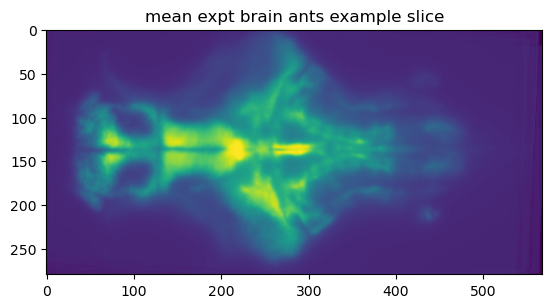

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (280, 568, 40)
	 Spacing    : (1.52, 1.52, 6.25)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

Loaded 110 warped region masks from: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/mapzebrain_to_mean_registration/01_regions_in_mean


CTRL:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_1603394/3660458842.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:62: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:63: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3660458842.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:62: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:62: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:64: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3660458842.py:108: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1603394/3660458842.py:63: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3660458842.py:108: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1603394/3660458842.py:63: RuntimeWarning: Degrees of freedom <=

✅ CTRL: processed 7/7 fish with valid data.


HCRT-TRPV1:   0%|          | 0/7 [00:00<?, ?it/s]

/tmp/ipykernel_1603394/3660458842.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:108: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1603394/3660458842.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:62: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:63: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3660458842.py:62: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:61: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:62: RuntimeWarning: Mean of empty slice
/tmp/ipykernel_1603394/3660458842.py:64: RuntimeWarning: Degrees of freedom <= 0 for slice.
/tmp/ipykernel_1603394/3660458842.py:108: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_1603394/3660458842.py:63: RuntimeWarning: Degrees of freedom <= 0 for slice.
/

✅ HCRT-TRPV1: processed 7/7 fish with valid data.

Top 20 regions by |Δ signed ΔR²| (HCRT-TRPV1 vs CTRL):
 1. retinal_arborization_field_3    CTRL=(-0.009702, +0.009)  HCRT-TRPV1=(-0.667372, +0.030)  |Δ signed ΔR²|=0.657671
 2. retinal_arborization_field_6    CTRL=(-0.159747, +0.033)  HCRT-TRPV1=(-0.762674, +0.008)  |Δ signed ΔR²|=0.602927
 3. retinal_arborization_field_4    CTRL=(-0.050963, +0.029)  HCRT-TRPV1=(-0.646725, +0.038)  |Δ signed ΔR²|=0.595763
 4. gabaergic_domain                CTRL=(-0.129278, -0.012)  HCRT-TRPV1=(-0.656591, +0.004)  |Δ signed ΔR²|=0.527313
 5. epiphysis                       CTRL=(-0.800781, +0.040)  HCRT-TRPV1=(-0.276931, +0.047)  |Δ signed ΔR²|=0.523850
 6. torus_semicircularis            CTRL=(-0.171703, -0.002)  HCRT-TRPV1=(-0.677851, -0.008)  |Δ signed ΔR²|=0.506148
 7. anterior_cholinergic_domain     CTRL=(-0.170649, +0.022)  HCRT-TRPV1=(-0.676597, +0.002)  |Δ signed ΔR²|=0.505949
 8. intermediate_hypothalamus_(entire)  CTRL=(-0.165288, -0.025)  HC

/tmp/ipykernel_1603394/3660458842.py:286: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("gist_ncar", n_colors)



✅ Saved: /resnick/groups/Proberlab/yun/lightsheet/registration/registration_output/hcrt-trpv1_huc-h2b-g8m_csn_120min/figures/Quadrant_top20_tonicShift_signed_dR2_vs_dprime_iaaft_nullp95.png


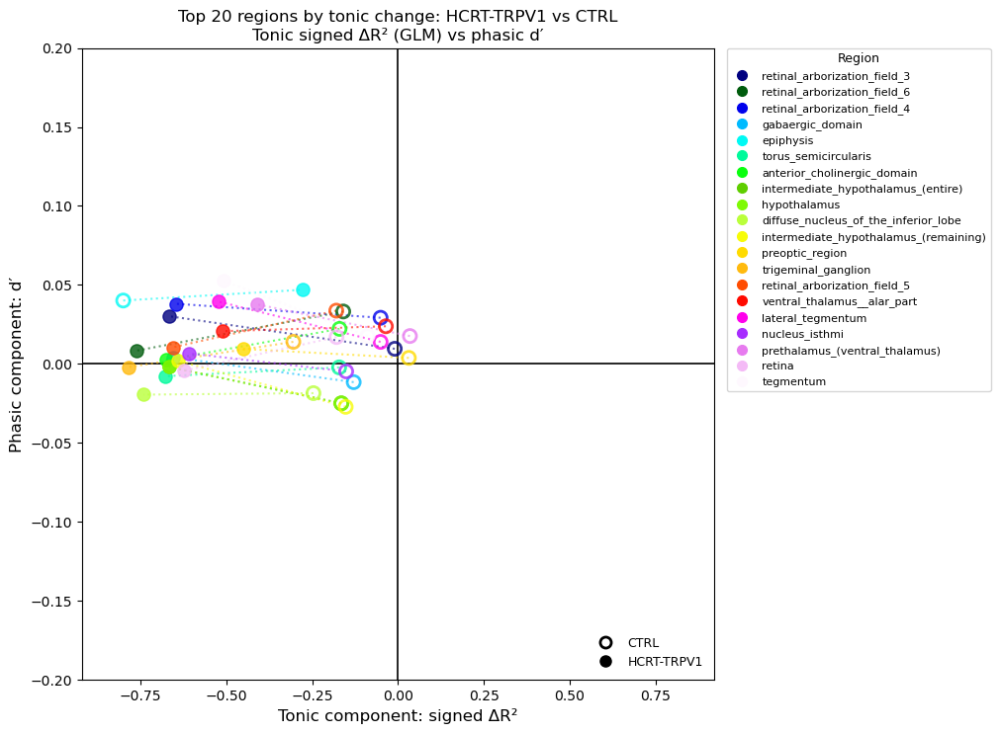

In [25]:
import os, glob, gc
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.lines import Line2D

# ============================================================
# Quadrant plot: top regions by TONIC change
#   selection = largest |Δ signed ΔR²| between CTRL and EXPT
#   x-axis = tonic slow component (signed ΔR² from GLM)
#   y-axis = phasic fast component (d′; signed)
# ============================================================

# =========================
# USER SETTINGS
# =========================
DIR_REG_ROOT = os.path.join(dir_ants_output, combine_proj_ID, "mapzebrain_to_mean_registration")
dir_regions_w = os.path.join(DIR_REG_ROOT, "01_regions_in_mean")

F_NAME_COORDS = "transformed_all_cells_meanbrain.npy"
F_NAME_PHASIC = "data_array_f_phasic.npy"
F_NAME_DR2 = "kernel_delta_r2_fit.npy"

FRAME_RATE_HZ = float(volume_per_sec)
BASELINE_MIN_PAIR_PHASIC = (baseline_start / 60 / volume_per_sec + 15, baseline_end / 60 / volume_per_sec)
DRUG_MIN_PAIR_PHASIC     = (drug_start / 60 / volume_per_sec + 15, drug_end / 60 / volume_per_sec + 15)

REGION_NAME_WHITELIST = None
param_folder_name = f"in{input_tag}_K{K_global}_drift{drift_global}_lam{lam_global}_lag{lag_global}"

TOP_N_SHIFT = 20

TITLE = f"Top {TOP_N_SHIFT} regions by tonic change: {EXPT_TAG} vs {CTRL_TAG}\nTonic signed ΔR² (GLM) vs phasic d′"
OUT_NAME = f"Quadrant_top{TOP_N_SHIFT}_tonicShift_signed_dR2_vs_dprime_{NULL_TAG}_nullp{RESPONDER_NULL_THRESH}.png"

MARKER_SIZE = 90

# =========================
# HELPERS
# =========================
def _min_to_idx(minutes, fs_hz):
    return int(np.round(minutes * 60.0 * fs_hz))

def _safe_load(path, mmap_mode=None):
    if not os.path.exists(path):
        return None
    return np.load(path, mmap_mode=mmap_mode)

def _finite_1d(x):
    x = np.asarray(x).reshape(-1)
    return x[np.isfinite(x)]

def dprime_per_cell(Fphasic, idx_base, idx_drug, var_floor=1e-4, eps_var=1e-8):
    A = np.asarray(Fphasic, dtype=np.float32)
    base = A[:, idx_base]
    drug = A[:, idx_drug]

    if base.shape[1] < 2 or drug.shape[1] < 2:
        return np.full((A.shape[0],), np.nan, dtype=np.float32)

    mu_b = np.nanmean(base, axis=1)
    mu_d = np.nanmean(drug, axis=1)
    var_b = np.nanvar(base, axis=1, ddof=1)
    var_d = np.nanvar(drug, axis=1, ddof=1)

    var_b = np.maximum(var_b, var_floor)
    var_d = np.maximum(var_d, var_floor)

    denom = np.sqrt((var_b + var_d) / 2.0 + eps_var).astype(np.float32)
    d = (mu_d - mu_b) / denom
    d[~np.isfinite(d)] = np.nan
    return d.astype(np.float32)

def load_warped_region_masks(dir_regions_w, mean_shape_xyz, whitelist=None):
    import ants

    fps = sorted(glob.glob(os.path.join(dir_regions_w, "*_in_mean_space.nii.gz")))
    if len(fps) == 0:
        raise FileNotFoundError(f"No warped region masks found in: {dir_regions_w}")

    out = []
    for fp in fps:
        name = os.path.basename(fp).replace("_in_mean_space.nii.gz", "")
        if whitelist is not None and name not in whitelist:
            continue

        img = ants.image_read(fp)
        arr = img.numpy()

        if arr.shape != mean_shape_xyz:
            raise ValueError(f"Region mask shape mismatch for {name}: {arr.shape} != mean {mean_shape_xyz}")

        m = arr > 0
        if np.any(m):
            out.append((name, m))

    if len(out) == 0:
        raise RuntimeError("After filtering, no non-empty region masks remain.")

    return out

def coords_to_int_vox(coords, mean_shape_xyz):
    c = np.asarray(coords)
    if c.ndim != 2 or c.shape[1] != 3:
        raise ValueError(f"coords must be (N,3), got {c.shape}")

    X, Y, Z = mean_shape_xyz
    ci = np.rint(c).astype(np.int32)
    ci[:, 0] = np.clip(ci[:, 0], 0, X - 1)
    ci[:, 1] = np.clip(ci[:, 1], 0, Y - 1)
    ci[:, 2] = np.clip(ci[:, 2], 0, Z - 1)
    return ci

def build_signed_dr2_array(dR2, pos_idx, neg_idx):
    dR2 = np.asarray(dR2).reshape(-1).astype(np.float32)
    signed = np.full(dR2.shape, np.nan, dtype=np.float32)

    pos_idx = np.asarray(pos_idx, dtype=np.int64).reshape(-1)
    neg_idx = np.asarray(neg_idx, dtype=np.int64).reshape(-1)

    pos_idx = pos_idx[(pos_idx >= 0) & (pos_idx < dR2.size)]
    neg_idx = neg_idx[(neg_idx >= 0) & (neg_idx < dR2.size)]

    signed[pos_idx] =  dR2[pos_idx]
    signed[neg_idx] = -dR2[neg_idx]
    return signed

def summarize_region(reg_to_vals):
    out = {}
    for rname, vals in reg_to_vals.items():
        v = _finite_1d(vals)
        out[rname] = dict(mean=float(np.nanmean(v)) if v.size else np.nan,
                          n=int(v.size))
    return out

# =========================
# PREP
# =========================
mean_img = library_registration.load_mean_expt_brain(combine_proj_ID)
mean_shape_xyz = tuple(map(int, mean_img.shape))

regions = load_warped_region_masks(
    dir_regions_w=dir_regions_w,
    mean_shape_xyz=mean_shape_xyz,
    whitelist=REGION_NAME_WHITELIST,
)
print(f"Loaded {len(regions)} warped region masks from: {dir_regions_w}")

base0 = _min_to_idx(BASELINE_MIN_PAIR_PHASIC[0], FRAME_RATE_HZ)
base1 = _min_to_idx(BASELINE_MIN_PAIR_PHASIC[1], FRAME_RATE_HZ)
drug0 = _min_to_idx(DRUG_MIN_PAIR_PHASIC[0], FRAME_RATE_HZ)
drug1 = _min_to_idx(DRUG_MIN_PAIR_PHASIC[1], FRAME_RATE_HZ)
idx_base = slice(base0, base1)
idx_drug = slice(drug0, drug1)

def process_one_fish_region_means(expt_ID):
    dir_expt = Path(dir_ants_output) / proj_ID / expt_ID
    run_dir = dir_expt / "glm" / param_folder_name

    coords = _safe_load(str(dir_expt / F_NAME_COORDS))
    Fp     = _safe_load(str(dir_expt / F_NAME_PHASIC), mmap_mode="r")
    dR2    = _safe_load(str(run_dir / F_NAME_DR2))

    pos_idx = _safe_load(str(dir_expt / f"tonic_pos_glm_{NULL_TAG}_nullp{RESPONDER_NULL_THRESH}_idxs.npy"))
    neg_idx = _safe_load(str(dir_expt / f"tonic_neg_glm_{NULL_TAG}_nullp{RESPONDER_NULL_THRESH}_idxs.npy"))

    if coords is None or Fp is None or dR2 is None or pos_idx is None or neg_idx is None:
        return expt_ID, None
    if Fp.ndim != 2 or dR2.ndim != 1:
        return expt_ID, None
    if coords.ndim != 2 or coords.shape[1] != 3:
        return expt_ID, None
    if Fp.shape[0] != coords.shape[0] or dR2.shape[0] != coords.shape[0]:
        return expt_ID, None

    n_cells, T = Fp.shape
    b0 = max(0, min(T, idx_base.start)); b1 = max(0, min(T, idx_base.stop))
    d0 = max(0, min(T, idx_drug.start)); d1 = max(0, min(T, idx_drug.stop))
    if (b1 - b0) < 2 or (d1 - d0) < 2:
        return expt_ID, None

    dprime = dprime_per_cell(Fp, slice(b0, b1), slice(d0, d1))
    signed_dR2 = build_signed_dr2_array(dR2, pos_idx, neg_idx)

    good = np.isfinite(dprime) & np.isfinite(signed_dR2)
    if not np.any(good):
        return expt_ID, None

    ci = coords_to_int_vox(coords, mean_shape_xyz)
    xi, yi, zi = ci[:, 0], ci[:, 1], ci[:, 2]

    out = {}
    for rname, rmask in regions:
        in_reg = rmask[xi, yi, zi]
        sel = good & in_reg
        if np.any(sel):
            out[rname] = dict(
                dr2_mean=float(np.nanmean(signed_dR2[sel])),
                dprime_mean=float(np.nanmean(dprime[sel])),
                n_cells=int(np.sum(sel)),
            )
        else:
            out[rname] = dict(dr2_mean=np.nan, dprime_mean=np.nan, n_cells=0)

    del coords, dprime, signed_dR2, Fp, dR2, pos_idx, neg_idx
    gc.collect()
    return expt_ID, out

def run_group(expt_list, group_name, n_jobs=10):
    from joblib import Parallel, delayed
    from tqdm.auto import tqdm

    results = Parallel(n_jobs=n_jobs, backend="loky")(
        delayed(process_one_fish_region_means)(expt_ID)
        for expt_ID in tqdm(expt_list, desc=group_name)
    )

    reg_to_dr2 = {rname: [] for rname, _ in regions}
    reg_to_dps = {rname: [] for rname, _ in regions}
    reg_to_n   = {rname: [] for rname, _ in regions}

    ok_fish = 0
    for expt_ID, per_reg in results:
        if per_reg is None:
            continue
        ok_fish += 1
        for rname in reg_to_dr2.keys():
            reg_to_dr2[rname].append(per_reg[rname]["dr2_mean"])
            reg_to_dps[rname].append(per_reg[rname]["dprime_mean"])
            reg_to_n[rname].append(per_reg[rname]["n_cells"])

    print(f"✅ {group_name}: processed {ok_fish}/{len(expt_list)} fish with valid data.")
    return reg_to_dr2, reg_to_dps, reg_to_n

N_JOBS = 25
ctrl_dr2, ctrl_dps, ctrl_n = run_group(ctrl_expt_ID_list, CTRL_TAG, n_jobs=N_JOBS)
hcrt_dr2, hcrt_dps, hcrt_n = run_group(hcrt_expt_ID_list, EXPT_TAG, n_jobs=N_JOBS)

ctrl_dr2_s = summarize_region(ctrl_dr2)
ctrl_dp_s  = summarize_region(ctrl_dps)
hcrt_dr2_s = summarize_region(hcrt_dr2)
hcrt_dp_s  = summarize_region(hcrt_dps)

# =========================
# SELECT TOP REGIONS BY |Δ signed ΔR²|
# =========================
shift_rows = []
for rname, _ in regions:
    x_ctrl = ctrl_dr2_s[rname]["mean"]
    y_ctrl = ctrl_dp_s[rname]["mean"]
    x_expt = hcrt_dr2_s[rname]["mean"]
    y_expt = hcrt_dp_s[rname]["mean"]

    if not (np.isfinite(x_ctrl) and np.isfinite(y_ctrl) and np.isfinite(x_expt) and np.isfinite(y_expt)):
        continue

    shift = abs(x_expt - x_ctrl)  # tonic-only selection
    shift_rows.append((rname, x_ctrl, y_ctrl, x_expt, y_expt, shift))

shift_rows.sort(key=lambda r: r[5], reverse=True)
top_rows = shift_rows[:TOP_N_SHIFT]

if len(top_rows) == 0:
    raise RuntimeError("No regions had finite CTRL and EXPT coordinates.")

print(f"\nTop {len(top_rows)} regions by |Δ signed ΔR²| ({EXPT_TAG} vs {CTRL_TAG}):")
for i, (rname, x_ctrl, y_ctrl, x_expt, y_expt, shift) in enumerate(top_rows, start=1):
    print(
        f"{i:2d}. {rname:30s}  "
        f"{CTRL_TAG}=({x_ctrl:+.6f}, {y_ctrl:+.3f})  "
        f"{EXPT_TAG}=({x_expt:+.6f}, {y_expt:+.3f})  "
        f"|Δ signed ΔR²|={shift:.6f}"
    )

# =========================
# PLOT
# =========================
fig, ax = plt.subplots(figsize=(10, 8), layout="constrained")
ax.axhline(0, color="black", lw=1.2)
ax.axvline(0, color="black", lw=1.2)
DOT_ALPHA = 0.8
LINE_ALPHA = 0.6
LINE_WIDTH = 1.5

n_colors = max(len(top_rows), 1)
cmap = plt.cm.get_cmap("gist_ncar", n_colors)

region_handles = []

for i, (rname, x_ctrl, y_ctrl, x_expt, y_expt, shift) in enumerate(top_rows):
    color = cmap(i)

    ax.plot(
        [x_ctrl, x_expt],
        [y_ctrl, y_expt],
        color=color,
        linewidth=LINE_WIDTH,
        alpha=LINE_ALPHA,
        linestyle=":",
        zorder=2
    )

    ax.scatter(
        x_ctrl, y_ctrl,
        s=MARKER_SIZE,
        facecolors="none",
        edgecolors=color,
        linewidths=2,
        alpha=DOT_ALPHA,
        zorder=3,
    )

    ax.scatter(
        x_expt, y_expt,
        s=MARKER_SIZE,
        color=color,
        edgecolors=color,
        alpha=DOT_ALPHA,
        zorder=4,
    )

    region_handles.append(
        Line2D([0], [0], marker='o', linestyle='None',
               markerfacecolor=color, markeredgecolor=color,
               markersize=7, label=rname)
    )

legend_handles = [
    Line2D([0], [0], marker='o', linestyle='None', markerfacecolor='none',
           markeredgecolor='black', markeredgewidth=2, markersize=8, label=CTRL_TAG),
    Line2D([0], [0], marker='o', linestyle='None', markerfacecolor='black',
           markeredgecolor='black', markersize=8, label=EXPT_TAG),
]

ax.set_xlabel("Tonic component: signed ΔR²", fontsize=12)
ax.set_ylabel("Phasic component: d′", fontsize=12)
ax.set_title(TITLE)

all_x = _finite_1d([r[1] for r in top_rows] + [r[3] for r in top_rows])
all_y = _finite_1d([r[2] for r in top_rows] + [r[4] for r in top_rows])

if all_x.size and all_y.size:
    xlim = max(0.001, float(np.nanpercentile(np.abs(all_x), 100)) * 1.15)
    ylim = max(0.2,   float(np.nanpercentile(np.abs(all_y), 100)) * 1.15)
    ax.set_xlim(-xlim, xlim)
    ax.set_ylim(-ylim, ylim)

ax.set_box_aspect(1)

marker_legend = ax.legend(
    handles=legend_handles,
    frameon=False,
    loc="lower right",
    fontsize=9,
)
ax.add_artist(marker_legend)

region_legend = ax.legend(
    handles=region_handles,
    title="Region",
    frameon=True,
    loc="upper left",
    bbox_to_anchor=(1.02, 1.0),
    borderaxespad=0.0,
    fontsize=8,
    title_fontsize=9,
)

fig_dir = Path(dir_ants_output) / proj_ID / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)
out_path = fig_dir / OUT_NAME
plt.savefig(out_path, dpi=300, bbox_inches="tight")
print(f"\n✅ Saved: {out_path}")

plt.show()